### Instalar e importar Bibliotecas

In [1]:
# =========================
# Bibliotecas Necessárias
# =========================

# Manipulação e análise de dados
import pandas as pd
import numpy as np

# Visualização de dados
import matplotlib.pyplot as plt
import seaborn as sns

# Outras utilidades
import os
from itertools import combinations

# ==============================
# Configurações Globais
# ==============================

# Mostrar todas as colunas ao exibir DataFrames
pd.set_option('display.max_columns', None)

# Limitar o número de linhas exibidas (ajustável conforme necessário)
pd.set_option('display.max_rows', 10)

# Estilo dos gráficos com Seaborn
sns.set(style="whitegrid")

# Tamanho padrão das figuras
plt.rcParams["figure.figsize"] = (12, 6)

# Mensagem de início
print("Bibliotecas carregadas e configurações aplicadas com sucesso.")


Bibliotecas carregadas e configurações aplicadas com sucesso.


In [2]:
# ==========================================
# Carregamento dos Arquivos CSV em DataFrames
# ==========================================

import os
import pandas as pd

# Caminho base dos arquivos CSV
caminho_base = "/home/diego/Documentos/Semestre 2024.2/Nova_Analise/dados/tabelas"

# Dicionário para armazenar os DataFrames
tabelas = {}

# Lista os arquivos no diretório e carrega os arquivos .csv
for nome_arquivo in os.listdir(caminho_base):
    if nome_arquivo.lower().endswith('.csv'):
        caminho_completo = os.path.join(caminho_base, nome_arquivo)
        
        try:
            # Leitura com tratamento de possíveis problemas de codificação ou separador
            df = pd.read_csv(caminho_completo, encoding='utf-8', sep=',')  # ajuste o encoding/sep se necessário
            nome_base = os.path.splitext(nome_arquivo)[0]  # remove extensão
            tabelas[nome_base] = df
            print(f"✔️ Arquivo carregado: {nome_base}")
        
        except pd.errors.ParserError:
            print(f"❌ Erro de parsing ao carregar {nome_arquivo} — verifique o separador ou a estrutura.")
        except UnicodeDecodeError:
            print(f"❌ Erro de codificação ao carregar {nome_arquivo} — tente outro encoding como 'latin1'.")
        except Exception as e:
            print(f"❌ Erro inesperado ao carregar {nome_arquivo}: {e}")

print(f"\nTotal de arquivos carregados: {len(tabelas)}")


✔️ Arquivo carregado: alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas
✔️ Arquivo carregado: alunos
✔️ Arquivo carregado: alunos-matriculados
✔️ Arquivo carregado: alunos-final
✔️ Arquivo carregado: alunos-filtrado-sem-metricas
✔️ Arquivo carregado: alunos-novos-filtrado-sem-metricas
❌ Erro de codificação ao carregar alunos-novos-sem-reingresso-filtrado-sem-metricas.csv — tente outro encoding como 'latin1'.

Total de arquivos carregados: 6


### Visualizar Tabelas e colunas

In [3]:
# ================================
# Visualizar Colunas de Cada Tabela
# ================================

print("\n🔍 Estrutura de colunas por tabela:\n")

for nome, df in tabelas.items():
    print(f"📄 Tabela: {nome}")
    print(f"🧩 Colunas ({len(df.columns)}): {list(df.columns)}\n")



🔍 Estrutura de colunas por tabela:

📄 Tabela: alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas
🧩 Colunas (15): ['10057783454', '116210660', '2016.2', 'SISU', '2017', 'Casado', 'FEMININO', '1992-07-23 00:00:00.0', 'Branca', '2009', 'Somente escola pública', 'L1', 'ATIVO', 'REGULAR', '-']

📄 Tabela: alunos
🧩 Colunas (59): ['matricula_do_estudante', 'nome', 'codigo_do_curso', 'nome_do_curso', 'turno_do_curso', 'codigo_do_curriculo', 'campus', 'nome_do_campus', 'codigo_do_setor', 'nome_do_setor', 'estado_civil', 'endereco', 'sexo', 'data_de_nascimento', 'cpf', 'cep', 'telefone', 'situacao', 'motivo_de_evasao', 'periodo_de_evasao', 'forma_de_ingresso', 'periodo_de_ingresso', 'email', 'nacionalidade', 'local_de_nascimento', 'naturalidade', 'cor', 'deficiencias', 'ano_de_conclusao_ensino_medio', 'tipo_de_ensino_medio', 'politica_afirmativa', 'cra', 'mc', 'iech', 'iepl', 'iea', 'mcn', 'iean', 'creditos_do_cra', 'notas_acumuladas', 'periodos_completados', 'creditos_tentados', 'credit

### Padronizar alunos-final

In [4]:
# Padronização básica de colunas
tabelas['alunos-final'] = tabelas['alunos-final'].rename(columns={
    'CPF': 'cpf',
    'Matrícula': 'matricula_do_estudante',
    'Período de Ingresso': 'periodo_de_ingresso',
    'Forma de Ingresso': 'forma_de_ingresso',
    'Currículo': 'codigo_do_curriculo',
    'Estado Civil': 'estado_civil',
    'Sexo': 'sexo',
    'Idade Aproximada no Ingresso': 'idade_no_ingresso',
    'Cor': 'cor',
    'Cota': 'politica_afirmativa',
    'Status': 'situacao',
    'Tipo de Evasão': 'motivo_de_evasao',
    'Período de Evasão': 'periodo_de_evasao'
})


### Tratar tabelas com colunas genéricas ou numéricas

In [5]:
# Definindo colunas esperadas para uma dessas tabelas
colunas_corrigidas = [
    'cpf', 'matricula_do_estudante', 'periodo_de_ingresso', 'forma_de_ingresso',
    'codigo_do_curriculo', 'estado_civil', 'sexo', 'data_de_nascimento', 'cor',
    'ano_de_conclusao_ensino_medio', 'tipo_de_ensino_medio', 'politica_afirmativa',
    'situacao', 'motivo_de_evasao', 'periodo_de_evasao'
]

# Aplicar renomeação para as tabelas "problemáticas"
for nome in tabelas:
    if 'alunos-novos' in nome:
        df = tabelas[nome]
        if df.shape[1] == len(colunas_corrigidas):
            df.columns = colunas_corrigidas
            tabelas[nome] = df
        else:
            print(f"Tabela {nome} não tem o número esperado de colunas ({len(colunas_corrigidas)}).")


In [6]:

for nome, df in tabelas.items():
    print(f"📄 Tabela: {nome}")
    print(f"🧩 Colunas ({len(df.columns)}): {list(df.columns)}\n")


📄 Tabela: alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas
🧩 Colunas (15): ['cpf', 'matricula_do_estudante', 'periodo_de_ingresso', 'forma_de_ingresso', 'codigo_do_curriculo', 'estado_civil', 'sexo', 'data_de_nascimento', 'cor', 'ano_de_conclusao_ensino_medio', 'tipo_de_ensino_medio', 'politica_afirmativa', 'situacao', 'motivo_de_evasao', 'periodo_de_evasao']

📄 Tabela: alunos
🧩 Colunas (59): ['matricula_do_estudante', 'nome', 'codigo_do_curso', 'nome_do_curso', 'turno_do_curso', 'codigo_do_curriculo', 'campus', 'nome_do_campus', 'codigo_do_setor', 'nome_do_setor', 'estado_civil', 'endereco', 'sexo', 'data_de_nascimento', 'cpf', 'cep', 'telefone', 'situacao', 'motivo_de_evasao', 'periodo_de_evasao', 'forma_de_ingresso', 'periodo_de_ingresso', 'email', 'nacionalidade', 'local_de_nascimento', 'naturalidade', 'cor', 'deficiencias', 'ano_de_conclusao_ensino_medio', 'tipo_de_ensino_medio', 'politica_afirmativa', 'cra', 'mc', 'iech', 'iepl', 'iea', 'mcn', 'iean', 'creditos_do_cra',

### Alinhar as 3 primeiras colunas: cpf, matricula_do_estudante, nome

In [7]:
for nome, df in tabelas.items():
    colunas = df.columns.tolist()
    
    # Verifica se existem as colunas
    nova_ordem = []
    if 'cpf' in colunas:
        nova_ordem.append('cpf')
    if 'matricula_do_estudante' in colunas:
        nova_ordem.append('matricula_do_estudante')
    if 'nome' in colunas:
        nova_ordem.append('nome')
    
    # Adiciona o restante das colunas, excluindo as que já estão
    restantes = [col for col in colunas if col not in nova_ordem]
    
    # Reorganiza as colunas
    tabelas[nome] = df[nova_ordem + restantes]


In [8]:
for nome, df in tabelas.items():
    print(f"\n📄 Tabela: {nome}")
    display(df.head())



📄 Tabela: alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas


,cpf,matricula_do_estudante,periodo_de_ingresso,forma_de_ingresso,codigo_do_curriculo,estado_civil,sexo,data_de_nascimento,cor,ano_de_conclusao_ensino_medio,tipo_de_ensino_medio,politica_afirmativa,situacao,motivo_de_evasao,periodo_de_evasao
0,70417737440,117110237,2017.1,SISU,2017,Solteiro,FEMININO,1998-07-19 00:00:00.0,Parda,2015.0,Somente escola pública,L2,ATIVO,REGULAR,-
1,12305579462,117210287,2017.2,SISU,2017,Solteiro,MASCULINO,1998-10-24 00:00:00.0,Parda,2016.0,Somente escola pública,L6,ATIVO,REGULAR,-
2,7296494409,118110050,2018.1,SISU,2017,Solteiro,MASCULINO,1999-09-15 00:00:00.0,Branca,2017.0,Somente escola privada,-,ATIVO,REGULAR,-
3,10180403400,118110854,2018.1,SISU,2017,Solteiro,MASCULINO,1992-10-11 00:00:00.0,Parda,2009.0,Somente escola privada,-,ATIVO,REGULAR,-
4,7541169480,118210232,2018.2,SISU,2023,Solteiro,MASCULINO,1987-12-04 00:00:00.0,Parda,2007.0,Somente escola pública,L2,ATIVO,REGULAR,-



📄 Tabela: alunos


,cpf,matricula_do_estudante,nome,codigo_do_curso,nome_do_curso,turno_do_curso,codigo_do_curriculo,campus,nome_do_campus,codigo_do_setor,nome_do_setor,estado_civil,endereco,sexo,data_de_nascimento,cep,telefone,situacao,motivo_de_evasao,periodo_de_evasao,forma_de_ingresso,periodo_de_ingresso,email,nacionalidade,local_de_nascimento,naturalidade,cor,deficiencias,ano_de_conclusao_ensino_medio,tipo_de_ensino_medio,politica_afirmativa,cra,mc,iech,iepl,iea,mcn,iean,creditos_do_cra,notas_acumuladas,periodos_completados,creditos_tentados,creditos_completados,creditos_isentos,creditos_falhados,creditos_suspensos,creditos_em_andamento,velocidade_media,taxa_de_sucesso,prac_atualizado,prac_atualizado_em,prac_cor,prac_quilombola,prac_indigena_aldeado,prac_renda_per_capita_ate,prac_deficiente,prac_deficiencias,prac_deslocou_mudou,ufpb
0,8.410676e+09,116210554,AISLAN JEFFERSON DE SOUZA BRITO,14102100,CIÊNCIA DA COMPUTAÇÃO - D,Integral,2017,1,Campina Grande,14000000,CEEI - CENTRO DE ENGENHARIA ELÉTRICA E INFORMÁ...,Solteiro,RUA ARISTIDES LOBO 194,MASCULINO,1991-08-03 00:00:00.0,58400384.0,83996548001,ATIVO,REGULAR,-,SISU,2016.2,aislanjsb@gmail.com,Brasileira,CAMPINA GRANDE,PB,Parda,NaN,2009.0,Somente escola privada,-,11.00,8.25,0.67,0.27,1.51,495.92,91.01,286,1825.6,17,166,262,150,46,8,4,15.41,0.71,Sim,2023-04-12 15:48:00.0,PARDA,Não,Não,1.0,Não,NaN,Não,NaN
1,1.005778e+10,116210660,ANGELA CRISTINA DE ARAUJO SOUSA,14102100,CIÊNCIA DA COMPUTAÇÃO - D,Integral,2017,1,Campina Grande,14000000,CEEI - CENTRO DE ENGENHARIA ELÉTRICA E INFORMÁ...,Casado,SITIO DERBY 00,FEMININO,1992-07-23 00:00:00.0,55730000.0,81997187920,ATIVO,REGULAR,-,SISU,2016.2,angela.sousa@ccc.ufcg.edu.br,Brasileira,BOM JARDIM,PE,Branca,NaN,2009.0,Somente escola pública,L1,5.31,7.90,0.63,0.42,2.10,436.46,116.07,264,1549.6,18,292,188,4,76,32,0,10.44,0.71,Sim,2023-09-11 13:01:50.0,BRANCA,Não,Não,1.5,Não,NaN,Sim,NaN
2,7.041774e+10,117110237,CLECIANA MARIA DE SANTANA,14102100,CIÊNCIA DA COMPUTAÇÃO - D,Integral,2017,1,Campina Grande,14000000,CEEI - CENTRO DE ENGENHARIA ELÉTRICA E INFORMÁ...,Solteiro,RUA SÃO JUDAS TADEU 86,FEMININO,1998-07-19 00:00:00.0,55190048.0,81995738036,ATIVO,REGULAR,-,SISU,2017.1,cleciana.santana@ccc.ufcg.edu.br,Brasileira,OLINDA,PE,Parda,NaN,2015.0,Somente escola pública,L2,5.77,7.44,0.65,0.42,2.04,359.50,98.60,242,1373.2,15,238,166,12,76,8,0,11.07,0.67,Sim,2024-11-21 10:15:46.0,PARDA,Não,Não,0.5,Não,NaN,Sim,NaN
3,1.230558e+10,117210287,ABEL ANTUNES DE LIMA NETO,14102100,CIÊNCIA DA COMPUTAÇÃO - D,Integral,2017,1,Campina Grande,14000000,CEEI - CENTRO DE ENGENHARIA ELÉTRICA E INFORMÁ...,Solteiro,NaN,MASCULINO,1998-10-24 00:00:00.0,58155000.0,83996943375,ATIVO,REGULAR,-,SISU,2017.2,abel.neto@ccc.ufcg.edu.br,Brasileira,SOLEDADE,PB,Parda,NaN,2016.0,Somente escola pública,L6,6.57,7.86,0.77,0.56,3.39,431.04,185.97,220,1497.6,13,228,184,8,36,16,0,14.15,0.83,Sim,2023-02-07 18:47:37.0,PARDA,Não,Não,1.5,Não,NaN,Sim,NaN
4,7.296494e+09,118110050,CAIO CESAR NOBREGA BORGES,14102100,CIÊNCIA DA COMPUTAÇÃO - D,Integral,2017,1,Campina Grande,14000000,CEEI - CENTRO DE ENGENHARIA ELÉTRICA E INFORMÁ...,Solteiro,UMBUZEIRO 1237,MASCULINO,1999-09-15 00:00:00.0,58038182.0,8332468693,ATIVO,REGULAR,-,SISU,2018.1,caiocnborges@hotmail.com,Brasileira,SÃO PAULO,SP,Branca,NaN,2017.0,Somente escola privada,-,4.92,7.43,0.64,0.51,2.40,357.98,115.82,276,1416.4,15,288,184,0,92,12,0,12.27,0.67,Sim,2023-09-11 11:06:02.0,BRANCA,Não,Não,10.0,Não,NaN,Sim,NaN



📄 Tabela: alunos-matriculados


,cpf,matricula_do_estudante,nome,codigo_do_curso,nome_do_curso,turno_do_curso,codigo_do_curriculo,campus,nome_do_campus,codigo_do_setor,nome_do_setor,estado_civil,endereco,sexo,data_de_nascimento,cep,telefone,situacao,motivo_de_evasao,periodo_de_evasao,forma_de_ingresso,periodo_de_ingresso,email,nacionalidade,local_de_nascimento,naturalidade,cor,deficiencias,ano_de_conclusao_ensino_medio,tipo_de_ensino_medio,politica_afirmativa,cra,mc,iech,iepl,iea,mcn,iean,creditos_do_cra,notas_acumuladas,periodos_completados,creditos_tentados,creditos_completados,creditos_isentos,creditos_falhados,creditos_suspensos,creditos_em_andamento,velocidade_media,taxa_de_sucesso,prac_atualizado,prac_atualizado_em,prac_cor,prac_quilombola,prac_indigena_aldeado,prac_renda_per_capita_ate,prac_deficiente,prac_deficiencias,prac_deslocou_mudou,ufpb
0,8.410676e+09,116210554,AISLAN JEFFERSON DE SOUZA BRITO,14102100,CIÊNCIA DA COMPUTAÇÃO - D,Integral,2017,1,Campina Grande,14000000,CEEI - CENTRO DE ENGENHARIA ELÉTRICA E INFORMÁ...,Solteiro,RUA ARISTIDES LOBO 194,MASCULINO,1991-08-03 00:00:00.0,58400384.0,83996548001,ATIVO,REGULAR,-,SISU,2016.2,aislanjsb@gmail.com,Brasileira,CAMPINA GRANDE,PB,Parda,NaN,2009.0,Somente escola privada,-,11.00,8.25,0.67,0.27,1.51,495.92,91.01,286,1825.6,17,166,262,150,46,8,4,15.41,0.71,Sim,2023-04-12 15:48:00.0,PARDA,Não,Não,1.0,Não,NaN,Não,NaN
1,1.005778e+10,116210660,ANGELA CRISTINA DE ARAUJO SOUSA,14102100,CIÊNCIA DA COMPUTAÇÃO - D,Integral,2017,1,Campina Grande,14000000,CEEI - CENTRO DE ENGENHARIA ELÉTRICA E INFORMÁ...,Casado,SITIO DERBY 00,FEMININO,1992-07-23 00:00:00.0,55730000.0,81997187920,ATIVO,REGULAR,-,SISU,2016.2,angela.sousa@ccc.ufcg.edu.br,Brasileira,BOM JARDIM,PE,Branca,NaN,2009.0,Somente escola pública,L1,5.31,7.90,0.63,0.42,2.10,436.46,116.07,264,1549.6,18,292,188,4,76,32,0,10.44,0.71,Sim,2023-09-11 13:01:50.0,BRANCA,Não,Não,1.5,Não,NaN,Sim,NaN
2,7.041774e+10,117110237,CLECIANA MARIA DE SANTANA,14102100,CIÊNCIA DA COMPUTAÇÃO - D,Integral,2017,1,Campina Grande,14000000,CEEI - CENTRO DE ENGENHARIA ELÉTRICA E INFORMÁ...,Solteiro,RUA SÃO JUDAS TADEU 86,FEMININO,1998-07-19 00:00:00.0,55190048.0,81995738036,ATIVO,REGULAR,-,SISU,2017.1,cleciana.santana@ccc.ufcg.edu.br,Brasileira,OLINDA,PE,Parda,NaN,2015.0,Somente escola pública,L2,5.77,7.44,0.65,0.42,2.04,359.50,98.60,242,1373.2,15,238,166,12,76,8,0,11.07,0.67,Sim,2024-11-21 10:15:46.0,PARDA,Não,Não,0.5,Não,NaN,Sim,NaN
3,1.230558e+10,117210287,ABEL ANTUNES DE LIMA NETO,14102100,CIÊNCIA DA COMPUTAÇÃO - D,Integral,2017,1,Campina Grande,14000000,CEEI - CENTRO DE ENGENHARIA ELÉTRICA E INFORMÁ...,Solteiro,NaN,MASCULINO,1998-10-24 00:00:00.0,58155000.0,83996943375,ATIVO,REGULAR,-,SISU,2017.2,abel.neto@ccc.ufcg.edu.br,Brasileira,SOLEDADE,PB,Parda,NaN,2016.0,Somente escola pública,L6,6.57,7.86,0.77,0.56,3.39,431.04,185.97,220,1497.6,13,228,184,8,36,16,0,14.15,0.83,Sim,2023-02-07 18:47:37.0,PARDA,Não,Não,1.5,Não,NaN,Sim,NaN
4,7.296494e+09,118110050,CAIO CESAR NOBREGA BORGES,14102100,CIÊNCIA DA COMPUTAÇÃO - D,Integral,2017,1,Campina Grande,14000000,CEEI - CENTRO DE ENGENHARIA ELÉTRICA E INFORMÁ...,Solteiro,UMBUZEIRO 1237,MASCULINO,1999-09-15 00:00:00.0,58038182.0,8332468693,ATIVO,REGULAR,-,SISU,2018.1,caiocnborges@hotmail.com,Brasileira,SÃO PAULO,SP,Branca,NaN,2017.0,Somente escola privada,-,4.92,7.43,0.64,0.51,2.40,357.98,115.82,276,1416.4,15,288,184,0,92,12,0,12.27,0.67,Sim,2023-09-11 11:06:02.0,BRANCA,Não,Não,10.0,Não,NaN,Sim,NaN



📄 Tabela: alunos-final


,cpf,matricula_do_estudante,periodo_de_ingresso,forma_de_ingresso,codigo_do_curriculo,estado_civil,sexo,idade_no_ingresso,cor,politica_afirmativa,situacao,motivo_de_evasao,periodo_de_evasao
0,555406350,111210656,2011.2,VESTIBULAR ENEM,1999,Solteiro,MASCULINO,19,Branca,-,INATIVO,CANCELAMENTO POR ABANDONO,2014.2
1,583978339,111110092,2011.1,VESTIBULAR ENEM,1999,Solteiro,FEMININO,19,Branca,-,INATIVO,GRADUADO,2016.1
2,598360328,113210862,2013.2,VESTIBULAR ENEM,1999,Solteiro,FEMININO,19,Parda,-,INATIVO,CANCELAMENTO P SOLICITACAO ALUNO,2014.2
3,702842109,112110947,2012.1,VESTIBULAR ENEM,1999,Solteiro,MASCULINO,18,Parda,-,INATIVO,GRADUADO,2016.2
4,702859184,117210407,2017.2,SISU,2017,Solteiro,MASCULINO,18,Branca,-,INATIVO,CANCELADO 3 REPROV MESMA DISCIPLINA,2020.1



📄 Tabela: alunos-filtrado-sem-metricas


,cpf,matricula_do_estudante,periodo_de_ingresso,forma_de_ingresso,codigo_do_curriculo,estado_civil,sexo,data_de_nascimento,cor,ano_de_conclusao_ensino_medio,tipo_de_ensino_medio,politica_afirmativa,situacao,motivo_de_evasao,periodo_de_evasao
0,8.410676e+09,116210554,2016.2,SISU,2017,Solteiro,MASCULINO,1991-08-03 00:00:00.0,Parda,2009.0,Somente escola privada,-,ATIVO,REGULAR,-
1,1.005778e+10,116210660,2016.2,SISU,2017,Casado,FEMININO,1992-07-23 00:00:00.0,Branca,2009.0,Somente escola pública,L1,ATIVO,REGULAR,-
2,7.041774e+10,117110237,2017.1,SISU,2017,Solteiro,FEMININO,1998-07-19 00:00:00.0,Parda,2015.0,Somente escola pública,L2,ATIVO,REGULAR,-
3,1.230558e+10,117210287,2017.2,SISU,2017,Solteiro,MASCULINO,1998-10-24 00:00:00.0,Parda,2016.0,Somente escola pública,L6,ATIVO,REGULAR,-
4,7.296494e+09,118110050,2018.1,SISU,2017,Solteiro,MASCULINO,1999-09-15 00:00:00.0,Branca,2017.0,Somente escola privada,-,ATIVO,REGULAR,-



📄 Tabela: alunos-novos-filtrado-sem-metricas


,cpf,matricula_do_estudante,periodo_de_ingresso,forma_de_ingresso,codigo_do_curriculo,estado_civil,sexo,data_de_nascimento,cor,ano_de_conclusao_ensino_medio,tipo_de_ensino_medio,politica_afirmativa,situacao,motivo_de_evasao,periodo_de_evasao
0,10057783454,116210660,2016.2,SISU,2017,Casado,FEMININO,1992-07-23 00:00:00.0,Branca,2009.0,Somente escola pública,L1,ATIVO,REGULAR,-
1,70417737440,117110237,2017.1,SISU,2017,Solteiro,FEMININO,1998-07-19 00:00:00.0,Parda,2015.0,Somente escola pública,L2,ATIVO,REGULAR,-
2,12305579462,117210287,2017.2,SISU,2017,Solteiro,MASCULINO,1998-10-24 00:00:00.0,Parda,2016.0,Somente escola pública,L6,ATIVO,REGULAR,-
3,7296494409,118110050,2018.1,SISU,2017,Solteiro,MASCULINO,1999-09-15 00:00:00.0,Branca,2017.0,Somente escola privada,-,ATIVO,REGULAR,-
4,10180403400,118110854,2018.1,SISU,2017,Solteiro,MASCULINO,1992-10-11 00:00:00.0,Parda,2009.0,Somente escola privada,-,ATIVO,REGULAR,-


### Visualizar tabelas com variaveis relevantes

In [9]:
import pandas as pd
from datetime import datetime

# Função para calcular idade aproximada
def calcular_idade(data_nascimento):
    if pd.isna(data_nascimento):
        return None
    try:
        nascimento = pd.to_datetime(data_nascimento, errors='coerce')
        hoje = pd.Timestamp.today()
        idade = hoje.year - nascimento.year - ((hoje.month, hoje.day) < (nascimento.month, nascimento.day))
        return idade
    except Exception:
        return None

# Variáveis de interesse
variaveis_socioeconomicas = ['prac_renda_per_capita_ate', 'prac_deficiente', 'prac_quilombola']
variaveis_demograficas = ['sexo', 'cota','estado_civil', 'cor', 'data_de_nascimento']  # idade será derivada 
variaveis_interesse = variaveis_socioeconomicas + variaveis_demograficas

# Analisar tabelas
for nome, df in tabelas.items():
    print(f"\n📊 Tabela: {nome}")
    colunas_disponiveis = df.columns.tolist()
    
    # Verifica e exibe as variáveis disponíveis na tabela
    for var in variaveis_interesse:
        if var in colunas_disponiveis:
            print(f"\n🔹 {var} (value_counts):")
            print(df[var].value_counts(dropna=False))
    
    # Calcula idade se possível
    if 'data_de_nascimento' in colunas_disponiveis:
        df['idade'] = df['data_de_nascimento'].apply(calcular_idade)
        print("\n🔹 idade (derivada de data_de_nascimento):")
        print(df['idade'].dropna().astype(int).value_counts().sort_index())



📊 Tabela: alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas

🔹 sexo (value_counts):
sexo
MASCULINO    1881
FEMININO      399
Name: count, dtype: int64

🔹 estado_civil (value_counts):
estado_civil
Solteiro      2212
Casado          58
-                7
Divorciado       3
Name: count, dtype: int64

🔹 cor (value_counts):
cor
Branca           1157
Parda             932
Preta             108
Amarela            51
Não declarada      28
Indígena            4
Name: count, dtype: int64

🔹 data_de_nascimento (value_counts):
data_de_nascimento
2001-04-13 00:00:00.0    4
1996-08-14 00:00:00.0    4
1996-11-01 00:00:00.0    4
1997-11-13 00:00:00.0    4
1995-03-15 00:00:00.0    4
                        ..
1999-04-11 00:00:00.0    1
1999-01-08 00:00:00.0    1
1997-09-11 00:00:00.0    1
1998-11-07 00:00:00.0    1
2002-03-18 00:00:00.0    1
Name: count, Length: 1893, dtype: int64

🔹 idade (derivada de data_de_nascimento):
idade
18      1
19     35
20    118
21    136
22    147
     ... 
54  

### Filtragem e Limpeza

In [10]:
import pandas as pd
import numpy as np

# Função para validar e filtrar pelo período de ingresso
def filtrar_periodo(df):
    if 'periodo_de_ingresso' in df.columns:
        df['periodo_de_ingresso'] = pd.to_numeric(df['periodo_de_ingresso'], errors='coerce')
        df = df[df['periodo_de_ingresso'].between(2011.1, 2023.2)]
    return df

# Função de limpeza
def limpar_dados(df):
    df.replace({'-': np.nan, 'Não declarada': np.nan}, inplace=True)
    if 'data_de_nascimento' in df.columns:
        df['data_de_nascimento'] = pd.to_datetime(df['data_de_nascimento'], errors='coerce')
        df.loc[df['data_de_nascimento'] == '1900-01-01', 'data_de_nascimento'] = pd.NaT
        hoje = pd.Timestamp.today()
        df['idade'] = df['data_de_nascimento'].apply(lambda x: hoje.year - x.year if pd.notnull(x) else np.nan)
    for col in ['sexo', 'estado_civil', 'cor']:
        if col in df.columns:
            df[col] = df[col].astype(str).str.strip().str.capitalize()
    return df

# Aplicação do tratamento para as tabelas relevantes
tabelas_relevantes = ['alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas', 
                      'alunos', 'alunos-matriculados', 
                      'alunos-final', 'alunos-filtrado-sem-metricas']

tabelas_tratadas = {}

for nome, df in tabelas.items():
    if nome in tabelas_relevantes:
        df_filtrado = filtrar_periodo(df)
        df_limpo = limpar_dados(df_filtrado)
        tabelas_tratadas[nome] = df_limpo


/tmp/ipykernel_1516507/3393793095.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.replace({'-': np.nan, 'Não declarada': np.nan}, inplace=True)
/tmp/ipykernel_1516507/3393793095.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['data_de_nascimento'] = pd.to_datetime(df['data_de_nascimento'], errors='coerce')
/tmp/ipykernel_1516507/3393793095.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.py

In [11]:
for nome, df in tabelas_tratadas.items():
    print(f"\n📄 Tabela: {nome}")
    display(df.head())


📄 Tabela: alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas


,cpf,matricula_do_estudante,periodo_de_ingresso,forma_de_ingresso,codigo_do_curriculo,estado_civil,sexo,data_de_nascimento,cor,ano_de_conclusao_ensino_medio,tipo_de_ensino_medio,politica_afirmativa,situacao,motivo_de_evasao,periodo_de_evasao,idade
0,70417737440,117110237,2017.1,SISU,2017,Solteiro,Feminino,1998-07-19,Parda,2015.0,Somente escola pública,L2,ATIVO,REGULAR,NaN,27
1,12305579462,117210287,2017.2,SISU,2017,Solteiro,Masculino,1998-10-24,Parda,2016.0,Somente escola pública,L6,ATIVO,REGULAR,NaN,27
2,7296494409,118110050,2018.1,SISU,2017,Solteiro,Masculino,1999-09-15,Branca,2017.0,Somente escola privada,NaN,ATIVO,REGULAR,NaN,26
3,10180403400,118110854,2018.1,SISU,2017,Solteiro,Masculino,1992-10-11,Parda,2009.0,Somente escola privada,NaN,ATIVO,REGULAR,NaN,33
4,7541169480,118210232,2018.2,SISU,2023,Solteiro,Masculino,1987-12-04,Parda,2007.0,Somente escola pública,L2,ATIVO,REGULAR,NaN,38



📄 Tabela: alunos


,cpf,matricula_do_estudante,nome,codigo_do_curso,nome_do_curso,turno_do_curso,codigo_do_curriculo,campus,nome_do_campus,codigo_do_setor,nome_do_setor,estado_civil,endereco,sexo,data_de_nascimento,cep,telefone,situacao,motivo_de_evasao,periodo_de_evasao,forma_de_ingresso,periodo_de_ingresso,email,nacionalidade,local_de_nascimento,naturalidade,cor,deficiencias,ano_de_conclusao_ensino_medio,tipo_de_ensino_medio,politica_afirmativa,cra,mc,iech,iepl,iea,mcn,iean,creditos_do_cra,notas_acumuladas,periodos_completados,creditos_tentados,creditos_completados,creditos_isentos,creditos_falhados,creditos_suspensos,creditos_em_andamento,velocidade_media,taxa_de_sucesso,prac_atualizado,prac_atualizado_em,prac_cor,prac_quilombola,prac_indigena_aldeado,prac_renda_per_capita_ate,prac_deficiente,prac_deficiencias,prac_deslocou_mudou,ufpb,idade
0,8.410676e+09,116210554,AISLAN JEFFERSON DE SOUZA BRITO,14102100,CIÊNCIA DA COMPUTAÇÃO - D,Integral,2017,1,Campina Grande,14000000,CEEI - CENTRO DE ENGENHARIA ELÉTRICA E INFORMÁ...,Solteiro,RUA ARISTIDES LOBO 194,Masculino,1991-08-03,58400384.0,83996548001,ATIVO,REGULAR,NaN,SISU,2016.2,aislanjsb@gmail.com,Brasileira,CAMPINA GRANDE,PB,Parda,NaN,2009.0,Somente escola privada,NaN,11.00,8.25,0.67,0.27,1.51,495.92,91.01,286,1825.6,17,166,262,150,46,8,4,15.41,0.71,Sim,2023-04-12 15:48:00.0,PARDA,Não,Não,1.0,Não,NaN,Não,NaN,34
1,1.005778e+10,116210660,ANGELA CRISTINA DE ARAUJO SOUSA,14102100,CIÊNCIA DA COMPUTAÇÃO - D,Integral,2017,1,Campina Grande,14000000,CEEI - CENTRO DE ENGENHARIA ELÉTRICA E INFORMÁ...,Casado,SITIO DERBY 00,Feminino,1992-07-23,55730000.0,81997187920,ATIVO,REGULAR,NaN,SISU,2016.2,angela.sousa@ccc.ufcg.edu.br,Brasileira,BOM JARDIM,PE,Branca,NaN,2009.0,Somente escola pública,L1,5.31,7.90,0.63,0.42,2.10,436.46,116.07,264,1549.6,18,292,188,4,76,32,0,10.44,0.71,Sim,2023-09-11 13:01:50.0,BRANCA,Não,Não,1.5,Não,NaN,Sim,NaN,33
2,7.041774e+10,117110237,CLECIANA MARIA DE SANTANA,14102100,CIÊNCIA DA COMPUTAÇÃO - D,Integral,2017,1,Campina Grande,14000000,CEEI - CENTRO DE ENGENHARIA ELÉTRICA E INFORMÁ...,Solteiro,RUA SÃO JUDAS TADEU 86,Feminino,1998-07-19,55190048.0,81995738036,ATIVO,REGULAR,NaN,SISU,2017.1,cleciana.santana@ccc.ufcg.edu.br,Brasileira,OLINDA,PE,Parda,NaN,2015.0,Somente escola pública,L2,5.77,7.44,0.65,0.42,2.04,359.50,98.60,242,1373.2,15,238,166,12,76,8,0,11.07,0.67,Sim,2024-11-21 10:15:46.0,PARDA,Não,Não,0.5,Não,NaN,Sim,NaN,27
3,1.230558e+10,117210287,ABEL ANTUNES DE LIMA NETO,14102100,CIÊNCIA DA COMPUTAÇÃO - D,Integral,2017,1,Campina Grande,14000000,CEEI - CENTRO DE ENGENHARIA ELÉTRICA E INFORMÁ...,Solteiro,NaN,Masculino,1998-10-24,58155000.0,83996943375,ATIVO,REGULAR,NaN,SISU,2017.2,abel.neto@ccc.ufcg.edu.br,Brasileira,SOLEDADE,PB,Parda,NaN,2016.0,Somente escola pública,L6,6.57,7.86,0.77,0.56,3.39,431.04,185.97,220,1497.6,13,228,184,8,36,16,0,14.15,0.83,Sim,2023-02-07 18:47:37.0,PARDA,Não,Não,1.5,Não,NaN,Sim,NaN,27
4,7.296494e+09,118110050,CAIO CESAR NOBREGA BORGES,14102100,CIÊNCIA DA COMPUTAÇÃO - D,Integral,2017,1,Campina Grande,14000000,CEEI - CENTRO DE ENGENHARIA ELÉTRICA E INFORMÁ...,Solteiro,UMBUZEIRO 1237,Masculino,1999-09-15,58038182.0,8332468693,ATIVO,REGULAR,NaN,SISU,2018.1,caiocnborges@hotmail.com,Brasileira,SÃO PAULO,SP,Branca,NaN,2017.0,Somente escola privada,NaN,4.92,7.43,0.64,0.51,2.40,357.98,115.82,276,1416.4,15,288,184,0,92,12,0,12.27,0.67,Sim,2023-09-11 11:06:02.0,BRANCA,Não,Não,10.0,Não,NaN,Sim,NaN,26



📄 Tabela: alunos-matriculados


,cpf,matricula_do_estudante,nome,codigo_do_curso,nome_do_curso,turno_do_curso,codigo_do_curriculo,campus,nome_do_campus,codigo_do_setor,nome_do_setor,estado_civil,endereco,sexo,data_de_nascimento,cep,telefone,situacao,motivo_de_evasao,periodo_de_evasao,forma_de_ingresso,periodo_de_ingresso,email,nacionalidade,local_de_nascimento,naturalidade,cor,deficiencias,ano_de_conclusao_ensino_medio,tipo_de_ensino_medio,politica_afirmativa,cra,mc,iech,iepl,iea,mcn,iean,creditos_do_cra,notas_acumuladas,periodos_completados,creditos_tentados,creditos_completados,creditos_isentos,creditos_falhados,creditos_suspensos,creditos_em_andamento,velocidade_media,taxa_de_sucesso,prac_atualizado,prac_atualizado_em,prac_cor,prac_quilombola,prac_indigena_aldeado,prac_renda_per_capita_ate,prac_deficiente,prac_deficiencias,prac_deslocou_mudou,ufpb,idade
0,8.410676e+09,116210554,AISLAN JEFFERSON DE SOUZA BRITO,14102100,CIÊNCIA DA COMPUTAÇÃO - D,Integral,2017,1,Campina Grande,14000000,CEEI - CENTRO DE ENGENHARIA ELÉTRICA E INFORMÁ...,Solteiro,RUA ARISTIDES LOBO 194,Masculino,1991-08-03,58400384.0,83996548001,ATIVO,REGULAR,NaN,SISU,2016.2,aislanjsb@gmail.com,Brasileira,CAMPINA GRANDE,PB,Parda,NaN,2009.0,Somente escola privada,NaN,11.00,8.25,0.67,0.27,1.51,495.92,91.01,286,1825.6,17,166,262,150,46,8,4,15.41,0.71,Sim,2023-04-12 15:48:00.0,PARDA,Não,Não,1.0,Não,NaN,Não,NaN,34
1,1.005778e+10,116210660,ANGELA CRISTINA DE ARAUJO SOUSA,14102100,CIÊNCIA DA COMPUTAÇÃO - D,Integral,2017,1,Campina Grande,14000000,CEEI - CENTRO DE ENGENHARIA ELÉTRICA E INFORMÁ...,Casado,SITIO DERBY 00,Feminino,1992-07-23,55730000.0,81997187920,ATIVO,REGULAR,NaN,SISU,2016.2,angela.sousa@ccc.ufcg.edu.br,Brasileira,BOM JARDIM,PE,Branca,NaN,2009.0,Somente escola pública,L1,5.31,7.90,0.63,0.42,2.10,436.46,116.07,264,1549.6,18,292,188,4,76,32,0,10.44,0.71,Sim,2023-09-11 13:01:50.0,BRANCA,Não,Não,1.5,Não,NaN,Sim,NaN,33
2,7.041774e+10,117110237,CLECIANA MARIA DE SANTANA,14102100,CIÊNCIA DA COMPUTAÇÃO - D,Integral,2017,1,Campina Grande,14000000,CEEI - CENTRO DE ENGENHARIA ELÉTRICA E INFORMÁ...,Solteiro,RUA SÃO JUDAS TADEU 86,Feminino,1998-07-19,55190048.0,81995738036,ATIVO,REGULAR,NaN,SISU,2017.1,cleciana.santana@ccc.ufcg.edu.br,Brasileira,OLINDA,PE,Parda,NaN,2015.0,Somente escola pública,L2,5.77,7.44,0.65,0.42,2.04,359.50,98.60,242,1373.2,15,238,166,12,76,8,0,11.07,0.67,Sim,2024-11-21 10:15:46.0,PARDA,Não,Não,0.5,Não,NaN,Sim,NaN,27
3,1.230558e+10,117210287,ABEL ANTUNES DE LIMA NETO,14102100,CIÊNCIA DA COMPUTAÇÃO - D,Integral,2017,1,Campina Grande,14000000,CEEI - CENTRO DE ENGENHARIA ELÉTRICA E INFORMÁ...,Solteiro,NaN,Masculino,1998-10-24,58155000.0,83996943375,ATIVO,REGULAR,NaN,SISU,2017.2,abel.neto@ccc.ufcg.edu.br,Brasileira,SOLEDADE,PB,Parda,NaN,2016.0,Somente escola pública,L6,6.57,7.86,0.77,0.56,3.39,431.04,185.97,220,1497.6,13,228,184,8,36,16,0,14.15,0.83,Sim,2023-02-07 18:47:37.0,PARDA,Não,Não,1.5,Não,NaN,Sim,NaN,27
4,7.296494e+09,118110050,CAIO CESAR NOBREGA BORGES,14102100,CIÊNCIA DA COMPUTAÇÃO - D,Integral,2017,1,Campina Grande,14000000,CEEI - CENTRO DE ENGENHARIA ELÉTRICA E INFORMÁ...,Solteiro,UMBUZEIRO 1237,Masculino,1999-09-15,58038182.0,8332468693,ATIVO,REGULAR,NaN,SISU,2018.1,caiocnborges@hotmail.com,Brasileira,SÃO PAULO,SP,Branca,NaN,2017.0,Somente escola privada,NaN,4.92,7.43,0.64,0.51,2.40,357.98,115.82,276,1416.4,15,288,184,0,92,12,0,12.27,0.67,Sim,2023-09-11 11:06:02.0,BRANCA,Não,Não,10.0,Não,NaN,Sim,NaN,26



📄 Tabela: alunos-final


,cpf,matricula_do_estudante,periodo_de_ingresso,forma_de_ingresso,codigo_do_curriculo,estado_civil,sexo,idade_no_ingresso,cor,politica_afirmativa,situacao,motivo_de_evasao,periodo_de_evasao
0,555406350,111210656,2011.2,VESTIBULAR ENEM,1999,Solteiro,Masculino,19,Branca,NaN,INATIVO,CANCELAMENTO POR ABANDONO,2014.2
1,583978339,111110092,2011.1,VESTIBULAR ENEM,1999,Solteiro,Feminino,19,Branca,NaN,INATIVO,GRADUADO,2016.1
2,598360328,113210862,2013.2,VESTIBULAR ENEM,1999,Solteiro,Feminino,19,Parda,NaN,INATIVO,CANCELAMENTO P SOLICITACAO ALUNO,2014.2
3,702842109,112110947,2012.1,VESTIBULAR ENEM,1999,Solteiro,Masculino,18,Parda,NaN,INATIVO,GRADUADO,2016.2
4,702859184,117210407,2017.2,SISU,2017,Solteiro,Masculino,18,Branca,NaN,INATIVO,CANCELADO 3 REPROV MESMA DISCIPLINA,2020.1



📄 Tabela: alunos-filtrado-sem-metricas


,cpf,matricula_do_estudante,periodo_de_ingresso,forma_de_ingresso,codigo_do_curriculo,estado_civil,sexo,data_de_nascimento,cor,ano_de_conclusao_ensino_medio,tipo_de_ensino_medio,politica_afirmativa,situacao,motivo_de_evasao,periodo_de_evasao,idade
0,8.410676e+09,116210554,2016.2,SISU,2017,Solteiro,Masculino,1991-08-03,Parda,2009.0,Somente escola privada,NaN,ATIVO,REGULAR,NaN,34
1,1.005778e+10,116210660,2016.2,SISU,2017,Casado,Feminino,1992-07-23,Branca,2009.0,Somente escola pública,L1,ATIVO,REGULAR,NaN,33
2,7.041774e+10,117110237,2017.1,SISU,2017,Solteiro,Feminino,1998-07-19,Parda,2015.0,Somente escola pública,L2,ATIVO,REGULAR,NaN,27
3,1.230558e+10,117210287,2017.2,SISU,2017,Solteiro,Masculino,1998-10-24,Parda,2016.0,Somente escola pública,L6,ATIVO,REGULAR,NaN,27
4,7.296494e+09,118110050,2018.1,SISU,2017,Solteiro,Masculino,1999-09-15,Branca,2017.0,Somente escola privada,NaN,ATIVO,REGULAR,NaN,26


In [12]:
for nome, df in tabelas_tratadas.items():
    print(f"\n📄 Tabela: {nome}")
    print(f"➡️ Linhas: {df.shape[0]} | Colunas: {df.shape[1]}")



📄 Tabela: alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas
➡️ Linhas: 2280 | Colunas: 16

📄 Tabela: alunos
➡️ Linhas: 2888 | Colunas: 60

📄 Tabela: alunos-matriculados
➡️ Linhas: 2686 | Colunas: 60

📄 Tabela: alunos-final
➡️ Linhas: 2281 | Colunas: 13

📄 Tabela: alunos-filtrado-sem-metricas
➡️ Linhas: 2686 | Colunas: 16


In [13]:
for nome, df in tabelas_tratadas.items():
    print(f"\n📄 Tabela: {nome}")
    print("Valores nulos por coluna:")
    print(df.isnull().sum())
    print("-" * 50)



📄 Tabela: alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas
Valores nulos por coluna:
cpf                          0
matricula_do_estudante       0
periodo_de_ingresso          0
forma_de_ingresso            0
codigo_do_curriculo          0
                          ... 
politica_afirmativa       1377
situacao                     0
motivo_de_evasao             4
periodo_de_evasao          598
idade                        0
Length: 16, dtype: int64
--------------------------------------------------

📄 Tabela: alunos
Valores nulos por coluna:
cpf                          0
matricula_do_estudante       0
nome                         0
codigo_do_curso              0
nome_do_curso                0
                          ... 
prac_deficiente           1926
prac_deficiencias         2861
prac_deslocou_mudou       1926
ufpb                      2888
idade                        0
Length: 60, dtype: int64
--------------------------------------------------

📄 Tabela: alunos-matricul

In [14]:
for nome, df in tabelas_tratadas.items():
    tem_cpf = 'cpf' in df.columns
    print(f"📄 Tabela: {nome} | Possui coluna 'cpf'? {'Sim' if tem_cpf else 'Não'}")


📄 Tabela: alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas | Possui coluna 'cpf'? Sim
📄 Tabela: alunos | Possui coluna 'cpf'? Sim
📄 Tabela: alunos-matriculados | Possui coluna 'cpf'? Sim
📄 Tabela: alunos-final | Possui coluna 'cpf'? Sim
📄 Tabela: alunos-filtrado-sem-metricas | Possui coluna 'cpf'? Sim


### Tratar cpf

In [15]:
import re

def limpar_cpf(cpf):
    if pd.isnull(cpf):
        return None
    # Remove tudo que não for número
    cpf_limpo = re.sub(r'\D', '', str(cpf))
    # Preenche com zeros à esquerda se tiver menos que 11 dígitos
    cpf_limpo = cpf_limpo.zfill(11)
    # Se ainda não tiver 11 dígitos, considera inválido (retorna None)
    if len(cpf_limpo) != 11:
        return None
    return cpf_limpo

# Aplica para todas as tabelas
for nome, df in tabelas_tratadas.items():
    df['cpf'] = df['cpf'].apply(limpar_cpf)
    print(f"Tratado CPF na tabela: {nome}")


/tmp/ipykernel_1516507/218693426.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['cpf'] = df['cpf'].apply(limpar_cpf)


Tratado CPF na tabela: alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas
Tratado CPF na tabela: alunos
Tratado CPF na tabela: alunos-matriculados
Tratado CPF na tabela: alunos-final
Tratado CPF na tabela: alunos-filtrado-sem-metricas


### Tratar duplicatas com base no CPF

In [16]:
for nome, df in tabelas_tratadas.items():
    before = df.shape[0]
    # Remove duplicatas considerando CPF, mantendo a primeira ocorrência
    df.drop_duplicates(subset=['cpf'], keep='first', inplace=True)
    after = df.shape[0]
    print(f"Tabela '{nome}': {before} linhas antes, {after} linhas depois da remoção de duplicatas por CPF.")


Tabela 'alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas': 2280 linhas antes, 2280 linhas depois da remoção de duplicatas por CPF.
Tabela 'alunos': 2888 linhas antes, 1307 linhas depois da remoção de duplicatas por CPF.
Tabela 'alunos-matriculados': 2686 linhas antes, 1256 linhas depois da remoção de duplicatas por CPF.
Tabela 'alunos-final': 2281 linhas antes, 2281 linhas depois da remoção de duplicatas por CPF.
Tabela 'alunos-filtrado-sem-metricas': 2686 linhas antes, 1256 linhas depois da remoção de duplicatas por CPF.


/tmp/ipykernel_1516507/1920588311.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop_duplicates(subset=['cpf'], keep='first', inplace=True)


In [17]:
# Bibliotecas necessárias
import pandas as pd
import numpy as np

# Tratamento das tabelas
tabelas_tratadas_limpo = {}

for nome, df in tabelas_tratadas.items():
    print(f"\n🔧 Tratando tabela: {nome}")
    
    df = df.copy()
    
    # 1. Remover duplicatas com base no CPF
    linhas_antes = df.shape[0]
    df = df.drop_duplicates(subset='cpf')
    linhas_depois = df.shape[0]
    print(f"✅ Removidas {linhas_antes - linhas_depois} duplicatas baseadas em CPF.")
    
    # 2. Padronizar nomes das colunas para facilitar
    df.columns = df.columns.str.strip().str.lower().str.replace(" ", "_")
    
    # 3. Normalização de colunas relevantes (se existirem)
    if 'sexo' in df.columns:
        df['sexo'] = df['sexo'].str.upper().str.strip()
        df['sexo'] = df['sexo'].replace({'FEMININO': 'F', 'MASCULINO': 'M'})

    if 'idade' in df.columns:
        df['idade'] = pd.to_numeric(df['idade'], errors='coerce')
        df.loc[(df['idade'] < 10) | (df['idade'] > 100), 'idade'] = np.nan

    if 'politica_afirmativa' in df.columns:
        df['politica_afirmativa'] = df['politica_afirmativa'].fillna('Nao Informado').str.strip()

    if 'estado_civil' in df.columns:
        df['estado_civil'] = df['estado_civil'].fillna('Nao Informado').str.strip().str.title()

    if 'cor' in df.columns:
        df['cor'] = df['cor'].fillna('Nao Informado').str.strip().str.title()

    if 'codigo_do_curriculo' in df.columns:
        df['codigo_do_curriculo'] = df['codigo_do_curriculo'].astype(str).str.strip()

    # 4. Armazenar a versão tratada
    tabelas_tratadas_limpo[nome] = df

print("\n✅ Todas as tabelas foram tratadas com sucesso!")



🔧 Tratando tabela: alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas
✅ Removidas 0 duplicatas baseadas em CPF.

🔧 Tratando tabela: alunos
✅ Removidas 0 duplicatas baseadas em CPF.

🔧 Tratando tabela: alunos-matriculados
✅ Removidas 0 duplicatas baseadas em CPF.

🔧 Tratando tabela: alunos-final
✅ Removidas 0 duplicatas baseadas em CPF.

🔧 Tratando tabela: alunos-filtrado-sem-metricas
✅ Removidas 0 duplicatas baseadas em CPF.

✅ Todas as tabelas foram tratadas com sucesso!


In [18]:
for nome, df in tabelas_tratadas_limpo.items():
    print(f"\n📄 Tabela: {nome}")
    display(df.head(2))


📄 Tabela: alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas


,cpf,matricula_do_estudante,periodo_de_ingresso,forma_de_ingresso,codigo_do_curriculo,estado_civil,sexo,data_de_nascimento,cor,ano_de_conclusao_ensino_medio,tipo_de_ensino_medio,politica_afirmativa,situacao,motivo_de_evasao,periodo_de_evasao,idade
0,70417737440,117110237,2017.1,SISU,2017,Solteiro,F,1998-07-19,Parda,2015.0,Somente escola pública,L2,ATIVO,REGULAR,NaN,27.0
1,12305579462,117210287,2017.2,SISU,2017,Solteiro,M,1998-10-24,Parda,2016.0,Somente escola pública,L6,ATIVO,REGULAR,NaN,27.0



📄 Tabela: alunos


,cpf,matricula_do_estudante,nome,codigo_do_curso,nome_do_curso,turno_do_curso,codigo_do_curriculo,campus,nome_do_campus,codigo_do_setor,nome_do_setor,estado_civil,endereco,sexo,data_de_nascimento,cep,telefone,situacao,motivo_de_evasao,periodo_de_evasao,forma_de_ingresso,periodo_de_ingresso,email,nacionalidade,local_de_nascimento,naturalidade,cor,deficiencias,ano_de_conclusao_ensino_medio,tipo_de_ensino_medio,politica_afirmativa,cra,mc,iech,iepl,iea,mcn,iean,creditos_do_cra,notas_acumuladas,periodos_completados,creditos_tentados,creditos_completados,creditos_isentos,creditos_falhados,creditos_suspensos,creditos_em_andamento,velocidade_media,taxa_de_sucesso,prac_atualizado,prac_atualizado_em,prac_cor,prac_quilombola,prac_indigena_aldeado,prac_renda_per_capita_ate,prac_deficiente,prac_deficiencias,prac_deslocou_mudou,ufpb,idade
0,84106764350,116210554,AISLAN JEFFERSON DE SOUZA BRITO,14102100,CIÊNCIA DA COMPUTAÇÃO - D,Integral,2017,1,Campina Grande,14000000,CEEI - CENTRO DE ENGENHARIA ELÉTRICA E INFORMÁ...,Solteiro,RUA ARISTIDES LOBO 194,M,1991-08-03,58400384.0,83996548001,ATIVO,REGULAR,NaN,SISU,2016.2,aislanjsb@gmail.com,Brasileira,CAMPINA GRANDE,PB,Parda,NaN,2009.0,Somente escola privada,Nao Informado,11.00,8.25,0.67,0.27,1.51,495.92,91.01,286,1825.6,17,166,262,150,46,8,4,15.41,0.71,Sim,2023-04-12 15:48:00.0,PARDA,Não,Não,1.0,Não,NaN,Não,NaN,34.0
1,None,116210660,ANGELA CRISTINA DE ARAUJO SOUSA,14102100,CIÊNCIA DA COMPUTAÇÃO - D,Integral,2017,1,Campina Grande,14000000,CEEI - CENTRO DE ENGENHARIA ELÉTRICA E INFORMÁ...,Casado,SITIO DERBY 00,F,1992-07-23,55730000.0,81997187920,ATIVO,REGULAR,NaN,SISU,2016.2,angela.sousa@ccc.ufcg.edu.br,Brasileira,BOM JARDIM,PE,Branca,NaN,2009.0,Somente escola pública,L1,5.31,7.90,0.63,0.42,2.10,436.46,116.07,264,1549.6,18,292,188,4,76,32,0,10.44,0.71,Sim,2023-09-11 13:01:50.0,BRANCA,Não,Não,1.5,Não,NaN,Sim,NaN,33.0



📄 Tabela: alunos-matriculados


,cpf,matricula_do_estudante,nome,codigo_do_curso,nome_do_curso,turno_do_curso,codigo_do_curriculo,campus,nome_do_campus,codigo_do_setor,nome_do_setor,estado_civil,endereco,sexo,data_de_nascimento,cep,telefone,situacao,motivo_de_evasao,periodo_de_evasao,forma_de_ingresso,periodo_de_ingresso,email,nacionalidade,local_de_nascimento,naturalidade,cor,deficiencias,ano_de_conclusao_ensino_medio,tipo_de_ensino_medio,politica_afirmativa,cra,mc,iech,iepl,iea,mcn,iean,creditos_do_cra,notas_acumuladas,periodos_completados,creditos_tentados,creditos_completados,creditos_isentos,creditos_falhados,creditos_suspensos,creditos_em_andamento,velocidade_media,taxa_de_sucesso,prac_atualizado,prac_atualizado_em,prac_cor,prac_quilombola,prac_indigena_aldeado,prac_renda_per_capita_ate,prac_deficiente,prac_deficiencias,prac_deslocou_mudou,ufpb,idade
0,84106764350,116210554,AISLAN JEFFERSON DE SOUZA BRITO,14102100,CIÊNCIA DA COMPUTAÇÃO - D,Integral,2017,1,Campina Grande,14000000,CEEI - CENTRO DE ENGENHARIA ELÉTRICA E INFORMÁ...,Solteiro,RUA ARISTIDES LOBO 194,M,1991-08-03,58400384.0,83996548001,ATIVO,REGULAR,NaN,SISU,2016.2,aislanjsb@gmail.com,Brasileira,CAMPINA GRANDE,PB,Parda,NaN,2009.0,Somente escola privada,Nao Informado,11.00,8.25,0.67,0.27,1.51,495.92,91.01,286,1825.6,17,166,262,150,46,8,4,15.41,0.71,Sim,2023-04-12 15:48:00.0,PARDA,Não,Não,1.0,Não,NaN,Não,NaN,34.0
1,None,116210660,ANGELA CRISTINA DE ARAUJO SOUSA,14102100,CIÊNCIA DA COMPUTAÇÃO - D,Integral,2017,1,Campina Grande,14000000,CEEI - CENTRO DE ENGENHARIA ELÉTRICA E INFORMÁ...,Casado,SITIO DERBY 00,F,1992-07-23,55730000.0,81997187920,ATIVO,REGULAR,NaN,SISU,2016.2,angela.sousa@ccc.ufcg.edu.br,Brasileira,BOM JARDIM,PE,Branca,NaN,2009.0,Somente escola pública,L1,5.31,7.90,0.63,0.42,2.10,436.46,116.07,264,1549.6,18,292,188,4,76,32,0,10.44,0.71,Sim,2023-09-11 13:01:50.0,BRANCA,Não,Não,1.5,Não,NaN,Sim,NaN,33.0



📄 Tabela: alunos-final


,cpf,matricula_do_estudante,periodo_de_ingresso,forma_de_ingresso,codigo_do_curriculo,estado_civil,sexo,idade_no_ingresso,cor,politica_afirmativa,situacao,motivo_de_evasao,periodo_de_evasao
0,00555406350,111210656,2011.2,VESTIBULAR ENEM,1999,Solteiro,M,19,Branca,Nao Informado,INATIVO,CANCELAMENTO POR ABANDONO,2014.2
1,00583978339,111110092,2011.1,VESTIBULAR ENEM,1999,Solteiro,F,19,Branca,Nao Informado,INATIVO,GRADUADO,2016.1



📄 Tabela: alunos-filtrado-sem-metricas


,cpf,matricula_do_estudante,periodo_de_ingresso,forma_de_ingresso,codigo_do_curriculo,estado_civil,sexo,data_de_nascimento,cor,ano_de_conclusao_ensino_medio,tipo_de_ensino_medio,politica_afirmativa,situacao,motivo_de_evasao,periodo_de_evasao,idade
0,84106764350,116210554,2016.2,SISU,2017,Solteiro,M,1991-08-03,Parda,2009.0,Somente escola privada,Nao Informado,ATIVO,REGULAR,NaN,34.0
1,None,116210660,2016.2,SISU,2017,Casado,F,1992-07-23,Branca,2009.0,Somente escola pública,L1,ATIVO,REGULAR,NaN,33.0


In [19]:
print(list(tabelas_tratadas_limpo.keys()))


['alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas', 'alunos', 'alunos-matriculados', 'alunos-final', 'alunos-filtrado-sem-metricas']


### Função principal Estatisticas

### Curriculo 1999

1) As estatísticas de evasão ao final do primeiro período dos ingressantes entre 2011.1 e 2017.2, ou seja, para os ingressantes em 2011.1, verificar quem evadiu no 2011.2, para os que ingressaram em 2011.2, quem evadiu no 2012.1 e assim por diante.
   As 5 tabelas

In [56]:
import pandas as pd

# 🔧 Configuração para exibir todas as linhas nos prints
pd.set_option('display.max_rows', None)

# 📅 Função para calcular o próximo período semestral
def proximo_periodo(periodo):
    ano, semestre = periodo.split('.')
    ano = int(ano)
    semestre = int(semestre)
    if semestre == 1:
        semestre = 2
    else:
        semestre = 1
        ano += 1
    return f"{ano}.{semestre}"

# 📊 Função para calcular evasão ao final do primeiro período após ingresso
def evasao_primeiro_periodo(df, inicio='2011.1', fim='2017.2'):
    # Converter colunas para string e tratar NaN
    df['periodo_de_ingresso'] = df['periodo_de_ingresso'].astype(str).fillna('')
    df['periodo_de_evasao'] = df['periodo_de_evasao'].astype(str).fillna('')

    # Filtrar alunos que ingressaram no intervalo
    df_filtrado = df[(df['periodo_de_ingresso'] >= inicio) & (df['periodo_de_ingresso'] <= fim)].copy()

    # Criar coluna com o período seguinte ao de ingresso
    df_filtrado['periodo_esperado_evasao'] = df_filtrado['periodo_de_ingresso'].apply(proximo_periodo)

    # Marcar evasão ao final do primeiro período após ingresso
    df_filtrado['evadiu_no_primeiro_periodo'] = df_filtrado.apply(
        lambda row: (row['periodo_de_evasao'] == row['periodo_esperado_evasao']),
        axis=1
    )

    # Agrupar por período de ingresso e calcular total e evasão
    resumo = df_filtrado.groupby('periodo_de_ingresso').agg(
        total_ingressantes=('cpf', 'count'),
        total_evasao=('evadiu_no_primeiro_periodo', 'sum')
    )

    # Calcular taxa de evasão
    resumo['taxa_evasao'] = resumo['total_evasao'] / resumo['total_ingressantes']

    return resumo.reset_index()

# 📁 Listagem das tabelas
tabelas_nomes = [
    'alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas',
    'alunos-matriculados',
    'alunos-final',
    'alunos-filtrado-sem-metricas'
]

# 📦 Dicionário para armazenar os resultados
resultados = {}

# 🔁 Execução para cada tabela
for nome in tabelas_nomes:
    df = tabelas_tratadas_limpo[nome]
    resultado = evasao_primeiro_periodo(df)
    resultados[nome] = resultado
    print(f"\n📘 Evasão para a tabela: '{nome}' 📘")
    print(resultado)
    print("\n" + "-" * 80 + "\n")



📘 Evasão para a tabela: 'alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas' 📘
   periodo_de_ingresso  total_ingressantes  total_evasao  taxa_evasao
0               2011.1                  79             7     0.088608
1               2011.2                  87             8     0.091954
2               2012.1                  88            13     0.147727
3               2012.2                  86             9     0.104651
4               2013.1                  81             7     0.086420
5               2013.2                  93            23     0.247312
6               2014.1                  83            11     0.132530
7               2014.2                  75            12     0.160000
8               2015.1                  94            13     0.138298
9               2015.2                  88             8     0.090909
10              2016.1                  81            10     0.123457
11              2016.2                  81             8     0.098765
12

2) As estatísticas de evasão ao final do segundo período dos ingressantes entre 2011.1 e 2017.1, ou seja, para os ingressantes em 2011.1, verificar quem evadiu no 2012.1, para os que ingressaram em 2011.2, quem evadiu no 2012.2 e assim por diante. As 5 tabelas


In [57]:
import pandas as pd

# 🔧 Configuração para exibir todas as linhas nos prints
pd.set_option('display.max_rows', None)

# 📅 Função para calcular o próximo período semestral
def proximo_periodo(periodo):
    ano, semestre = periodo.split('.')
    ano = int(ano)
    semestre = int(semestre)
    if semestre == 1:
        semestre = 2
    else:
        semestre = 1
        ano += 1
    return f"{ano}.{semestre}"

# 📅 Função para calcular o segundo período semestral após o período dado
def segundo_periodo(periodo):
    primeiro = proximo_periodo(periodo)
    segundo = proximo_periodo(primeiro)
    return segundo

# 📊 Função para calcular evasão ao final do segundo período após ingresso
def evasao_segundo_periodo(df, inicio='2011.1', fim='2017.1'):
    df['periodo_de_ingresso'] = df['periodo_de_ingresso'].astype(str).fillna('')
    df['periodo_de_evasao'] = df['periodo_de_evasao'].astype(str).fillna('')

    # Filtra os alunos que ingressaram no intervalo definido
    df_filtrado = df[(df['periodo_de_ingresso'] >= inicio) & (df['periodo_de_ingresso'] <= fim)].copy()

    # Cria coluna com o segundo período após o ingresso
    df_filtrado['periodo_esperado_evasao'] = df_filtrado['periodo_de_ingresso'].apply(segundo_periodo)

    # Marca evasão no segundo período
    df_filtrado['evadiu_no_segundo_periodo'] = df_filtrado.apply(
        lambda row: (row['periodo_de_evasao'] == row['periodo_esperado_evasao']),
        axis=1
    )

    # Agrupa por período e calcula evasão
    resumo = df_filtrado.groupby('periodo_de_ingresso').agg(
        total_ingressantes=('cpf', 'count'),
        total_evasao=('evadiu_no_segundo_periodo', 'sum')
    )

    resumo['taxa_evasao'] = resumo['total_evasao'] / resumo['total_ingressantes']

    return resumo.reset_index()

# 📁 Tabelas para análise
tabelas_nomes = [
    'alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas',
    'alunos-matriculados',
    'alunos-final',
    'alunos-filtrado-sem-metricas'
]

# 📦 Armazenamento dos resultados
resultados_segundo_periodo = {}

# 🔁 Processamento para cada tabela
for nome in tabelas_nomes:
    df = tabelas_tratadas_limpo[nome]
    resultado = evasao_segundo_periodo(df)
    resultados_segundo_periodo[nome] = resultado
    print(f"\n📘 Evasão ao final do segundo período para a tabela: '{nome}' 📘")
    print(resultado)
    print("\n" + "-" * 80 + "\n")



📘 Evasão ao final do segundo período para a tabela: 'alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas' 📘
   periodo_de_ingresso  total_ingressantes  total_evasao  taxa_evasao
0               2011.1                  79             5     0.063291
1               2011.2                  87            16     0.183908
2               2012.1                  88             8     0.090909
3               2012.2                  86             6     0.069767
4               2013.1                  81             6     0.074074
5               2013.2                  93             7     0.075269
6               2014.1                  83             8     0.096386
7               2014.2                  75            15     0.200000
8               2015.1                  94             4     0.042553
9               2015.2                  88             9     0.102273
10              2016.1                  81             3     0.037037
11              2016.2                  81  

3) As estatísticas de evasão ao final do terceiro período dos ingressantes entre 2011.1 e 2016.2, ou seja, para os ingressantes em 2011.1, verificar quem evadiu no 2012.2, para os que ingressaram em 2011.2, quem evadiu no 2013.1 e assim por diante.As 5 Tabelas

In [58]:
import pandas as pd

# 🔧 Configuração para exibir todas as linhas nos prints
pd.set_option('display.max_rows', None)

# 📅 Função para calcular o próximo período semestral
def proximo_periodo(periodo):
    ano, semestre = periodo.split('.')
    ano = int(ano)
    semestre = int(semestre)
    if semestre == 1:
        semestre = 2
    else:
        semestre = 1
        ano += 1
    return f"{ano}.{semestre}"

# 📅 Função para calcular o terceiro período semestral após o período dado
def terceiro_periodo(periodo):
    primeiro = proximo_periodo(periodo)
    segundo = proximo_periodo(primeiro)
    terceiro = proximo_periodo(segundo)
    return terceiro

# 📊 Função para calcular evasão ao final do terceiro período após ingresso
def evasao_terceiro_periodo(df, inicio='2011.1', fim='2016.2'):
    df['periodo_de_ingresso'] = df['periodo_de_ingresso'].astype(str).fillna('')
    df['periodo_de_evasao'] = df['periodo_de_evasao'].astype(str).fillna('')

    # Filtra alunos que ingressaram no intervalo definido
    df_filtrado = df[(df['periodo_de_ingresso'] >= inicio) & (df['periodo_de_ingresso'] <= fim)].copy()

    # Cria coluna com o terceiro período esperado para evasão
    df_filtrado['periodo_esperado_evasao'] = df_filtrado['periodo_de_ingresso'].apply(terceiro_periodo)

    # Marca evasão no terceiro período
    df_filtrado['evadiu_no_terceiro_periodo'] = df_filtrado.apply(
        lambda row: (row['periodo_de_evasao'] == row['periodo_esperado_evasao']),
        axis=1
    )

    # Agrupa por período de ingresso e calcula evasão
    resumo = df_filtrado.groupby('periodo_de_ingresso').agg(
        total_ingressantes=('cpf', 'count'),
        total_evasao=('evadiu_no_terceiro_periodo', 'sum')
    )

    resumo['taxa_evasao'] = resumo['total_evasao'] / resumo['total_ingressantes']

    return resumo.reset_index()

# 📁 Tabelas para análise
tabelas_nomes = [
    'alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas',
    'alunos-matriculados',
    'alunos-final',
    'alunos-filtrado-sem-metricas'
]

# 📦 Armazenamento dos resultados
resultados_terceiro_periodo = {}

# 🔁 Processamento para cada tabela
for nome in tabelas_nomes:
    df = tabelas_tratadas_limpo[nome]
    resultado = evasao_terceiro_periodo(df)
    resultados_terceiro_periodo[nome] = resultado
    print(f"\n📘 Evasão ao final do terceiro período para a tabela: '{nome}' 📘")
    print(resultado)
    print("\n" + "-" * 80 + "\n")



📘 Evasão ao final do terceiro período para a tabela: 'alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas' 📘
   periodo_de_ingresso  total_ingressantes  total_evasao  taxa_evasao
0               2011.1                  79             7     0.088608
1               2011.2                  87            10     0.114943
2               2012.1                  88             7     0.079545
3               2012.2                  86             6     0.069767
4               2013.1                  81            10     0.123457
5               2013.2                  93             9     0.096774
6               2014.1                  83             7     0.084337
7               2014.2                  75             6     0.080000
8               2015.1                  94             5     0.053191
9               2015.2                  88            10     0.113636
10              2016.1                  81             8     0.098765
11              2016.2                  81 

4) As estatísticas de evasão ao final do quarto período dos ingressantes entre 2011.1 e 2016.1, ou seja, para os ingressantes em 2011.1, verificar quem evadiu no 2013.1, para os que ingressaram em 2011.2, quem evadiu no 2013.2 e assim por diante.

In [59]:
import pandas as pd

# 🔧 Configuração para mostrar todas as linhas no print
pd.set_option('display.max_rows', None)

# 📅 Função para calcular o próximo período semestral
def proximo_periodo(periodo):
    ano, semestre = periodo.split('.')
    ano = int(ano)
    semestre = int(semestre)
    if semestre == 1:
        semestre = 2
    else:
        semestre = 1
        ano += 1
    return f"{ano}.{semestre}"

# 📅 Função para calcular o quarto período semestral após o período dado
def quarto_periodo(periodo):
    primeiro = proximo_periodo(periodo)
    segundo = proximo_periodo(primeiro)
    terceiro = proximo_periodo(segundo)
    quarto = proximo_periodo(terceiro)
    return quarto

# 📊 Função para calcular evasão ao final do quarto período após ingresso
def evasao_quarto_periodo(df, inicio='2011.1', fim='2016.1'):
    df['periodo_de_ingresso'] = df['periodo_de_ingresso'].astype(str).fillna('')
    df['periodo_de_evasao'] = df['periodo_de_evasao'].astype(str).fillna('')

    # Filtra alunos no intervalo de ingresso definido
    df_filtrado = df[(df['periodo_de_ingresso'] >= inicio) & (df['periodo_de_ingresso'] <= fim)].copy()

    # Calcula o quarto período esperado para evasão
    df_filtrado['periodo_esperado_evasao'] = df_filtrado['periodo_de_ingresso'].apply(quarto_periodo)

    # Marca se evadiu no quarto período esperado
    df_filtrado['evadiu_no_quarto_periodo'] = df_filtrado.apply(
        lambda row: row['periodo_de_evasao'] == row['periodo_esperado_evasao'],
        axis=1
    )

    # Agrupa e calcula totais e taxa de evasão
    resumo = df_filtrado.groupby('periodo_de_ingresso').agg(
        total_ingressantes=('cpf', 'count'),
        total_evasao=('evadiu_no_quarto_periodo', 'sum')
    )
    resumo['taxa_evasao'] = resumo['total_evasao'] / resumo['total_ingressantes']

    return resumo.reset_index()

# 📁 Dicionário para armazenar resultados
resultados_quarto_periodo = {}

# 🔁 Loop para processar cada tabela
for nome in tabelas_nomes:
    df = tabelas_tratadas_limpo[nome]
    resultado = evasao_quarto_periodo(df)
    resultados_quarto_periodo[nome] = resultado
    print(f"\n📘 Evasão ao final do quarto período para a tabela '{nome}':")
    print(resultado)
    print("\n" + "-"*80 + "\n")



📘 Evasão ao final do quarto período para a tabela 'alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas':
   periodo_de_ingresso  total_ingressantes  total_evasao  taxa_evasao
0               2011.1                  79            13     0.164557
1               2011.2                  87            14     0.160920
2               2012.1                  88            14     0.159091
3               2012.2                  86            13     0.151163
4               2013.1                  81            18     0.222222
5               2013.2                  93             9     0.096774
6               2014.1                  83            12     0.144578
7               2014.2                  75             5     0.066667
8               2015.1                  94             4     0.042553
9               2015.2                  88             6     0.068182
10              2016.1                  81             6     0.074074

----------------------------------------------

### Curriculo  2017

1 As estatísticas de evasão ao final do primeiro período dos ingressantes entre 2018.1 e 2022.1, ou seja, para os ingressantes em 2018.1, verificar quem evadiu no 2019.1, para os que ingressaram em 2018.2, quem evadiu no 2019.1 e assim por diante.


In [60]:
import pandas as pd

# 🔧 Configuração para mostrar todas as linhas no print
pd.set_option('display.max_rows', None)

# 📅 Função para calcular o próximo período semestral
def proximo_periodo(periodo):
    ano, semestre = periodo.split('.')
    ano = int(ano)
    semestre = int(semestre)
    if semestre == 1:
        semestre = 2
    else:
        semestre = 1
        ano += 1
    return f"{ano}.{semestre}"

# 📊 Função para calcular evasão ao final do primeiro período (Currículo 2017)
def evasao_primeiro_periodo_curriculo_2017(df, inicio='2018.1', fim='2022.2'):
    # Converte colunas relevantes para string e trata valores ausentes
    df['periodo_de_ingresso'] = df['periodo_de_ingresso'].astype(str).fillna('')
    df['periodo_de_evasao'] = df['periodo_de_evasao'].astype(str).fillna('')

    # Filtra apenas alunos do intervalo desejado
    df_filtrado = df[(df['periodo_de_ingresso'] >= inicio) & (df['periodo_de_ingresso'] <= fim)].copy()

    # Calcula o período esperado de evasão (logo após o ingresso)
    df_filtrado['periodo_esperado_evasao'] = df_filtrado['periodo_de_ingresso'].apply(proximo_periodo)

    # Verifica se o aluno evadiu exatamente nesse período
    df_filtrado['evadiu_no_primeiro_periodo'] = df_filtrado.apply(
        lambda row: row['periodo_de_evasao'] == row['periodo_esperado_evasao'],
        axis=1
    )

    # Agrupa por período de ingresso e resume os dados
    resumo = df_filtrado.groupby('periodo_de_ingresso').agg(
        total_ingressantes=('cpf', 'count'),
        total_evasao=('evadiu_no_primeiro_periodo', 'sum')
    )
    resumo['taxa_evasao'] = resumo['total_evasao'] / resumo['total_ingressantes']

    return resumo.reset_index()

# 📁 Dicionário para armazenar os resultados
resultados_primeiro_periodo_2017 = {}

# 🔁 Loop para processar todas as tabelas
for nome in tabelas_nomes:
    df = tabelas_tratadas_limpo[nome]
    resultado = evasao_primeiro_periodo_curriculo_2017(df)
    resultados_primeiro_periodo_2017[nome] = resultado
    print(f"\n📘 Evasão ao final do primeiro período para a tabela '{nome}' (ingressantes 2018.1 a 2022.2):")
    print(resultado)
    print("\n" + "-"*80 + "\n")



📘 Evasão ao final do primeiro período para a tabela 'alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas' (ingressantes 2018.1 a 2022.2):
  periodo_de_ingresso  total_ingressantes  total_evasao  taxa_evasao
0              2018.1                  93             4     0.043011
1              2018.2                  88             3     0.034091
2              2019.1                  95             3     0.031579
3              2019.2                 102             4     0.039216
4              2020.1                  99             7     0.070707
5              2020.2                  87             4     0.045977
6              2021.1                  90             4     0.044444
7              2021.2                  90             7     0.077778
8              2022.1                  87             5     0.057471
9              2022.2                  87             7     0.080460

--------------------------------------------------------------------------------


📘 Evasão ao

2) As estatísticas de evasão ao final do segundo período dos ingressantes entre 2018.1 e 2022.1, ou seja, para os ingressantes em 2018.1, verificar quem evadiu no 2019.1, para os que ingressaram em 2018.2, quem evadiu no 2019.2 e assim por diante.

In [61]:
import pandas as pd

# 🔧 Exibe todas as linhas nos resultados
pd.set_option('display.max_rows', None)

# 📅 Função para calcular o próximo período semestral
def proximo_periodo(periodo):
    ano, semestre = periodo.split('.')
    ano = int(ano)
    semestre = int(semestre)
    if semestre == 1:
        semestre = 2
    else:
        semestre = 1
        ano += 1
    return f"{ano}.{semestre}"

# 📅 Função para calcular o segundo período após o ingresso
def segundo_periodo_apos_ingresso(periodo):
    return proximo_periodo(proximo_periodo(periodo))

# 📊 Função para calcular evasão ao final do segundo período (Currículo 2017)
def evasao_segundo_periodo_curriculo_2017(df, inicio='2018.1', fim='2022.1'):
    # Converte colunas para string e trata valores nulos
    df['periodo_de_ingresso'] = df['periodo_de_ingresso'].astype(str).fillna('')
    df['periodo_de_evasao'] = df['periodo_de_evasao'].astype(str).fillna('')

    # Filtra alunos do intervalo de interesse
    df_filtrado = df[(df['periodo_de_ingresso'] >= inicio) & (df['periodo_de_ingresso'] <= fim)].copy()

    # Adiciona coluna com o período esperado de evasão (segundo após ingresso)
    df_filtrado['periodo_esperado_evasao'] = df_filtrado['periodo_de_ingresso'].apply(segundo_periodo_apos_ingresso)

    # Verifica se o aluno evadiu exatamente nesse segundo período
    df_filtrado['evadiu_no_segundo_periodo'] = df_filtrado.apply(
        lambda row: row['periodo_de_evasao'] == row['periodo_esperado_evasao'],
        axis=1
    )

    # Agrupamento e cálculo da taxa de evasão
    resumo = df_filtrado.groupby('periodo_de_ingresso').agg(
        total_ingressantes=('cpf', 'count'),
        total_evasao=('evadiu_no_segundo_periodo', 'sum')
    )
    resumo['taxa_evasao'] = resumo['total_evasao'] / resumo['total_ingressantes']

    return resumo.reset_index()

# 📁 Dicionário para armazenar os resultados
resultados_segundo_periodo_2017 = {}

# 🔁 Loop pelas tabelas tratadas
for nome in tabelas_nomes:
    df = tabelas_tratadas_limpo[nome]
    resultado = evasao_segundo_periodo_curriculo_2017(df)
    resultados_segundo_periodo_2017[nome] = resultado
    print(f"\n📘 Evasão ao final do segundo período para a tabela '{nome}' (ingressantes 2018.1 a 2022.1):")
    print(resultado)
    print("\n" + "-"*80 + "\n")



📘 Evasão ao final do segundo período para a tabela 'alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas' (ingressantes 2018.1 a 2022.1):
  periodo_de_ingresso  total_ingressantes  total_evasao  taxa_evasao
0              2018.1                  93             5     0.053763
1              2018.2                  88             5     0.056818
2              2019.1                  95             3     0.031579
3              2019.2                 102             3     0.029412
4              2020.1                  99             4     0.040404
5              2020.2                  87             0     0.000000
6              2021.1                  90             2     0.022222
7              2021.2                  90             9     0.100000
8              2022.1                  87             5     0.057471

--------------------------------------------------------------------------------


📘 Evasão ao final do segundo período para a tabela 'alunos-matriculados' (ingress

3) As estatísticas de evasão ao final do terceiro período dos ingressantes entre 2018.1 e 2023.2, ou seja, para os ingressantes em 2018.1, verificar quem evadiu no 2020.2, para os que ingressaram em 2018.2, quem evadiu no 2023.1 e assim por diante.

In [62]:
import pandas as pd

# 🔧 Exibe todas as linhas dos DataFrames no output
pd.set_option('display.max_rows', None)

# 📅 Função para calcular o próximo período semestral
def proximo_periodo(periodo):
    ano, semestre = periodo.split('.')
    ano = int(ano)
    semestre = int(semestre)
    if semestre == 1:
        semestre = 2
    else:
        semestre = 1
        ano += 1
    return f"{ano}.{semestre}"

# 📅 Função para calcular o terceiro período após o ingresso
def terceiro_periodo_apos_ingresso(periodo):
    return proximo_periodo(proximo_periodo(proximo_periodo(periodo)))

# 📊 Função para calcular evasão ao final do terceiro período (Currículo 2017)
def evasao_terceiro_periodo_curriculo_2017(df, inicio='2018.1', fim='2023.2'):
    # Converte colunas para string e trata valores nulos
    df['periodo_de_ingresso'] = df['periodo_de_ingresso'].astype(str).fillna('')
    df['periodo_de_evasao'] = df['periodo_de_evasao'].astype(str).fillna('')

    # Filtra alunos do intervalo de interesse
    df_filtrado = df[(df['periodo_de_ingresso'] >= inicio) & (df['periodo_de_ingresso'] <= fim)].copy()

    # Cria coluna com o período esperado de evasão
    df_filtrado['periodo_esperado_evasao'] = df_filtrado['periodo_de_ingresso'].apply(terceiro_periodo_apos_ingresso)

    # Marca quem evadiu exatamente no terceiro período
    df_filtrado['evadiu_no_terceiro_periodo'] = df_filtrado.apply(
        lambda row: row['periodo_de_evasao'] == row['periodo_esperado_evasao'],
        axis=1
    )

    # Agrupa por período de ingresso
    resumo = df_filtrado.groupby('periodo_de_ingresso').agg(
        total_ingressantes=('cpf', 'count'),
        total_evasao=('evadiu_no_terceiro_periodo', 'sum')
    )
    resumo['taxa_evasao'] = resumo['total_evasao'] / resumo['total_ingressantes']

    return resumo.reset_index()

# 📁 Lista com nomes das tabelas
tabelas_nomes = [
    'alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas',
    'alunos',
    'alunos-matriculados',
    'alunos-final',
    'alunos-filtrado-sem-metricas'
]

# 📦 Dicionário para armazenar os resultados
resultados_terceiro_periodo_2017 = {}

# 🔁 Loop de análise
for nome in tabelas_nomes:
    df = tabelas_tratadas_limpo[nome]
    resultado = evasao_terceiro_periodo_curriculo_2017(df)
    resultados_terceiro_periodo_2017[nome] = resultado
    print(f"\n📘 Evasão ao final do terceiro período para a tabela '{nome}' (ingressantes 2018.1 a 2023.2):")
    print(resultado)
    print("\n" + "-"*80 + "\n")



📘 Evasão ao final do terceiro período para a tabela 'alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas' (ingressantes 2018.1 a 2023.2):
   periodo_de_ingresso  total_ingressantes  total_evasao  taxa_evasao
0               2018.1                  93             3     0.032258
1               2018.2                  88             7     0.079545
2               2019.1                  95             2     0.021053
3               2019.2                 102             1     0.009804
4               2020.1                  99             0     0.000000
5               2020.2                  87             1     0.011494
6               2021.1                  90             3     0.033333
7               2021.2                  90             2     0.022222
8               2022.1                  87             3     0.034483
9               2022.2                  87             3     0.034483
10              2023.1                  83             3     0.036145
11            

4) Calcular a evasão ao final do quarto período dos ingressantes entre 2018.1 e 2023.1

In [63]:
import pandas as pd

# 🔧 Exibe todas as linhas dos DataFrames
pd.set_option('display.max_rows', None)

# 📅 Função para calcular o próximo período semestral
def proximo_periodo(periodo):
    ano, semestre = periodo.split('.')
    ano = int(ano)
    semestre = int(semestre)
    if semestre == 1:
        semestre = 2
    else:
        semestre = 1
        ano += 1
    return f"{ano}.{semestre}"

# 📅 Função para calcular o quarto período após o ingresso
def quarto_periodo_apos_ingresso(periodo):
    return proximo_periodo(proximo_periodo(proximo_periodo(proximo_periodo(periodo))))

# 📊 Função para calcular evasão ao final do quarto período (Currículo 2017)
def evasao_quarto_periodo_curriculo_2017(df, inicio='2018.1', fim='2023.1'):
    # Trata colunas como string e preenche nulos
    df['periodo_de_ingresso'] = df['periodo_de_ingresso'].astype(str).fillna('')
    df['periodo_de_evasao'] = df['periodo_de_evasao'].astype(str).fillna('')

    # Filtra alunos com ingresso no intervalo especificado
    df_filtrado = df[(df['periodo_de_ingresso'] >= inicio) & (df['periodo_de_ingresso'] <= fim)].copy()

    # Cria coluna com o período esperado de evasão
    df_filtrado['periodo_esperado_evasao'] = df_filtrado['periodo_de_ingresso'].apply(quarto_periodo_apos_ingresso)

    # Marca se o aluno evadiu exatamente no quarto período
    df_filtrado['evadiu_no_quarto_periodo'] = df_filtrado.apply(
        lambda row: row['periodo_de_evasao'] == row['periodo_esperado_evasao'],
        axis=1
    )

    # Agrupamento por período de ingresso
    resumo = df_filtrado.groupby('periodo_de_ingresso').agg(
        total_ingressantes=('cpf', 'count'),
        total_evasao=('evadiu_no_quarto_periodo', 'sum')
    )
    resumo['taxa_evasao'] = resumo['total_evasao'] / resumo['total_ingressantes']

    return resumo.reset_index()

# 📦 Dicionário para guardar os resultados
resultados_quarto_periodo_2017 = {}

# 🔁 Loop sobre cada tabela para aplicar a análise
for nome in tabelas_nomes:
    df = tabelas_tratadas_limpo[nome]
    resultado = evasao_quarto_periodo_curriculo_2017(df)
    resultados_quarto_periodo_2017[nome] = resultado
    print(f"\n📕 Evasão ao final do quarto período para a tabela '{nome}' (ingressantes 2018.1 a 2023.1):")
    print(resultado)
    print("\n" + "-"*80 + "\n")



📕 Evasão ao final do quarto período para a tabela 'alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas' (ingressantes 2018.1 a 2023.1):
   periodo_de_ingresso  total_ingressantes  total_evasao  taxa_evasao
0               2018.1                  93             6     0.064516
1               2018.2                  88             8     0.090909
2               2019.1                  95             2     0.021053
3               2019.2                 102             2     0.019608
4               2020.1                  99             3     0.030303
5               2020.2                  87             5     0.057471
6               2021.1                  90             2     0.022222
7               2021.2                  90             2     0.022222
8               2022.1                  87             1     0.011494
9               2022.2                  87             3     0.034483
10              2023.1                  83             0     0.000000

---------------

### Comparação entre currículos (1999 e 2017)

In [65]:
import pandas as pd

# 🔧 Exibe todas as linhas dos DataFrames
pd.set_option('display.max_rows', None)

# 📅 Função para calcular o N-ésimo período após o ingresso
def proximo_n_periodo(periodo, n=1):
    ano, semestre = map(int, periodo.split('.'))
    for _ in range(n):
        if semestre == 1:
            semestre = 2
        else:
            semestre = 1
            ano += 1
    return f"{ano}.{semestre}"

# 📊 Função genérica para calcular evasão ao final de N períodos
def evasao_apos_n_periodos(df, n_periodo, inicio, fim):
    # Trata colunas como string e preenche nulos
    df['periodo_de_ingresso'] = df['periodo_de_ingresso'].astype(str).fillna('')
    df['periodo_de_evasao'] = df['periodo_de_evasao'].astype(str).fillna('')

    # Filtra pelo intervalo do currículo
    df_filtrado = df[(df['periodo_de_ingresso'] >= inicio) & (df['periodo_de_ingresso'] <= fim)].copy()

    # Calcula o período esperado de evasão
    df_filtrado['periodo_esperado_evasao'] = df_filtrado['periodo_de_ingresso'].apply(
        lambda x: proximo_n_periodo(x, n_periodo)
    )

    # Verifica evasão exatamente no N-ésimo período
    coluna_evasao = f'evadiu_no_{n_periodo}o_periodo'
    df_filtrado[coluna_evasao] = df_filtrado.apply(
        lambda row: row['periodo_de_evasao'] == row['periodo_esperado_evasao'],
        axis=1
    )

    # Agrupa e calcula estatísticas
    resumo = df_filtrado.groupby('periodo_de_ingresso').agg(
        total_ingressantes=('cpf', 'count'),
        total_evasao=(coluna_evasao, 'sum')
    )
    resumo['taxa_evasao'] = resumo['total_evasao'] / resumo['total_ingressantes']

    return resumo.reset_index()

# 📚 Parâmetros por currículo
curriculos = {
    '1999': {'inicio': '2011.1', 'fim': '2016.2'},
    '2017': {'inicio': '2018.1', 'fim': '2022.3'}
}

# 📦 Lista de tabelas a serem processadas
tabelas_nomes = list(tabelas_tratadas_limpo.keys())

# 🔁 Loop principal para currículos, períodos e tabelas
for curriculo, intervalo in curriculos.items():
    for n in range(1, 5):  # 1º ao 4º período
        for nome_tabela in tabelas_nomes:
            df = tabelas_tratadas_limpo[nome_tabela]
            resultado = evasao_apos_n_periodos(df, n, intervalo['inicio'], intervalo['fim'])

            # 📋 Impressão formatada
            print(f"📘 Currículo: {curriculo} | 📅 Período: {n}º | 📂 Tabela: {nome_tabela}")
            print(resultado)
            print("\n" + "="*80 + "\n")


📘 Currículo: 1999 | 📅 Período: 1º | 📂 Tabela: alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas
   periodo_de_ingresso  total_ingressantes  total_evasao  taxa_evasao
0               2011.1                  79             7     0.088608
1               2011.2                  87             8     0.091954
2               2012.1                  88            13     0.147727
3               2012.2                  86             9     0.104651
4               2013.1                  81             7     0.086420
5               2013.2                  93            23     0.247312
6               2014.1                  83            11     0.132530
7               2014.2                  75            12     0.160000
8               2015.1                  94            13     0.138298
9               2015.2                  88             8     0.090909
10              2016.1                  81            10     0.123457
11              2016.2                  81             

In [64]:
import pandas as pd

# 🔧 Exibe todas as linhas dos DataFrames
pd.set_option('display.max_rows', None)

# 📅 Função para calcular o N-ésimo período após o ingresso
def proximo_n_periodo(periodo, n=1):
    ano, semestre = map(int, periodo.split('.'))
    for _ in range(n):
        if semestre == 1:
            semestre = 2
        else:
            semestre = 1
            ano += 1
    return f"{ano}.{semestre}"

# 📊 Função genérica para calcular evasão ao final de N períodos
def evasao_apos_n_periodos(df, n_periodo, inicio, fim):
    # Trata colunas como string e preenche nulos
    df['periodo_de_ingresso'] = df['periodo_de_ingresso'].astype(str).fillna('')
    df['periodo_de_evasao'] = df['periodo_de_evasao'].astype(str).fillna('')

    # Filtra pelo intervalo do currículo
    df_filtrado = df[(df['periodo_de_ingresso'] >= inicio) & (df['periodo_de_ingresso'] <= fim)].copy()

    # Calcula o período esperado de evasão
    df_filtrado['periodo_esperado_evasao'] = df_filtrado['periodo_de_ingresso'].apply(
        lambda x: proximo_n_periodo(x, n_periodo)
    )

    # Verifica evasão exatamente no N-ésimo período
    coluna_evasao = f'evadiu_no_{n_periodo}o_periodo'
    df_filtrado[coluna_evasao] = df_filtrado.apply(
        lambda row: row['periodo_de_evasao'] == row['periodo_esperado_evasao'],
        axis=1
    )

    # Agrupa e calcula estatísticas
    resumo = df_filtrado.groupby('periodo_de_ingresso').agg(
        total_ingressantes=('cpf', 'count'),
        total_evasao=(coluna_evasao, 'sum')
    )
    resumo['taxa_evasao'] = resumo['total_evasao'] / resumo['total_ingressantes']

    return resumo.reset_index()

# 📚 Parâmetros por currículo
curriculos = {
    '1999': {'inicio': '2011.1', 'fim': '2016.2'},
    '2017': {'inicio': '2018.1', 'fim': '2022.3'}
}

# 📦 Lista de tabelas a serem processadas
tabelas_nomes = list(tabelas_tratadas_limpo.keys())

# 🔁 Loop principal para currículos, períodos e tabelas
for curriculo, intervalo in curriculos.items():
    for n in range(1, 5):  # 1º ao 4º período
        for nome_tabela in tabelas_nomes:
            df = tabelas_tratadas_limpo[nome_tabela]
            resultado = evasao_apos_n_periodos(df, n, intervalo['inicio'], intervalo['fim'])

            # 📋 Impressão formatada
            print(f"📘 Currículo: {curriculo} | 📅 Período: {n}º | 📂 Tabela: {nome_tabela}")
            print(resultado)
            print("\n" + "="*80 + "\n")


📘 Currículo: 1999 | 📅 Período: 1º | 📂 Tabela: alunos-novos-sem-reingressos-novos-ou-antigos-sem-metricas
   periodo_de_ingresso  total_ingressantes  total_evasao  taxa_evasao
0               2011.1                  79             7     0.088608
1               2011.2                  87             8     0.091954
2               2012.1                  88            13     0.147727
3               2012.2                  86             9     0.104651
4               2013.1                  81             7     0.086420
5               2013.2                  93            23     0.247312
6               2014.1                  83            11     0.132530
7               2014.2                  75            12     0.160000
8               2015.1                  94            13     0.138298
9               2015.2                  88             8     0.090909
10              2016.1                  81            10     0.123457
11              2016.2                  81             

### Plotando com boxplot 

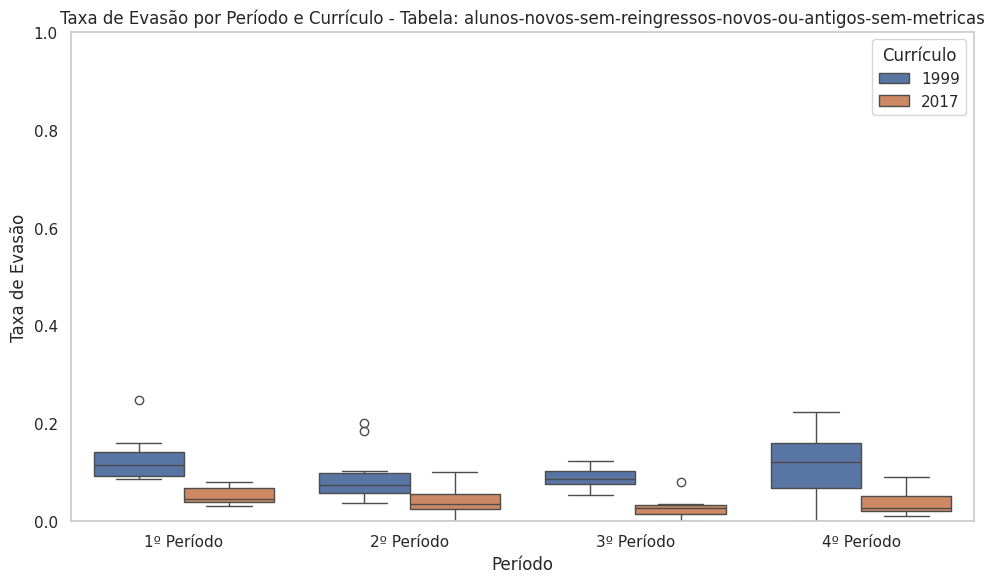

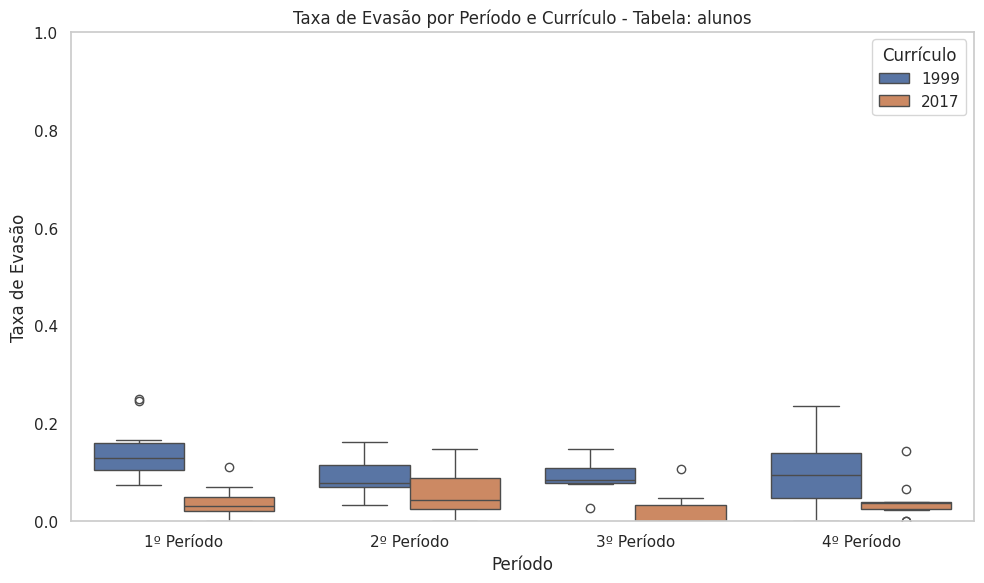

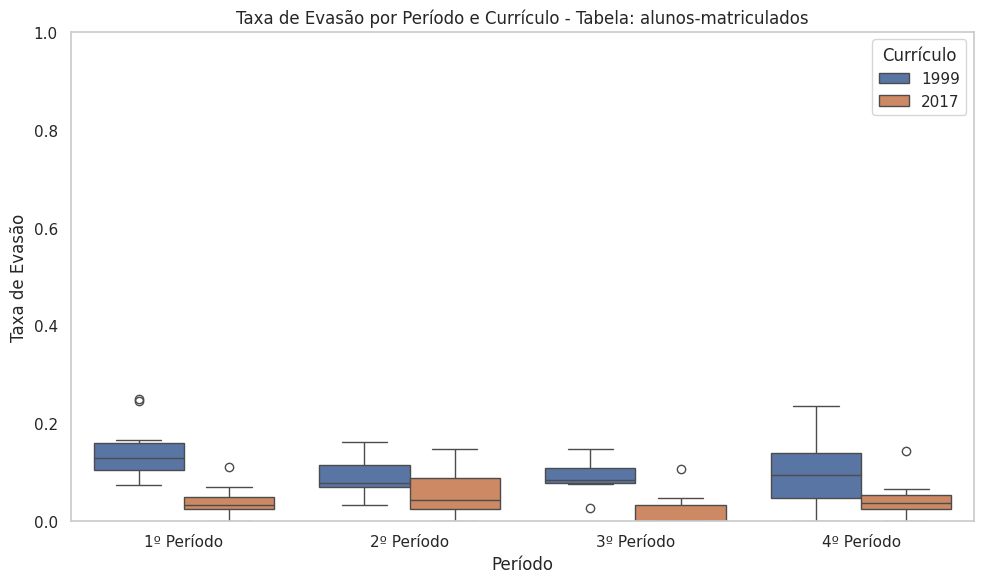

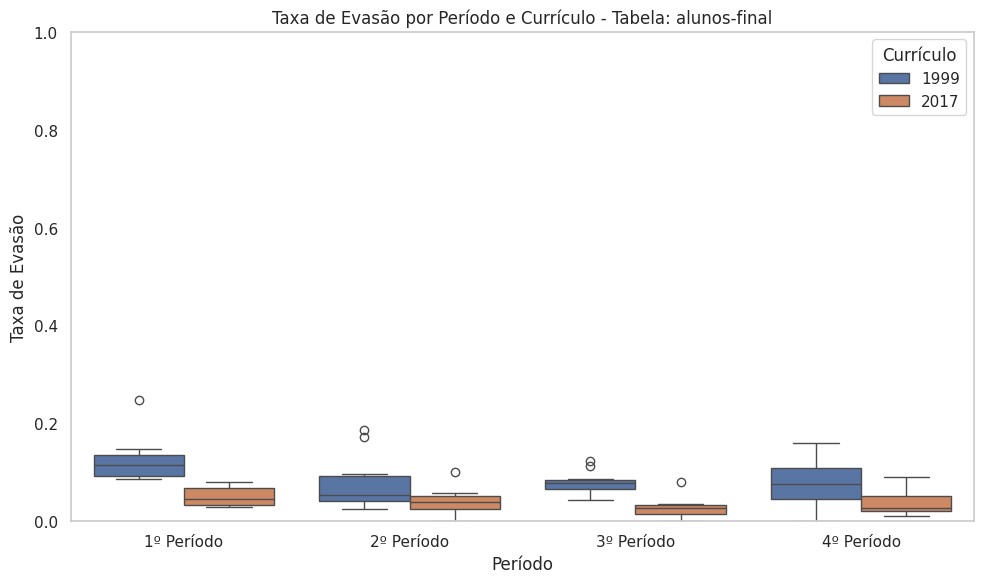

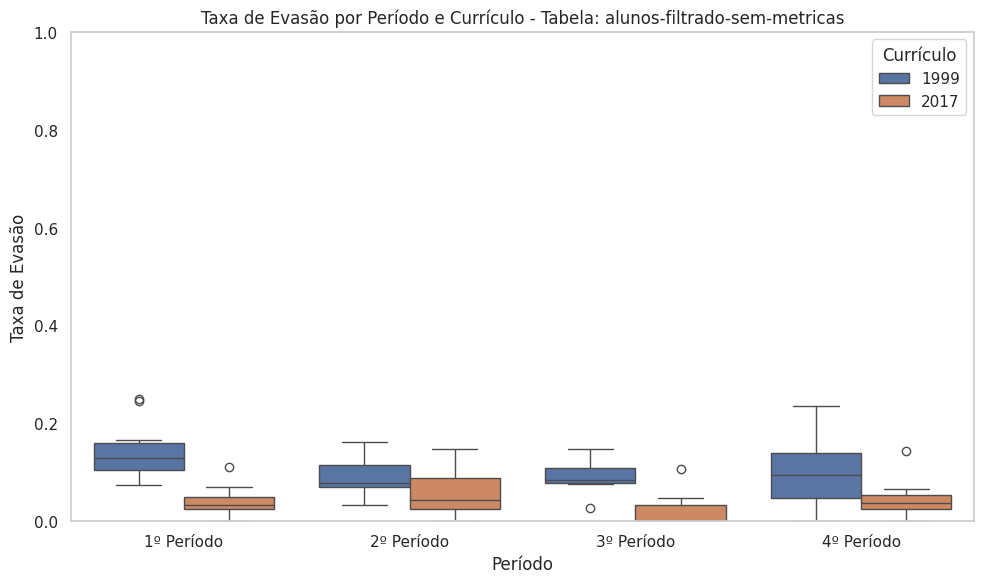

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Função para calcular o N-ésimo período após o ingresso
def proximo_n_periodo(periodo, n=1):
    ano, semestre = map(int, periodo.split('.'))
    for _ in range(n):
        if semestre == 1:
            semestre = 2
        else:
            semestre = 1
            ano += 1
    return f"{ano}.{semestre}"

# Função genérica para calcular evasão ao final de N períodos
def evasao_apos_n_periodos(df, n_periodo, inicio, fim):
    df['periodo_de_ingresso'] = df['periodo_de_ingresso'].astype(str).fillna('')
    df['periodo_de_evasao'] = df['periodo_de_evasao'].astype(str).fillna('')
    
    # Filtrar pelo intervalo do currículo
    df_filtrado = df[(df['periodo_de_ingresso'] >= inicio) & (df['periodo_de_ingresso'] <= fim)].copy()

    # Calcular o período esperado de evasão
    df_filtrado['periodo_esperado_evasao'] = df_filtrado['periodo_de_ingresso'].apply(
        lambda x: proximo_n_periodo(x, n_periodo)
    )

    # Verificar evasão exatamente no período esperado
    df_filtrado[f'evadiu_no_{n_periodo}o_periodo'] = df_filtrado.apply(
        lambda row: row['periodo_de_evasao'] == row['periodo_esperado_evasao'],
        axis=1
    )

    # Agrupar e calcular estatísticas
    resumo = df_filtrado.groupby('periodo_de_ingresso').agg(
        total_ingressantes=('cpf', 'count'),
        total_evasao=(f'evadiu_no_{n_periodo}o_periodo', 'sum')
    )
    resumo['taxa_evasao'] = resumo['total_evasao'] / resumo['total_ingressantes']
    
    # Adicionar coluna do período n e reset index para merge posterior
    resumo = resumo.reset_index()
    resumo['periodo'] = n_periodo
    
    return resumo[['periodo_de_ingresso', 'periodo', 'taxa_evasao']]

# Parâmetros por currículo
curriculos = {
    '1999': {'inicio': '2011.1', 'fim': '2016.2'},
    '2017': {'inicio': '2018.1', 'fim': '2022.3'}
}

# Lista de tabelas a serem processadas
tabelas_nomes = list(tabelas_tratadas_limpo.keys())

# Loop principal para calcular e armazenar dados para os gráficos
for nome_tabela in tabelas_nomes:
    dfs_lista = []
    
    for curriculo, intervalo in curriculos.items():
        for n in range(1, 5):  # Períodos 1 ao 4
            df = tabelas_tratadas_limpo[nome_tabela]
            resultado = evasao_apos_n_periodos(df, n, intervalo['inicio'], intervalo['fim'])
            resultado['curriculo'] = curriculo
            resultado['tabela'] = nome_tabela
            dfs_lista.append(resultado)
    
    # Concatenar todos os resultados para esta tabela
    df_concat = pd.concat(dfs_lista, ignore_index=True)
    
    # Para plotar, padronizar nomes dos períodos para exibir no eixo X
    df_concat['periodo_str'] = df_concat['periodo'].astype(str) + 'º Período'
    
    # Plotar boxplot para esta tabela
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df_concat, x='periodo_str', y='taxa_evasao', hue='curriculo')
    
    plt.title(f'Taxa de Evasão por Período e Currículo - Tabela: {nome_tabela}')
    plt.xlabel('Período')
    plt.ylabel('Taxa de Evasão')
    plt.ylim(0, 1)  # Taxa entre 0 e 1
    plt.legend(title='Currículo')
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()


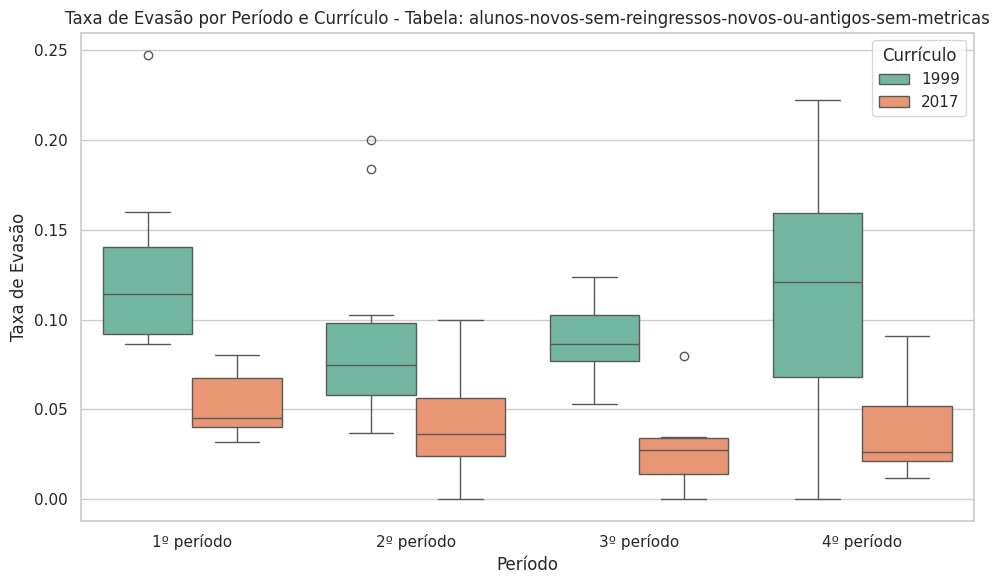

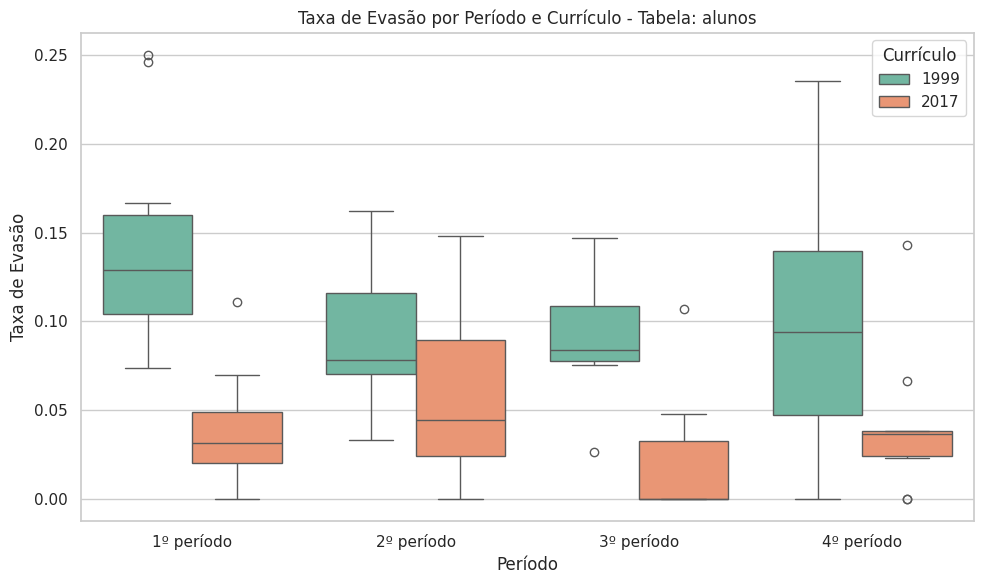

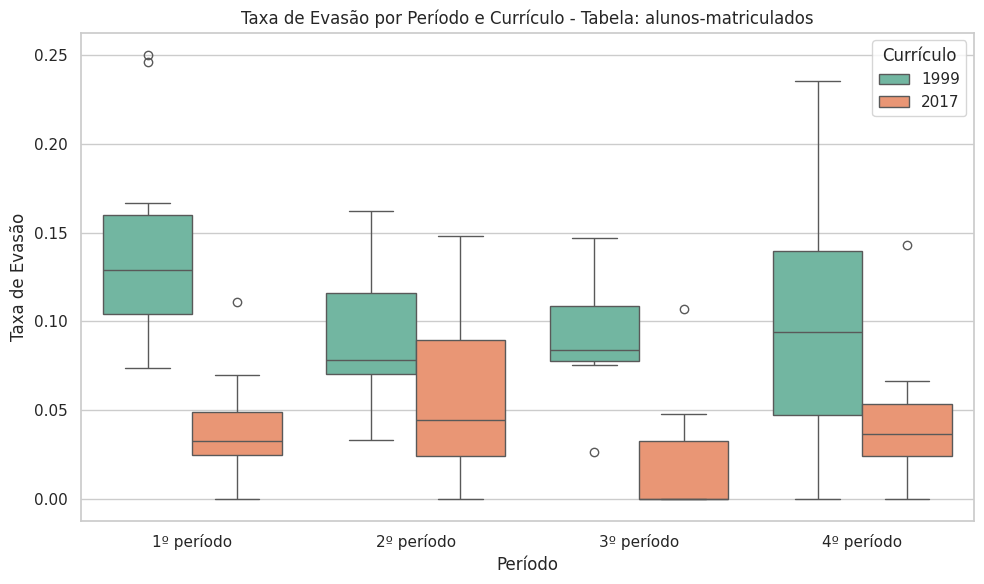

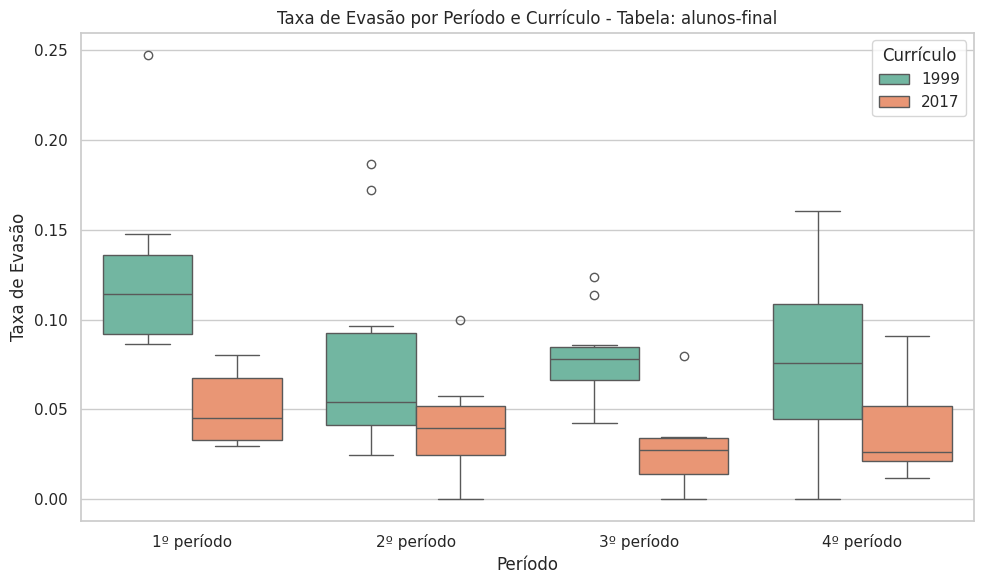

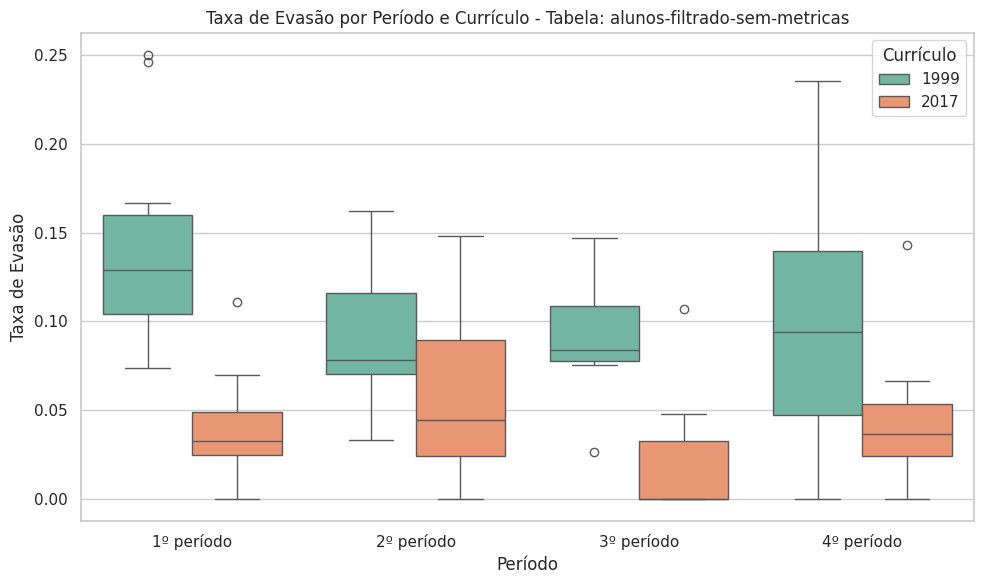

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Função para calcular o N-ésimo período após o ingresso
def proximo_n_periodo(periodo, n=1):
    ano, semestre = map(int, periodo.split('.'))
    for _ in range(n):
        if semestre == 1:
            semestre = 2
        else:
            semestre = 1
            ano += 1
    return f"{ano}.{semestre}"

# Função genérica para calcular evasão ao final de N períodos
def evasao_apos_n_periodos(df, n_periodo, inicio, fim):
    df['periodo_de_ingresso'] = df['periodo_de_ingresso'].astype(str).fillna('')
    df['periodo_de_evasao'] = df['periodo_de_evasao'].astype(str).fillna('')
    
    # Filtrar pelo intervalo do currículo
    df_filtrado = df[(df['periodo_de_ingresso'] >= inicio) & (df['periodo_de_ingresso'] <= fim)].copy()

    # Calcular o período esperado de evasão
    df_filtrado['periodo_esperado_evasao'] = df_filtrado['periodo_de_ingresso'].apply(
        lambda x: proximo_n_periodo(x, n_periodo)
    )

    # Verificar evasão exatamente no período esperado
    df_filtrado[f'evadiu_no_{n_periodo}o_periodo'] = df_filtrado.apply(
        lambda row: row['periodo_de_evasao'] == row['periodo_esperado_evasao'],
        axis=1
    )

    # Agrupar e calcular estatísticas
    resumo = df_filtrado.groupby('periodo_de_ingresso').agg(
        total_ingressantes=('cpf', 'count'),
        total_evasao=(f'evadiu_no_{n_periodo}o_periodo', 'sum')
    )
    resumo['taxa_evasao'] = resumo['total_evasao'] / resumo['total_ingressantes']

    return resumo.reset_index()

# Parâmetros por currículo
curriculos = {
    '1999': {'inicio': '2011.1', 'fim': '2016.2'},
    '2017': {'inicio': '2018.1', 'fim': '2022.3'}
}

# Lista de tabelas a serem processadas
tabelas_nomes = list(tabelas_tratadas_limpo.keys())

# Lista para armazenar todos os resultados
dados_para_plot = []

# Loop principal para todos os currículos, períodos e tabelas
for curriculo, intervalo in curriculos.items():
    for n in range(1, 5):  # 1º ao 4º período
        for nome in tabelas_nomes:
            df = tabelas_tratadas_limpo[nome]
            resultado = evasao_apos_n_periodos(df, n, intervalo['inicio'], intervalo['fim'])
            for _, row in resultado.iterrows():
                dados_para_plot.append({
                    'periodo': f"{n}º período",
                    'taxa_evasao': row['taxa_evasao'],
                    'curriculo': curriculo,
                    'tabela': nome
                })

# Converter para DataFrame
df_plot = pd.DataFrame(dados_para_plot)

# Criar gráficos para cada tabela
for tabela in df_plot['tabela'].unique():
    plt.figure(figsize=(10, 6))
    dados_tabela = df_plot[df_plot['tabela'] == tabela]
    
    sns.boxplot(x='periodo', y='taxa_evasao', hue='curriculo', data=dados_tabela, palette='Set2')
    plt.title(f'Taxa de Evasão por Período e Currículo - Tabela: {tabela}')
    plt.ylabel('Taxa de Evasão')
    plt.xlabel('Período')
    plt.legend(title='Currículo')
    plt.tight_layout()
    plt.show()


### Gráficos de linhas que mostram a tendência da evasão ao longo dos períodos

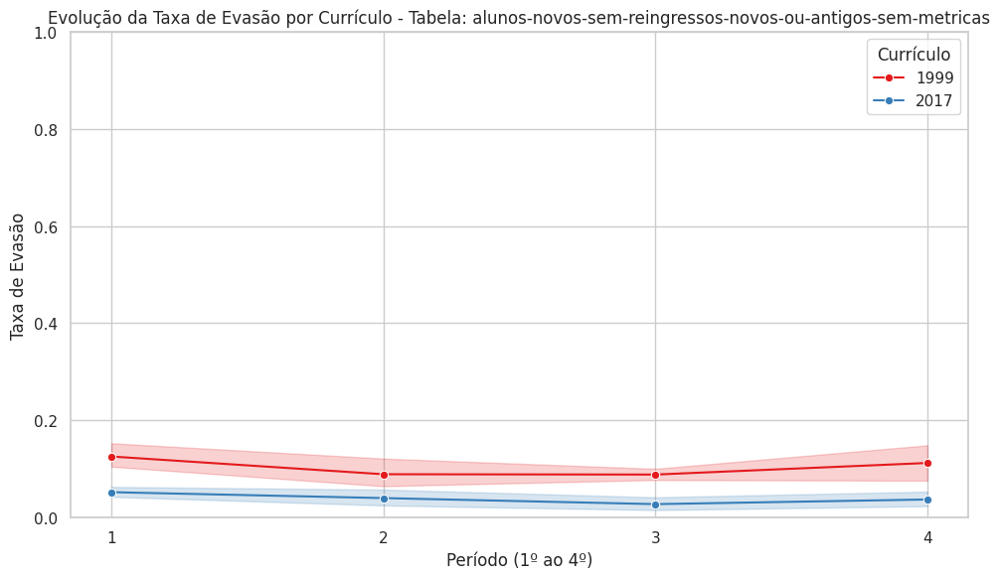

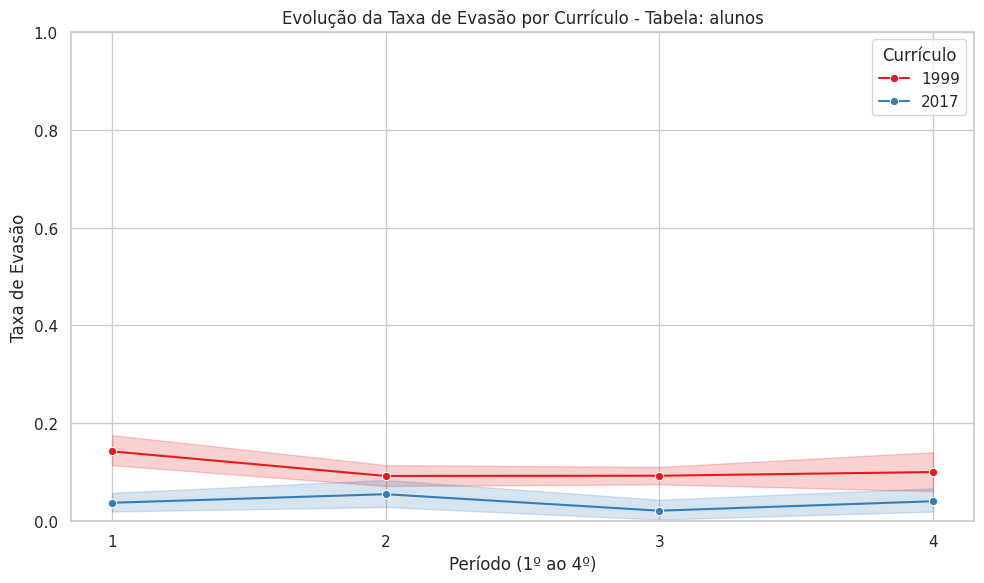

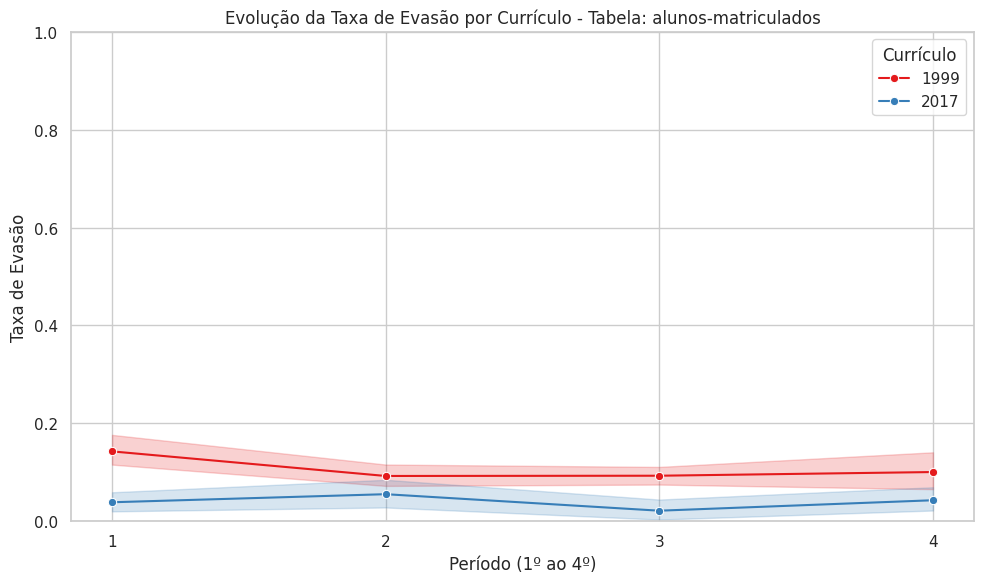

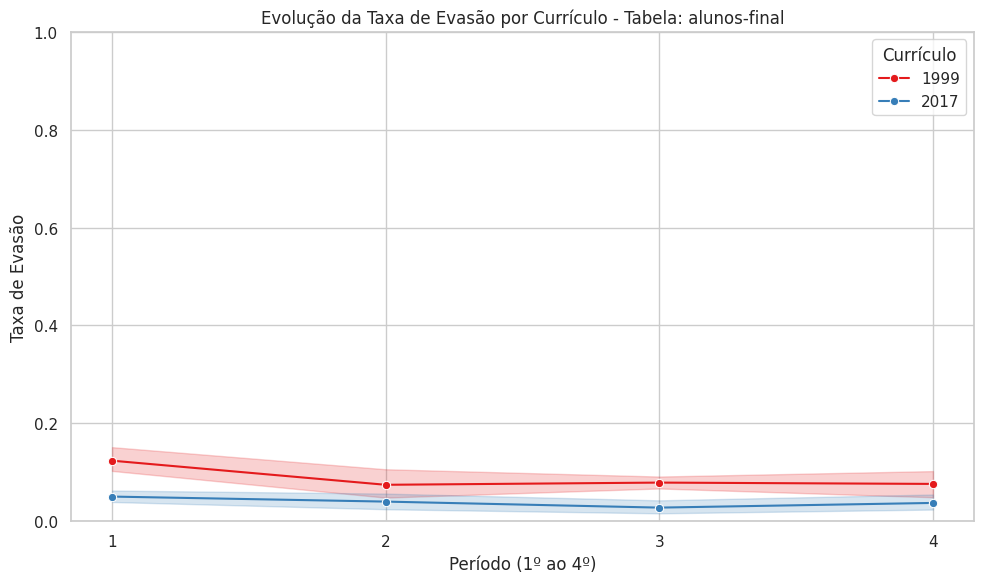

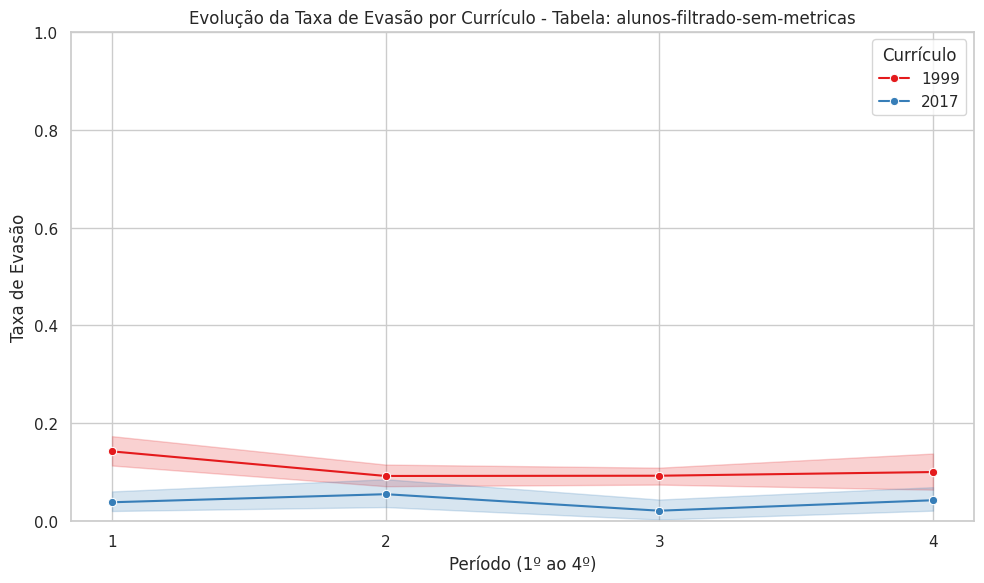

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Função para calcular o N-ésimo período após o ingresso
def proximo_n_periodo(periodo, n=1):
    ano, semestre = map(int, periodo.split('.'))
    for _ in range(n):
        if semestre == 1:
            semestre = 2
        else:
            semestre = 1
            ano += 1
    return f"{ano}.{semestre}"

# Função genérica para calcular evasão ao final de N períodos
def evasao_apos_n_periodos(df, n_periodo, inicio, fim):
    df['periodo_de_ingresso'] = df['periodo_de_ingresso'].astype(str).fillna('')
    df['periodo_de_evasao'] = df['periodo_de_evasao'].astype(str).fillna('')
    
    # Filtrar pelo intervalo do currículo
    df_filtrado = df[(df['periodo_de_ingresso'] >= inicio) & (df['periodo_de_ingresso'] <= fim)].copy()

    # Calcular o período esperado de evasão
    df_filtrado['periodo_esperado_evasao'] = df_filtrado['periodo_de_ingresso'].apply(
        lambda x: proximo_n_periodo(x, n_periodo)
    )

    # Verificar evasão exatamente no período esperado
    df_filtrado[f'evadiu_no_{n_periodo}o_periodo'] = df_filtrado.apply(
        lambda row: row['periodo_de_evasao'] == row['periodo_esperado_evasao'],
        axis=1
    )

    # Agrupar e calcular estatísticas
    resumo = df_filtrado.groupby('periodo_de_ingresso').agg(
        total_ingressantes=('cpf', 'count'),
        total_evasao=(f'evadiu_no_{n_periodo}o_periodo', 'sum')
    )
    resumo['taxa_evasao'] = resumo['total_evasao'] / resumo['total_ingressantes']

    return resumo.reset_index()

# Parâmetros por currículo
curriculos = {
    '1999': {'inicio': '2011.1', 'fim': '2016.2'},
    '2017': {'inicio': '2018.1', 'fim': '2022.3'}
}

# Lista de tabelas a serem processadas
tabelas_nomes = list(tabelas_tratadas_limpo.keys())

# Lista para armazenar todos os resultados
dados_para_plot = []

# Loop principal para todos os currículos, períodos e tabelas
for curriculo, intervalo in curriculos.items():
    for n in range(1, 5):  # 1º ao 4º período
        for nome in tabelas_nomes:
            df = tabelas_tratadas_limpo[nome]
            resultado = evasao_apos_n_periodos(df, n, intervalo['inicio'], intervalo['fim'])
            for _, row in resultado.iterrows():
                dados_para_plot.append({
                    'periodo': n,
                    'taxa_evasao': row['taxa_evasao'],
                    'curriculo': curriculo,
                    'tabela': nome
                })

# Converter para DataFrame
df_plot = pd.DataFrame(dados_para_plot)

# Criar gráficos de linhas para cada tabela
for tabela in df_plot['tabela'].unique():
    plt.figure(figsize=(10, 6))
    dados_tabela = df_plot[df_plot['tabela'] == tabela]
    
    sns.lineplot(
        data=dados_tabela,
        x='periodo',
        y='taxa_evasao',
        hue='curriculo',
        marker='o',
        palette='Set1'
    )
    
    plt.title(f'Evolução da Taxa de Evasão por Currículo - Tabela: {tabela}')
    plt.ylabel('Taxa de Evasão')
    plt.xlabel('Período (1º ao 4º)')
    plt.xticks([1, 2, 3, 4])
    plt.ylim(0, 1)
    plt.legend(title='Currículo')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


### GRÁFICO DE BARRAS AGRUPADA

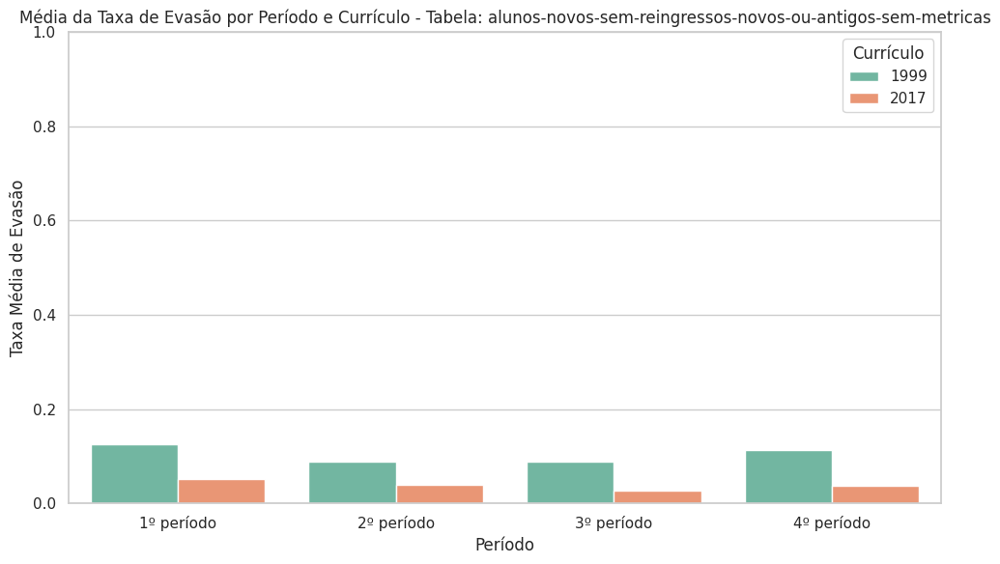

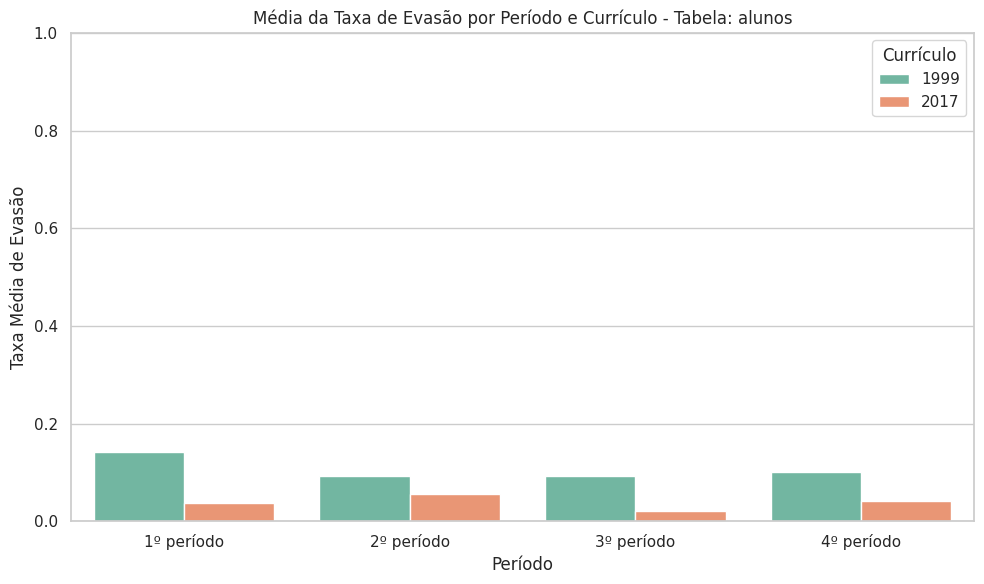

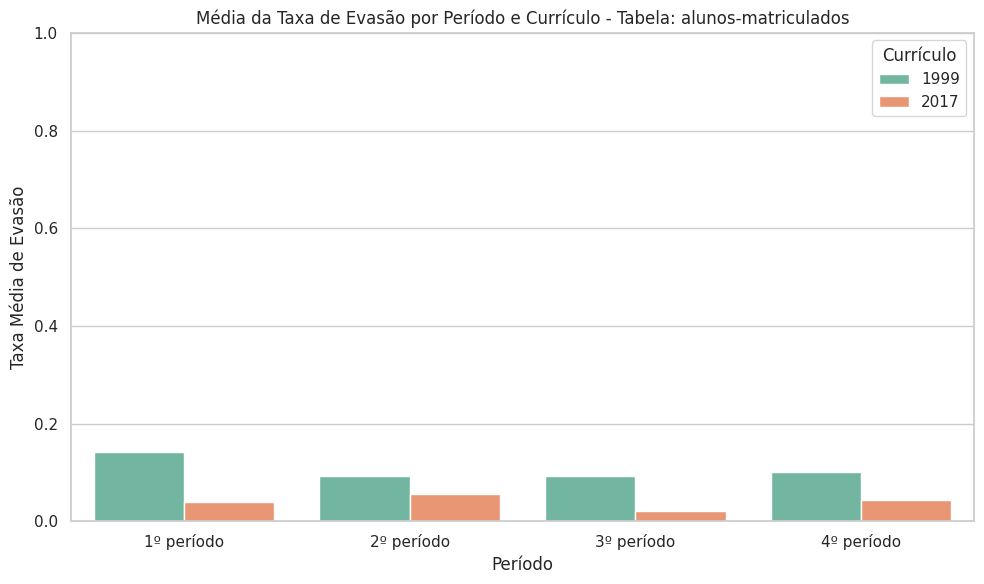

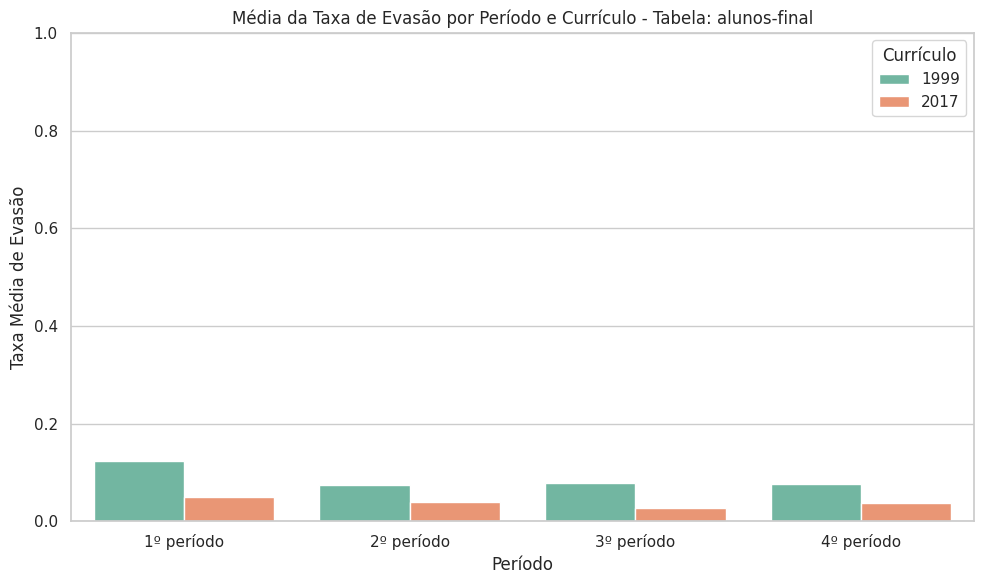

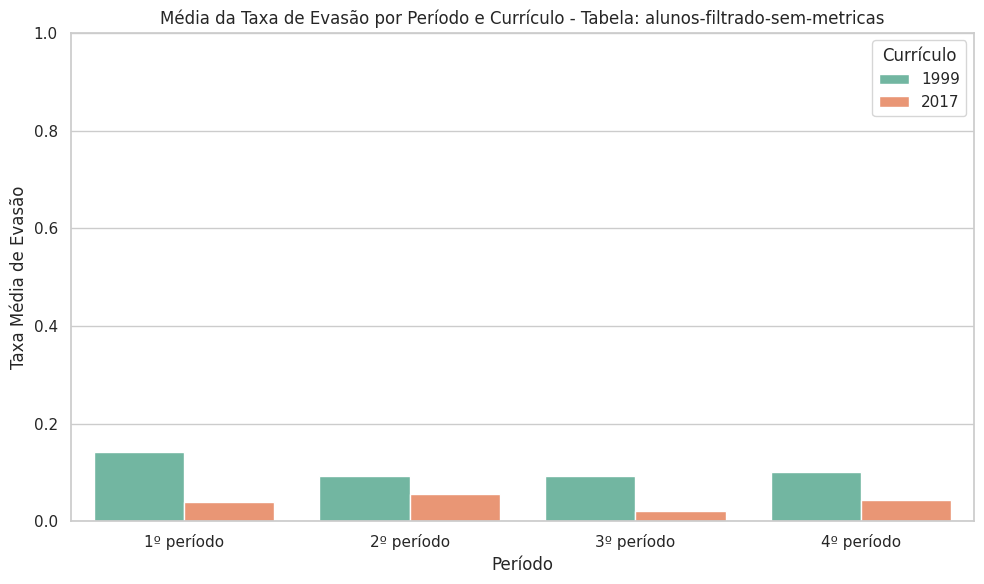

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Função para calcular o N-ésimo período após o ingresso
def proximo_n_periodo(periodo, n=1):
    ano, semestre = map(int, periodo.split('.'))
    for _ in range(n):
        if semestre == 1:
            semestre = 2
        else:
            semestre = 1
            ano += 1
    return f"{ano}.{semestre}"

# Função genérica para calcular evasão ao final de N períodos
def evasao_apos_n_periodos(df, n_periodo, inicio, fim):
    df['periodo_de_ingresso'] = df['periodo_de_ingresso'].astype(str).fillna('')
    df['periodo_de_evasao'] = df['periodo_de_evasao'].astype(str).fillna('')
    
    # Filtrar pelo intervalo do currículo
    df_filtrado = df[(df['periodo_de_ingresso'] >= inicio) & (df['periodo_de_ingresso'] <= fim)].copy()

    # Calcular o período esperado de evasão
    df_filtrado['periodo_esperado_evasao'] = df_filtrado['periodo_de_ingresso'].apply(
        lambda x: proximo_n_periodo(x, n_periodo)
    )

    # Verificar evasão exatamente no período esperado
    df_filtrado[f'evadiu_no_{n_periodo}o_periodo'] = df_filtrado.apply(
        lambda row: row['periodo_de_evasao'] == row['periodo_esperado_evasao'],
        axis=1
    )

    # Agrupar e calcular estatísticas
    resumo = df_filtrado.groupby('periodo_de_ingresso').agg(
        total_ingressantes=('cpf', 'count'),
        total_evasao=(f'evadiu_no_{n_periodo}o_periodo', 'sum')
    )
    resumo['taxa_evasao'] = resumo['total_evasao'] / resumo['total_ingressantes']

    return resumo.reset_index()

# Parâmetros por currículo
curriculos = {
    '1999': {'inicio': '2011.1', 'fim': '2016.2'},
    '2017': {'inicio': '2018.1', 'fim': '2022.3'}
}

# Lista de tabelas a serem processadas
tabelas_nomes = list(tabelas_tratadas_limpo.keys())

# Lista para armazenar todos os resultados
dados_para_plot = []

# Loop principal para todos os currículos, períodos e tabelas
for curriculo, intervalo in curriculos.items():
    for n in range(1, 5):  # 1º ao 4º período
        for nome in tabelas_nomes:
            df = tabelas_tratadas_limpo[nome]
            resultado = evasao_apos_n_periodos(df, n, intervalo['inicio'], intervalo['fim'])
            if not resultado.empty:
                taxa_media = resultado['taxa_evasao'].mean()
                dados_para_plot.append({
                    'periodo': f'{n}º período',
                    'taxa_media_evasao': taxa_media,
                    'curriculo': curriculo,
                    'tabela': nome
                })

# Converter para DataFrame
df_plot = pd.DataFrame(dados_para_plot)

# Criar gráficos de barras agrupadas para cada tabela
for tabela in df_plot['tabela'].unique():
    plt.figure(figsize=(10, 6))
    dados_tabela = df_plot[df_plot['tabela'] == tabela]

    sns.barplot(
        x='periodo',
        y='taxa_media_evasao',
        hue='curriculo',
        data=dados_tabela,
        palette='Set2'
    )

    plt.title(f'Média da Taxa de Evasão por Período e Currículo - Tabela: {tabela}')
    plt.ylabel('Taxa Média de Evasão')
    plt.xlabel('Período')
    plt.ylim(0, 1)
    plt.legend(title='Currículo')
    plt.grid(True, axis='y')
    plt.tight_layout()
    plt.show()


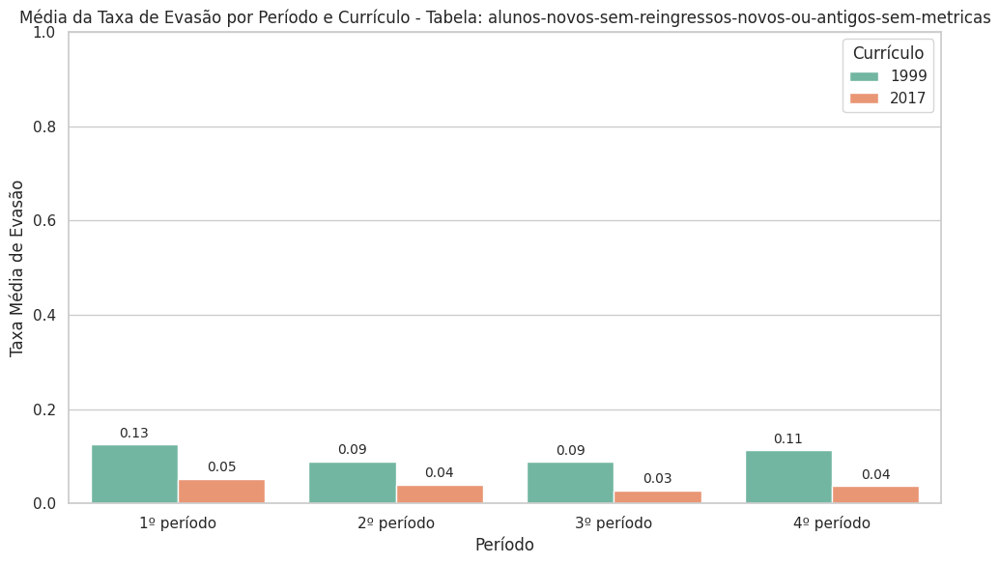

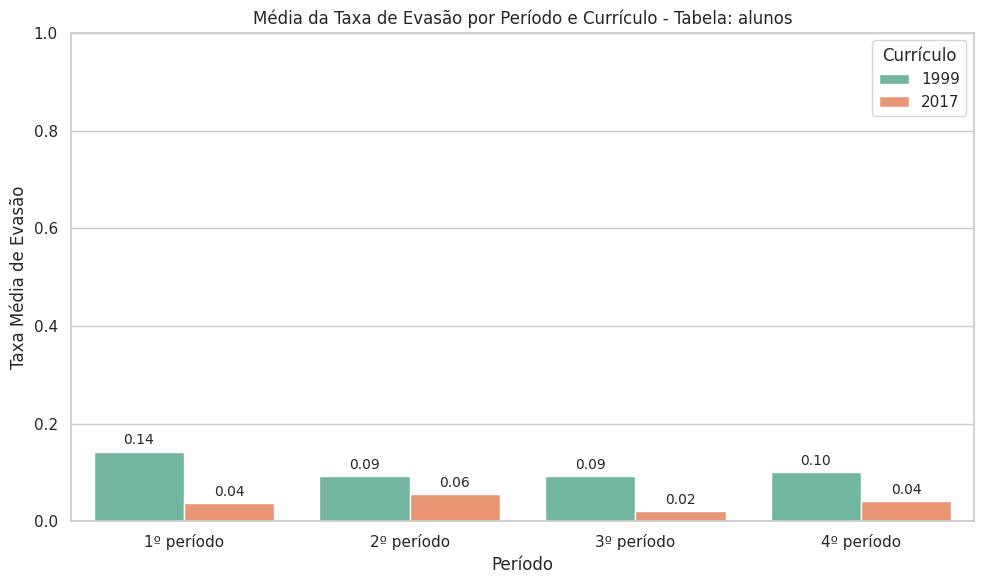

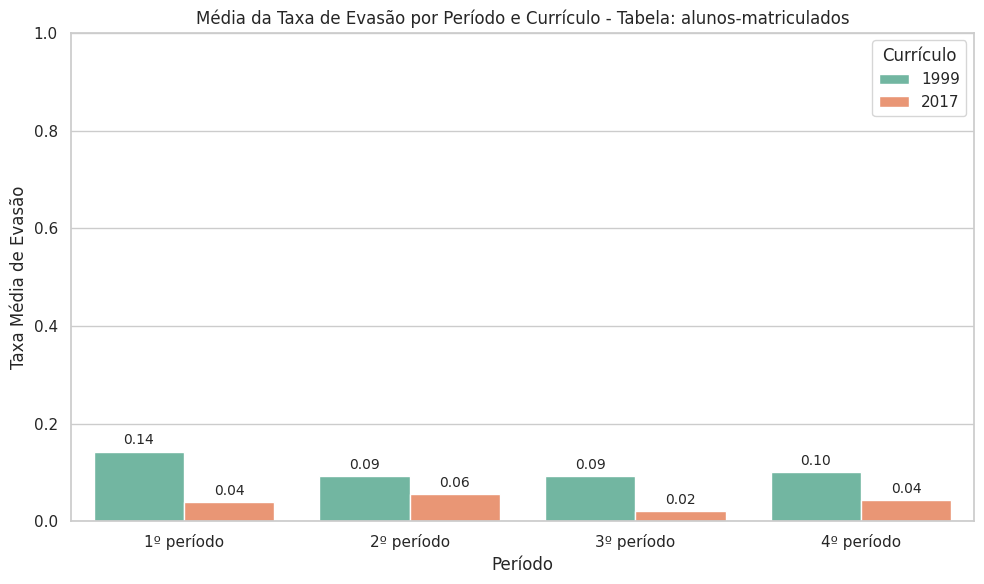

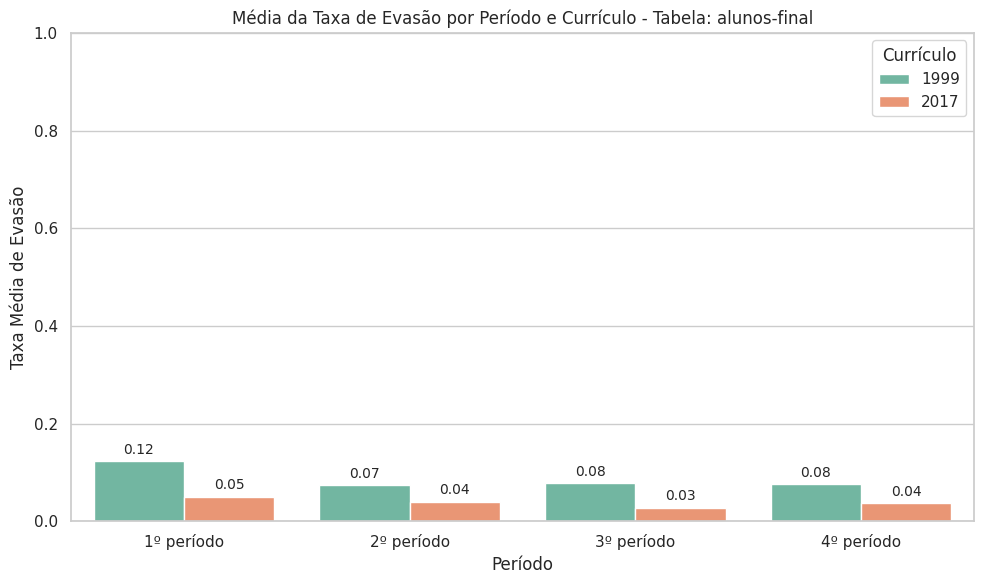

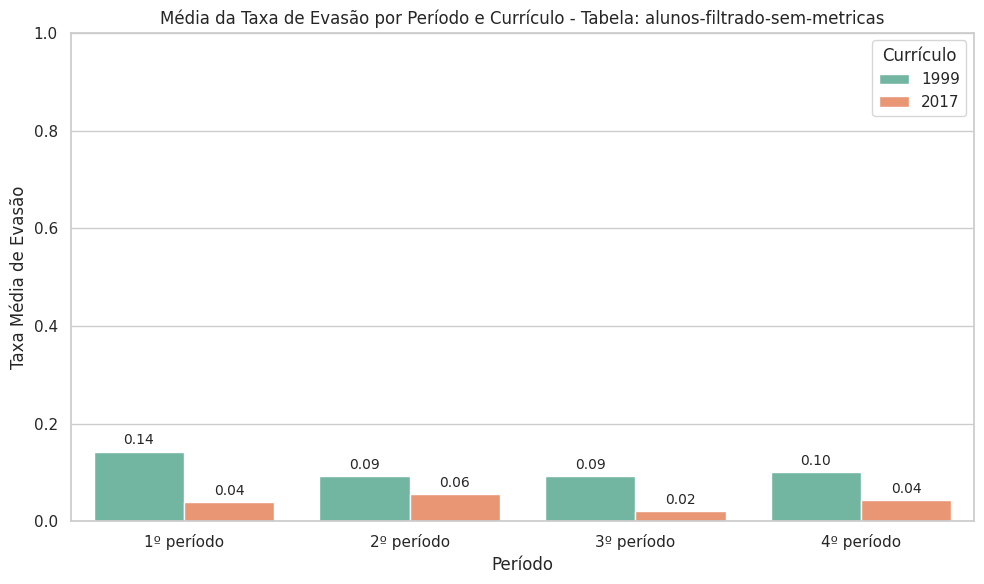

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Função para calcular o N-ésimo período após o ingresso
def proximo_n_periodo(periodo, n=1):
    ano, semestre = map(int, periodo.split('.'))
    for _ in range(n):
        if semestre == 1:
            semestre = 2
        else:
            semestre = 1
            ano += 1
    return f"{ano}.{semestre}"

# Função genérica para calcular evasão ao final de N períodos
def evasao_apos_n_periodos(df, n_periodo, inicio, fim):
    df['periodo_de_ingresso'] = df['periodo_de_ingresso'].astype(str).fillna('')
    df['periodo_de_evasao'] = df['periodo_de_evasao'].astype(str).fillna('')
    
    # Filtrar pelo intervalo do currículo
    df_filtrado = df[(df['periodo_de_ingresso'] >= inicio) & (df['periodo_de_ingresso'] <= fim)].copy()

    # Calcular o período esperado de evasão
    df_filtrado['periodo_esperado_evasao'] = df_filtrado['periodo_de_ingresso'].apply(
        lambda x: proximo_n_periodo(x, n_periodo)
    )

    # Verificar evasão exatamente no período esperado
    df_filtrado[f'evadiu_no_{n_periodo}o_periodo'] = df_filtrado.apply(
        lambda row: row['periodo_de_evasao'] == row['periodo_esperado_evasao'],
        axis=1
    )

    # Agrupar e calcular estatísticas
    resumo = df_filtrado.groupby('periodo_de_ingresso').agg(
        total_ingressantes=('cpf', 'count'),
        total_evasao=(f'evadiu_no_{n_periodo}o_periodo', 'sum')
    )
    resumo['taxa_evasao'] = resumo['total_evasao'] / resumo['total_ingressantes']

    return resumo.reset_index()

# Parâmetros por currículo
curriculos = {
    '1999': {'inicio': '2011.1', 'fim': '2016.2'},
    '2017': {'inicio': '2018.1', 'fim': '2022.3'}
}

# Lista de tabelas a serem processadas
tabelas_nomes = list(tabelas_tratadas_limpo.keys())

# Lista para armazenar todos os resultados
dados_para_plot = []

# Loop principal para todos os currículos, períodos e tabelas
for curriculo, intervalo in curriculos.items():
    for n in range(1, 5):  # 1º ao 4º período
        for nome in tabelas_nomes:
            df = tabelas_tratadas_limpo[nome]
            resultado = evasao_apos_n_periodos(df, n, intervalo['inicio'], intervalo['fim'])
            if not resultado.empty:
                taxa_media = resultado['taxa_evasao'].mean()
                dados_para_plot.append({
                    'periodo': f'{n}º período',
                    'taxa_media_evasao': taxa_media,
                    'curriculo': curriculo,
                    'tabela': nome
                })

# Converter para DataFrame
df_plot = pd.DataFrame(dados_para_plot)

# Criar gráficos de barras agrupadas com valores numéricos
for tabela in df_plot['tabela'].unique():
    plt.figure(figsize=(10, 6))
    dados_tabela = df_plot[df_plot['tabela'] == tabela]

    ax = sns.barplot(
        x='periodo',
        y='taxa_media_evasao',
        hue='curriculo',
        data=dados_tabela,
        palette='Set2'
    )

    # Adicionar os valores numéricos acima das barras
    for container in ax.containers:
        ax.bar_label(container, fmt='%.2f', label_type='edge', padding=3, fontsize=10)

    plt.title(f'Média da Taxa de Evasão por Período e Currículo - Tabela: {tabela}')
    plt.ylabel('Taxa Média de Evasão')
    plt.xlabel('Período')
    plt.ylim(0, 1)
    plt.legend(title='Currículo')
    plt.grid(True, axis='y')
    plt.tight_layout()
    plt.show()


Análise Comparativa das Taxas de Evasão entre os Currículos 1999 e 2017
A análise detalhada da taxa de evasão, com base na tabela alunos-matriculados, revela diferenças significativas entre os currículos de 1999 e 2017 ao longo dos primeiros quatro períodos acadêmicos.

No segundo período, a taxa de evasão para o currículo de 1999 foi de aproximadamente 14%, enquanto para o currículo de 2017 esse índice foi consideravelmente menor, em torno de 4%. Essa diferença indica que o currículo mais recente tem maior eficácia em manter os estudantes matriculados nas fases iniciais do curso.

Nos períodos subsequentes, os dados mostram uma tendência de diminuição da evasão em ambos os currículos, porém, o currículo de 2017 continuou apresentando taxas inferiores, variando entre 2% e 6%, contrastando com a faixa de 9% a 10% observada no currículo de 1999. Tal comportamento sugere que o currículo atualizado proporciona uma estrutura acadêmica e suporte mais eficaz para a continuidade dos alunos.

É importante destacar que esta interpretação se baseia especificamente na tabela alunos-matriculados, embora outras tabelas tenham sido igualmente exploradas e analisadas, confirmando a consistência dessa tendência geral de menor evasão no currículo mais recente.

Esses resultados reforçam a importância de atualizações curriculares constantes e direcionadas, pois mostram claramente que as mudanças implementadas no currículo de 2017 contribuíram para a melhora significativa da retenção dos estudantes no curso.



### Média, Desvio padrão 


--- Análise das variáveis no 1º período ---

Variável: sexo
Contagem:
 sexo
M    853
F    163
Name: count, dtype: int64
Proporção:
 sexo
M    0.839567
F    0.160433
Name: proportion, dtype: float64
Taxa média de evasão por categoria:
 sexo
F    0.153374
M    0.121923
Name: evadiu_no_1o_periodo, dtype: float64

Variável: idade
Média: 31.37, Desvio padrão: 3.93

Variável cota NÃO encontrada na tabela.

Variável: estado_civil
Contagem:
 estado_civil
Solteiro    978
Casado       34
Nan           4
Name: count, dtype: int64
Proporção:
 estado_civil
Solteiro    0.962598
Casado      0.033465
Nan         0.003937
Name: proportion, dtype: float64
Taxa média de evasão por categoria:
 estado_civil
Casado      0.264706
Nan         0.750000
Solteiro    0.119632
Name: evadiu_no_1o_periodo, dtype: float64

Variável: cor
Contagem:
 cor
Branca      535
Parda       382
Preta        52
Nan          25
Amarela      20
Indígena      2
Name: count, dtype: int64
Proporção:
 cor
Branca      0.526575
Parda   

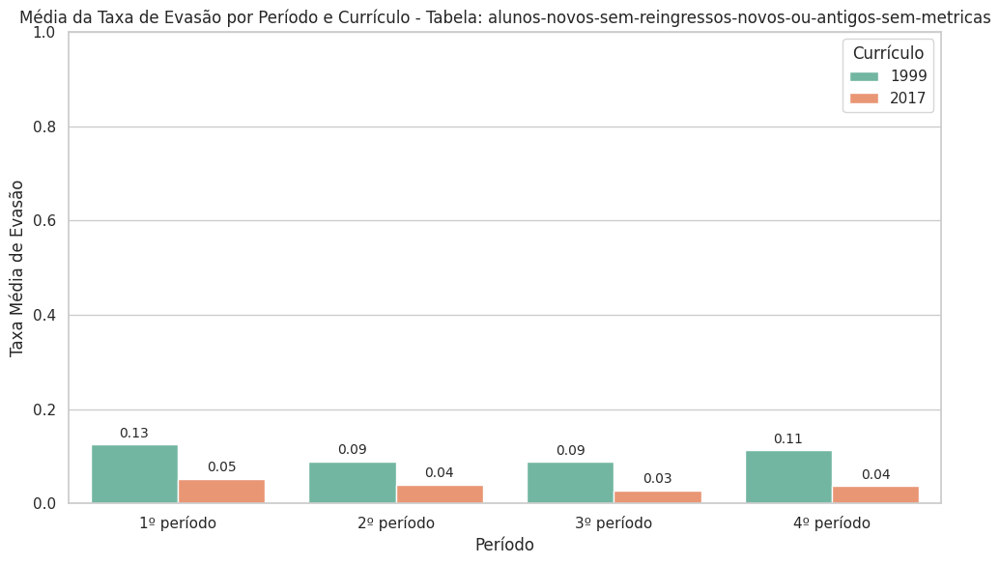

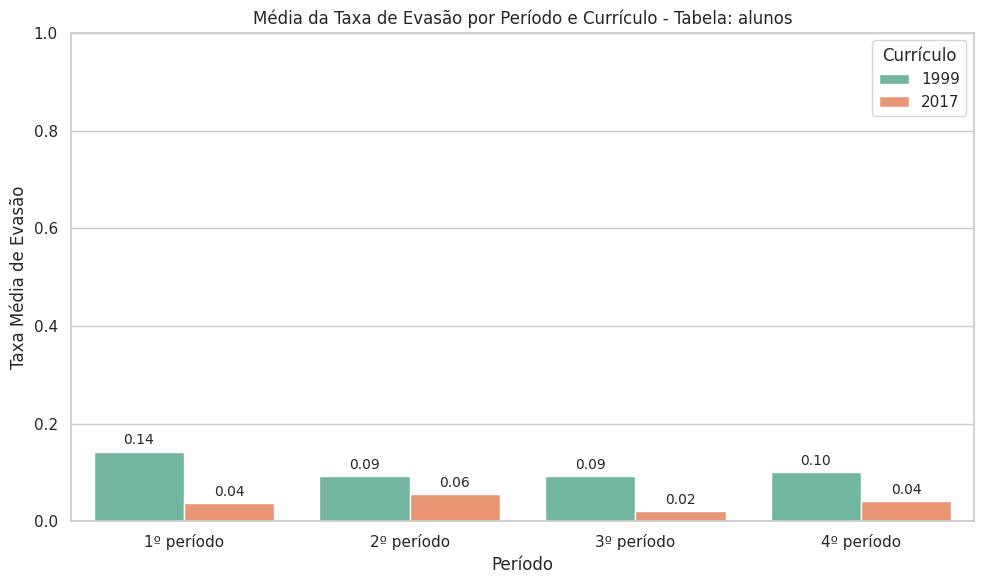

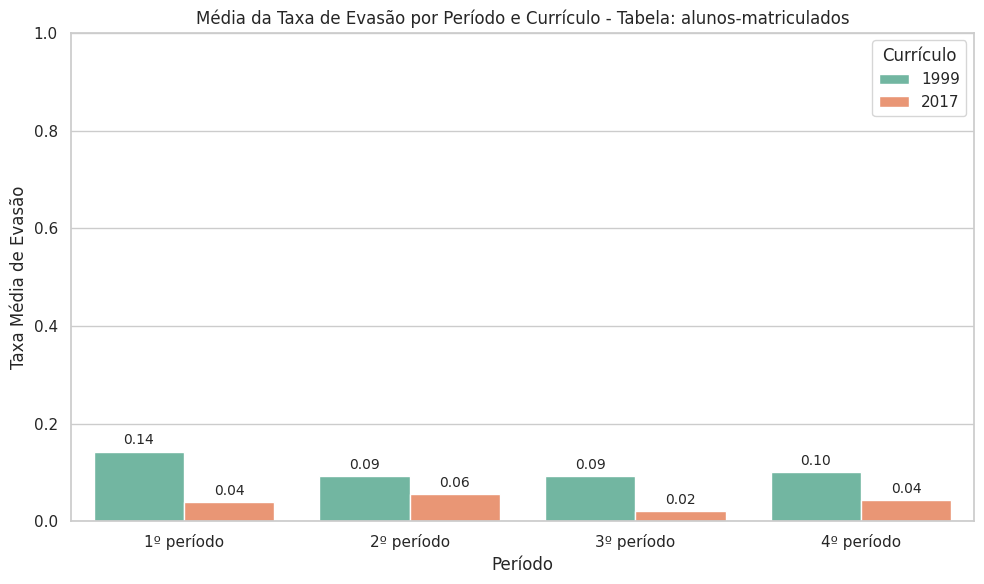

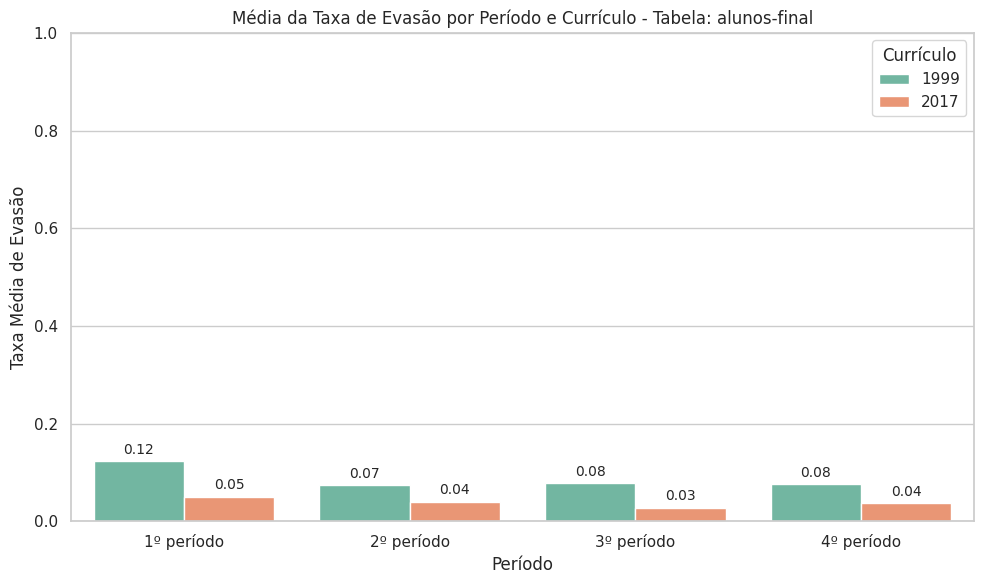

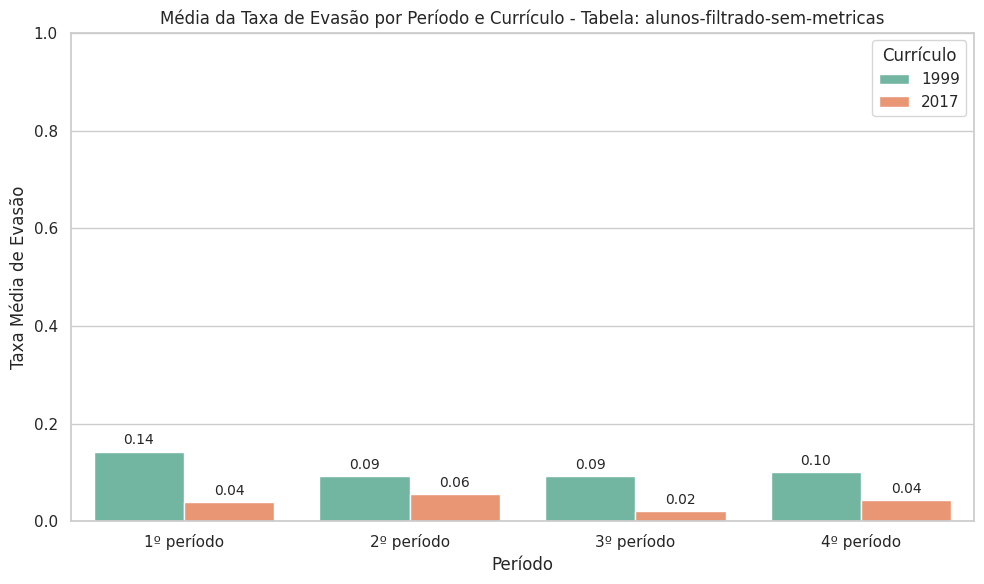

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Função para calcular o N-ésimo período após o ingresso
def proximo_n_periodo(periodo, n=1):
    ano, semestre = map(int, periodo.split('.'))
    for _ in range(n):
        if semestre == 1:
            semestre = 2
        else:
            semestre = 1
            ano += 1
    return f"{ano}.{semestre}"

# Função genérica para calcular evasão ao final de N períodos
def evasao_apos_n_periodos(df, n_periodo, inicio, fim):
    df['periodo_de_ingresso'] = df['periodo_de_ingresso'].astype(str).fillna('')
    df['periodo_de_evasao'] = df['periodo_de_evasao'].astype(str).fillna('')
    
    # Filtrar pelo intervalo do currículo
    df_filtrado = df[(df['periodo_de_ingresso'] >= inicio) & (df['periodo_de_ingresso'] <= fim)].copy()

    # Calcular o período esperado de evasão
    df_filtrado['periodo_esperado_evasao'] = df_filtrado['periodo_de_ingresso'].apply(
        lambda x: proximo_n_periodo(x, n_periodo)
    )

    # Verificar evasão exatamente no período esperado
    df_filtrado[f'evadiu_no_{n_periodo}o_periodo'] = df_filtrado.apply(
        lambda row: row['periodo_de_evasao'] == row['periodo_esperado_evasao'],
        axis=1
    )

    # Agrupar e calcular estatísticas
    resumo = df_filtrado.groupby('periodo_de_ingresso').agg(
        total_ingressantes=('cpf', 'count'),
        total_evasao=(f'evadiu_no_{n_periodo}o_periodo', 'sum')
    )
    resumo['taxa_evasao'] = resumo['total_evasao'] / resumo['total_ingressantes']

    return df_filtrado, resumo.reset_index()

# Função para análise descritiva das variáveis extras
def analise_variaveis(df, variaveis, n_periodo):
    print(f"\n--- Análise das variáveis no {n_periodo}º período ---")
    for var in variaveis:
        if var in df.columns:
            print(f"\nVariável: {var}")
            if pd.api.types.is_numeric_dtype(df[var]):
                media = df[var].mean()
                desvio = df[var].std()
                print(f"Média: {media:.2f}, Desvio padrão: {desvio:.2f}")
            else:
                contagem = df[var].value_counts(dropna=False)
                proporcao = df[var].value_counts(normalize=True, dropna=False)
                print("Contagem:\n", contagem)
                print("Proporção:\n", proporcao)

                # Se possível, calcular taxa média de evasão por categoria
                col_evasao = f'evadiu_no_{n_periodo}o_periodo'
                if col_evasao in df.columns:
                    taxa_por_categoria = df.groupby(var)[col_evasao].mean()
                    print("Taxa média de evasão por categoria:\n", taxa_por_categoria)
        else:
            print(f"\nVariável {var} NÃO encontrada na tabela.")

# Parâmetros por currículo
curriculos = {
    '1999': {'inicio': '2011.1', 'fim': '2016.2'},
    '2017': {'inicio': '2018.1', 'fim': '2022.3'}
}

# Variáveis extras para análise
variaveis_extra = ['sexo', 'idade', 'cota', 'estado_civil', 'cor']

# Lista de tabelas a serem processadas
tabelas_nomes = list(tabelas_tratadas_limpo.keys())

# Lista para armazenar todos os resultados de evasão para plot
dados_para_plot = []

# Loop principal
for curriculo, intervalo in curriculos.items():
    for n in range(1, 5):  # 1º ao 4º período
        for nome in tabelas_nomes:
            df = tabelas_tratadas_limpo[nome]
            df_filtrado, resultado = evasao_apos_n_periodos(df, n, intervalo['inicio'], intervalo['fim'])
            if not resultado.empty:
                taxa_media = resultado['taxa_evasao'].mean()
                dados_para_plot.append({
                    'periodo': f'{n}º período',
                    'taxa_media_evasao': taxa_media,
                    'curriculo': curriculo,
                    'tabela': nome
                })

                # Análise das variáveis extras na amostra filtrada e com evasão
                analise_variaveis(df_filtrado, variaveis_extra, n)

# Converter para DataFrame para plotagem
df_plot = pd.DataFrame(dados_para_plot)

# Gráficos de barras agrupadas com valores numéricos
for tabela in df_plot['tabela'].unique():
    plt.figure(figsize=(10, 6))
    dados_tabela = df_plot[df_plot['tabela'] == tabela]

    ax = sns.barplot(
        x='periodo',
        y='taxa_media_evasao',
        hue='curriculo',
        data=dados_tabela,
        palette='Set2'
    )

    # Adicionar os valores numéricos acima das barras
    for container in ax.containers:
        ax.bar_label(container, fmt='%.2f', label_type='edge', padding=3, fontsize=10)

    plt.title(f'Média da Taxa de Evasão por Período e Currículo - Tabela: {tabela}')
    plt.ylabel('Taxa Média de Evasão')
    plt.xlabel('Período')
    plt.ylim(0, 1)
    plt.legend(title='Currículo')
    plt.grid(True, axis='y')
    plt.tight_layout()
    plt.show()


In [35]:
import pandas as pd

def analisar_variaveis(df, n_periodo=1):
    resultados = {}
    df = df.copy()
    
    # Garantir que 'periodo_de_ingresso' e 'periodo_de_evasao' estão como string
    df['periodo_de_ingresso'] = df['periodo_de_ingresso'].astype(str).fillna('')
    df['periodo_de_evasao'] = df['periodo_de_evasao'].astype(str).fillna('')
    
    # Calcular o período esperado de evasão
    df['periodo_esperado_evasao'] = df['periodo_de_ingresso'].apply(
        lambda x: proximo_n_periodo(x, n_periodo)
    )

    # Verificar evasão no período esperado
    df[f'evadiu_no_{n_periodo}o_periodo'] = df.apply(
        lambda row: row['periodo_de_evasao'] == row['periodo_esperado_evasao'],
        axis=1
    )

    print(f"\n--- Análise das variáveis no {n_periodo}º período ---")

    # Variável: sexo
    if 'sexo' in df.columns:
        sexo_contagem = df['sexo'].value_counts()
        sexo_proporcao = df['sexo'].value_counts(normalize=True)
        taxa_evasao_sexo = df.groupby('sexo')[f'evadiu_no_{n_periodo}o_periodo'].mean()

        tabela_sexo = pd.DataFrame({
            'Contagem': sexo_contagem,
            'Proporção': sexo_proporcao,
            'Taxa de Evasão': taxa_evasao_sexo
        })
        print("\n🟪 Tabela - Sexo:")
        print(tabela_sexo)
    else:
        print("Variável sexo NÃO encontrada.")

    # Variável: idade
    if 'idade' in df.columns:
        media_idade = df['idade'].mean()
        desvio_idade = df['idade'].std()
        print(f"\n📘 Idade - Média: {media_idade:.2f}, Desvio Padrão: {desvio_idade:.2f}")
    else:
        print("Variável idade NÃO encontrada.")

    # Variáveis categóricas adicionais
    for var in ['cota', 'estado_civil', 'cor']:
        if var in df.columns:
            contagem = df[var].value_counts()
            proporcao = df[var].value_counts(normalize=True)
            taxa_evasao = df.groupby(var)[f'evadiu_no_{n_periodo}o_periodo'].mean()

            tabela_var = pd.DataFrame({
                'Contagem': contagem,
                'Proporção': proporcao,
                'Taxa de Evasão': taxa_evasao
            })
            print(f"\n🟨 Tabela - {var.capitalize()}:")
            print(tabela_var)
        else:
            print(f"Variável {var} NÃO encontrada na tabela.")


In [36]:
for nome in tabelas_nomes:
    df = tabelas_tratadas_limpo[nome]
    analisar_variaveis(df, n_periodo=1)



--- Análise das variáveis no 1º período ---

🟪 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          399      0.175        0.092732
M         1881      0.825        0.083998

📘 Idade - Média: 27.76, Desvio Padrão: 5.12
Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              58   0.025439        0.241379
Divorciado           3   0.001316        0.000000
Nan                  7   0.003070        0.857143
Solteiro          2212   0.970175        0.079114

🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022368        0.156863
Branca        1157   0.507456        0.069144
Indígena         4   0.001754        0.000000
Nan             28   0.012281        0.428571
Parda          932   0.408772        0.086910
Preta          108 

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns

def analisar_variaveis_com_graficos(df, n_periodo=1):
    df = df.copy()

    # Garantir que 'periodo_de_ingresso' e 'periodo_de_evasao' são strings
    df['periodo_de_ingresso'] = df['periodo_de_ingresso'].astype(str).fillna('')
    df['periodo_de_evasao'] = df['periodo_de_evasao'].astype(str).fillna('')

    # Calcular o período esperado de evasão
    df['periodo_esperado_evasao'] = df['periodo_de_ingresso'].apply(
        lambda x: proximo_n_periodo(x, n_periodo)
    )

    # Verificar evasão no período esperado
    evasao_col = f'evadiu_no_{n_periodo}o_periodo'
    df[evasao_col] = df.apply(
        lambda row: row['periodo_de_evasao'] == row['periodo_esperado_evasao'],
        axis=1
    )

    print(f"\n--- Análise das variáveis no {n_periodo}º período ---")

    # Variáveis categóricas a analisar
    variaveis_categoricas = ['sexo', 'cota', 'estado_civil', 'cor']

    for var in variaveis_categoricas:
        if var in df.columns:
            contagem = df[var].value_counts()
            proporcao = df[var].value_counts(normalize=True)
            taxa_evasao = df.groupby(var)[evasao_col].mean()

            tabela = pd.DataFrame({
                'Contagem': contagem,
                'Proporção': proporcao,
                'Taxa de Evasão': taxa_evasao
            })

            print(f"\n🟨 Tabela - {var.capitalize()}:")
            print(tabela)

            # 🔹 Gráfico de barras para taxa de evasão por categoria
            plt.figure(figsize=(8, 5))
            sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')
            plt.title(f'Taxa de Evasão por {var.capitalize()} - {n_periodo}º Período')
            plt.ylabel('Taxa de Evasão')
            plt.xlabel(var.capitalize())
            plt.ylim(0, 1)
            plt.grid(axis='y', linestyle='--', alpha=0.7)
            plt.tight_layout()
            plt.show()
        else:
            print(f"⚠️ Variável {var} NÃO encontrada na tabela.")

    # Variável numérica: idade
    if 'idade' in df.columns:
        media_idade = df['idade'].mean()
        desvio_idade = df['idade'].std()
        print(f"\n📘 Idade - Média: {media_idade:.2f}, Desvio Padrão: {desvio_idade:.2f}")

        # 🔹 Histograma da idade
        plt.figure(figsize=(8, 5))
        sns.histplot(df['idade'], bins=20, kde=True, color='skyblue')
        plt.title(f'Distribuição de Idade dos Estudantes - {n_periodo}º Período')
        plt.xlabel('Idade')
        plt.ylabel('Frequência')
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()

        # 🔹 Boxplot idade por evasão
        plt.figure(figsize=(8, 5))
        sns.boxplot(x=evasao_col, y='idade', data=df, palette='Pastel1')
        plt.title(f'Idade por Status de Evasão - {n_periodo}º Período')
        plt.xlabel('Evadiu no período?')
        plt.ylabel('Idade')
        plt.tight_layout()
        plt.show()
    else:
        print("⚠️ Variável idade NÃO encontrada na tabela.")



📘📘📘 TABELA: ALUNOS-NOVOS-SEM-REINGRESSOS-NOVOS-OU-ANTIGOS-SEM-METRICAS 📘📘📘

--- Análise das variáveis no 1º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          399      0.175        0.092732
M         1881      0.825        0.083998


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


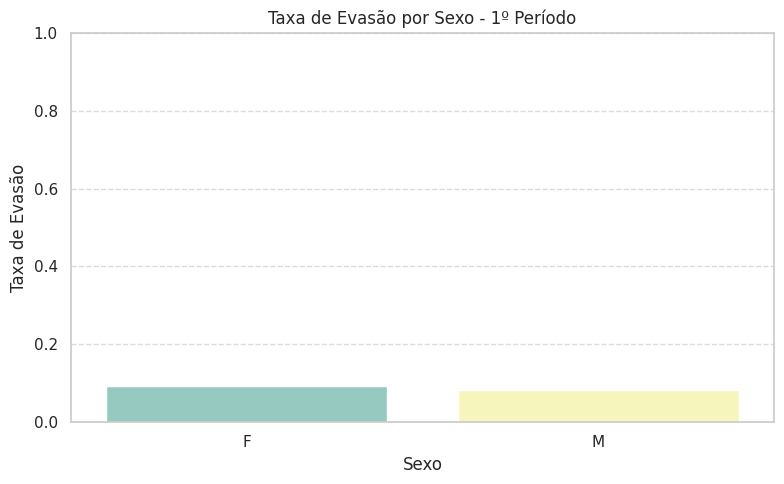

/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              58   0.025439        0.241379
Divorciado           3   0.001316        0.000000
Nan                  7   0.003070        0.857143
Solteiro          2212   0.970175        0.079114


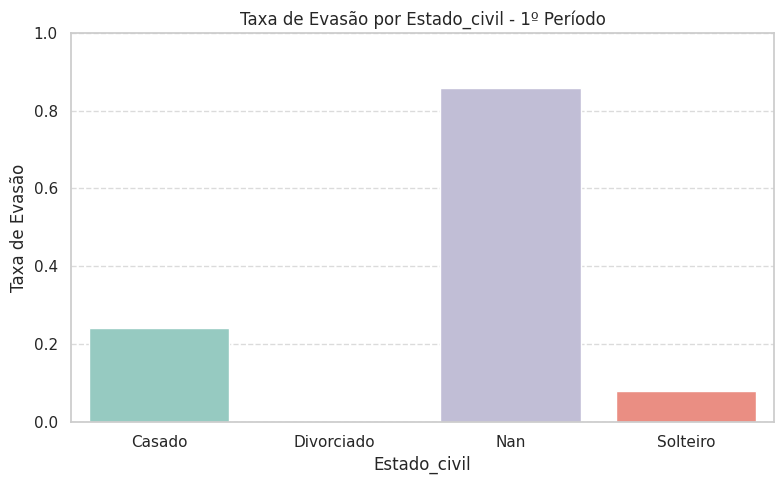


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022368        0.156863
Branca        1157   0.507456        0.069144
Indígena         4   0.001754        0.000000
Nan             28   0.012281        0.428571
Parda          932   0.408772        0.086910
Preta          108   0.047368        0.129630


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


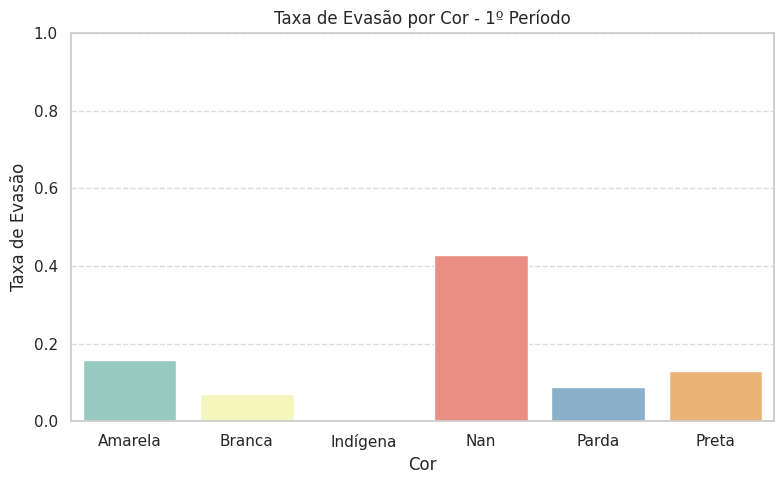


📘 Idade - Média: 27.76, Desvio Padrão: 5.12


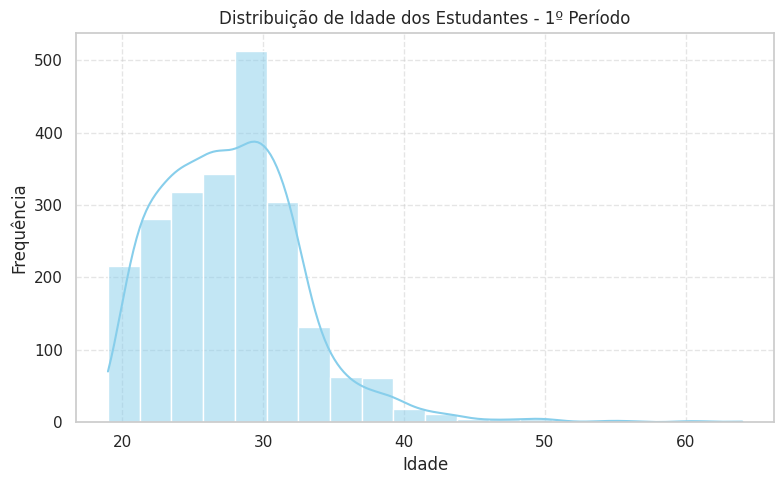

/tmp/ipykernel_1516507/1779100587.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='Pastel1')


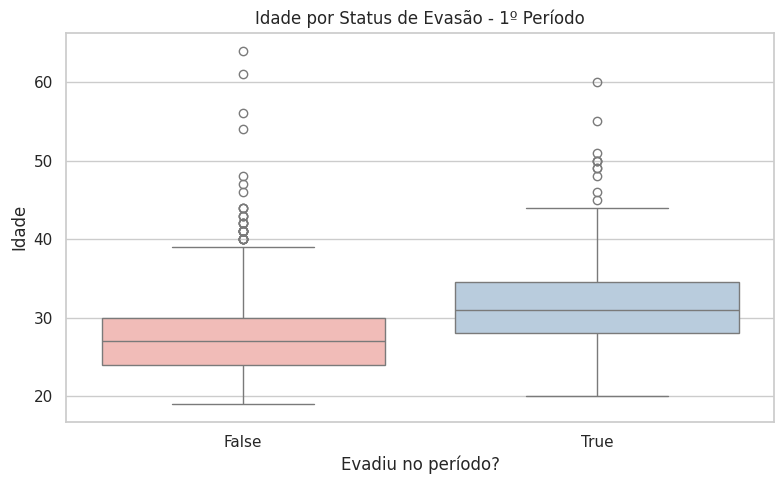

/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



--- Análise das variáveis no 2º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          399      0.175        0.055138
M         1881      0.825        0.062733


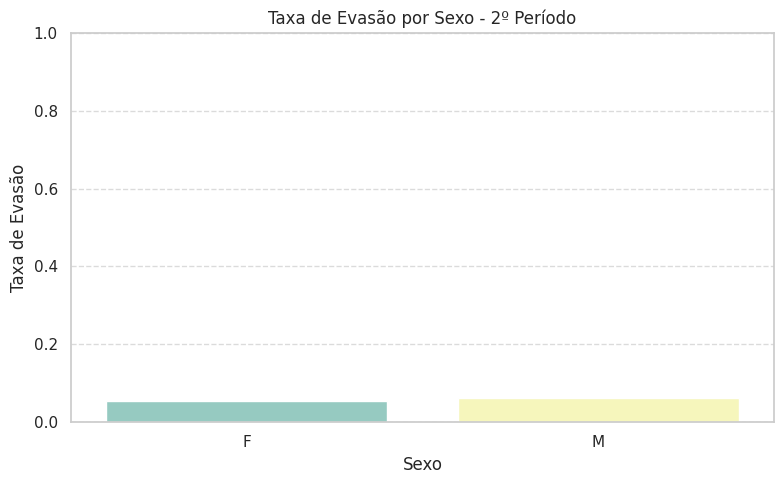

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              58   0.025439        0.120690
Divorciado           3   0.001316        0.000000
Nan                  7   0.003070        0.000000
Solteiro          2212   0.970175        0.060127


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


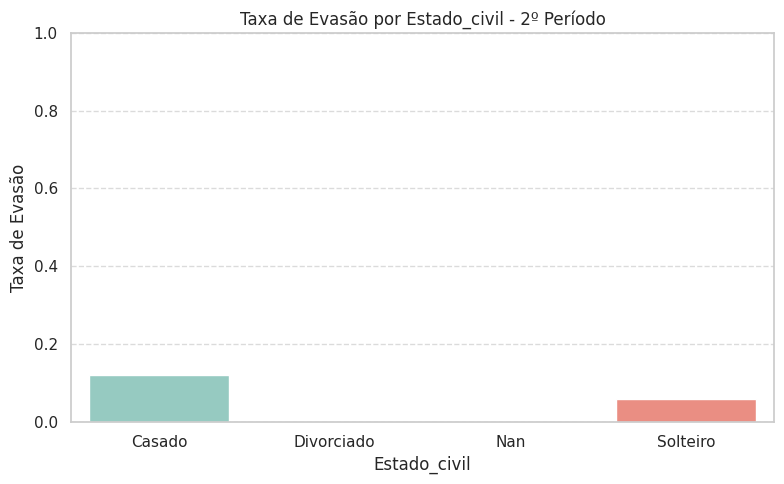


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022368        0.019608
Branca        1157   0.507456        0.059637
Indígena         4   0.001754        0.000000
Nan             28   0.012281        0.071429
Parda          932   0.408772        0.056867
Preta          108   0.047368        0.138889


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


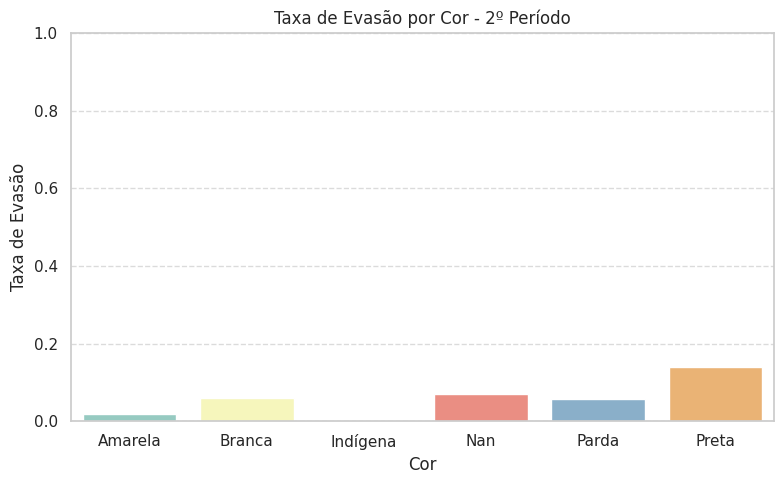


📘 Idade - Média: 27.76, Desvio Padrão: 5.12


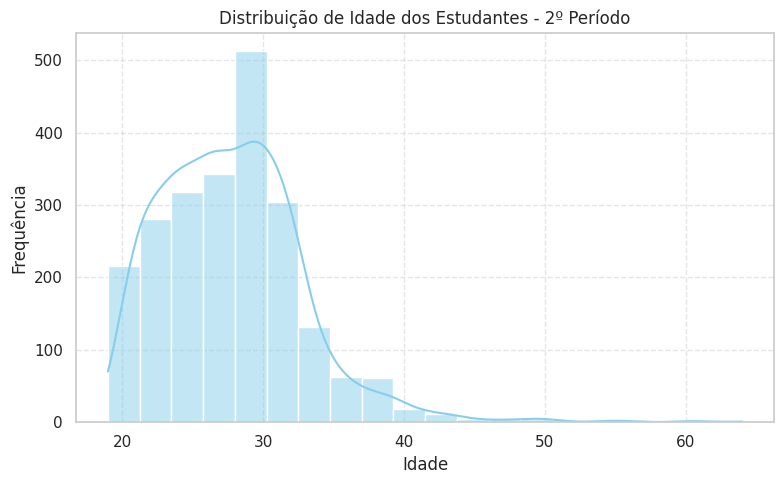

/tmp/ipykernel_1516507/1779100587.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='Pastel1')


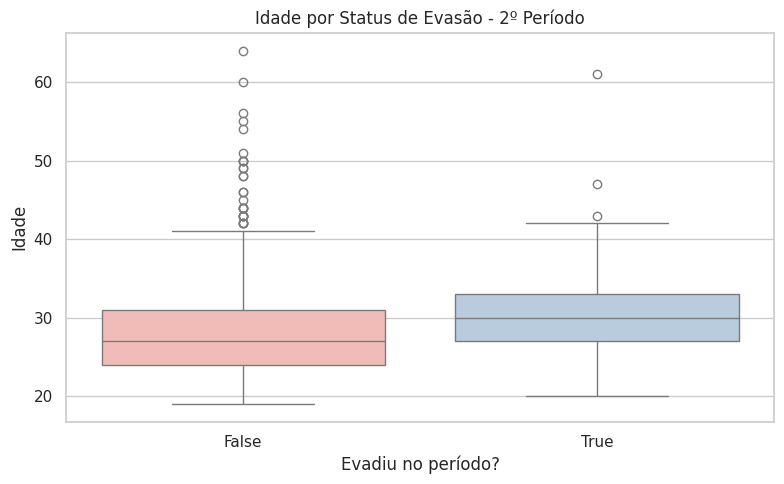

/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



--- Análise das variáveis no 3º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          399      0.175        0.045113
M         1881      0.825        0.058480


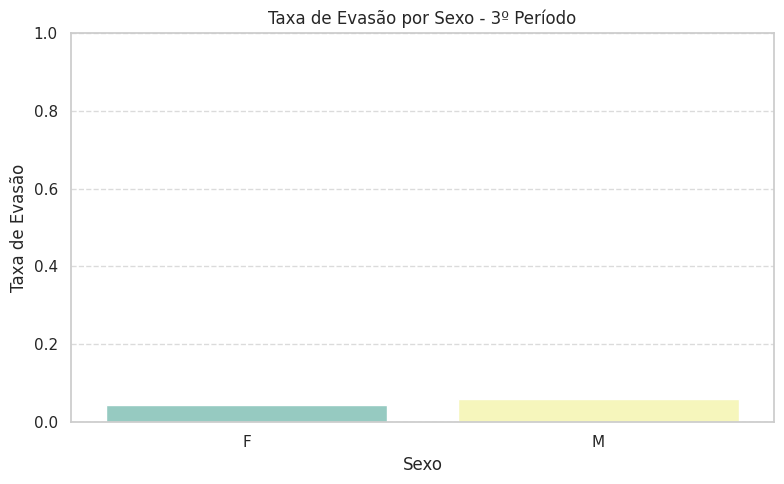

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              58   0.025439        0.051724
Divorciado           3   0.001316        0.666667
Nan                  7   0.003070        0.000000
Solteiro          2212   0.970175        0.055606


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


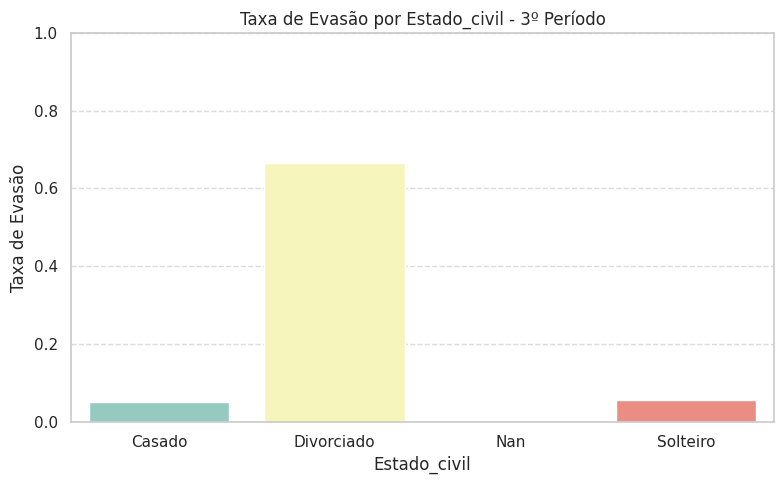


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022368        0.078431
Branca        1157   0.507456        0.056180
Indígena         4   0.001754        0.500000
Nan             28   0.012281        0.035714
Parda          932   0.408772        0.054721
Preta          108   0.047368        0.046296


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


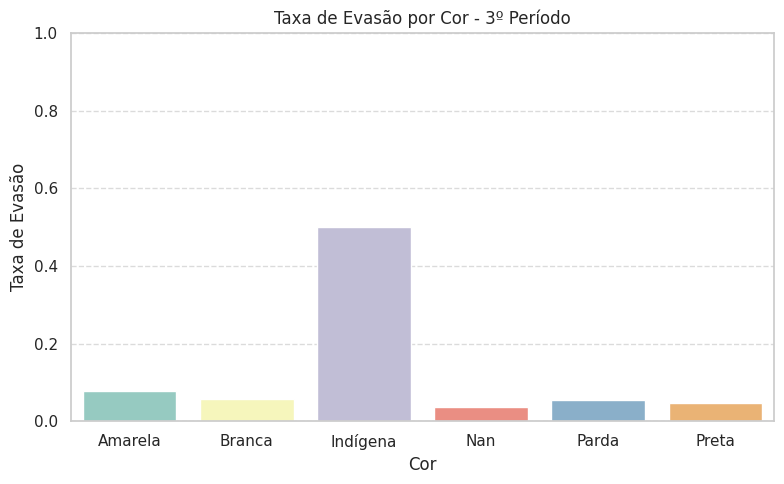


📘 Idade - Média: 27.76, Desvio Padrão: 5.12


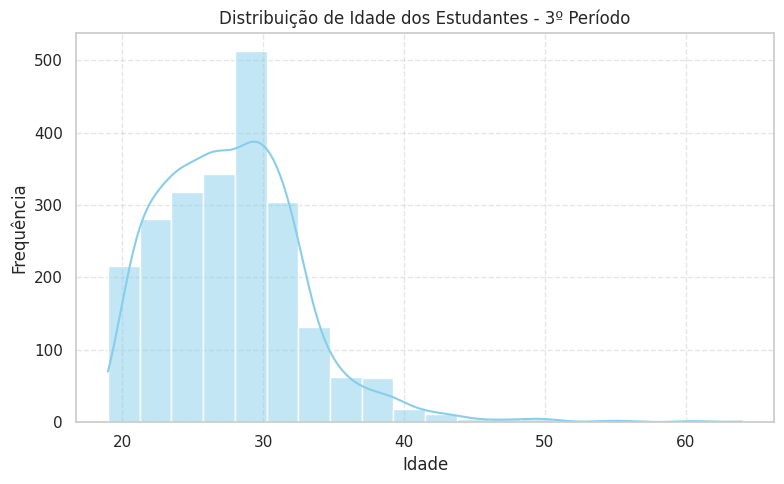

/tmp/ipykernel_1516507/1779100587.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='Pastel1')


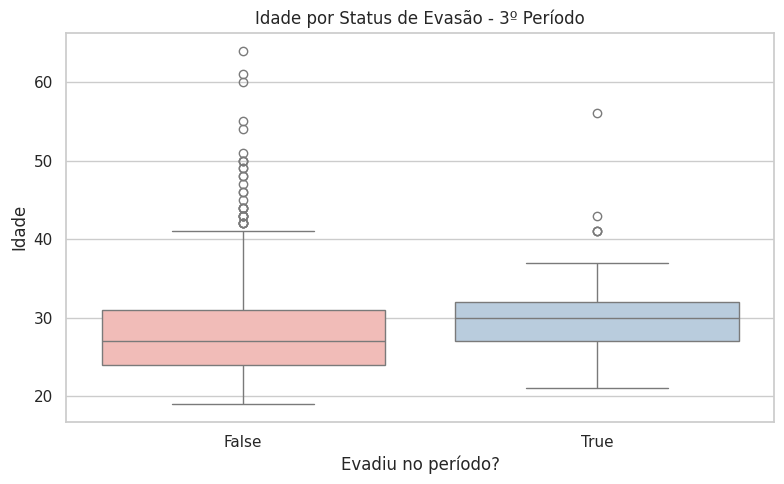

/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



--- Análise das variáveis no 4º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          399      0.175        0.057644
M         1881      0.825        0.071770


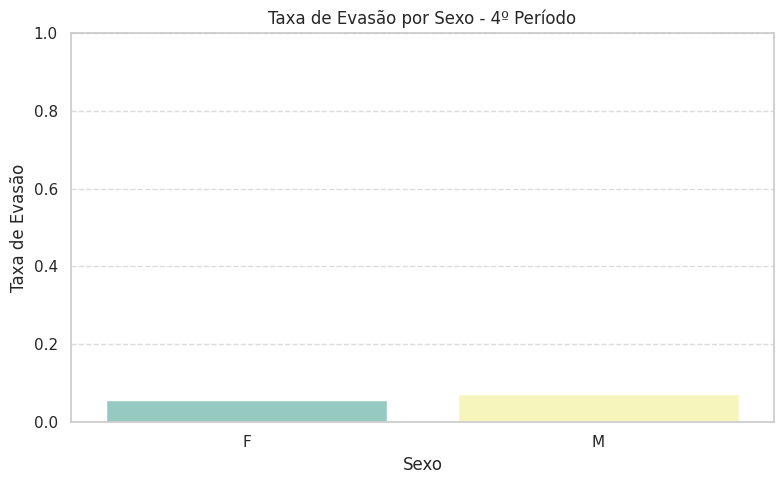

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              58   0.025439        0.051724
Divorciado           3   0.001316        0.000000
Nan                  7   0.003070        0.000000
Solteiro          2212   0.970175        0.070072


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


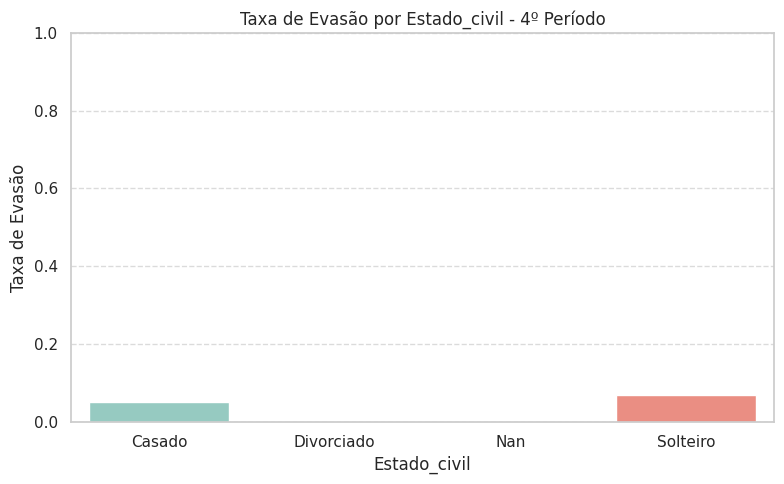


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022368        0.117647
Branca        1157   0.507456        0.067416
Indígena         4   0.001754        0.000000
Nan             28   0.012281        0.178571
Parda          932   0.408772        0.065451
Preta          108   0.047368        0.074074


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


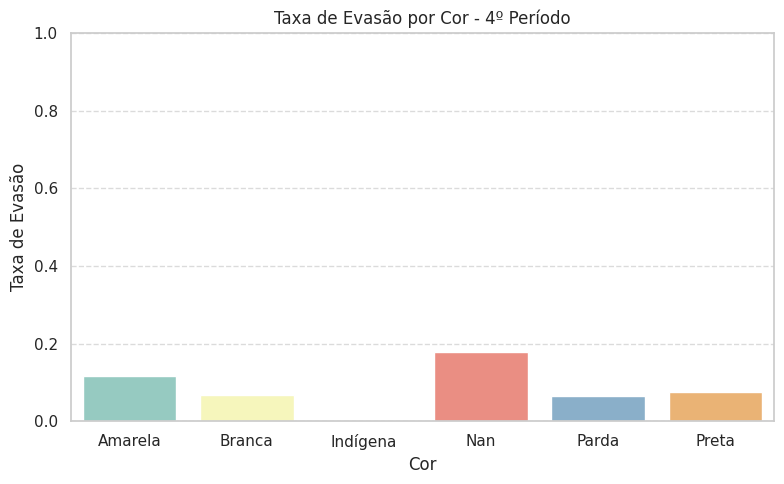


📘 Idade - Média: 27.76, Desvio Padrão: 5.12


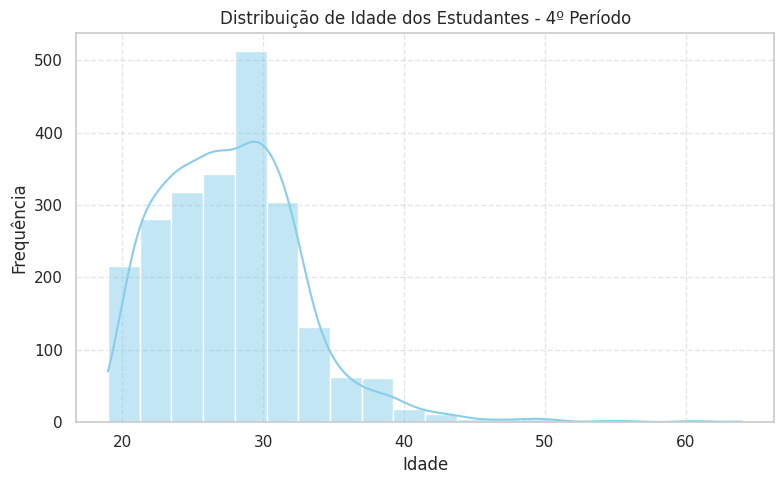

/tmp/ipykernel_1516507/1779100587.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='Pastel1')


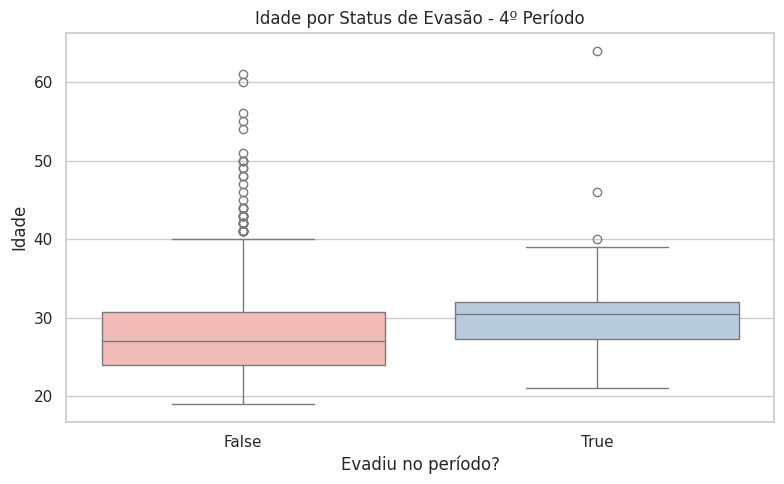

/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



📘📘📘 TABELA: ALUNOS 📘📘📘

--- Análise das variáveis no 1º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          230   0.175976        0.117391
M         1077   0.824024        0.089136


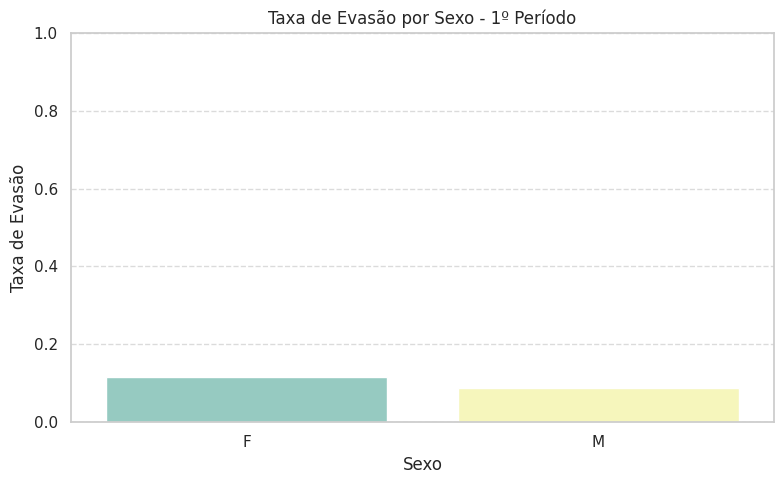

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              42   0.032135        0.238095
Divorciado           2   0.001530        0.000000
Nan                 54   0.041316        0.055556
Solteiro          1208   0.924254        0.091060
Viúvo                1   0.000765        0.000000


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


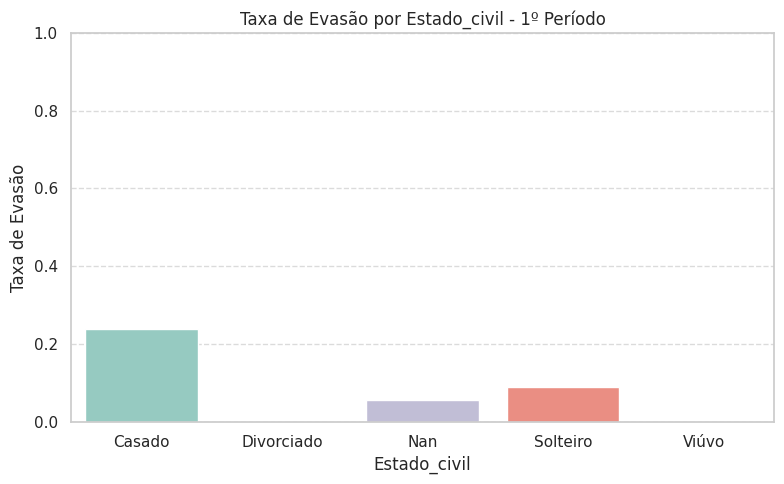


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.027544        0.194444
Branca         688   0.526396        0.072674
Indígena         4   0.003060        0.000000
Nan             74   0.056618        0.094595
Parda          445   0.340474        0.105618
Preta           60   0.045907        0.200000


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


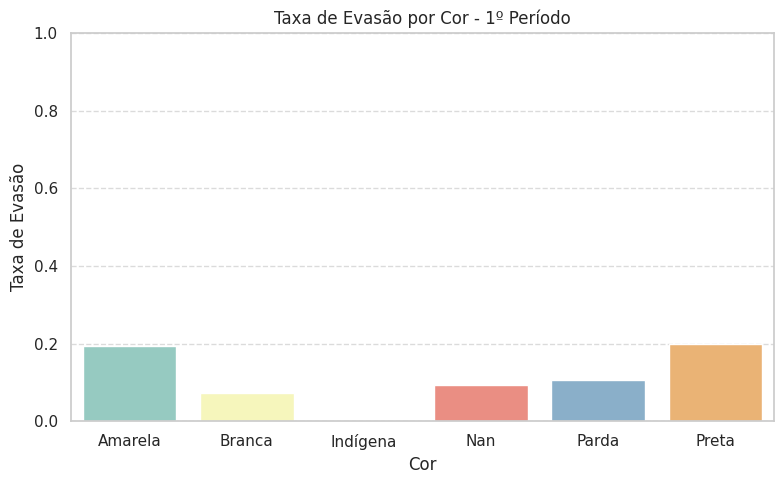


📘 Idade - Média: 30.05, Desvio Padrão: 5.54


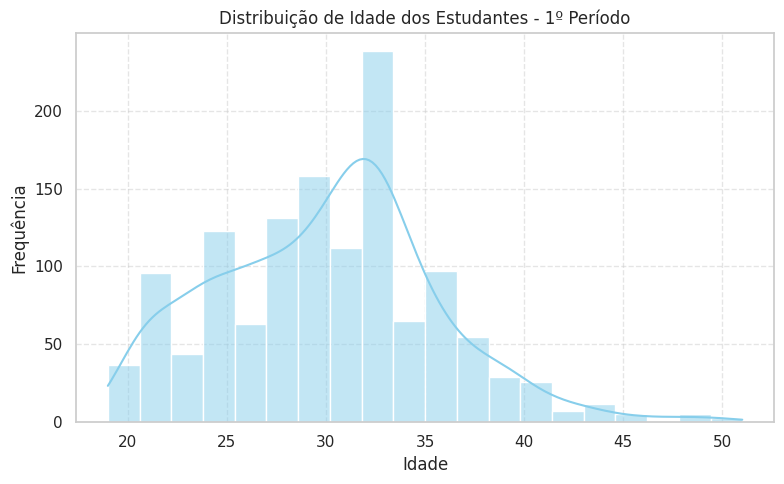

/tmp/ipykernel_1516507/1779100587.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='Pastel1')


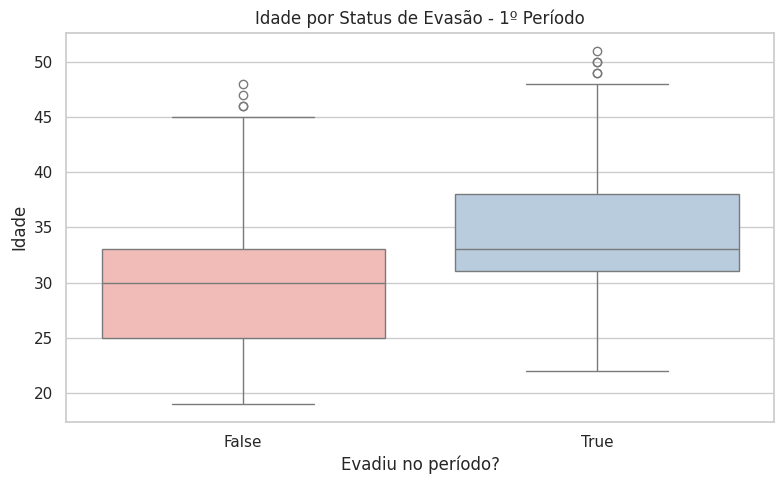


--- Análise das variáveis no 2º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          230   0.175976        0.078261
M         1077   0.824024        0.076137


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


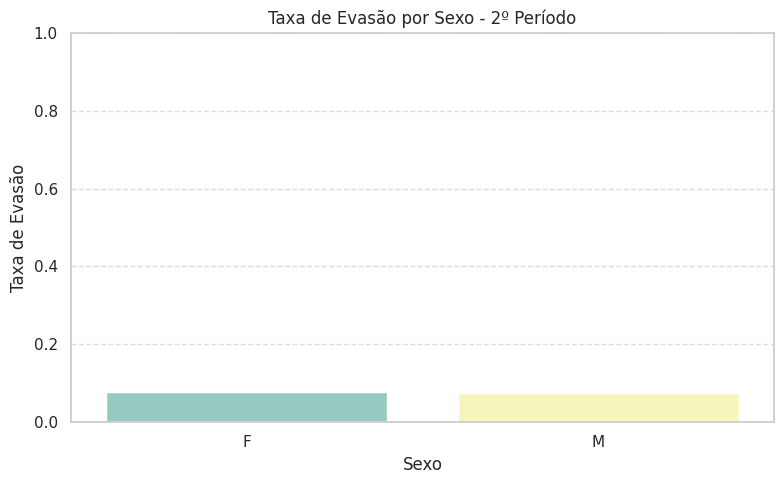

/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              42   0.032135        0.142857
Divorciado           2   0.001530        0.000000
Nan                 54   0.041316        0.000000
Solteiro          1208   0.924254        0.077815
Viúvo                1   0.000765        0.000000


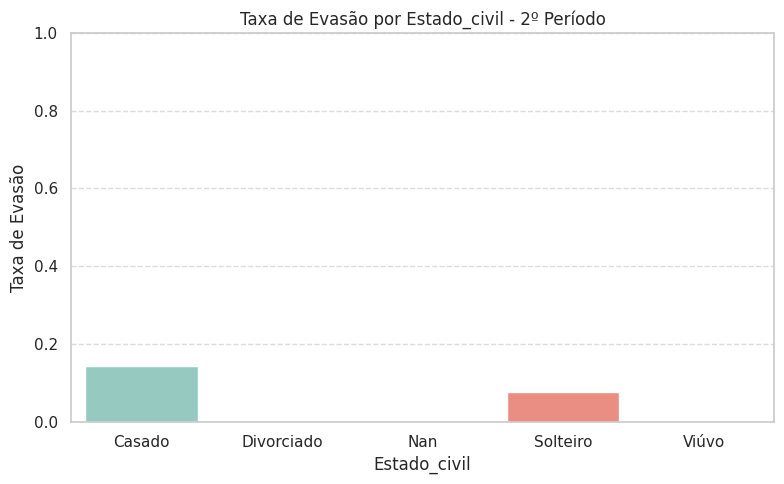


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.027544        0.000000
Branca         688   0.526396        0.063953
Indígena         4   0.003060        0.000000
Nan             74   0.056618        0.040541
Parda          445   0.340474        0.094382
Preta           60   0.045907        0.183333


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


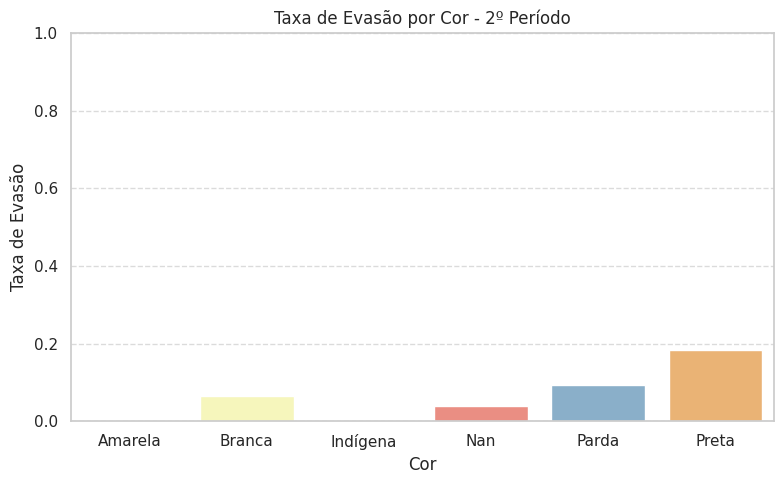


📘 Idade - Média: 30.05, Desvio Padrão: 5.54


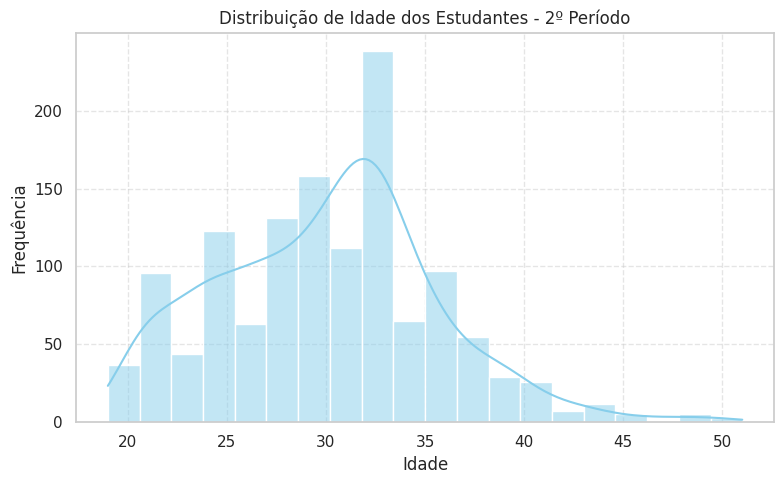

/tmp/ipykernel_1516507/1779100587.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='Pastel1')


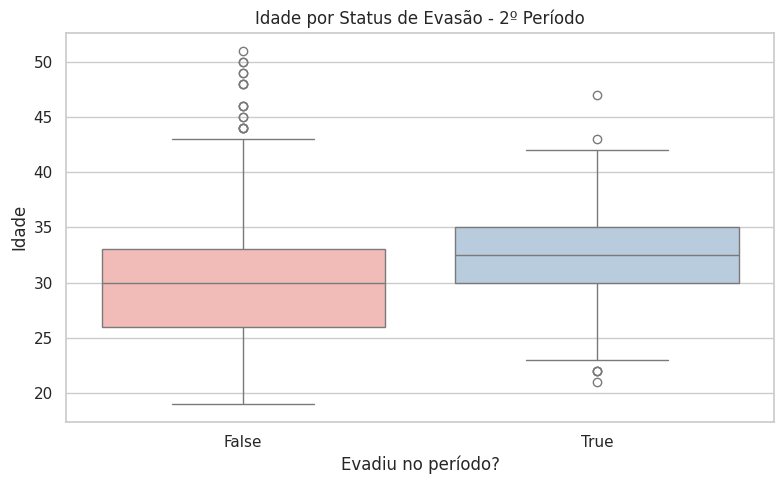

/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



--- Análise das variáveis no 3º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          230   0.175976        0.043478
M         1077   0.824024        0.073352


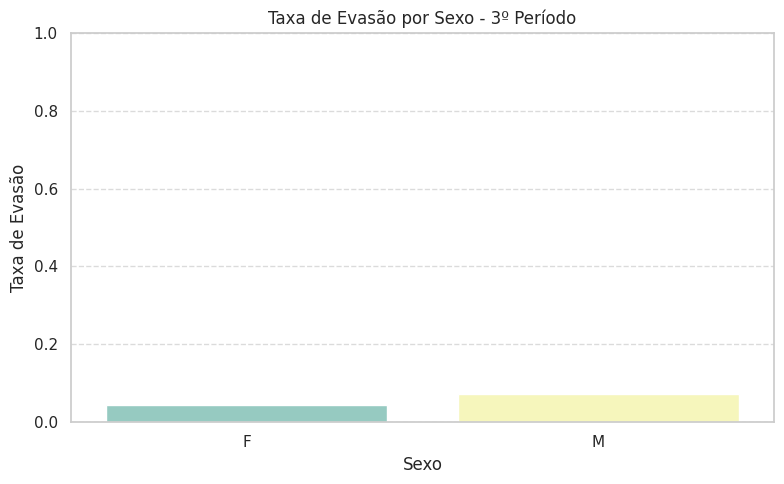

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              42   0.032135        0.047619
Divorciado           2   0.001530        1.000000
Nan                 54   0.041316        0.000000
Solteiro          1208   0.924254        0.070364
Viúvo                1   0.000765        0.000000


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


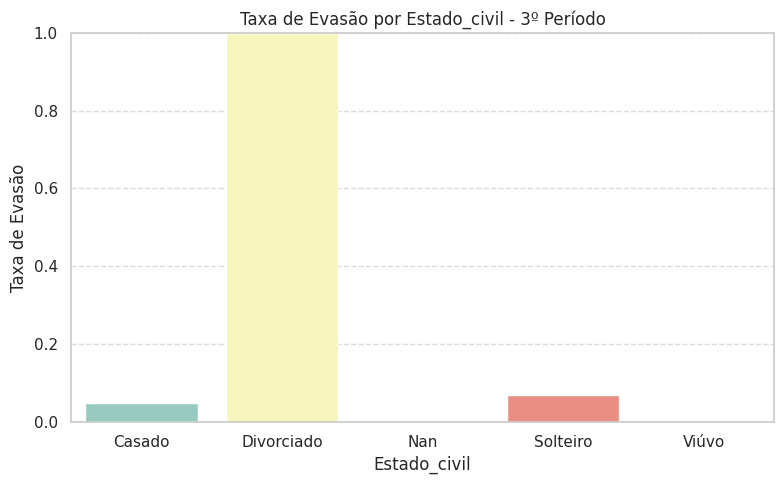


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.027544        0.166667
Branca         688   0.526396        0.065407
Indígena         4   0.003060        0.250000
Nan             74   0.056618        0.054054
Parda          445   0.340474        0.065169
Preta           60   0.045907        0.066667


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


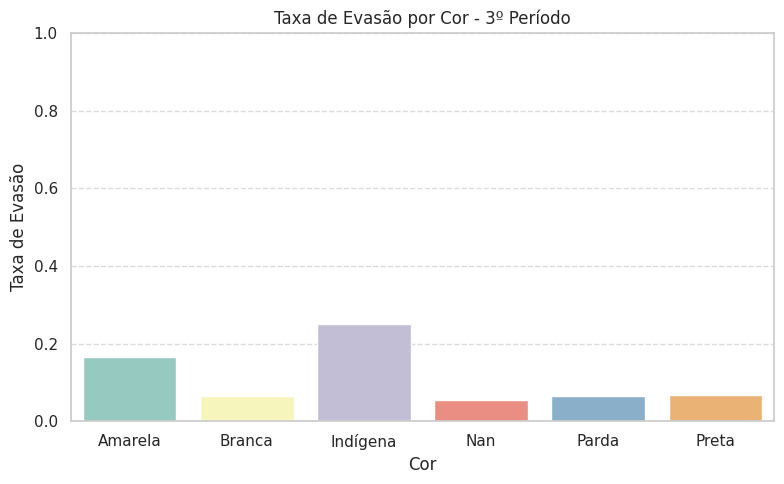


📘 Idade - Média: 30.05, Desvio Padrão: 5.54


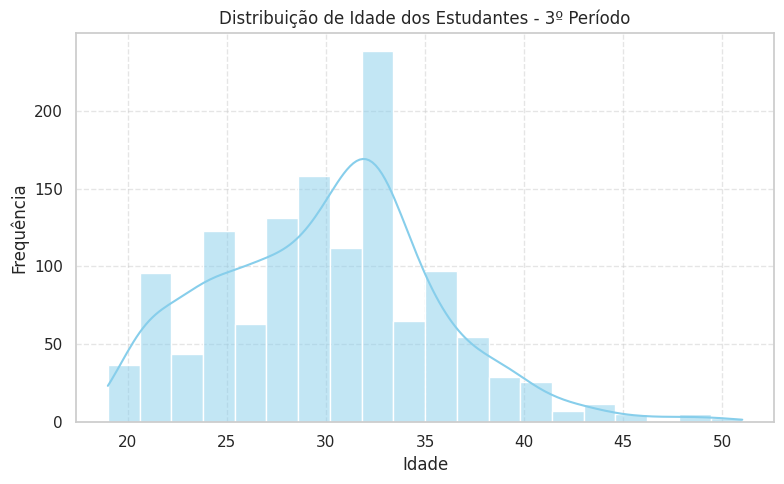

/tmp/ipykernel_1516507/1779100587.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='Pastel1')


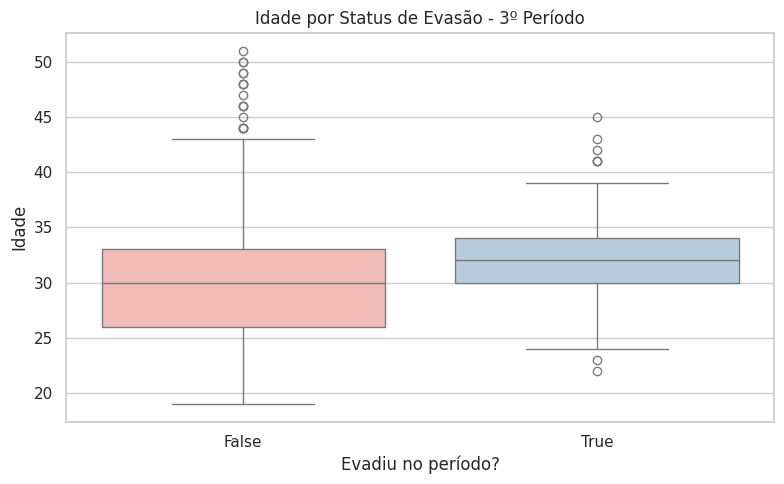

/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



--- Análise das variáveis no 4º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          230   0.175976        0.056522
M         1077   0.824024        0.091922


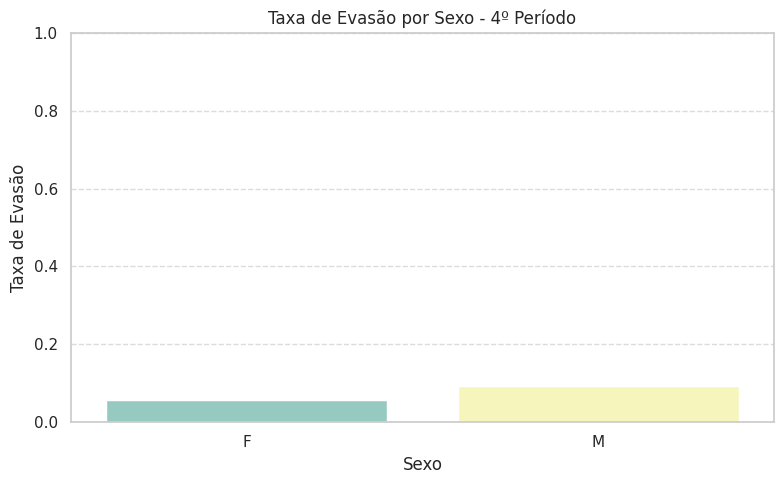

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              42   0.032135        0.047619
Divorciado           2   0.001530        0.000000
Nan                 54   0.041316        0.000000
Solteiro          1208   0.924254        0.091060
Viúvo                1   0.000765        0.000000


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


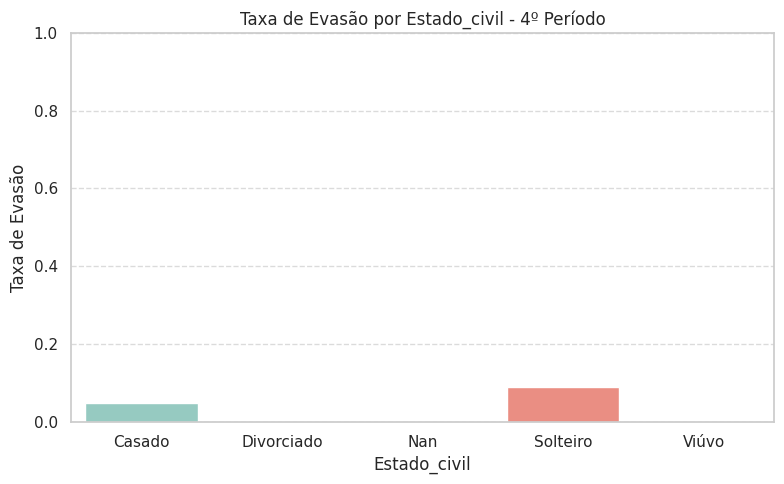


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.027544        0.111111
Branca         688   0.526396        0.091570
Indígena         4   0.003060        0.000000
Nan             74   0.056618        0.054054
Parda          445   0.340474        0.083146
Preta           60   0.045907        0.066667


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


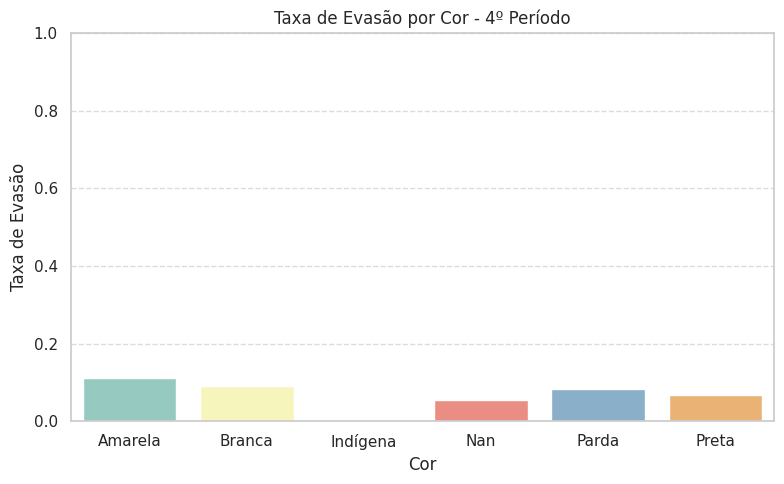


📘 Idade - Média: 30.05, Desvio Padrão: 5.54


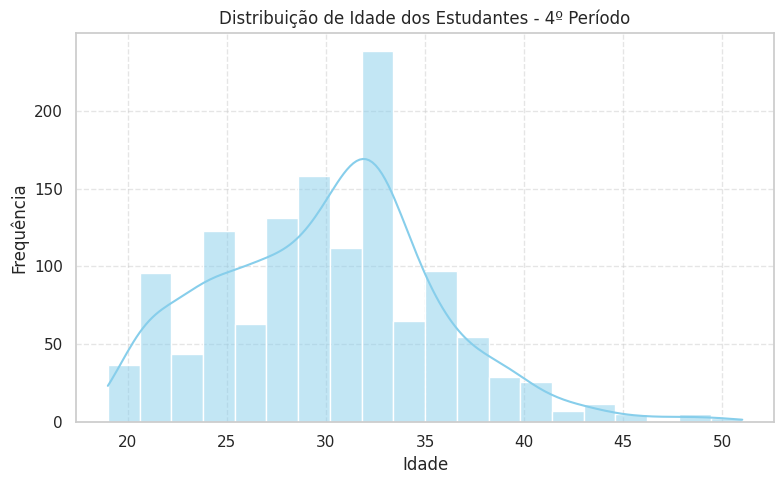

/tmp/ipykernel_1516507/1779100587.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='Pastel1')


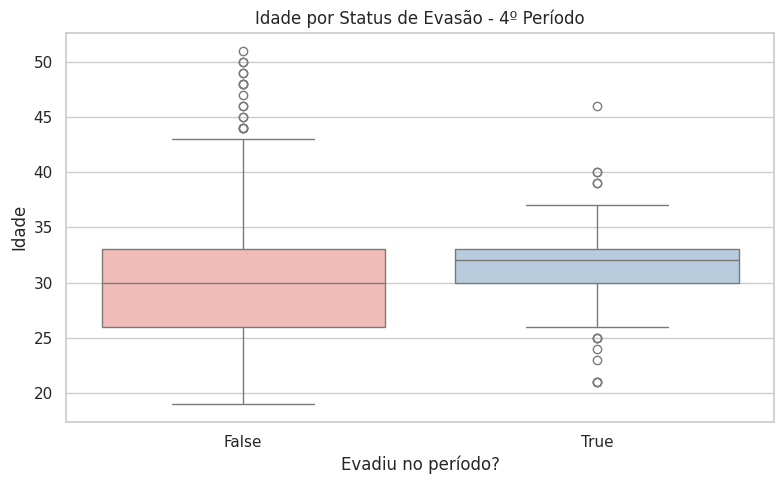

/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



📘📘📘 TABELA: ALUNOS-MATRICULADOS 📘📘📘

--- Análise das variáveis no 1º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          208   0.165605        0.129808
M         1048   0.834395        0.091603


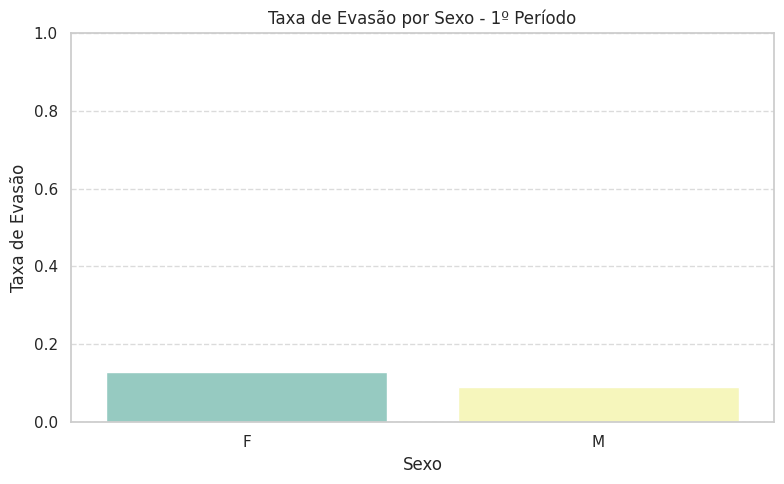

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              41   0.032643        0.243902
Divorciado           2   0.001592        0.000000
Nan                  4   0.003185        0.750000
Solteiro          1208   0.961783        0.091060
Viúvo                1   0.000796        0.000000


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


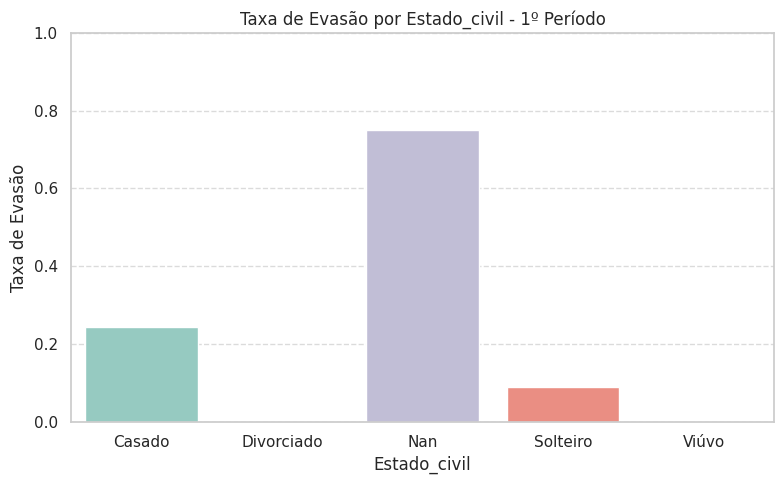


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.028662        0.194444
Branca         688   0.547771        0.072674
Indígena         4   0.003185        0.000000
Nan             24   0.019108        0.291667
Parda          444   0.353503        0.105856
Preta           60   0.047771        0.200000


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


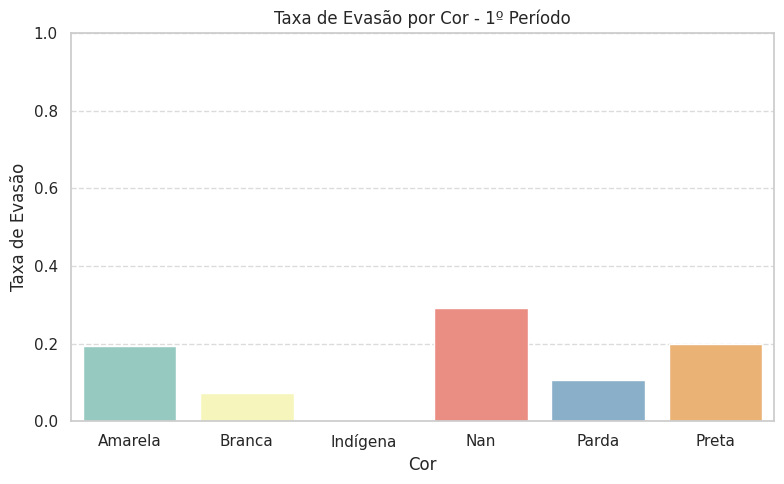


📘 Idade - Média: 30.30, Desvio Padrão: 5.41


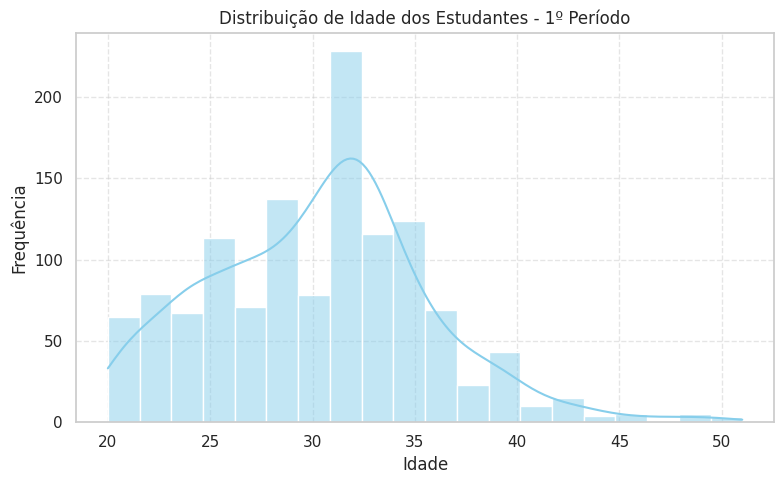

/tmp/ipykernel_1516507/1779100587.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='Pastel1')


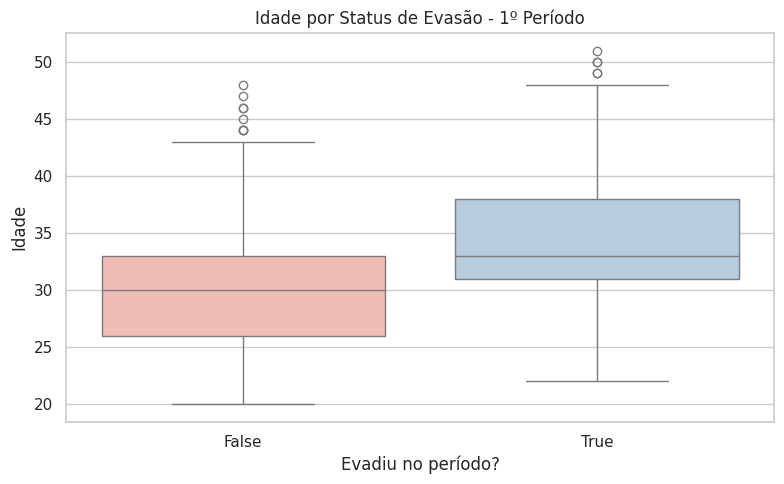

/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



--- Análise das variáveis no 2º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          208   0.165605        0.086538
M         1048   0.834395        0.078244


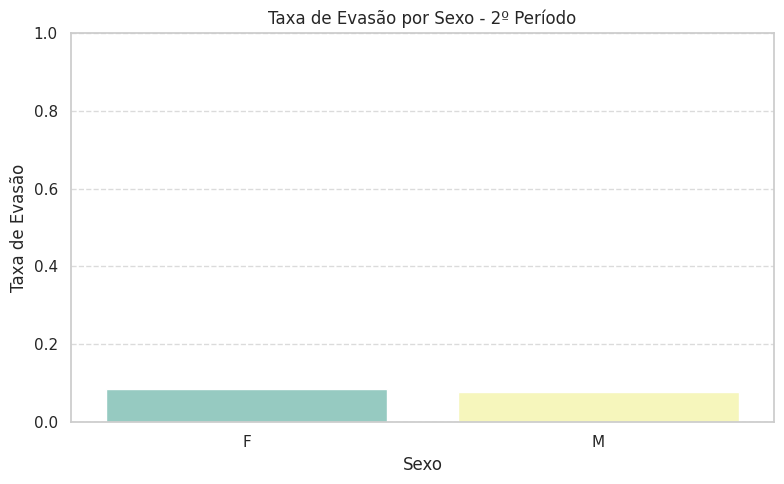

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              41   0.032643        0.146341
Divorciado           2   0.001592        0.000000
Nan                  4   0.003185        0.000000
Solteiro          1208   0.961783        0.077815
Viúvo                1   0.000796        0.000000


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


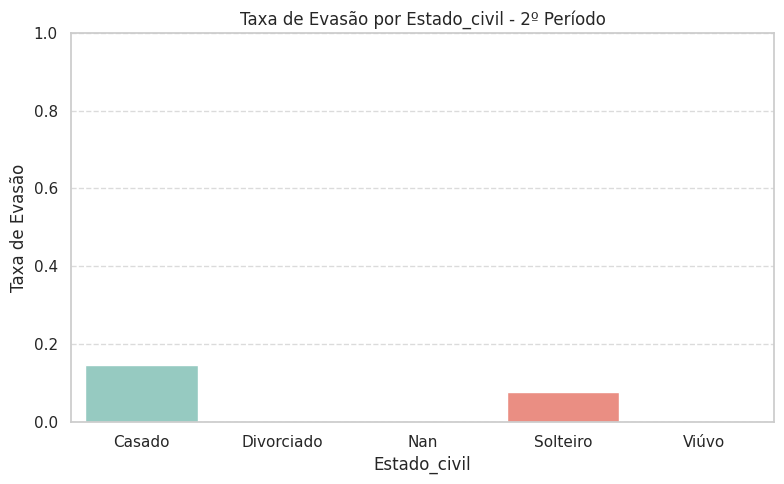

/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.028662        0.000000
Branca         688   0.547771        0.063953
Indígena         4   0.003185        0.000000
Nan             24   0.019108        0.125000
Parda          444   0.353503        0.094595
Preta           60   0.047771        0.183333


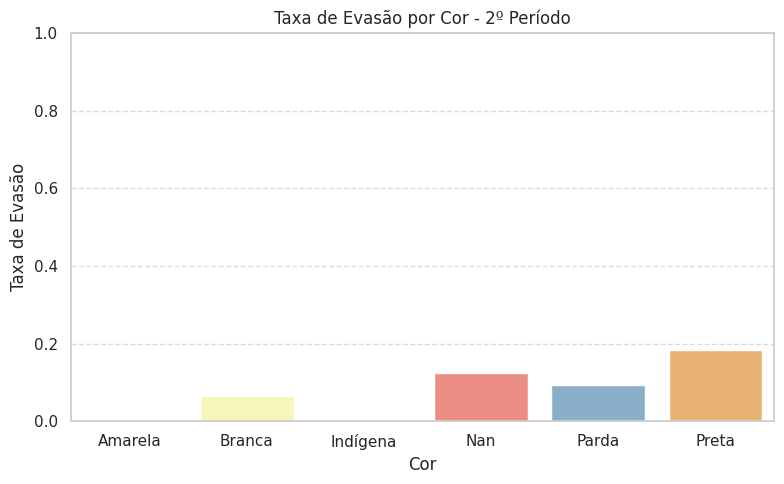


📘 Idade - Média: 30.30, Desvio Padrão: 5.41


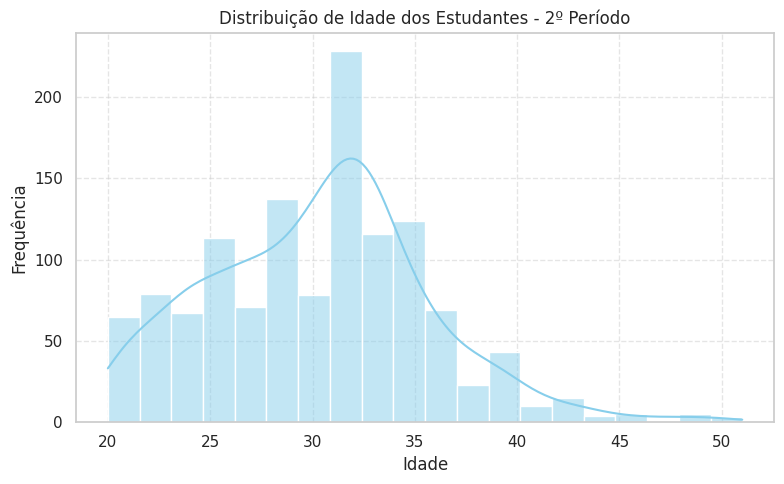

/tmp/ipykernel_1516507/1779100587.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='Pastel1')


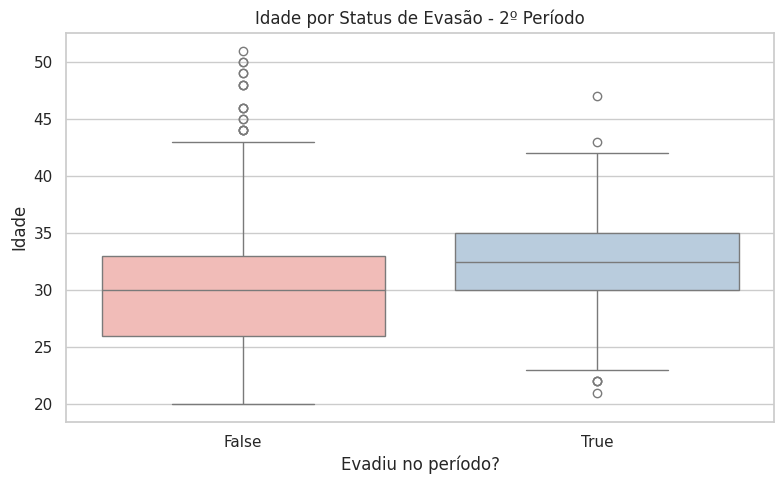

/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



--- Análise das variáveis no 3º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          208   0.165605        0.048077
M         1048   0.834395        0.075382


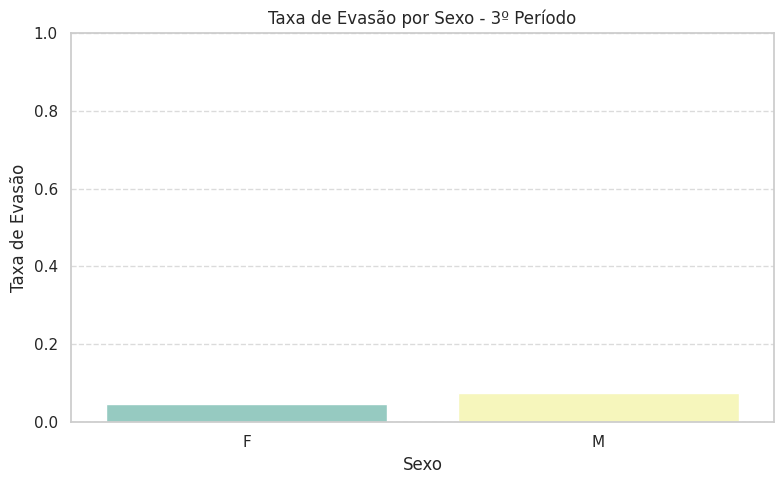

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              41   0.032643        0.048780
Divorciado           2   0.001592        1.000000
Nan                  4   0.003185        0.000000
Solteiro          1208   0.961783        0.070364
Viúvo                1   0.000796        0.000000


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


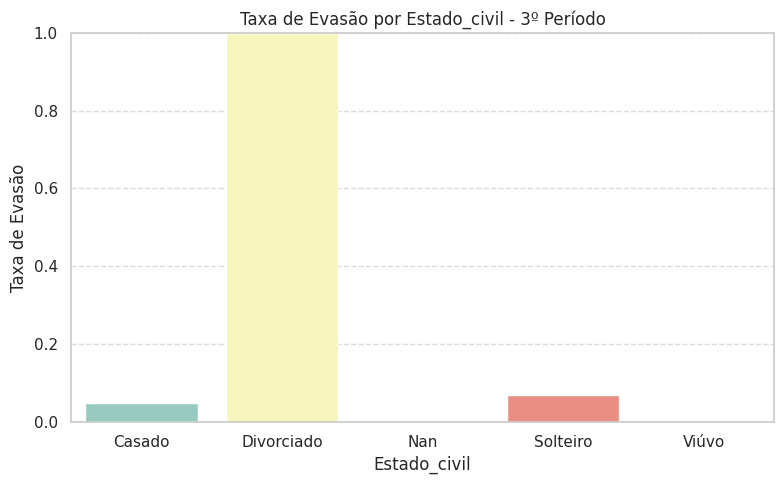


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.028662        0.166667
Branca         688   0.547771        0.065407
Indígena         4   0.003185        0.250000
Nan             24   0.019108        0.166667
Parda          444   0.353503        0.065315
Preta           60   0.047771        0.066667


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


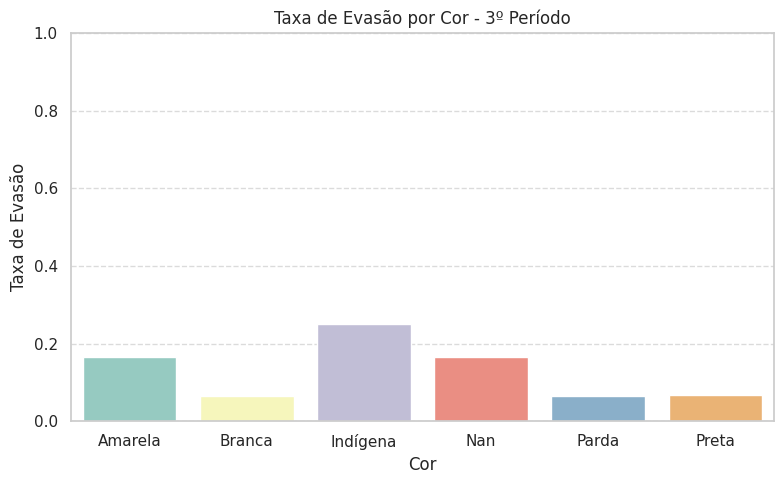


📘 Idade - Média: 30.30, Desvio Padrão: 5.41


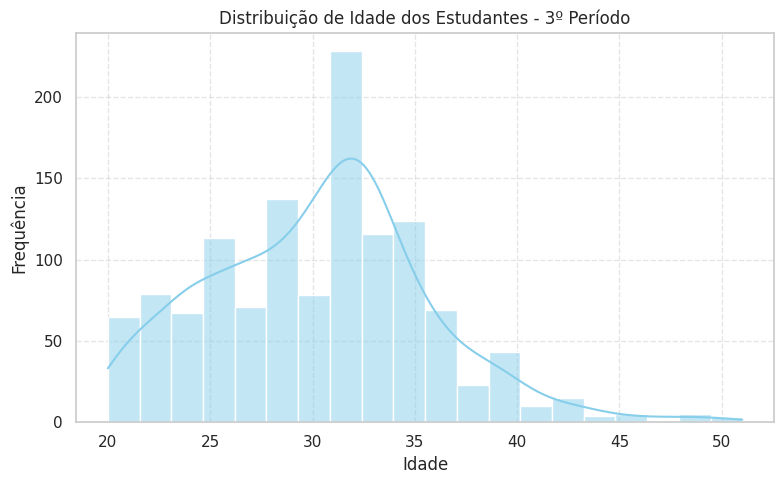

/tmp/ipykernel_1516507/1779100587.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='Pastel1')


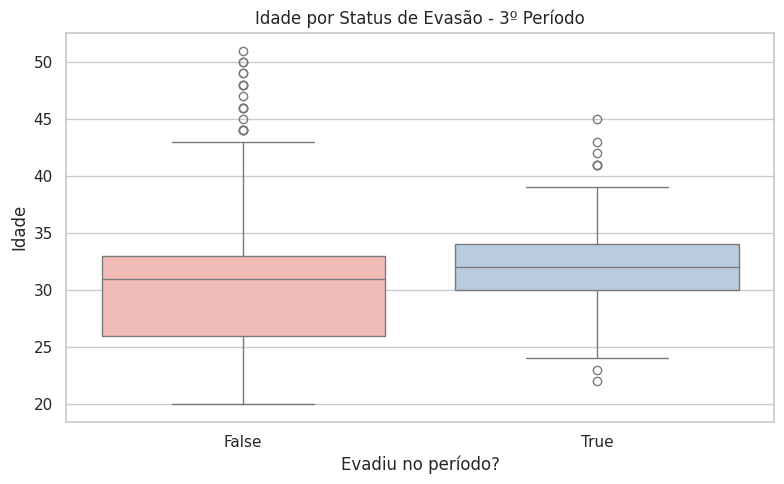

/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



--- Análise das variáveis no 4º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          208   0.165605        0.062500
M         1048   0.834395        0.094466


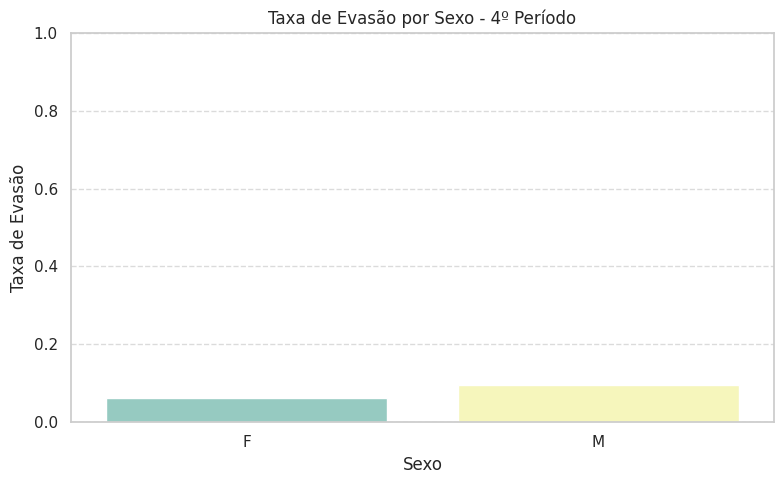

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              41   0.032643         0.04878
Divorciado           2   0.001592         0.00000
Nan                  4   0.003185         0.00000
Solteiro          1208   0.961783         0.09106
Viúvo                1   0.000796         0.00000


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


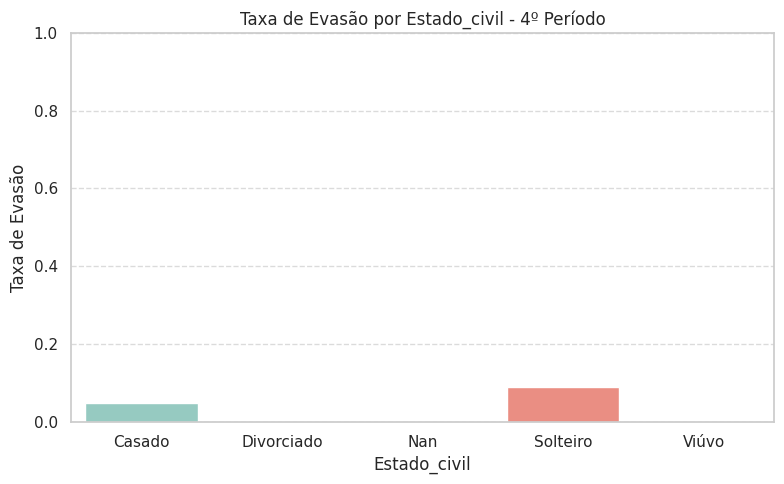


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.028662        0.111111
Branca         688   0.547771        0.091570
Indígena         4   0.003185        0.000000
Nan             24   0.019108        0.166667
Parda          444   0.353503        0.083333
Preta           60   0.047771        0.066667


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


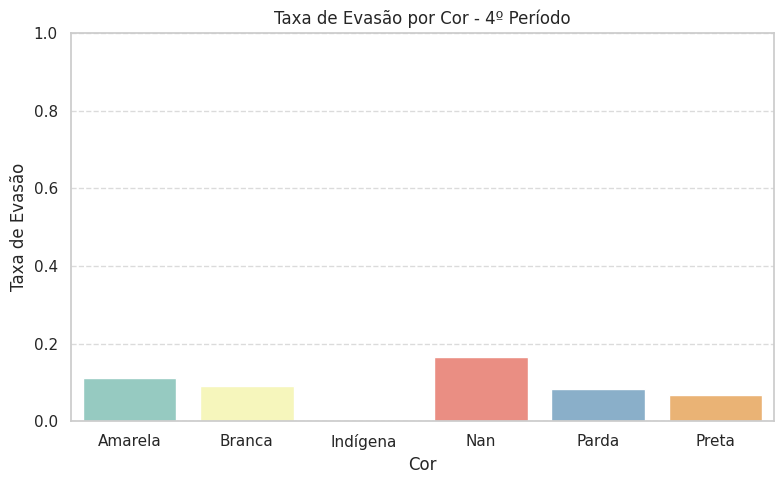


📘 Idade - Média: 30.30, Desvio Padrão: 5.41


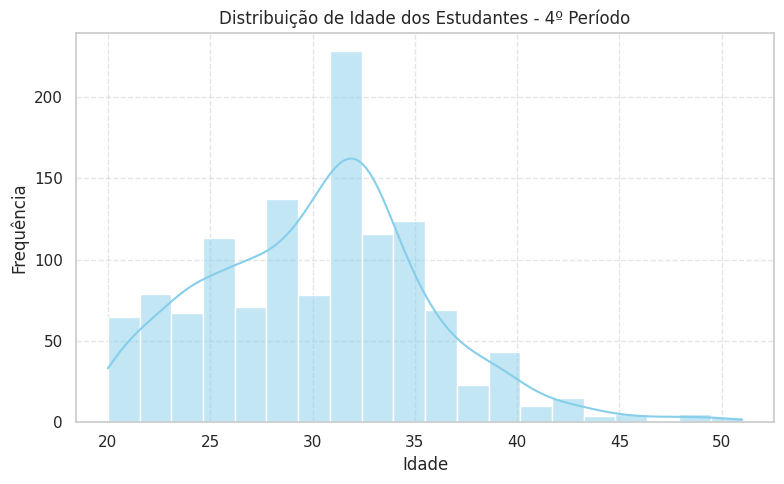

/tmp/ipykernel_1516507/1779100587.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='Pastel1')


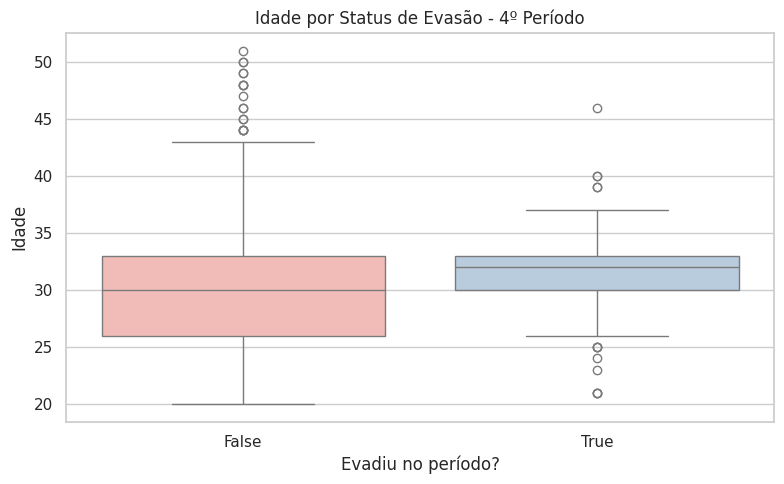

/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



📘📘📘 TABELA: ALUNOS-FINAL 📘📘📘

--- Análise das variáveis no 1º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          400   0.175362        0.090000
M         1881   0.824638        0.082403


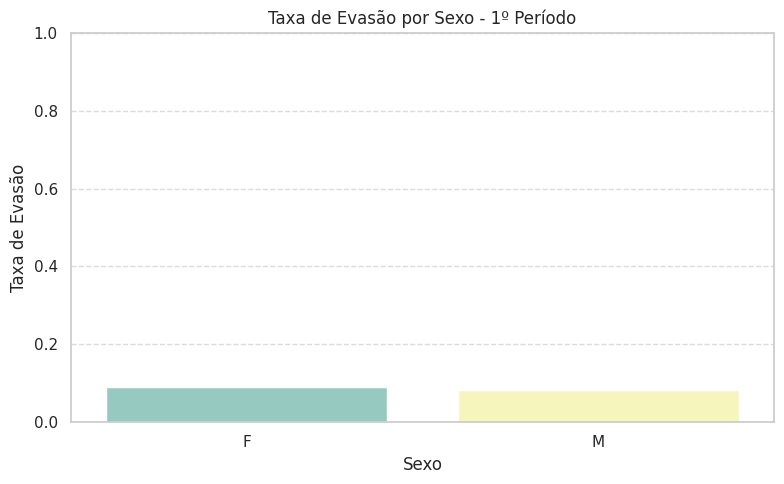

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              59   0.025866        0.220339
Divorciado           3   0.001315        0.000000
Nan                  7   0.003069        0.857143
Solteiro          2212   0.969750        0.077758


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


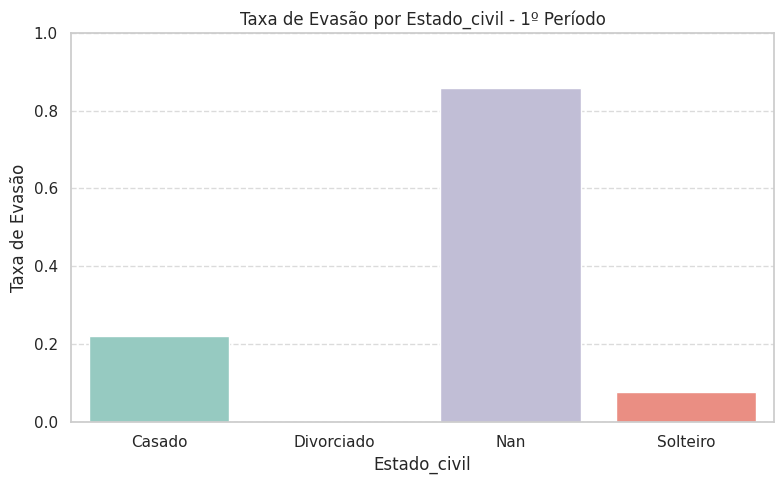

/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022359        0.156863
Branca        1158   0.507672        0.066494
Indígena         4   0.001754        0.000000
Nan             28   0.012275        0.428571
Parda          932   0.408593        0.085837
Preta          108   0.047348        0.129630


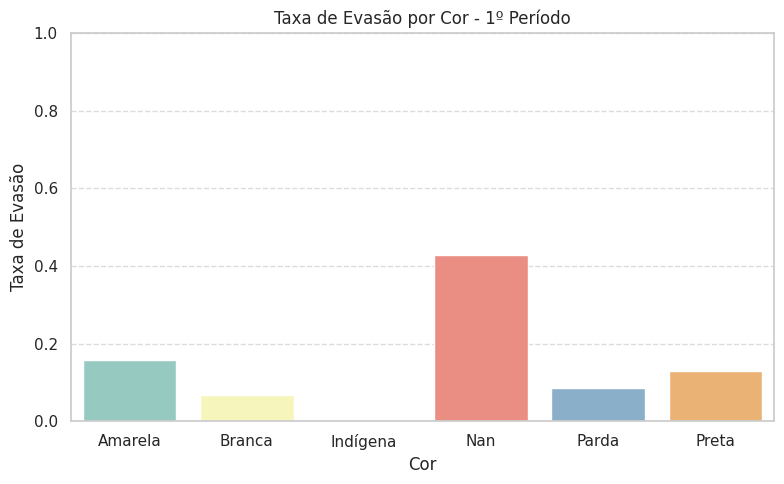

⚠️ Variável idade NÃO encontrada na tabela.

--- Análise das variáveis no 2º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          400   0.175362         0.05000
M         1881   0.824638         0.05529


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


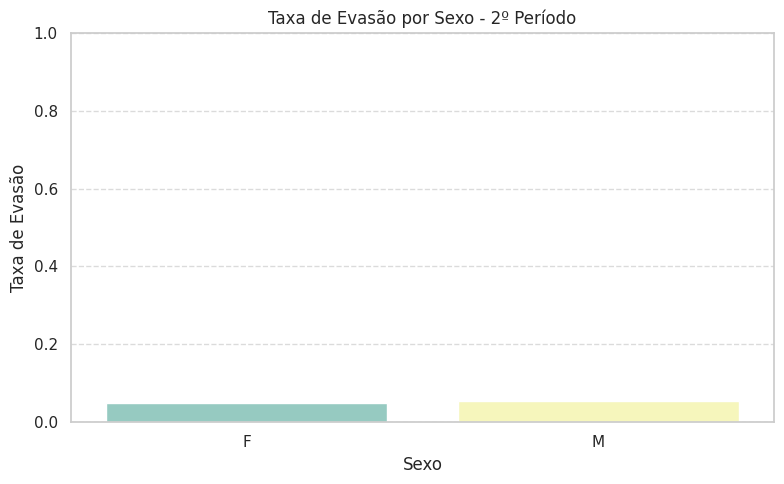

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              59   0.025866        0.135593
Divorciado           3   0.001315        0.000000
Nan                  7   0.003069        0.000000
Solteiro          2212   0.969750        0.052441


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


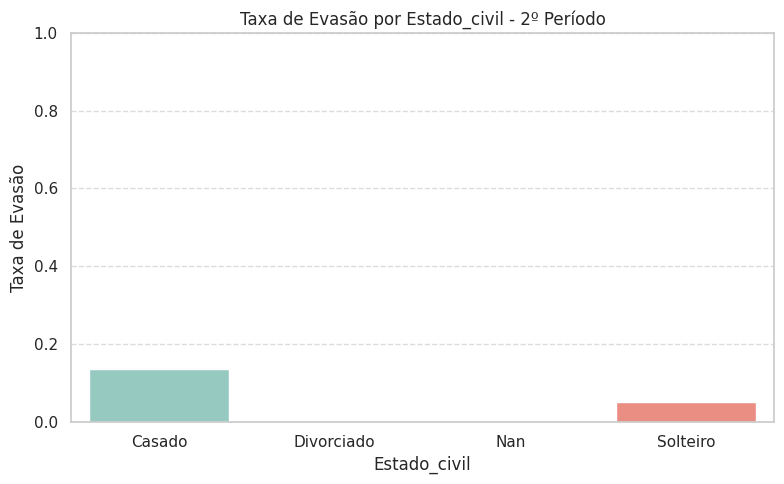


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022359        0.019608
Branca        1158   0.507672        0.055268
Indígena         4   0.001754        0.000000
Nan             28   0.012275        0.071429
Parda          932   0.408593        0.046137
Preta          108   0.047348        0.129630


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


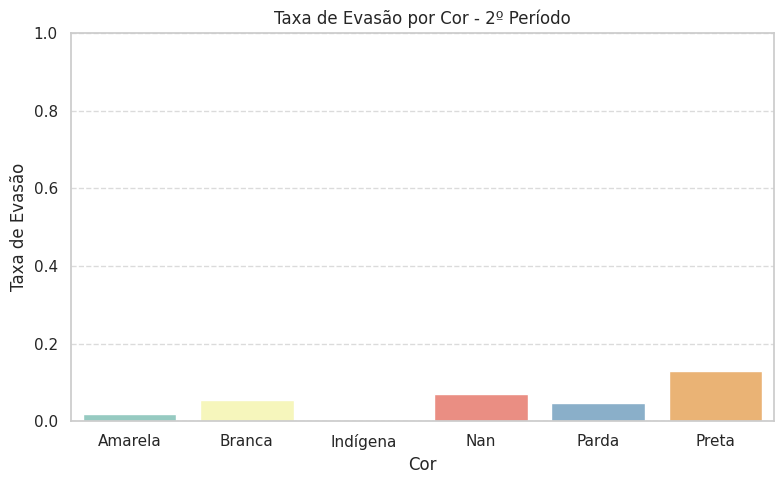

⚠️ Variável idade NÃO encontrada na tabela.

--- Análise das variáveis no 3º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          400   0.175362          0.0450
M         1881   0.824638          0.0521


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


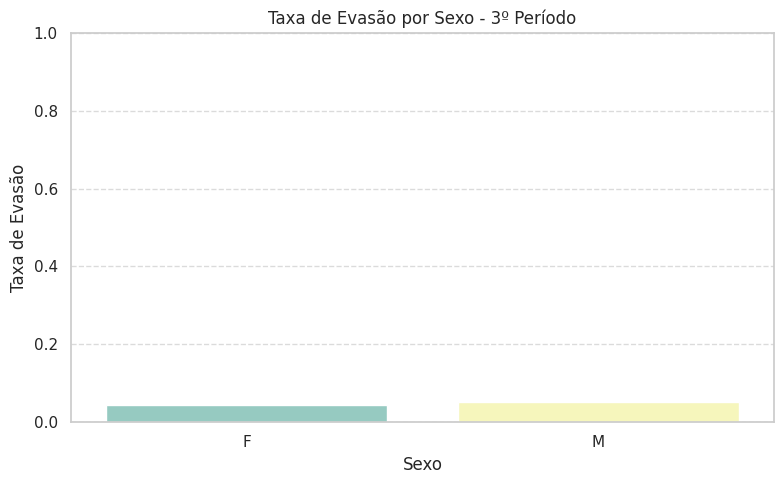

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              59   0.025866        0.050847
Divorciado           3   0.001315        0.666667
Nan                  7   0.003069        0.000000
Solteiro          2212   0.969750        0.050181


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


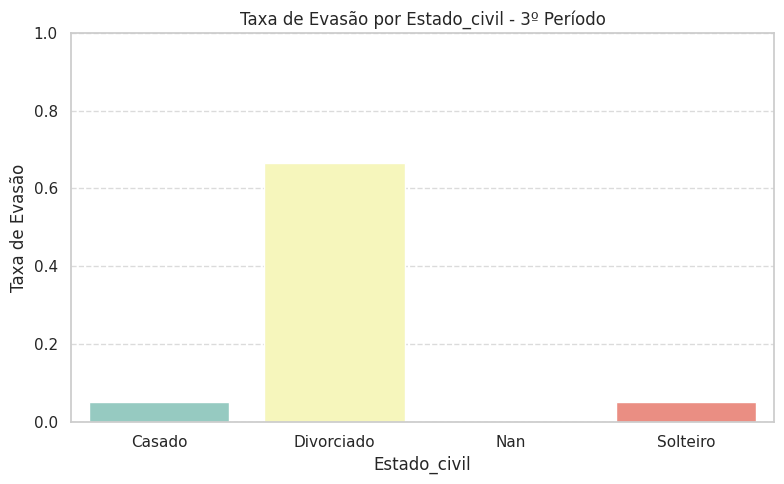


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022359        0.039216
Branca        1158   0.507672        0.050950
Indígena         4   0.001754        0.500000
Nan             28   0.012275        0.035714
Parda          932   0.408593        0.051502
Preta          108   0.047348        0.037037


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


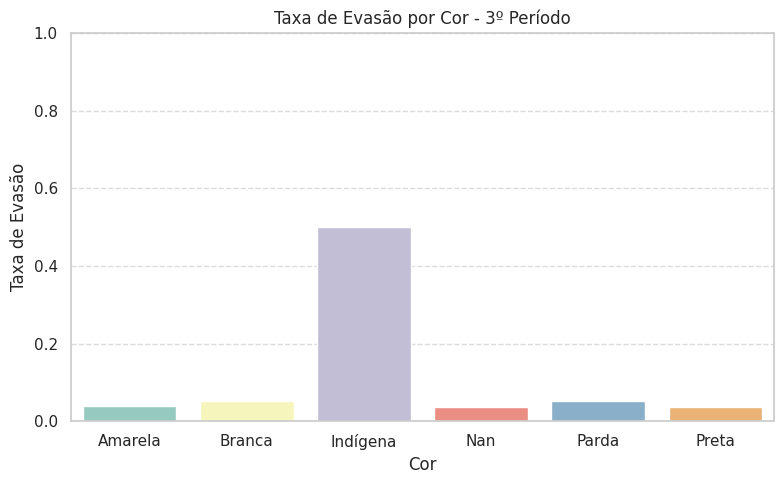

⚠️ Variável idade NÃO encontrada na tabela.

--- Análise das variáveis no 4º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          400   0.175362        0.035000
M         1881   0.824638        0.057416


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


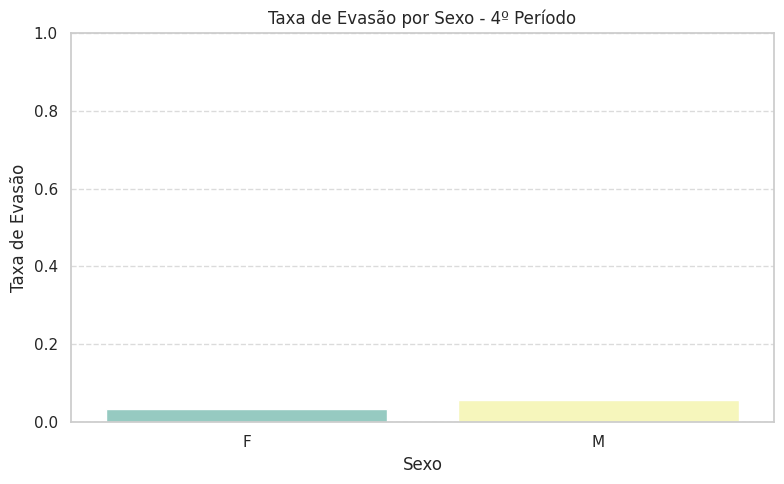

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              59   0.025866        0.050847
Divorciado           3   0.001315        0.000000
Nan                  7   0.003069        0.000000
Solteiro          2212   0.969750        0.053797


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


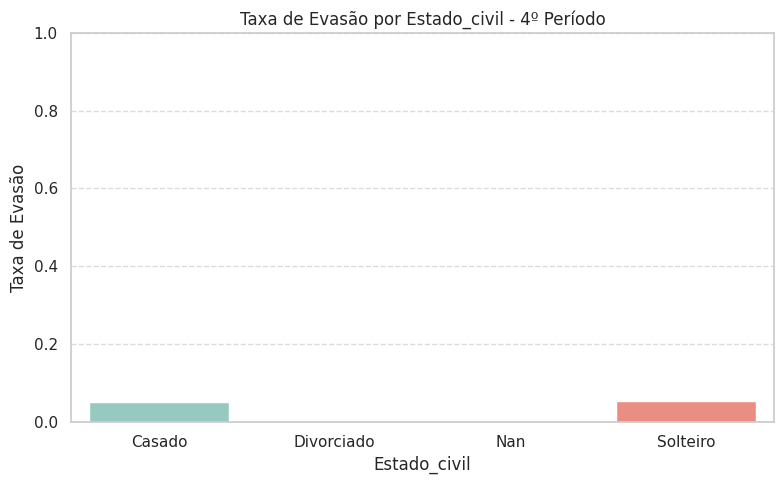


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022359        0.098039
Branca        1158   0.507672        0.050086
Indígena         4   0.001754        0.000000
Nan             28   0.012275        0.142857
Parda          932   0.408593        0.052575
Preta          108   0.047348        0.055556


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


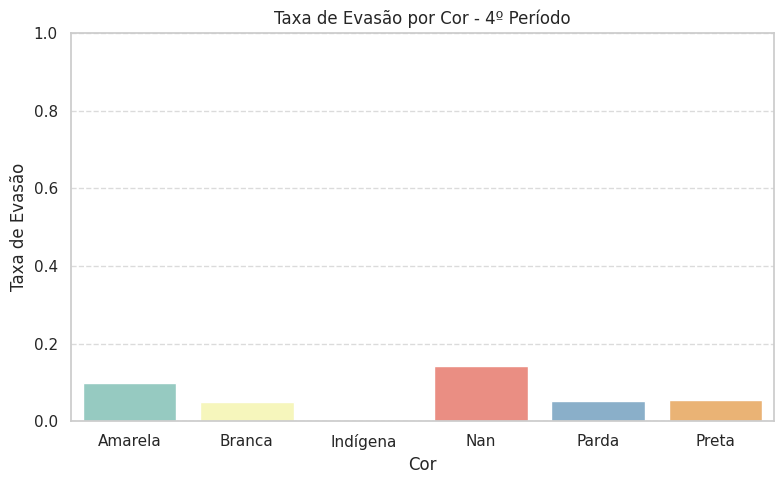

⚠️ Variável idade NÃO encontrada na tabela.

📘📘📘 TABELA: ALUNOS-FILTRADO-SEM-METRICAS 📘📘📘

--- Análise das variáveis no 1º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          208   0.165605        0.129808
M         1048   0.834395        0.091603


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


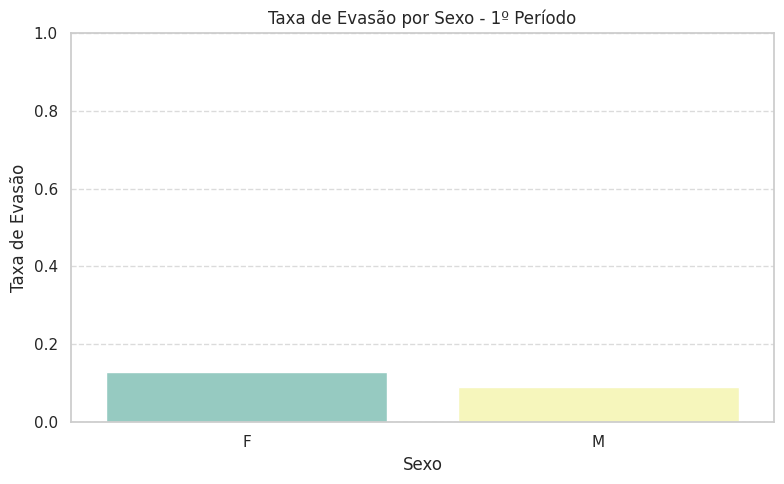

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              41   0.032643        0.243902
Divorciado           2   0.001592        0.000000
Nan                  4   0.003185        0.750000
Solteiro          1208   0.961783        0.091060
Viúvo                1   0.000796        0.000000


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


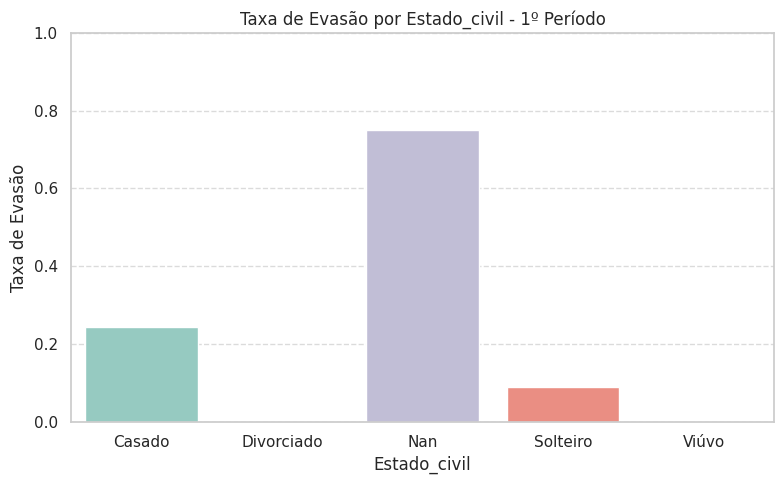


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.028662        0.194444
Branca         688   0.547771        0.072674
Indígena         4   0.003185        0.000000
Nan             24   0.019108        0.291667
Parda          444   0.353503        0.105856
Preta           60   0.047771        0.200000


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


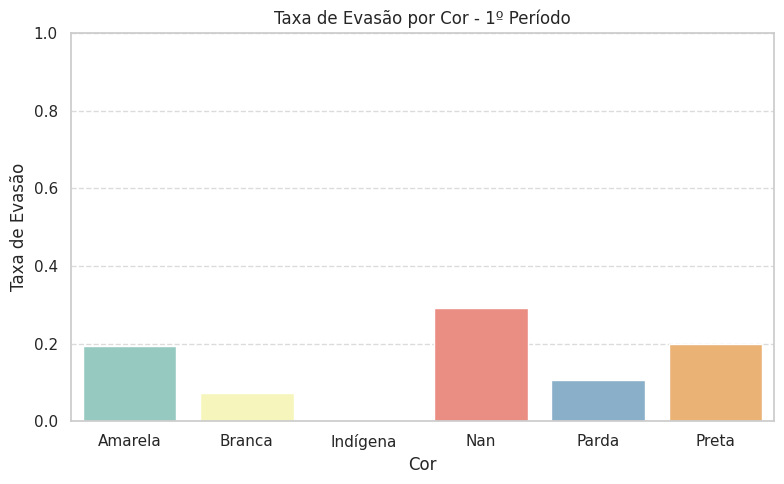


📘 Idade - Média: 30.30, Desvio Padrão: 5.41


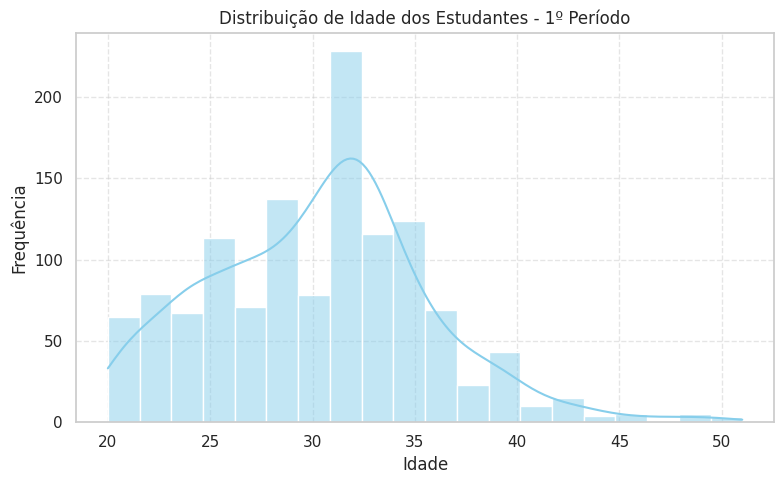

/tmp/ipykernel_1516507/1779100587.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='Pastel1')


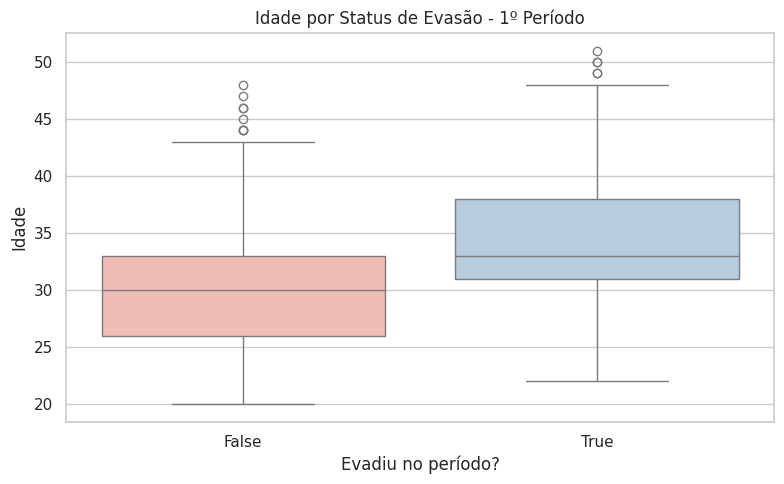

/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



--- Análise das variáveis no 2º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          208   0.165605        0.086538
M         1048   0.834395        0.078244


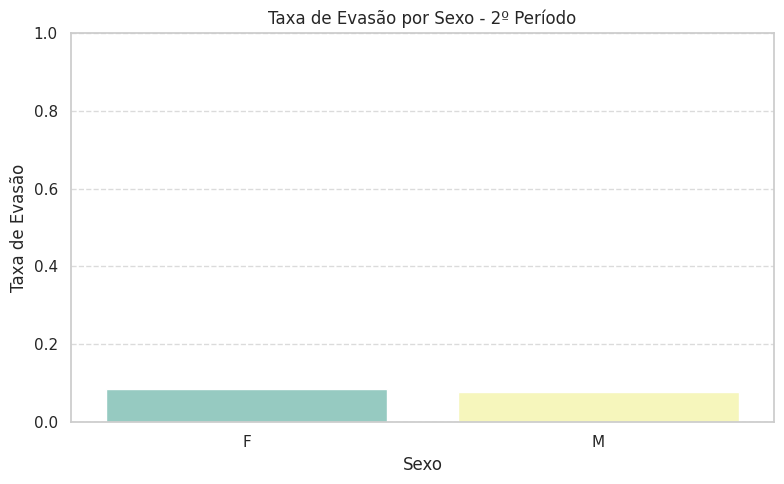

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              41   0.032643        0.146341
Divorciado           2   0.001592        0.000000
Nan                  4   0.003185        0.000000
Solteiro          1208   0.961783        0.077815
Viúvo                1   0.000796        0.000000


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


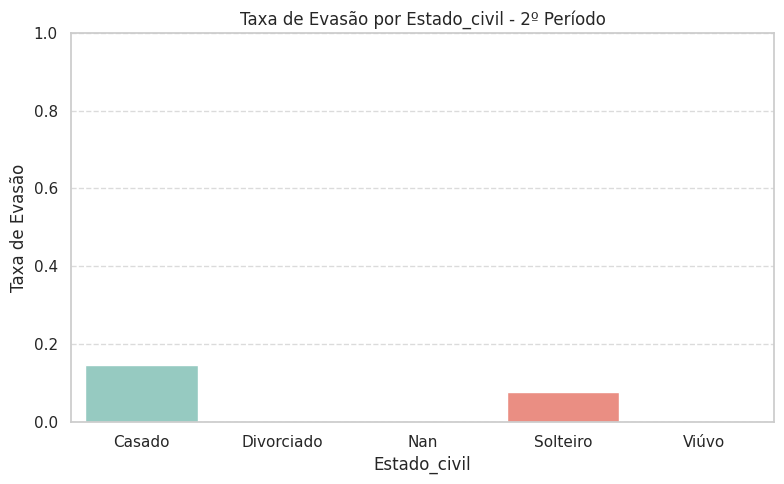


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.028662        0.000000
Branca         688   0.547771        0.063953
Indígena         4   0.003185        0.000000
Nan             24   0.019108        0.125000
Parda          444   0.353503        0.094595
Preta           60   0.047771        0.183333


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


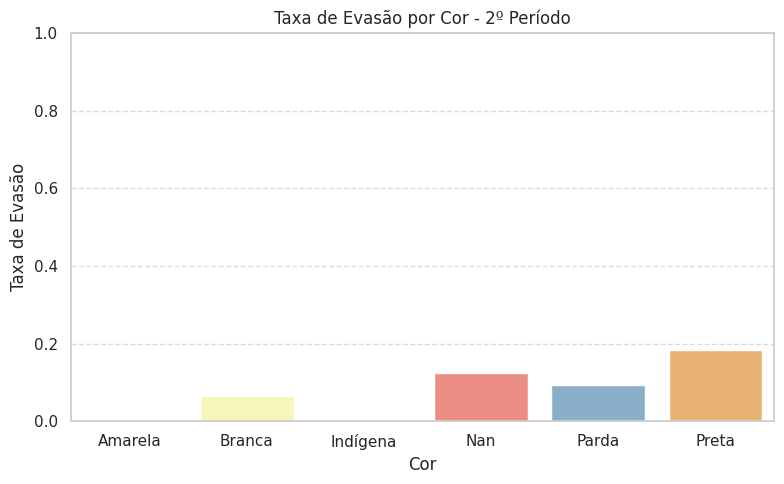


📘 Idade - Média: 30.30, Desvio Padrão: 5.41


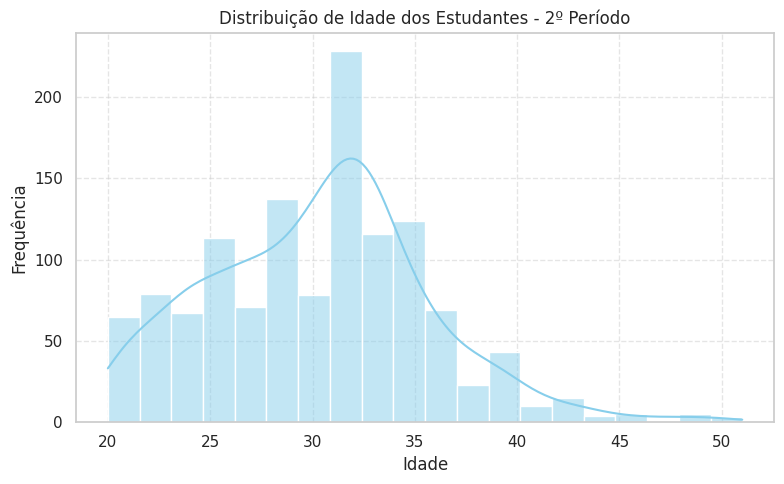

/tmp/ipykernel_1516507/1779100587.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='Pastel1')


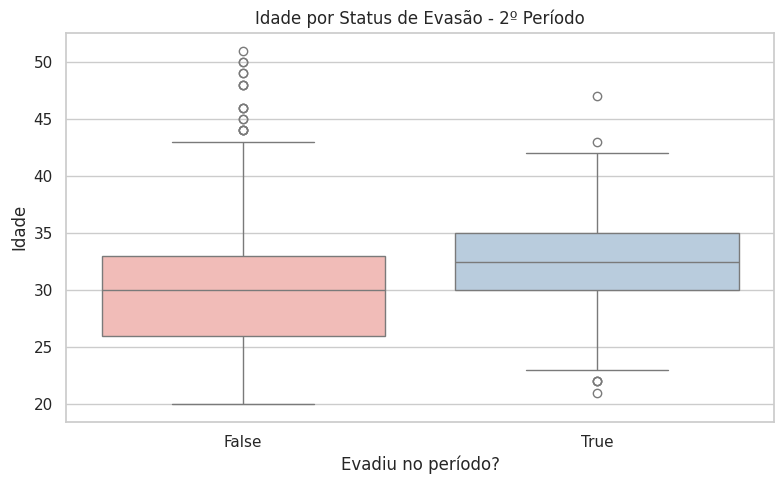

/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



--- Análise das variáveis no 3º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          208   0.165605        0.048077
M         1048   0.834395        0.075382


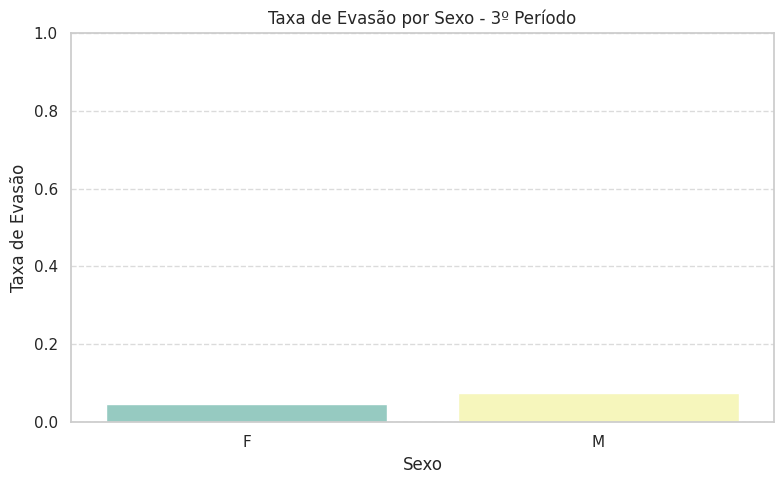

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              41   0.032643        0.048780
Divorciado           2   0.001592        1.000000
Nan                  4   0.003185        0.000000
Solteiro          1208   0.961783        0.070364
Viúvo                1   0.000796        0.000000


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


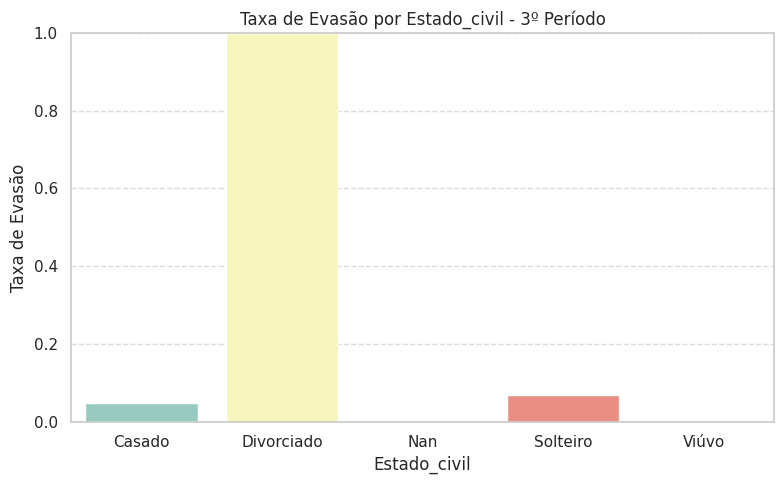


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.028662        0.166667
Branca         688   0.547771        0.065407
Indígena         4   0.003185        0.250000
Nan             24   0.019108        0.166667
Parda          444   0.353503        0.065315
Preta           60   0.047771        0.066667


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


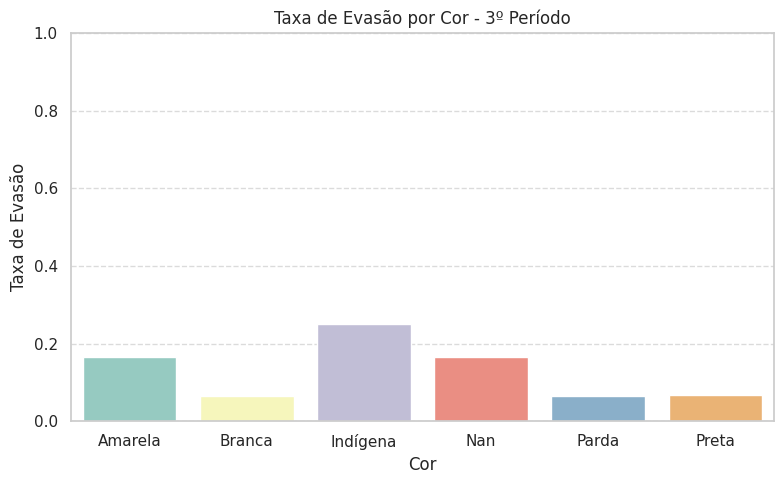


📘 Idade - Média: 30.30, Desvio Padrão: 5.41


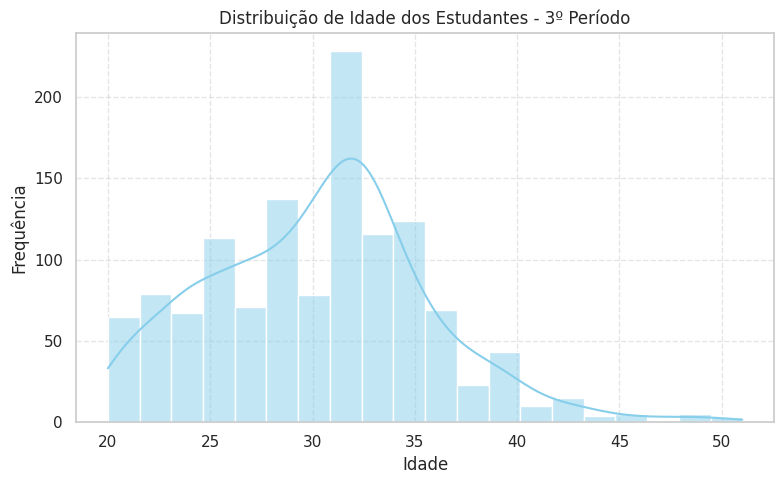

/tmp/ipykernel_1516507/1779100587.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='Pastel1')


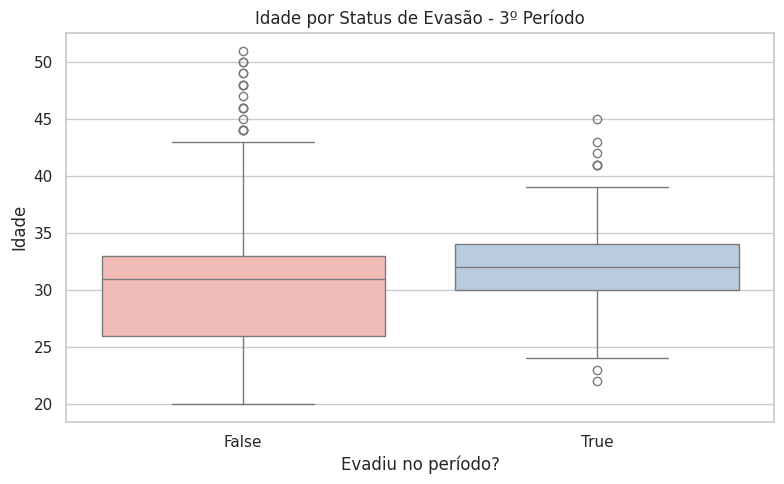

/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



--- Análise das variáveis no 4º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          208   0.165605        0.062500
M         1048   0.834395        0.094466


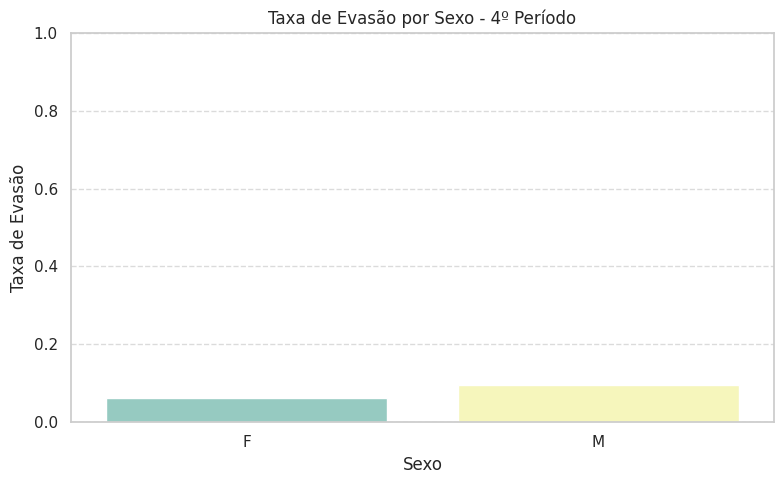

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              41   0.032643         0.04878
Divorciado           2   0.001592         0.00000
Nan                  4   0.003185         0.00000
Solteiro          1208   0.961783         0.09106
Viúvo                1   0.000796         0.00000


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


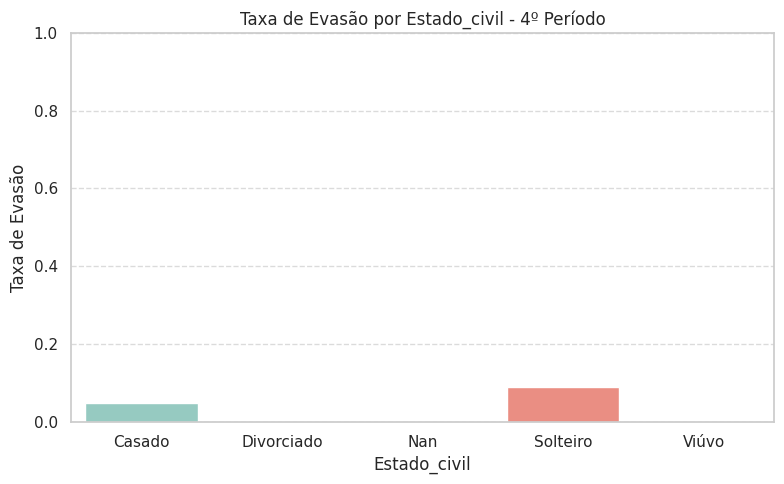


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.028662        0.111111
Branca         688   0.547771        0.091570
Indígena         4   0.003185        0.000000
Nan             24   0.019108        0.166667
Parda          444   0.353503        0.083333
Preta           60   0.047771        0.066667


/tmp/ipykernel_1516507/1779100587.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


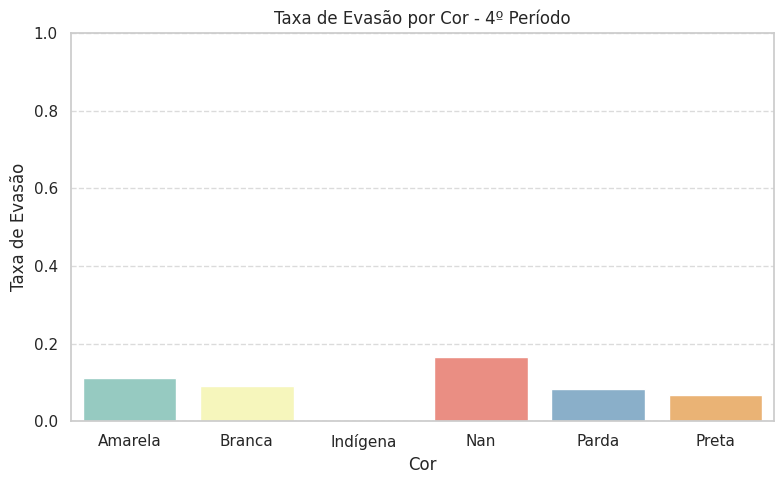


📘 Idade - Média: 30.30, Desvio Padrão: 5.41


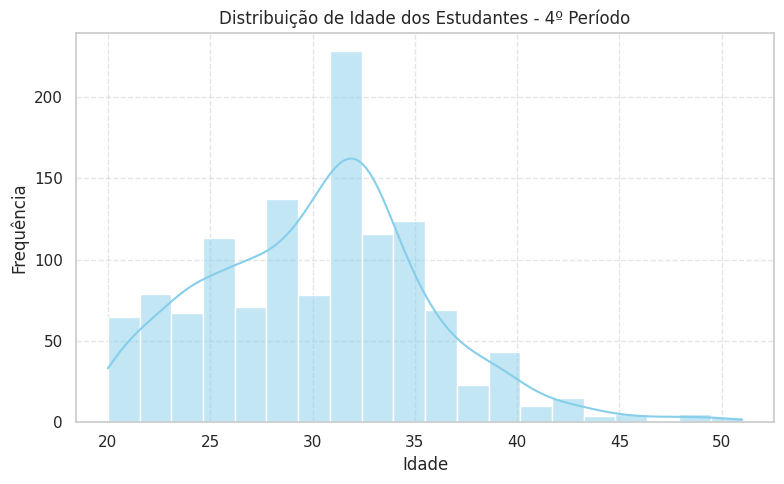

/tmp/ipykernel_1516507/1779100587.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='Pastel1')


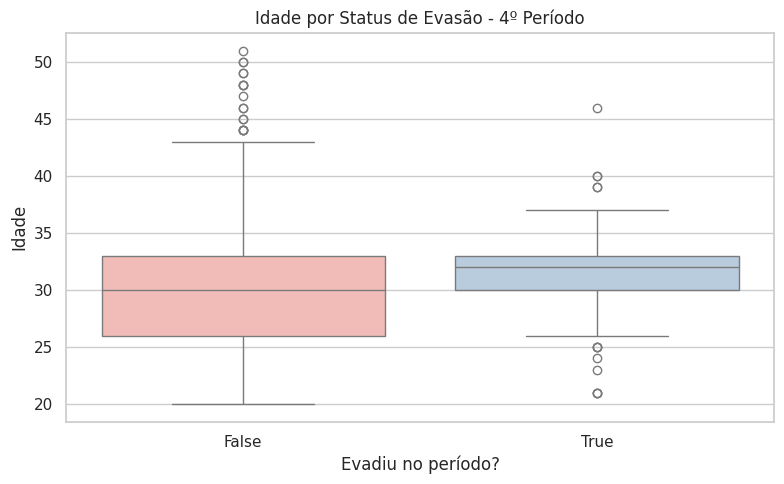

In [38]:
for nome in tabelas_nomes:
    df = tabelas_tratadas_limpo[nome]
    print(f"\n📘📘📘 TABELA: {nome.upper()} 📘📘📘")
    
    # Laço para os 4 primeiros períodos
    for periodo in range(1, 5):
        analisar_variaveis_com_graficos(df, n_periodo=periodo)


### Teste t de Student para variável numérica (idade)


📊📊📊 TABELA: ALUNOS-NOVOS-SEM-REINGRESSOS-NOVOS-OU-ANTIGOS-SEM-METRICAS 📊📊📊

📘 Teste t - 1º Período:
Grupo evadiu: média = 31.59, n = 195
Grupo NÃO evadiu: média = 27.40, n = 2085
t = 8.400, p = 0.00000


/tmp/ipykernel_1516507/2252064442.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='coolwarm')


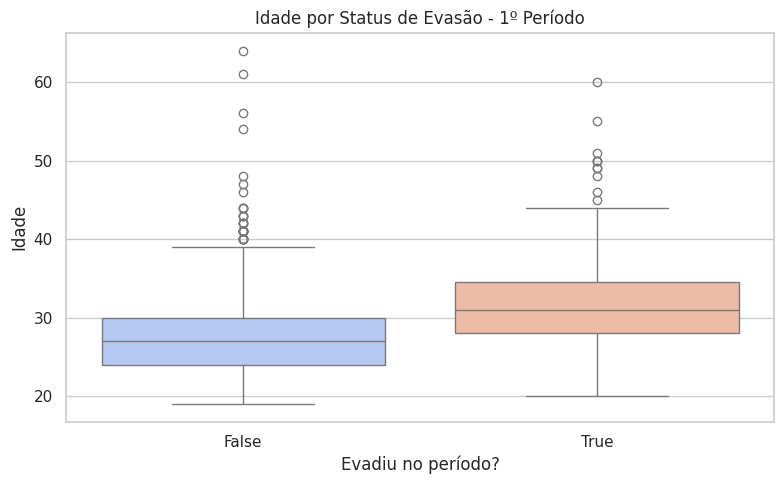


📘 Teste t - 2º Período:
Grupo evadiu: média = 30.36, n = 140
Grupo NÃO evadiu: média = 27.59, n = 2140
t = 5.829, p = 0.00000


/tmp/ipykernel_1516507/2252064442.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='coolwarm')


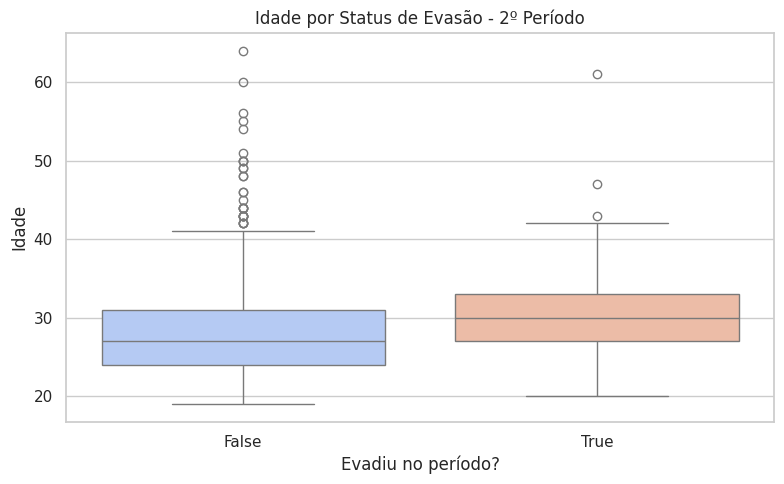


📘 Teste t - 3º Período:
Grupo evadiu: média = 29.92, n = 128
Grupo NÃO evadiu: média = 27.63, n = 2152
t = 5.283, p = 0.00000


/tmp/ipykernel_1516507/2252064442.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='coolwarm')


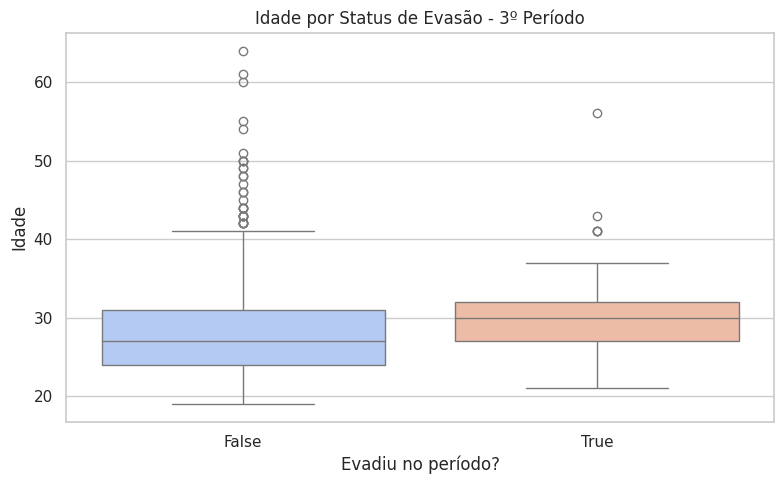


📘 Teste t - 4º Período:
Grupo evadiu: média = 30.16, n = 158
Grupo NÃO evadiu: média = 27.58, n = 2122
t = 6.665, p = 0.00000


/tmp/ipykernel_1516507/2252064442.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='coolwarm')


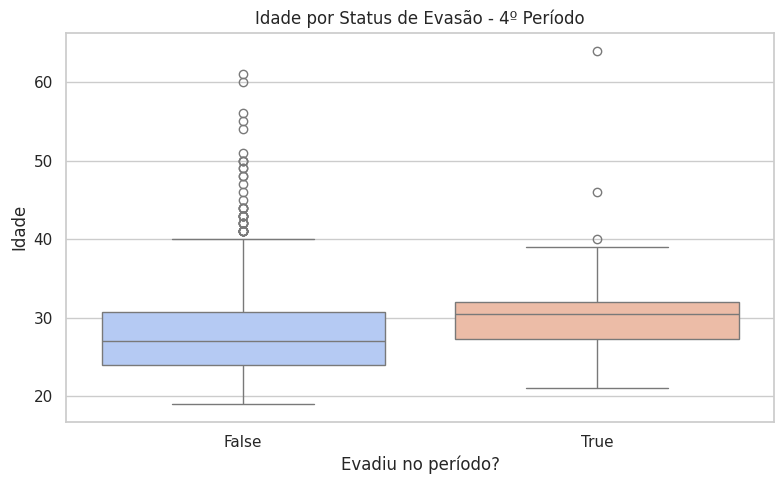


📊📊📊 TABELA: ALUNOS 📊📊📊

📘 Teste t - 1º Período:
Grupo evadiu: média = 34.63, n = 123
Grupo NÃO evadiu: média = 29.58, n = 1184
t = 9.200, p = 0.00000


/tmp/ipykernel_1516507/2252064442.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='coolwarm')


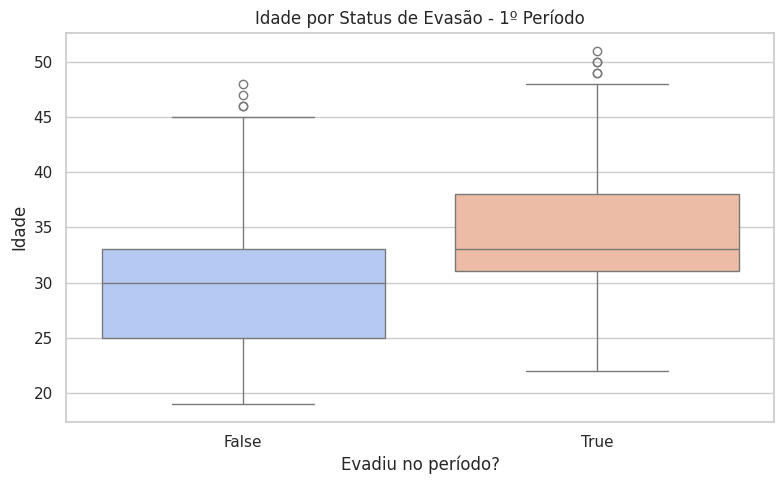


📘 Teste t - 2º Período:
Grupo evadiu: média = 32.39, n = 100
Grupo NÃO evadiu: média = 29.86, n = 1207
t = 5.066, p = 0.00000


/tmp/ipykernel_1516507/2252064442.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='coolwarm')


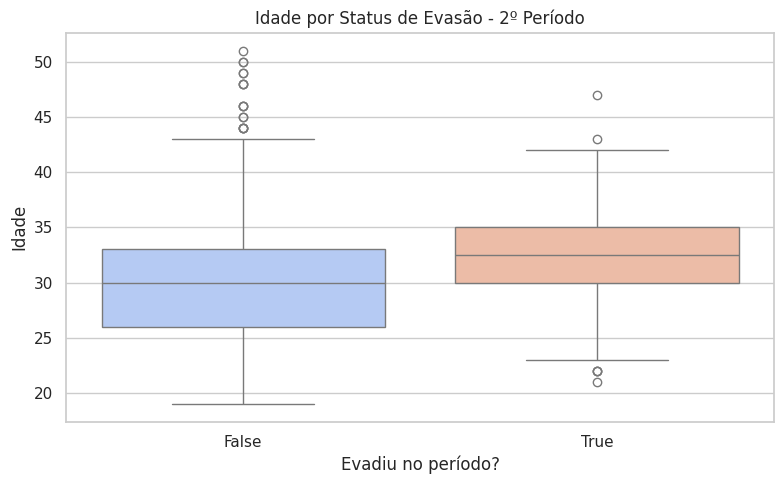


📘 Teste t - 3º Período:
Grupo evadiu: média = 32.07, n = 89
Grupo NÃO evadiu: média = 29.91, n = 1218
t = 4.498, p = 0.00002


/tmp/ipykernel_1516507/2252064442.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='coolwarm')


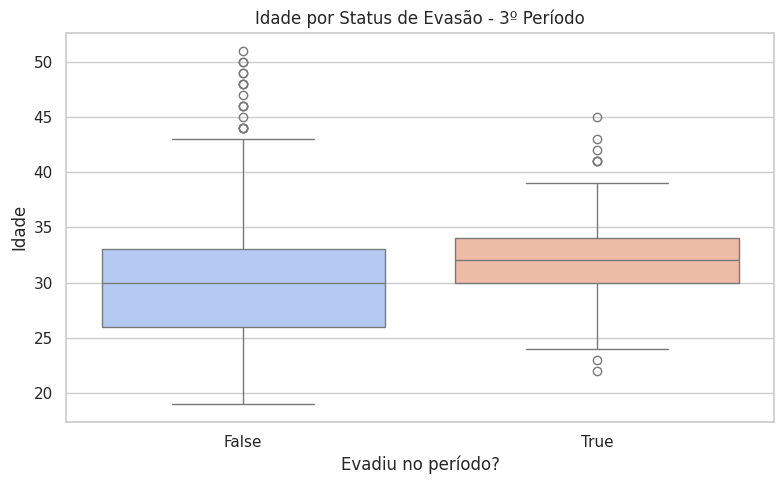


📘 Teste t - 4º Período:
Grupo evadiu: média = 31.38, n = 112
Grupo NÃO evadiu: média = 29.93, n = 1195
t = 3.577, p = 0.00046


/tmp/ipykernel_1516507/2252064442.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='coolwarm')


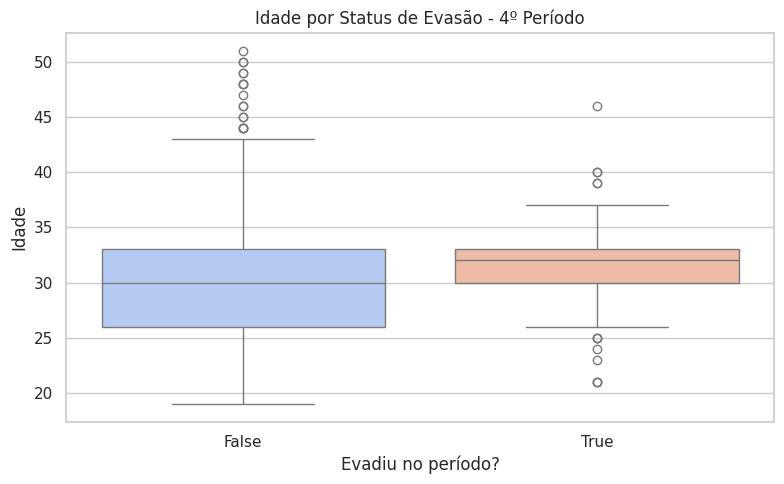


📊📊📊 TABELA: ALUNOS-MATRICULADOS 📊📊📊

📘 Teste t - 1º Período:
Grupo evadiu: média = 34.63, n = 123
Grupo NÃO evadiu: média = 29.83, n = 1133
t = 8.753, p = 0.00000


/tmp/ipykernel_1516507/2252064442.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='coolwarm')


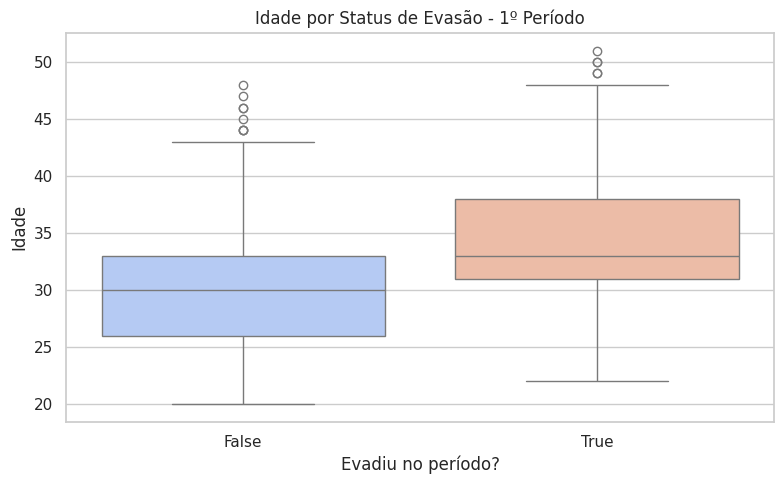


📘 Teste t - 2º Período:
Grupo evadiu: média = 32.39, n = 100
Grupo NÃO evadiu: média = 30.12, n = 1156
t = 4.558, p = 0.00001


/tmp/ipykernel_1516507/2252064442.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='coolwarm')


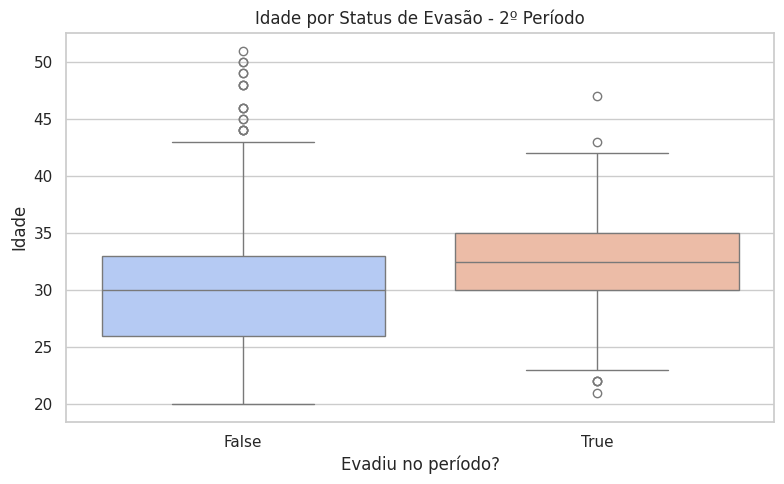


📘 Teste t - 3º Período:
Grupo evadiu: média = 32.07, n = 89
Grupo NÃO evadiu: média = 30.16, n = 1167
t = 3.970, p = 0.00013


/tmp/ipykernel_1516507/2252064442.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='coolwarm')


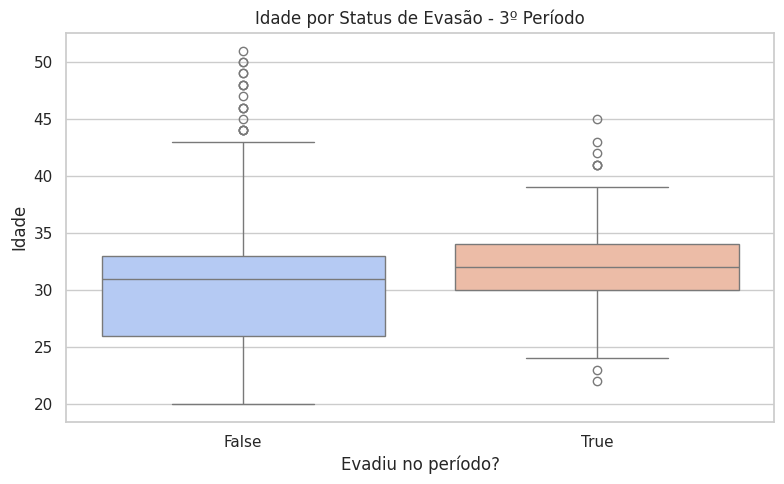


📘 Teste t - 4º Período:
Grupo evadiu: média = 31.38, n = 112
Grupo NÃO evadiu: média = 30.19, n = 1144
t = 2.934, p = 0.00385


/tmp/ipykernel_1516507/2252064442.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='coolwarm')


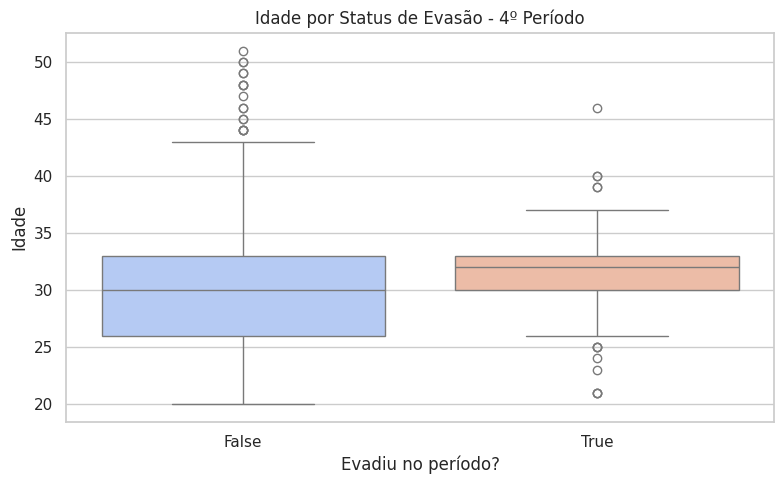


📊📊📊 TABELA: ALUNOS-FINAL 📊📊📊
⚠️ Coluna 'idade' não encontrada para o 1º período.
⚠️ Coluna 'idade' não encontrada para o 2º período.
⚠️ Coluna 'idade' não encontrada para o 3º período.
⚠️ Coluna 'idade' não encontrada para o 4º período.

📊📊📊 TABELA: ALUNOS-FILTRADO-SEM-METRICAS 📊📊📊

📘 Teste t - 1º Período:
Grupo evadiu: média = 34.63, n = 123
Grupo NÃO evadiu: média = 29.83, n = 1133
t = 8.753, p = 0.00000


/tmp/ipykernel_1516507/2252064442.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='coolwarm')


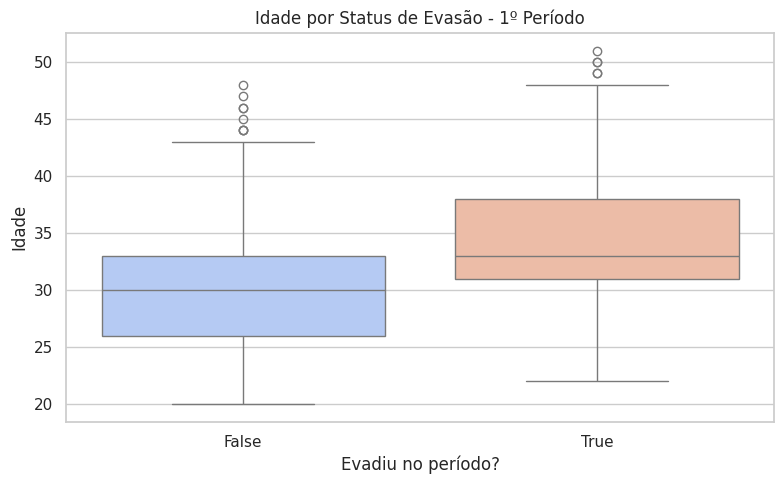

/tmp/ipykernel_1516507/2252064442.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='coolwarm')



📘 Teste t - 2º Período:
Grupo evadiu: média = 32.39, n = 100
Grupo NÃO evadiu: média = 30.12, n = 1156
t = 4.558, p = 0.00001


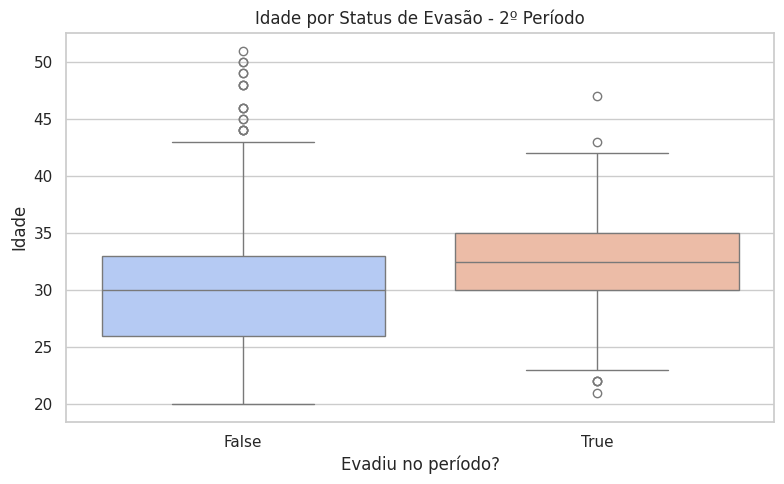


📘 Teste t - 3º Período:
Grupo evadiu: média = 32.07, n = 89
Grupo NÃO evadiu: média = 30.16, n = 1167
t = 3.970, p = 0.00013


/tmp/ipykernel_1516507/2252064442.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='coolwarm')


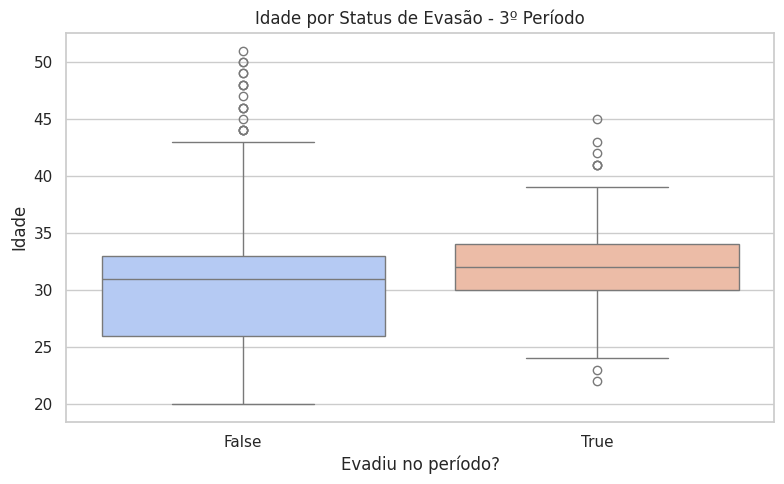


📘 Teste t - 4º Período:
Grupo evadiu: média = 31.38, n = 112
Grupo NÃO evadiu: média = 30.19, n = 1144
t = 2.934, p = 0.00385


/tmp/ipykernel_1516507/2252064442.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col, y='idade', data=df, palette='coolwarm')


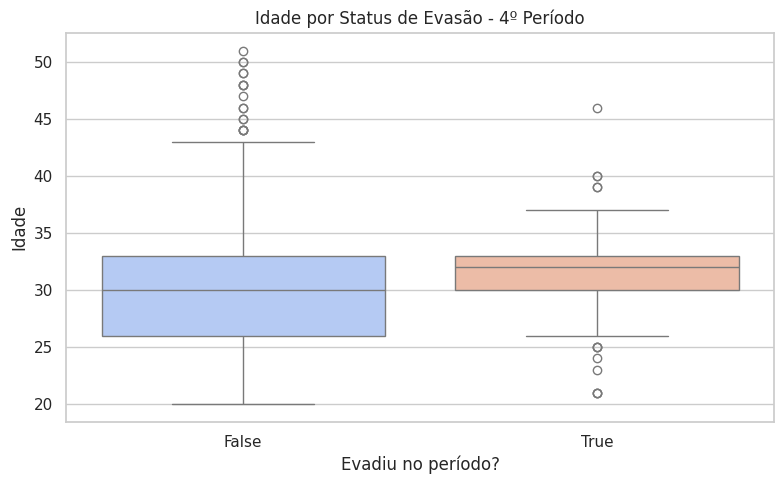

In [40]:
from scipy.stats import ttest_ind
import matplotlib.pyplot as plt
import seaborn as sns

def teste_t_idade_por_periodo(df_original, n_periodo=1):
    df = df_original.copy()

    # Garantir que os campos de período sejam string
    df['periodo_de_ingresso'] = df['periodo_de_ingresso'].astype(str).fillna('')
    df['periodo_de_evasao'] = df['periodo_de_evasao'].astype(str).fillna('')

    # Calcular período esperado e flag de evasão
    df['periodo_esperado_evasao'] = df['periodo_de_ingresso'].apply(lambda x: proximo_n_periodo(x, n_periodo))
    evasao_col = f'evadiu_no_{n_periodo}o_periodo'
    df[evasao_col] = df.apply(lambda row: row['periodo_de_evasao'] == row['periodo_esperado_evasao'], axis=1)

    # Checar se coluna 'idade' existe
    if 'idade' not in df.columns:
        print(f"⚠️ Coluna 'idade' não encontrada para o {n_periodo}º período.")
        return

    # Separar os grupos
    grupo_evadiu = df[df[evasao_col] == True]['idade'].dropna()
    grupo_nao_evadiu = df[df[evasao_col] == False]['idade'].dropna()

    # Verificar se ambos grupos têm dados
    if len(grupo_evadiu) == 0 or len(grupo_nao_evadiu) == 0:
        print(f"⚠️ Grupos vazios para teste t no {n_periodo}º período.")
        return

    # Teste t
    t_stat, p_valor = ttest_ind(grupo_evadiu, grupo_nao_evadiu, equal_var=False)

    print(f"\n📘 Teste t - {n_periodo}º Período:")
    print(f"Grupo evadiu: média = {grupo_evadiu.mean():.2f}, n = {len(grupo_evadiu)}")
    print(f"Grupo NÃO evadiu: média = {grupo_nao_evadiu.mean():.2f}, n = {len(grupo_nao_evadiu)}")
    print(f"t = {t_stat:.3f}, p = {p_valor:.5f}")

    # Gráfico opcional
    plt.figure(figsize=(8, 5))
    sns.boxplot(x=evasao_col, y='idade', data=df, palette='coolwarm')
    plt.title(f'Idade por Status de Evasão - {n_periodo}º Período')
    plt.xlabel('Evadiu no período?')
    plt.ylabel('Idade')
    plt.tight_layout()
    plt.show()

# 🔁 Aplicar para todas as tabelas e períodos
for nome in tabelas_nomes:
    df = tabelas_tratadas_limpo[nome]
    print(f"\n📊📊📊 TABELA: {nome.upper()} 📊📊📊")
    for periodo in range(1, 5):
        teste_t_idade_por_periodo(df, n_periodo=periodo)



📘📘📘 TABELA: ALUNOS-NOVOS-SEM-REINGRESSOS-NOVOS-OU-ANTIGOS-SEM-METRICAS 📘📘📘

--- Análise das variáveis no 1º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          399      0.175        0.092732
M         1881      0.825        0.083998


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


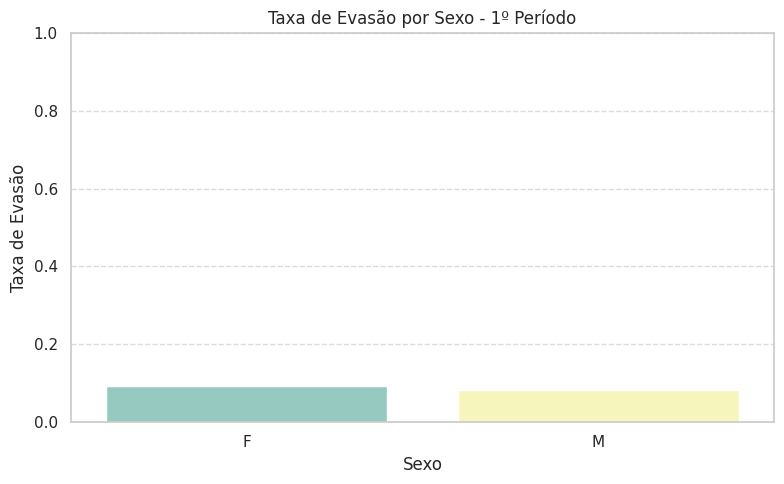

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              58   0.025439        0.241379
Divorciado           3   0.001316        0.000000
Nan                  7   0.003070        0.857143
Solteiro          2212   0.970175        0.079114


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


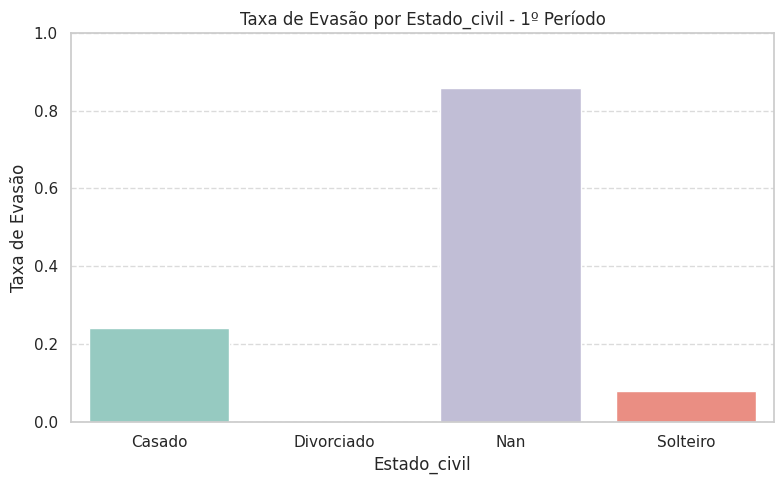


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022368        0.156863
Branca        1157   0.507456        0.069144
Indígena         4   0.001754        0.000000
Nan             28   0.012281        0.428571
Parda          932   0.408772        0.086910
Preta          108   0.047368        0.129630


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


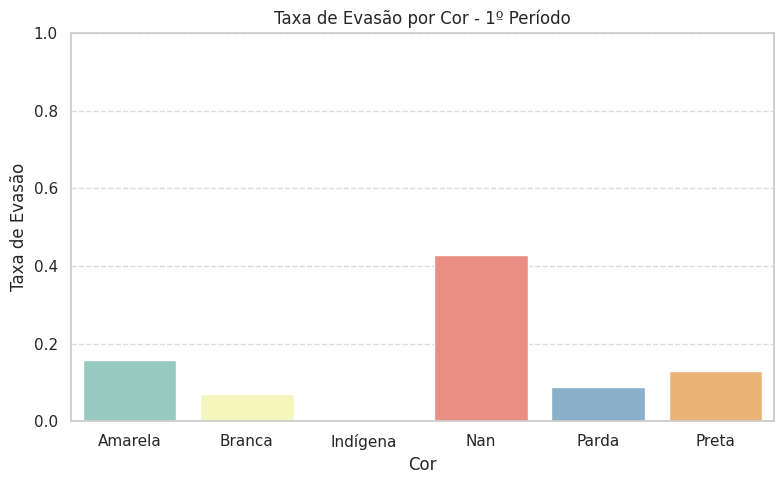


📘 Idade - Média: 27.76, Desvio Padrão: 5.12


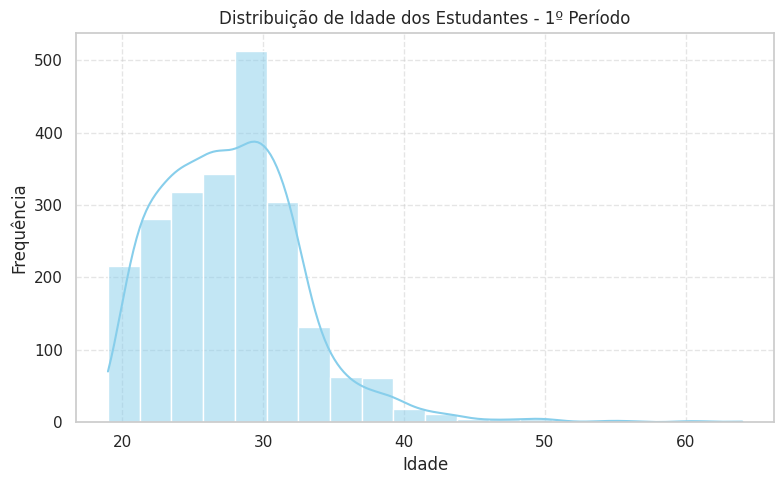

/tmp/ipykernel_1516507/364127247.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


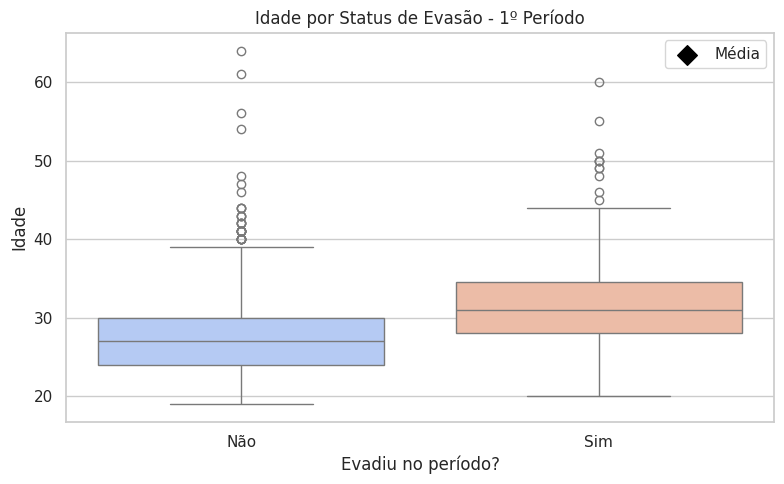


--- Análise das variáveis no 2º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          399      0.175        0.055138
M         1881      0.825        0.062733


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


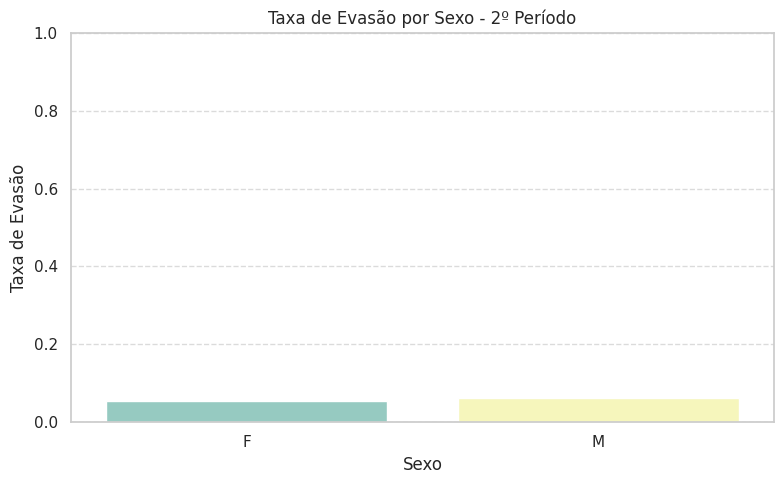

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              58   0.025439        0.120690
Divorciado           3   0.001316        0.000000
Nan                  7   0.003070        0.000000
Solteiro          2212   0.970175        0.060127


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


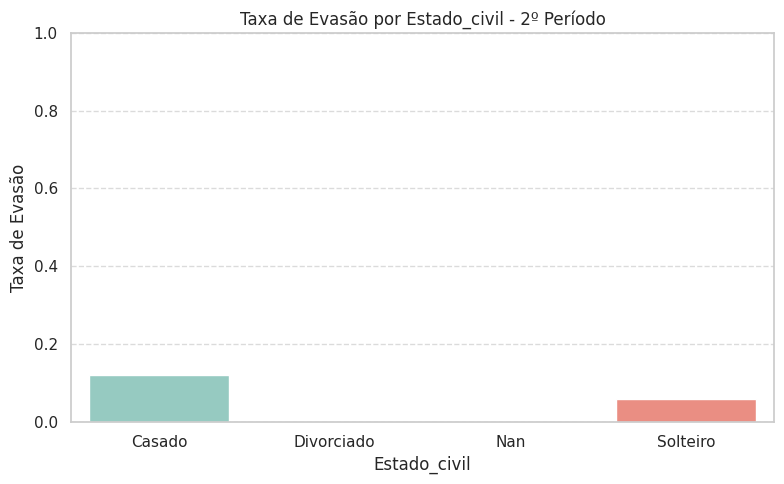


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022368        0.019608
Branca        1157   0.507456        0.059637
Indígena         4   0.001754        0.000000
Nan             28   0.012281        0.071429
Parda          932   0.408772        0.056867
Preta          108   0.047368        0.138889


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


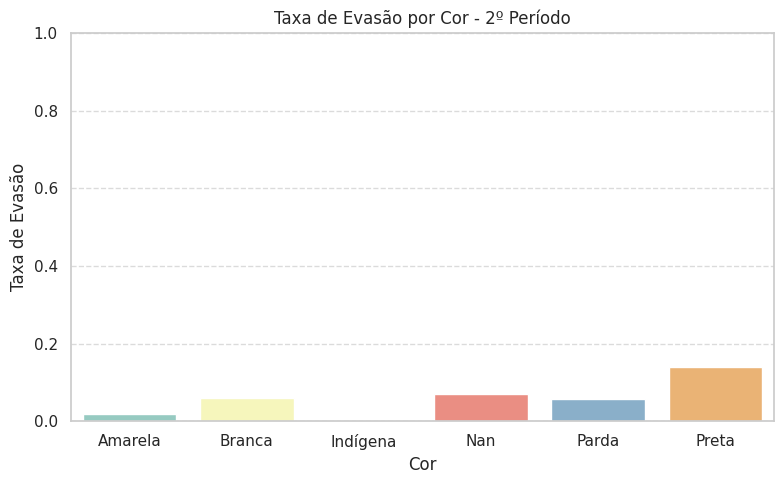


📘 Idade - Média: 27.76, Desvio Padrão: 5.12


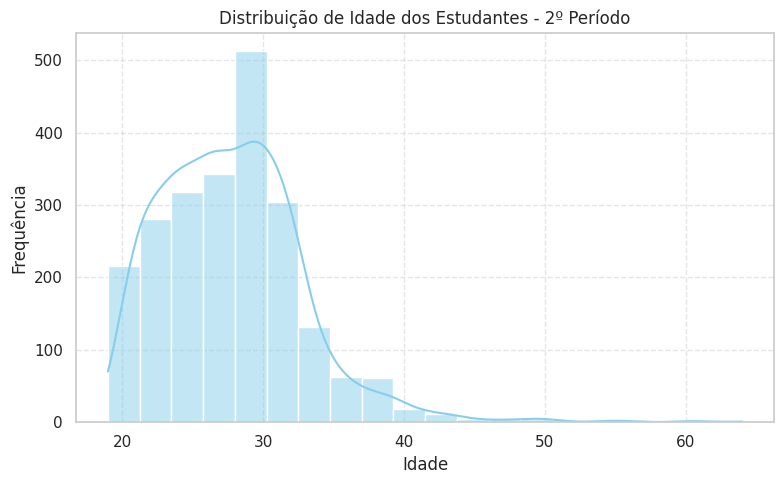

/tmp/ipykernel_1516507/364127247.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


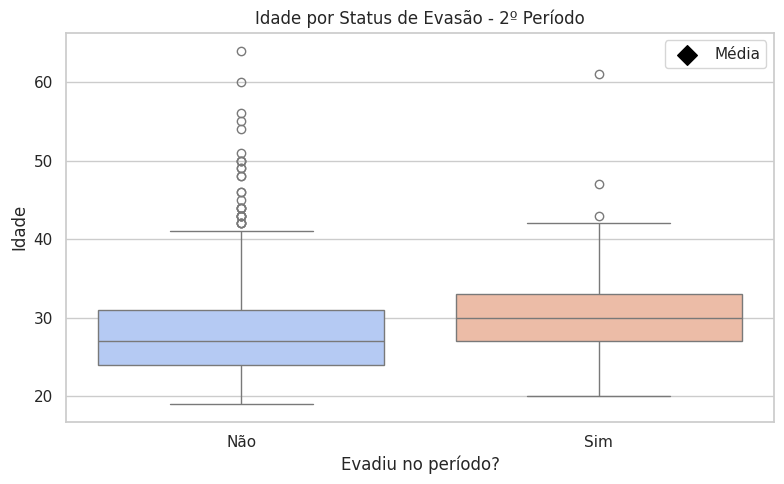


--- Análise das variáveis no 3º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          399      0.175        0.045113
M         1881      0.825        0.058480


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


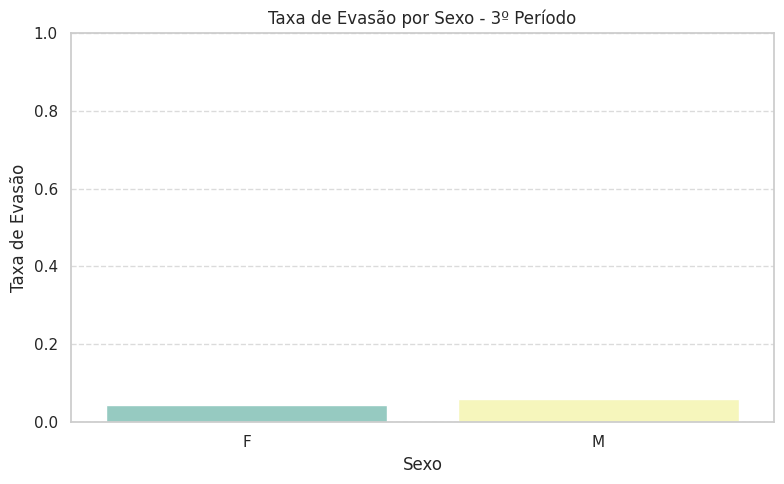

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              58   0.025439        0.051724
Divorciado           3   0.001316        0.666667
Nan                  7   0.003070        0.000000
Solteiro          2212   0.970175        0.055606


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


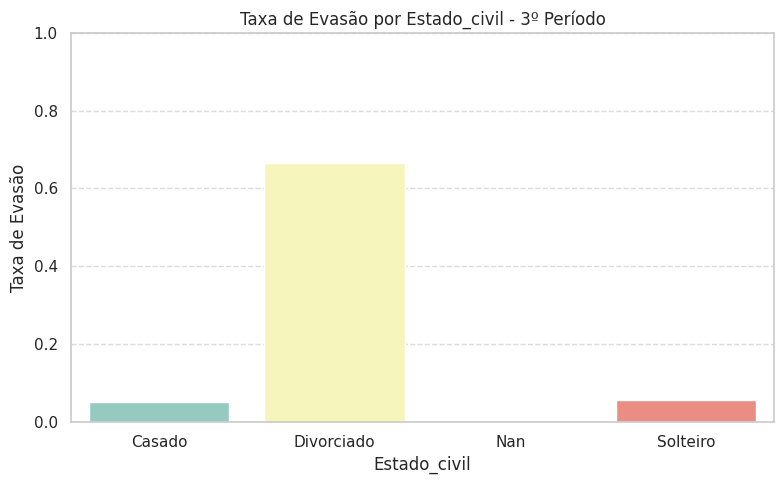


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022368        0.078431
Branca        1157   0.507456        0.056180
Indígena         4   0.001754        0.500000
Nan             28   0.012281        0.035714
Parda          932   0.408772        0.054721
Preta          108   0.047368        0.046296


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


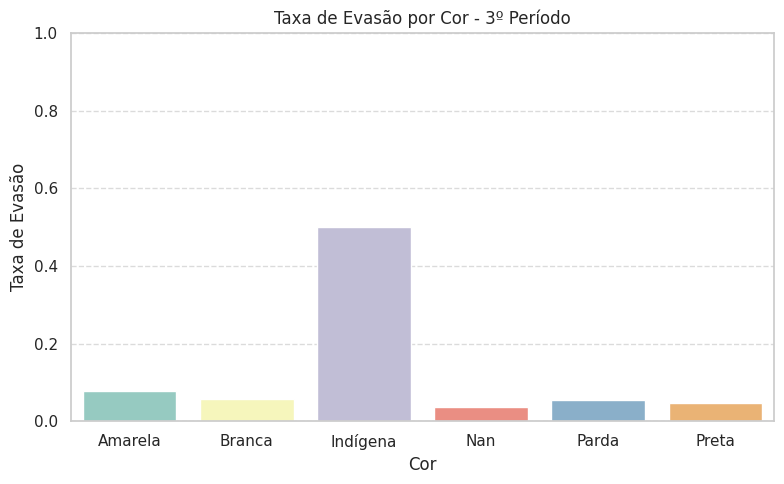


📘 Idade - Média: 27.76, Desvio Padrão: 5.12


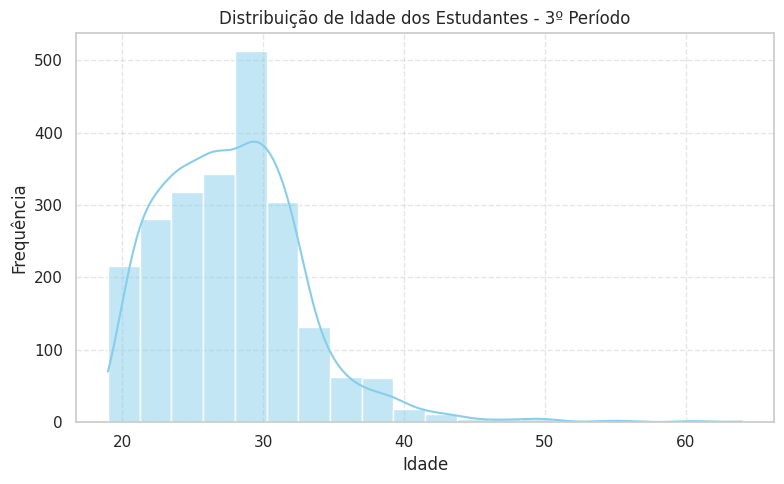

/tmp/ipykernel_1516507/364127247.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


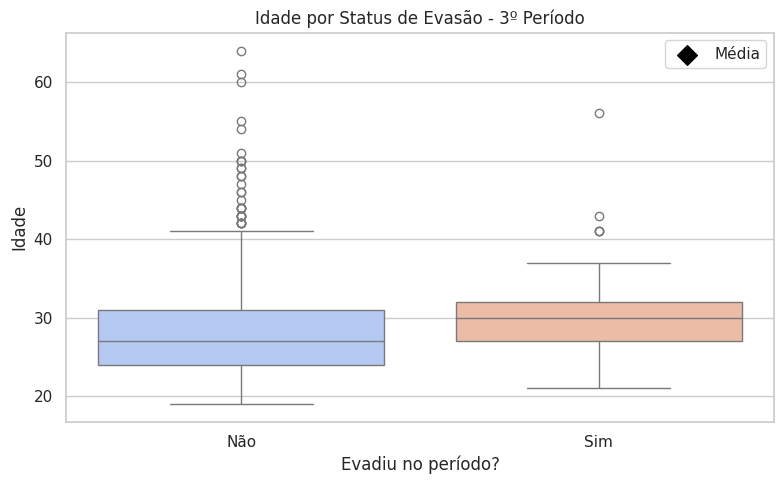

/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



--- Análise das variáveis no 4º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          399      0.175        0.057644
M         1881      0.825        0.071770


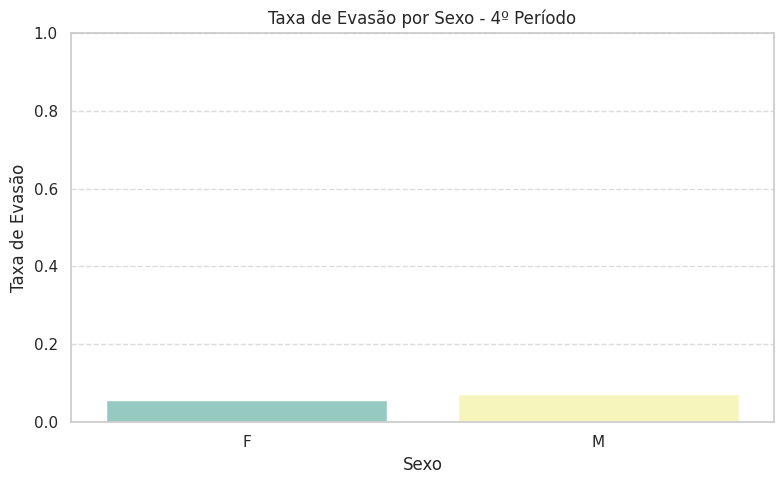

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              58   0.025439        0.051724
Divorciado           3   0.001316        0.000000
Nan                  7   0.003070        0.000000
Solteiro          2212   0.970175        0.070072


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


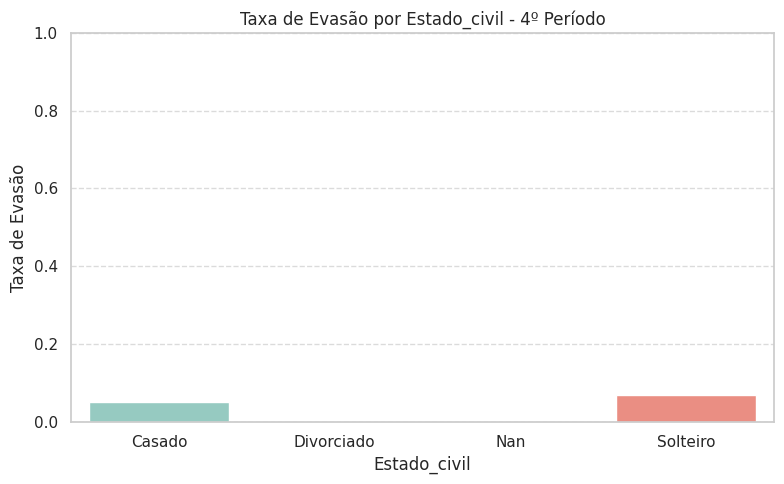


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022368        0.117647
Branca        1157   0.507456        0.067416
Indígena         4   0.001754        0.000000
Nan             28   0.012281        0.178571
Parda          932   0.408772        0.065451
Preta          108   0.047368        0.074074


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


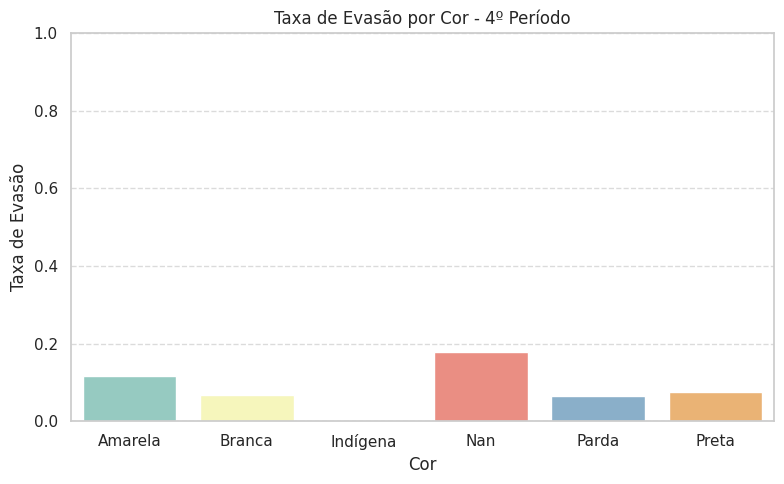


📘 Idade - Média: 27.76, Desvio Padrão: 5.12


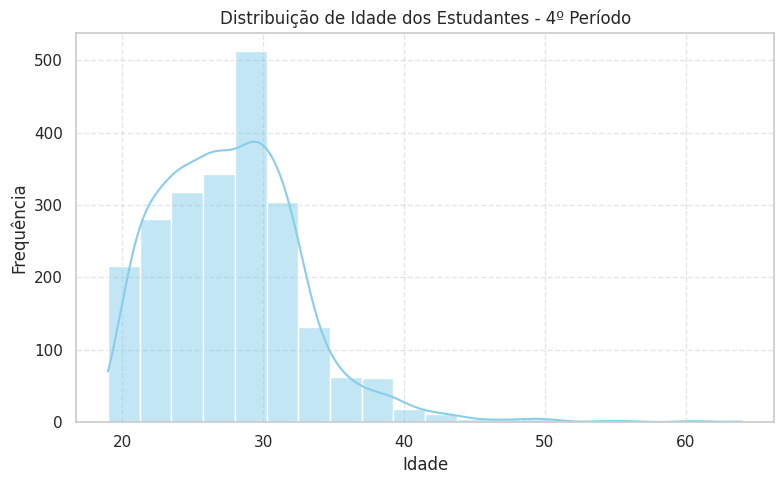

/tmp/ipykernel_1516507/364127247.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


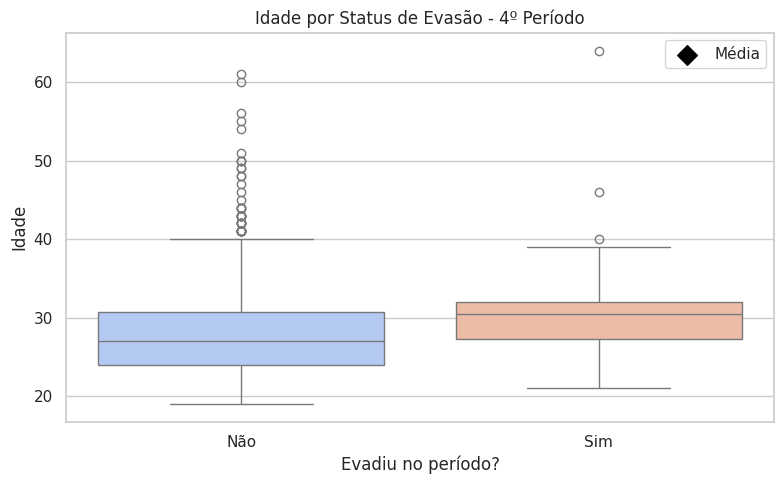

/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



📘📘📘 TABELA: ALUNOS 📘📘📘

--- Análise das variáveis no 1º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          230   0.175976        0.117391
M         1077   0.824024        0.089136


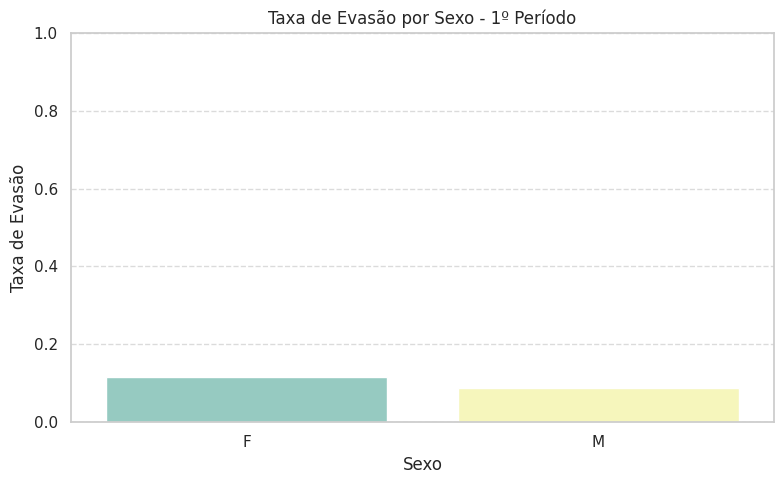

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              42   0.032135        0.238095
Divorciado           2   0.001530        0.000000
Nan                 54   0.041316        0.055556
Solteiro          1208   0.924254        0.091060
Viúvo                1   0.000765        0.000000


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


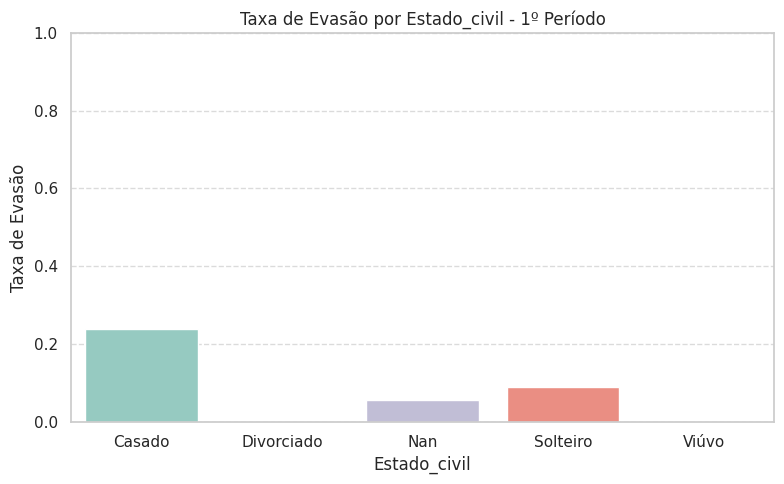


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.027544        0.194444
Branca         688   0.526396        0.072674
Indígena         4   0.003060        0.000000
Nan             74   0.056618        0.094595
Parda          445   0.340474        0.105618
Preta           60   0.045907        0.200000


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


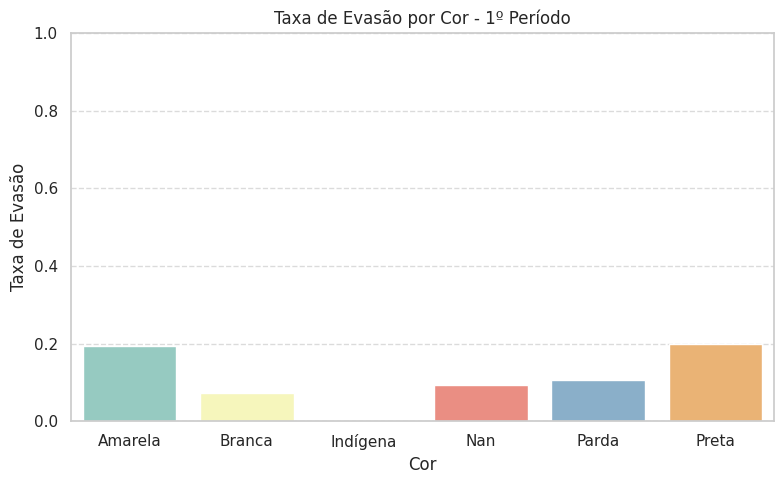


📘 Idade - Média: 30.05, Desvio Padrão: 5.54


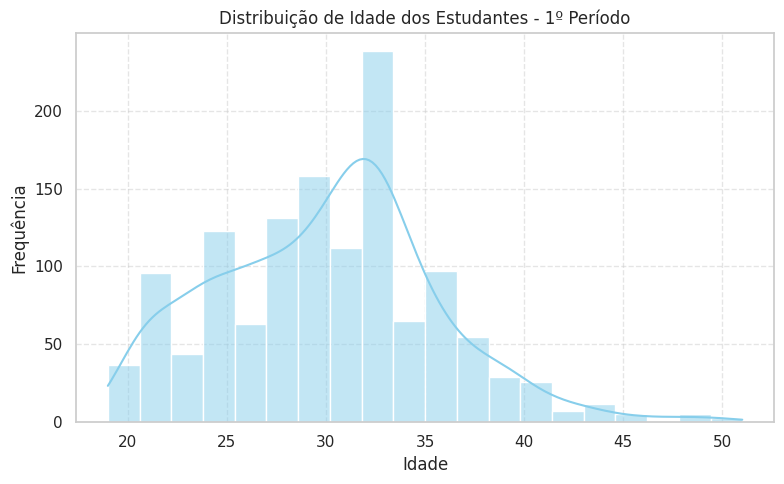

/tmp/ipykernel_1516507/364127247.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


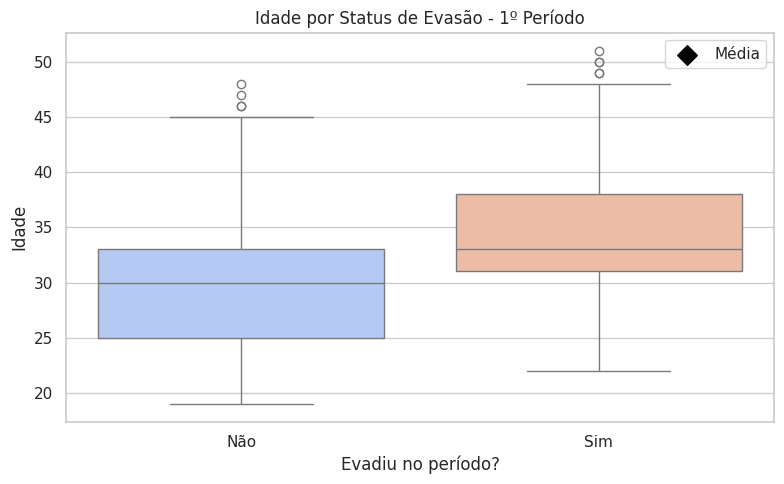

/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



--- Análise das variáveis no 2º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          230   0.175976        0.078261
M         1077   0.824024        0.076137


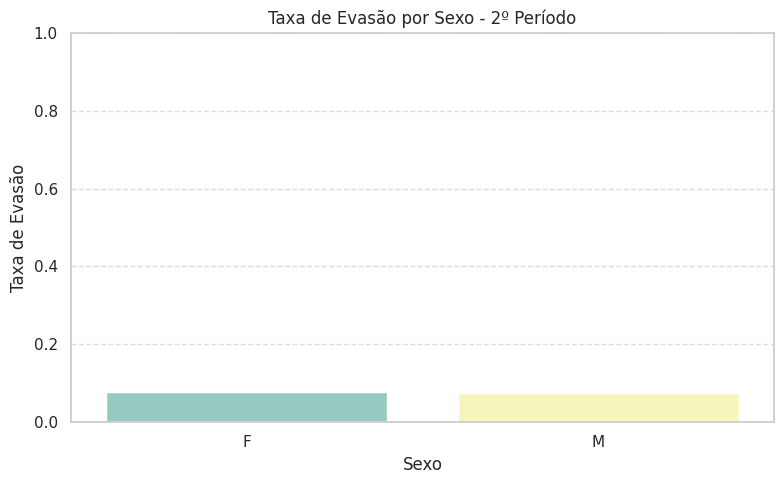

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              42   0.032135        0.142857
Divorciado           2   0.001530        0.000000
Nan                 54   0.041316        0.000000
Solteiro          1208   0.924254        0.077815
Viúvo                1   0.000765        0.000000


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


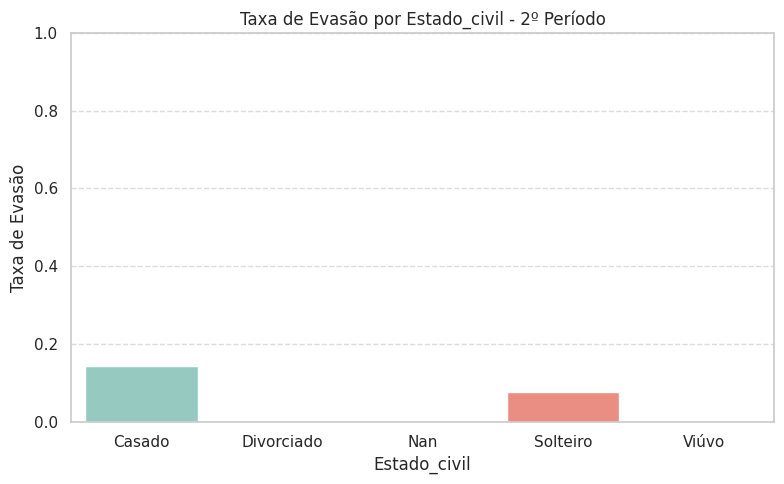


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.027544        0.000000
Branca         688   0.526396        0.063953
Indígena         4   0.003060        0.000000
Nan             74   0.056618        0.040541
Parda          445   0.340474        0.094382
Preta           60   0.045907        0.183333


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


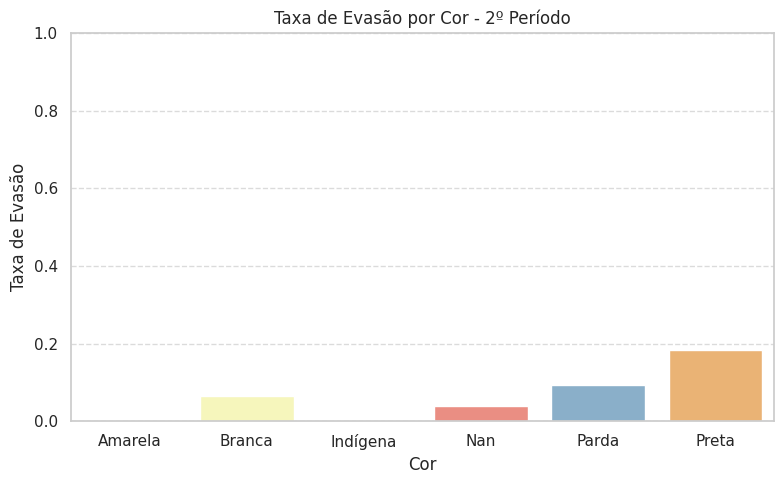


📘 Idade - Média: 30.05, Desvio Padrão: 5.54


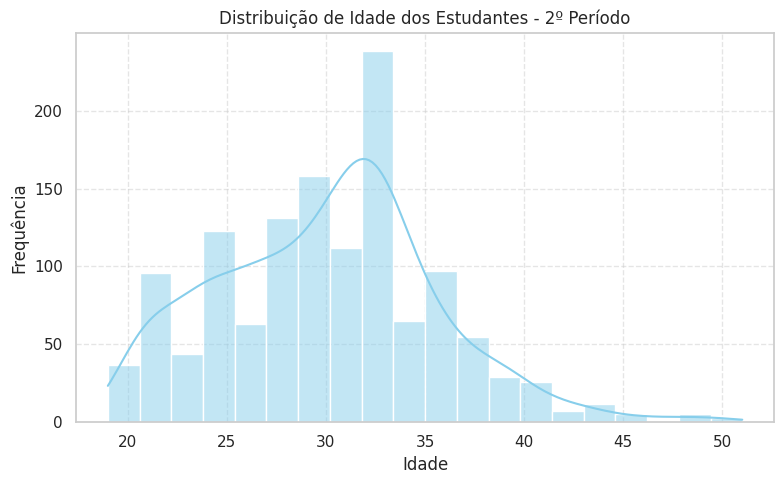

/tmp/ipykernel_1516507/364127247.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


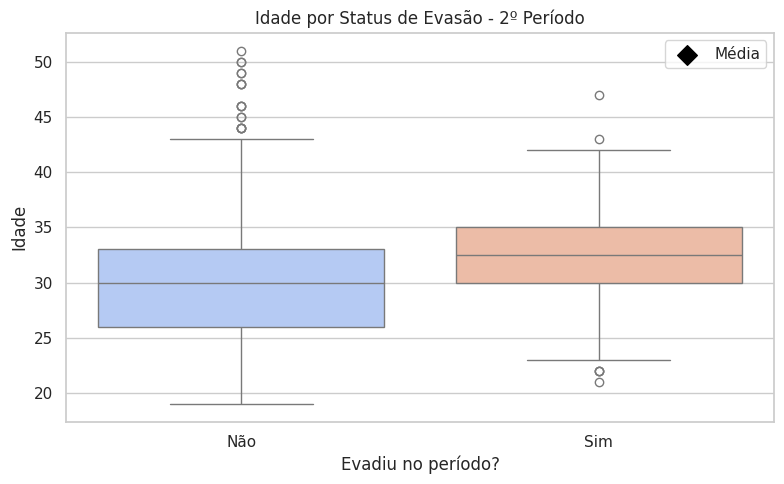


--- Análise das variáveis no 3º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          230   0.175976        0.043478
M         1077   0.824024        0.073352


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


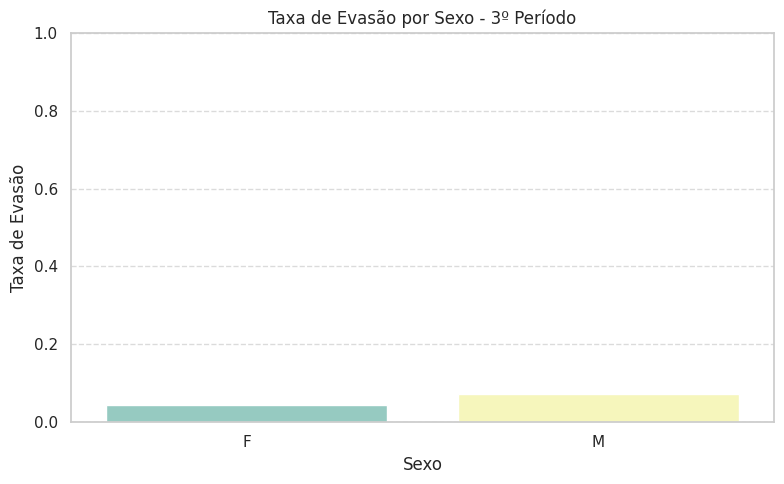

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              42   0.032135        0.047619
Divorciado           2   0.001530        1.000000
Nan                 54   0.041316        0.000000
Solteiro          1208   0.924254        0.070364
Viúvo                1   0.000765        0.000000


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


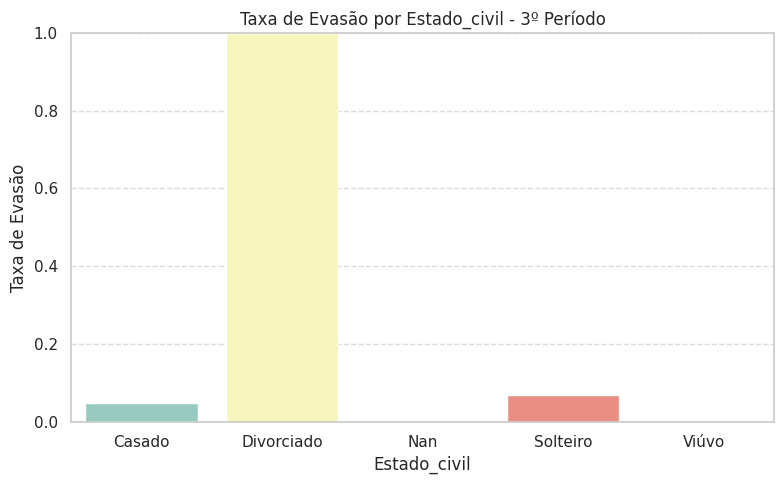


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.027544        0.166667
Branca         688   0.526396        0.065407
Indígena         4   0.003060        0.250000
Nan             74   0.056618        0.054054
Parda          445   0.340474        0.065169
Preta           60   0.045907        0.066667


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


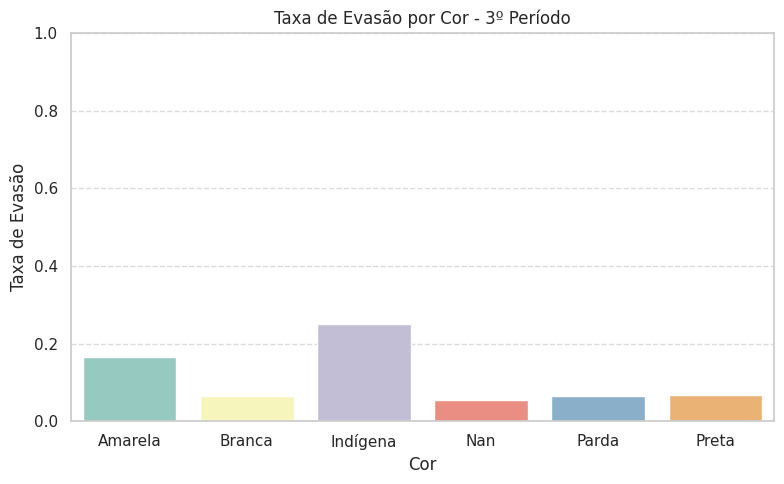


📘 Idade - Média: 30.05, Desvio Padrão: 5.54


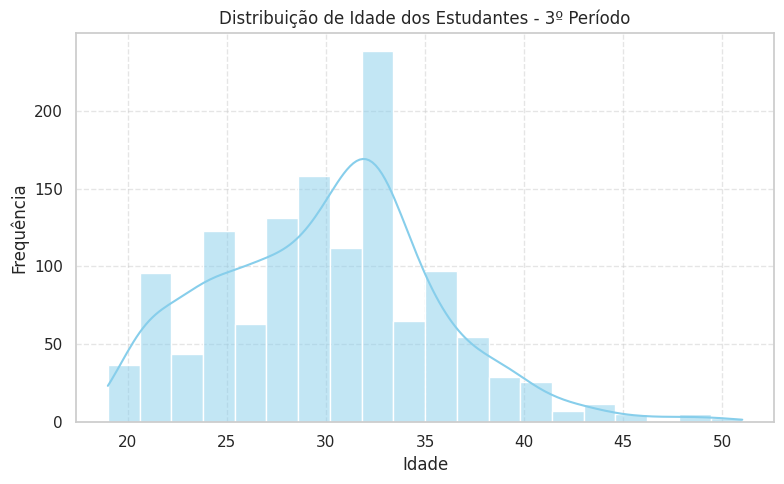

/tmp/ipykernel_1516507/364127247.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


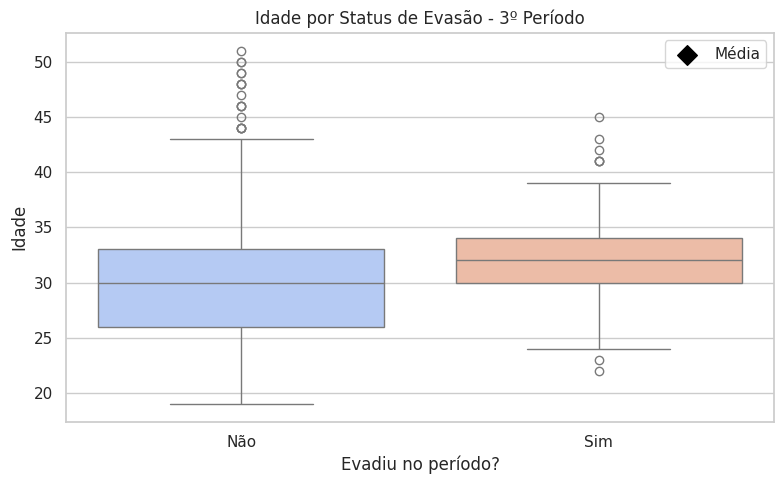


--- Análise das variáveis no 4º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          230   0.175976        0.056522
M         1077   0.824024        0.091922


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


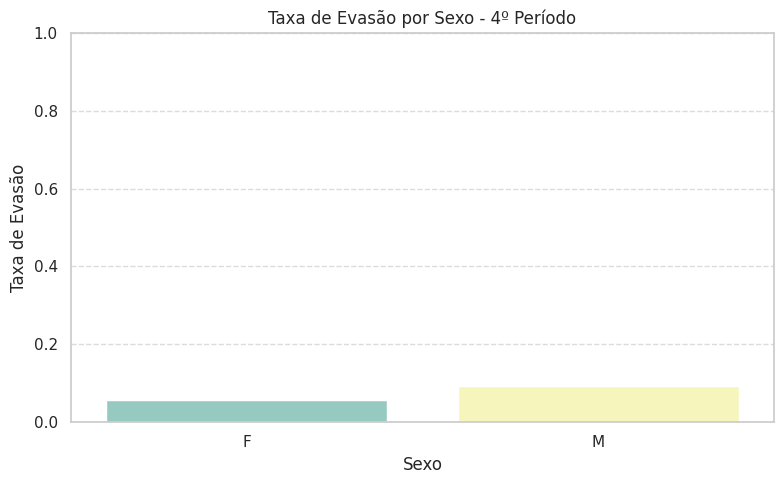

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              42   0.032135        0.047619
Divorciado           2   0.001530        0.000000
Nan                 54   0.041316        0.000000
Solteiro          1208   0.924254        0.091060
Viúvo                1   0.000765        0.000000


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


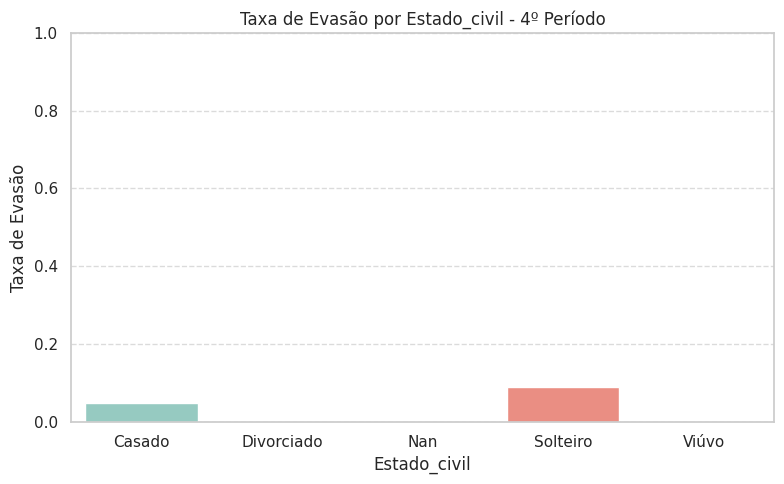


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.027544        0.111111
Branca         688   0.526396        0.091570
Indígena         4   0.003060        0.000000
Nan             74   0.056618        0.054054
Parda          445   0.340474        0.083146
Preta           60   0.045907        0.066667


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


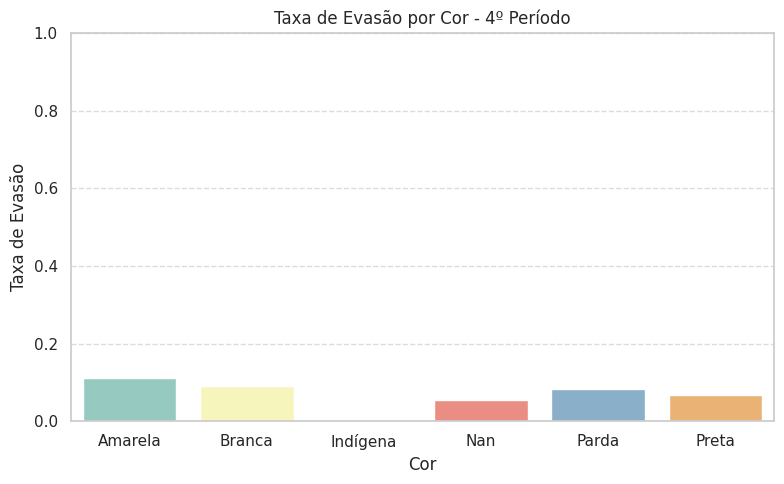


📘 Idade - Média: 30.05, Desvio Padrão: 5.54


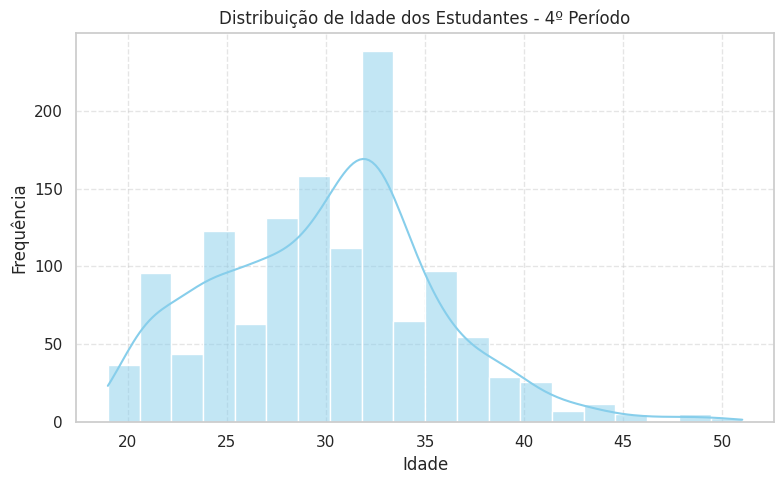

/tmp/ipykernel_1516507/364127247.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


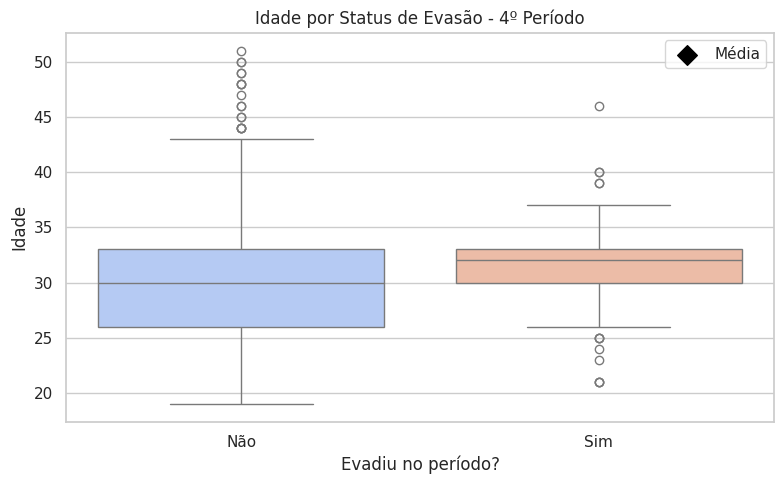


📘📘📘 TABELA: ALUNOS-MATRICULADOS 📘📘📘

--- Análise das variáveis no 1º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          208   0.165605        0.129808
M         1048   0.834395        0.091603


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


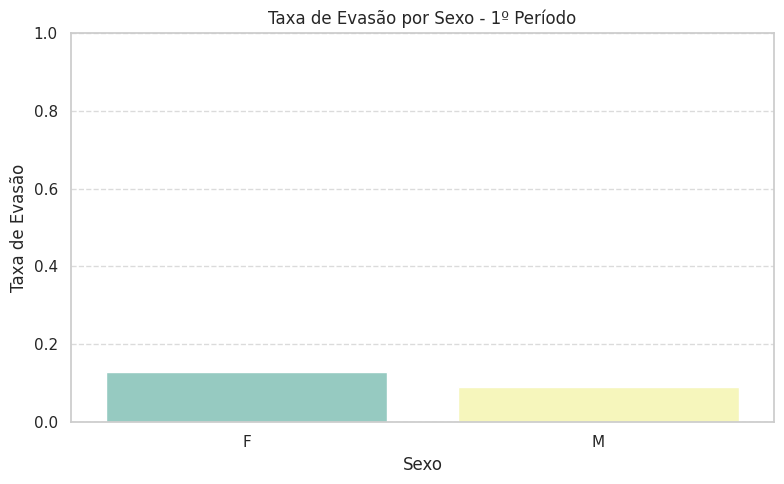

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              41   0.032643        0.243902
Divorciado           2   0.001592        0.000000
Nan                  4   0.003185        0.750000
Solteiro          1208   0.961783        0.091060
Viúvo                1   0.000796        0.000000


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


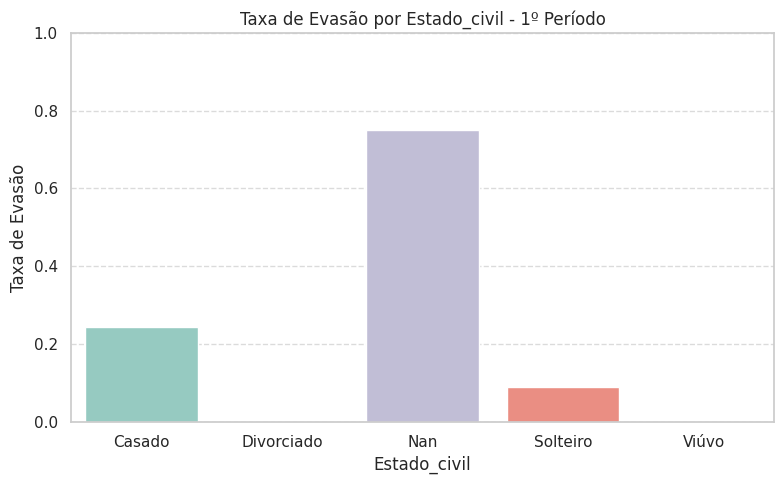


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.028662        0.194444
Branca         688   0.547771        0.072674
Indígena         4   0.003185        0.000000
Nan             24   0.019108        0.291667
Parda          444   0.353503        0.105856
Preta           60   0.047771        0.200000


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


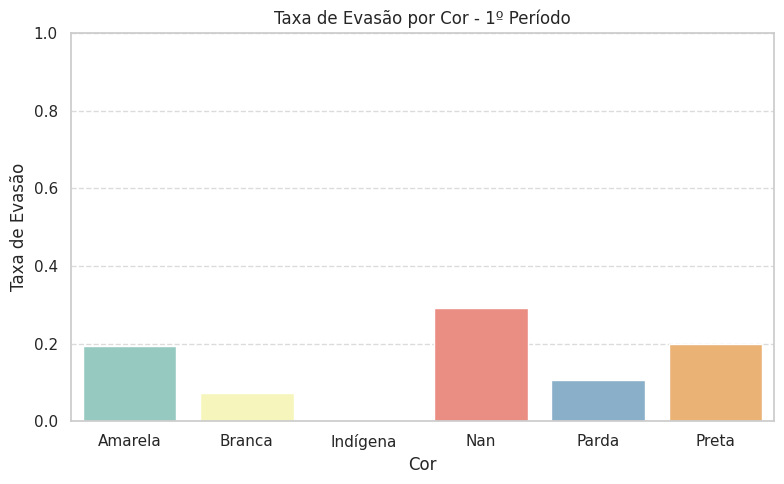


📘 Idade - Média: 30.30, Desvio Padrão: 5.41


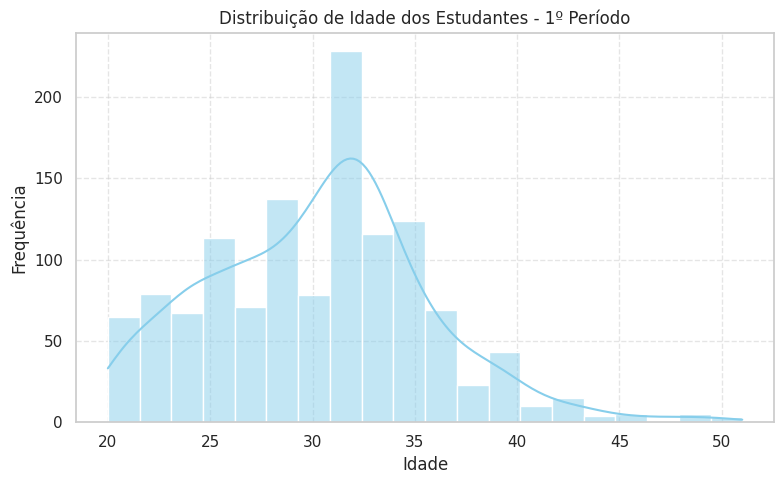

/tmp/ipykernel_1516507/364127247.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


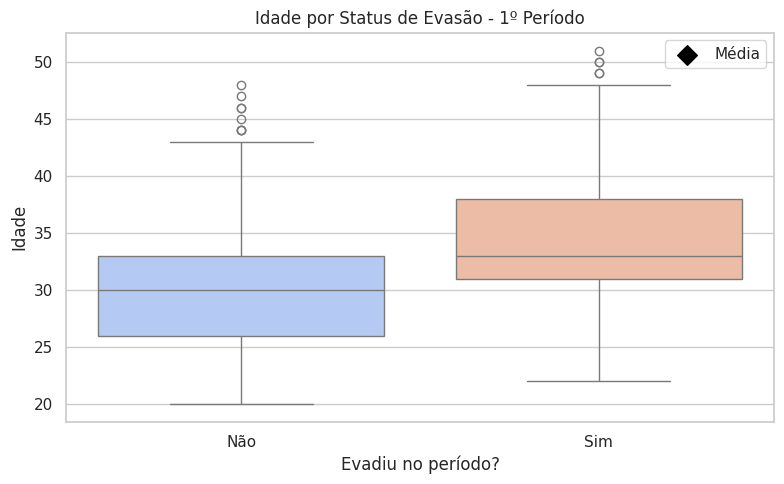


--- Análise das variáveis no 2º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          208   0.165605        0.086538
M         1048   0.834395        0.078244


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


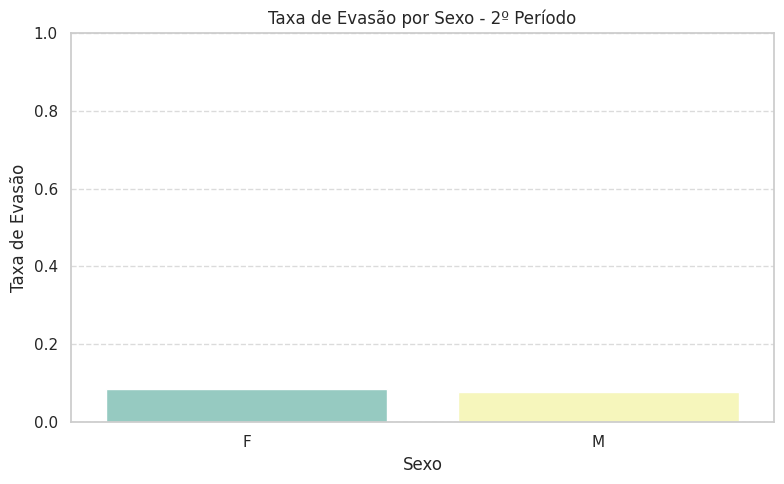

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              41   0.032643        0.146341
Divorciado           2   0.001592        0.000000
Nan                  4   0.003185        0.000000
Solteiro          1208   0.961783        0.077815
Viúvo                1   0.000796        0.000000


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


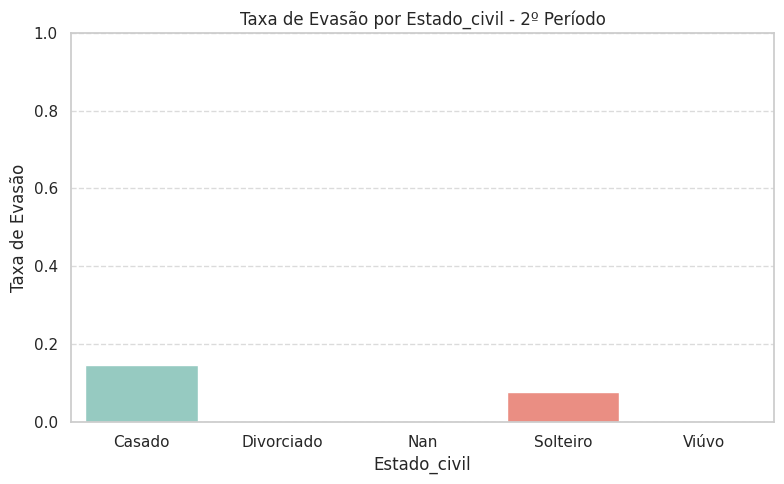


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.028662        0.000000
Branca         688   0.547771        0.063953
Indígena         4   0.003185        0.000000
Nan             24   0.019108        0.125000
Parda          444   0.353503        0.094595
Preta           60   0.047771        0.183333


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


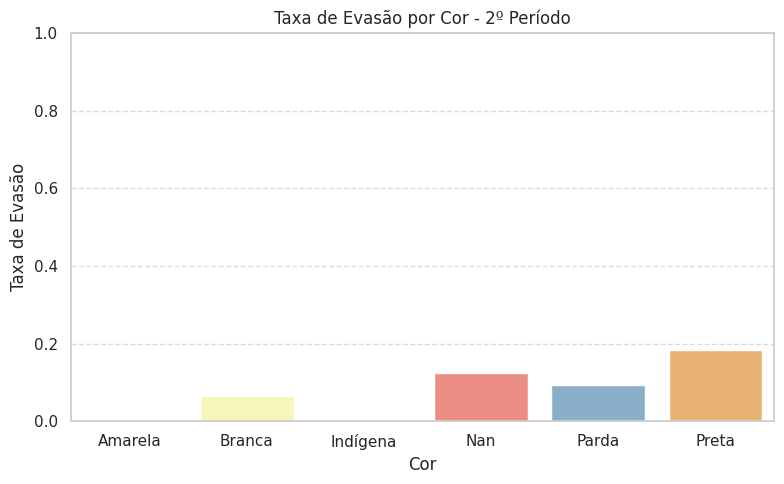


📘 Idade - Média: 30.30, Desvio Padrão: 5.41


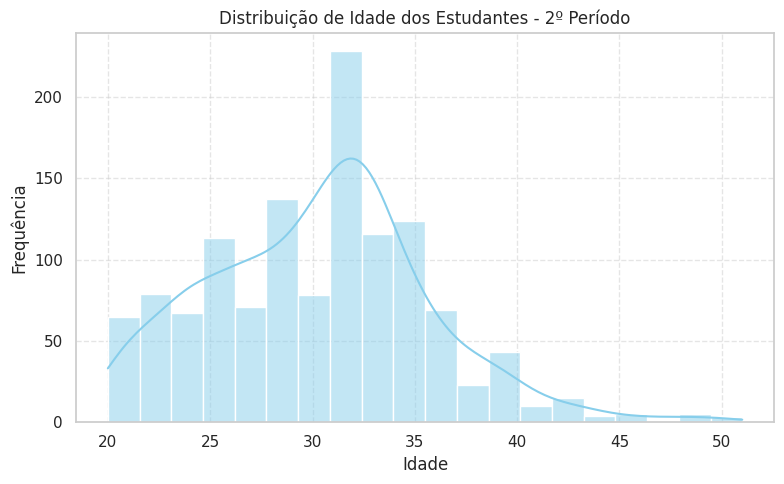

/tmp/ipykernel_1516507/364127247.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


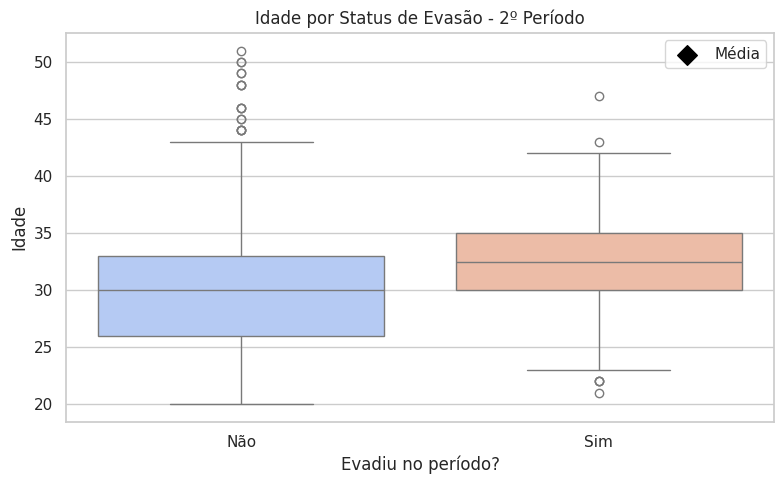


--- Análise das variáveis no 3º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          208   0.165605        0.048077
M         1048   0.834395        0.075382


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


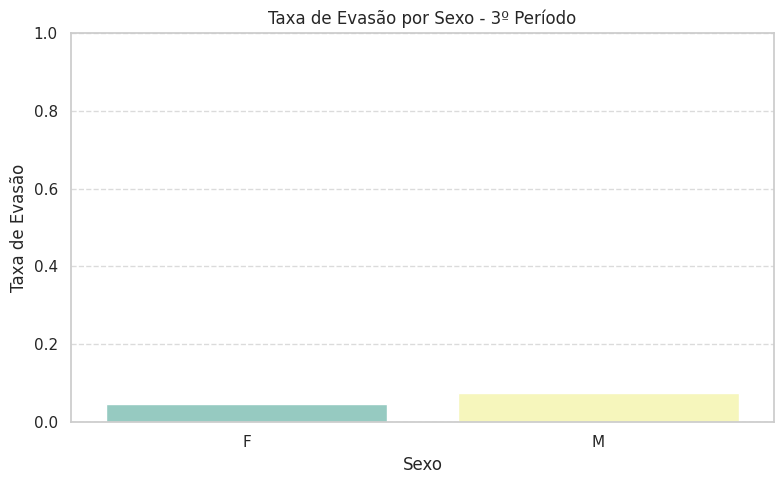

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              41   0.032643        0.048780
Divorciado           2   0.001592        1.000000
Nan                  4   0.003185        0.000000
Solteiro          1208   0.961783        0.070364
Viúvo                1   0.000796        0.000000


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


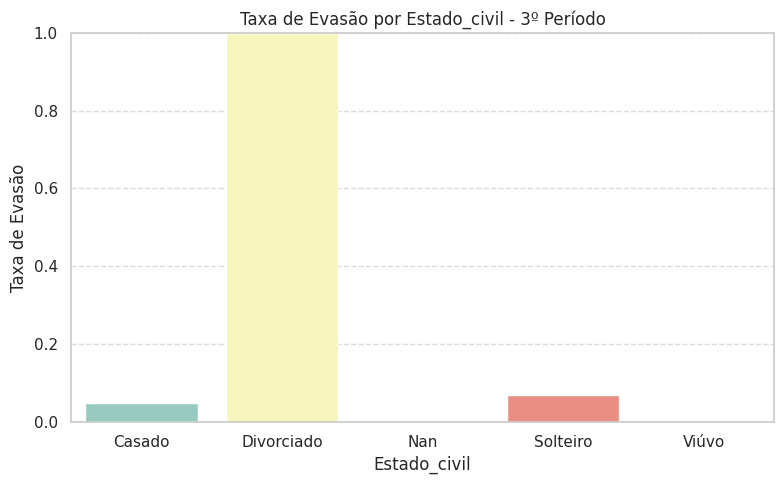


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.028662        0.166667
Branca         688   0.547771        0.065407
Indígena         4   0.003185        0.250000
Nan             24   0.019108        0.166667
Parda          444   0.353503        0.065315
Preta           60   0.047771        0.066667


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


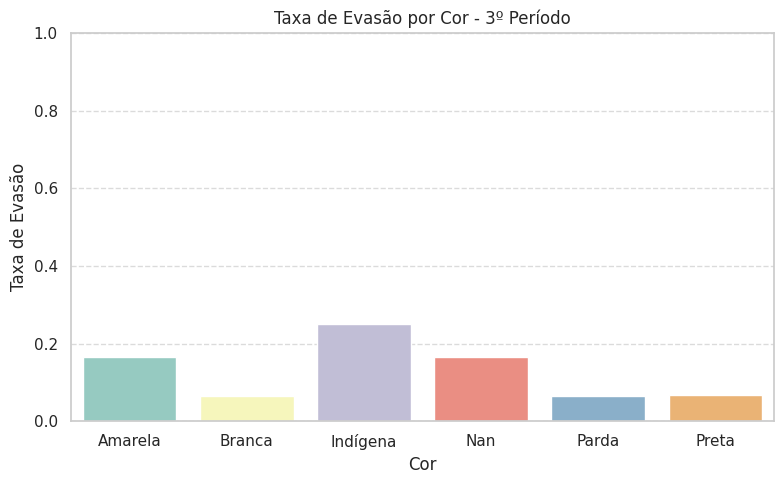


📘 Idade - Média: 30.30, Desvio Padrão: 5.41


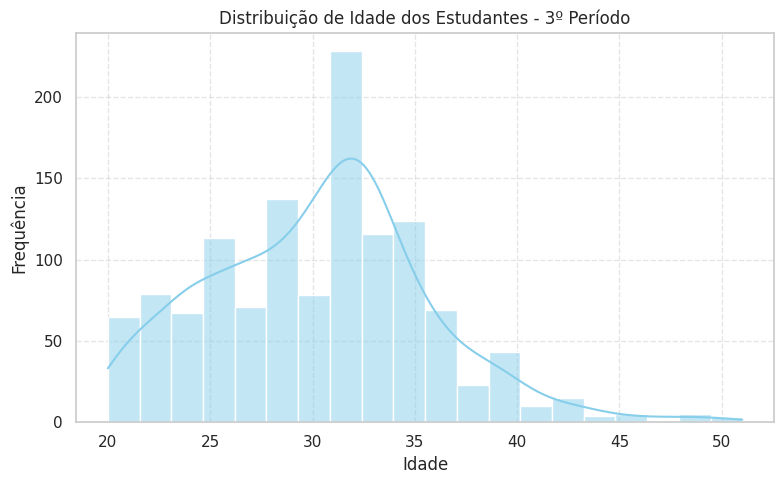

/tmp/ipykernel_1516507/364127247.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


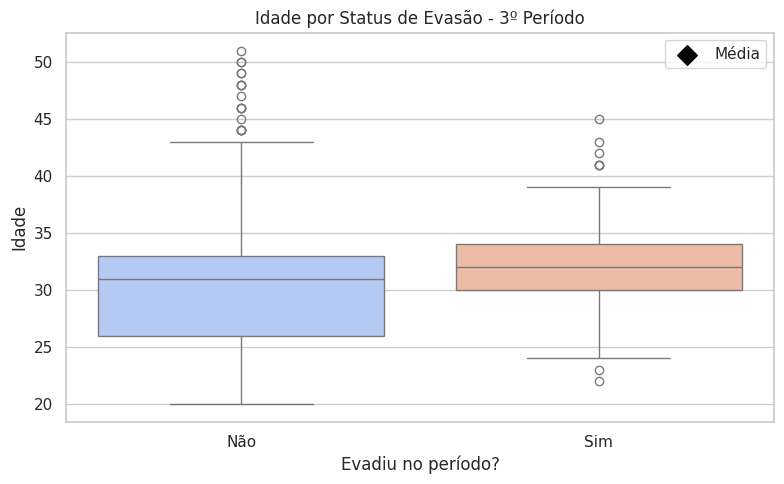


--- Análise das variáveis no 4º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          208   0.165605        0.062500
M         1048   0.834395        0.094466


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


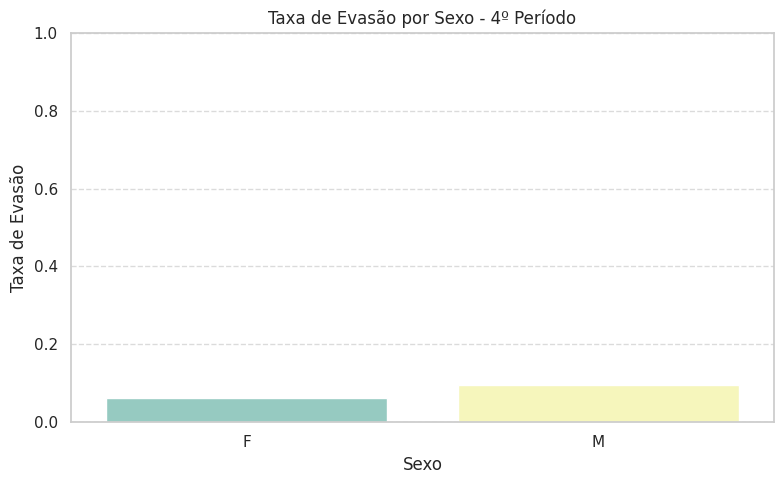

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              41   0.032643         0.04878
Divorciado           2   0.001592         0.00000
Nan                  4   0.003185         0.00000
Solteiro          1208   0.961783         0.09106
Viúvo                1   0.000796         0.00000


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


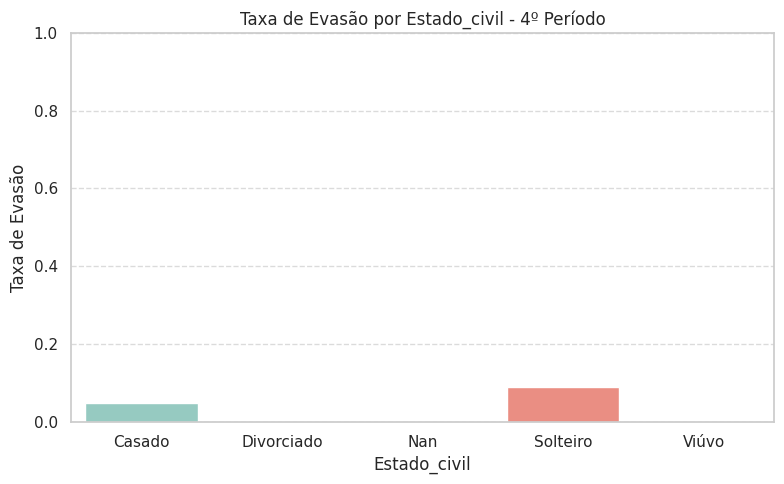


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.028662        0.111111
Branca         688   0.547771        0.091570
Indígena         4   0.003185        0.000000
Nan             24   0.019108        0.166667
Parda          444   0.353503        0.083333
Preta           60   0.047771        0.066667


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


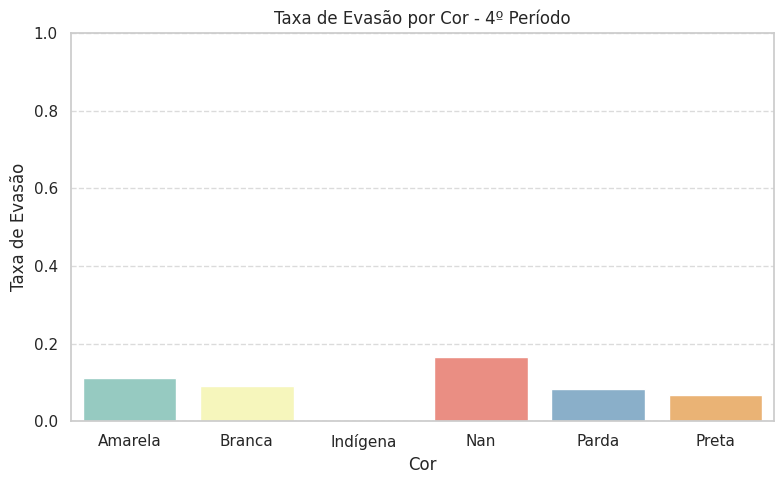


📘 Idade - Média: 30.30, Desvio Padrão: 5.41


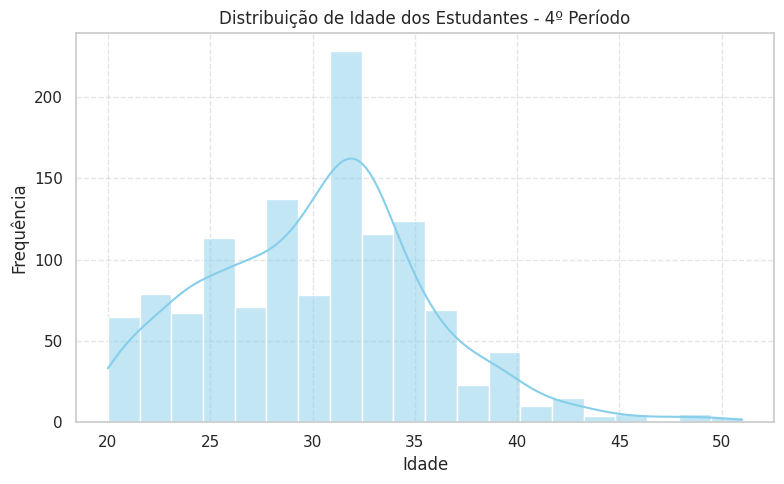

/tmp/ipykernel_1516507/364127247.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


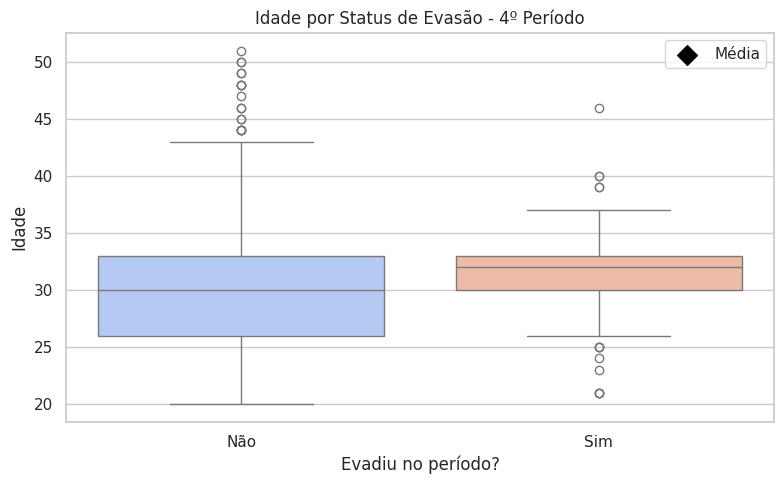

/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



📘📘📘 TABELA: ALUNOS-FINAL 📘📘📘

--- Análise das variáveis no 1º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          400   0.175362        0.090000
M         1881   0.824638        0.082403


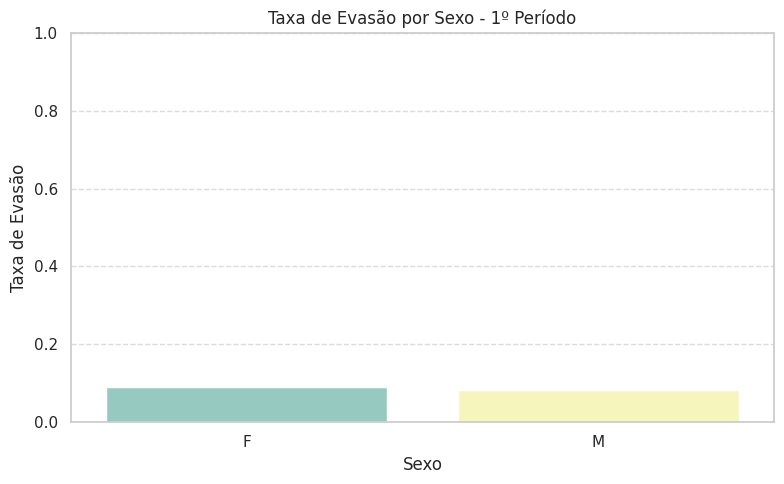

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              59   0.025866        0.220339
Divorciado           3   0.001315        0.000000
Nan                  7   0.003069        0.857143
Solteiro          2212   0.969750        0.077758


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


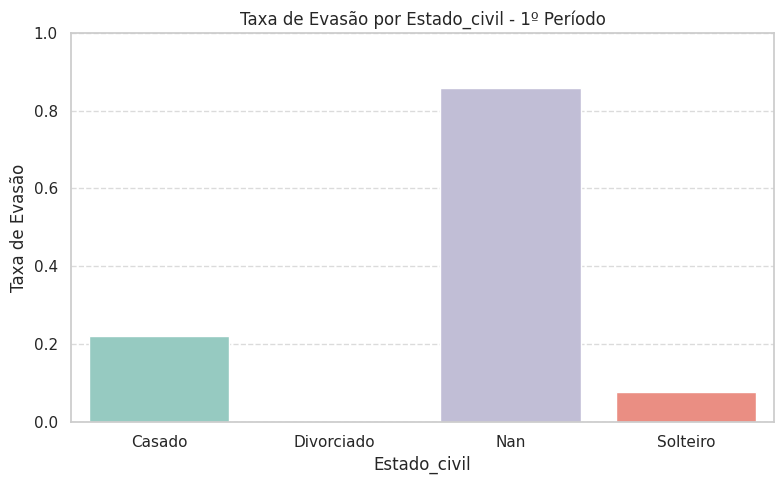


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022359        0.156863
Branca        1158   0.507672        0.066494
Indígena         4   0.001754        0.000000
Nan             28   0.012275        0.428571
Parda          932   0.408593        0.085837
Preta          108   0.047348        0.129630


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


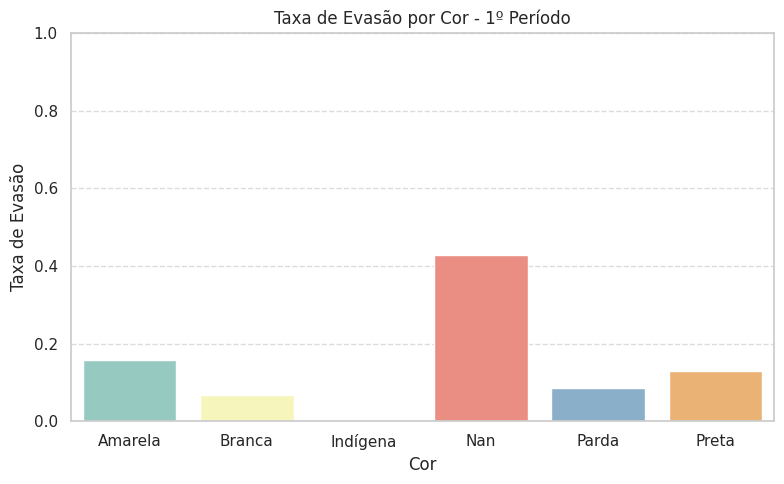

⚠️ Variável idade NÃO encontrada na tabela.

--- Análise das variáveis no 2º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          400   0.175362         0.05000
M         1881   0.824638         0.05529


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


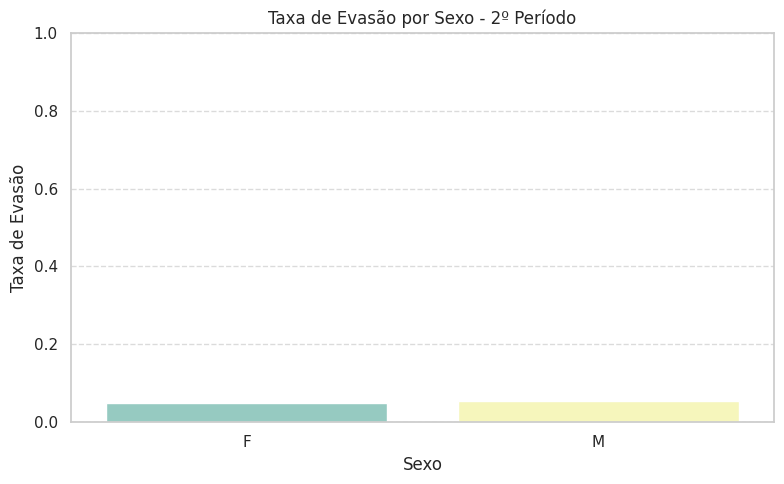

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              59   0.025866        0.135593
Divorciado           3   0.001315        0.000000
Nan                  7   0.003069        0.000000
Solteiro          2212   0.969750        0.052441


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


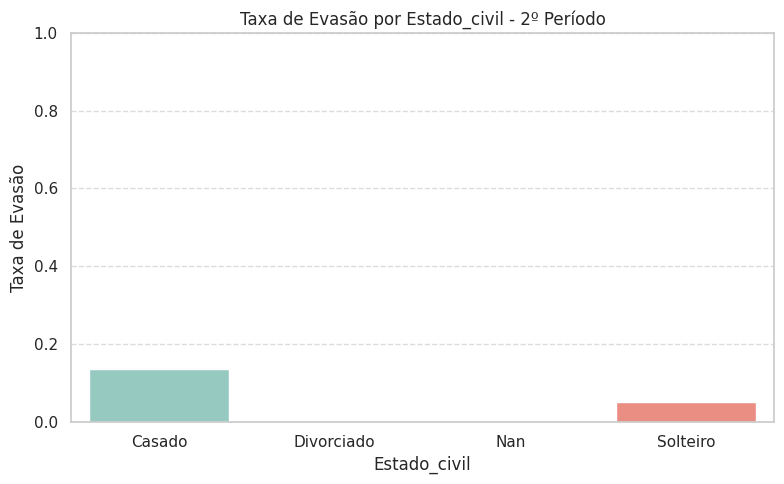


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022359        0.019608
Branca        1158   0.507672        0.055268
Indígena         4   0.001754        0.000000
Nan             28   0.012275        0.071429
Parda          932   0.408593        0.046137
Preta          108   0.047348        0.129630


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


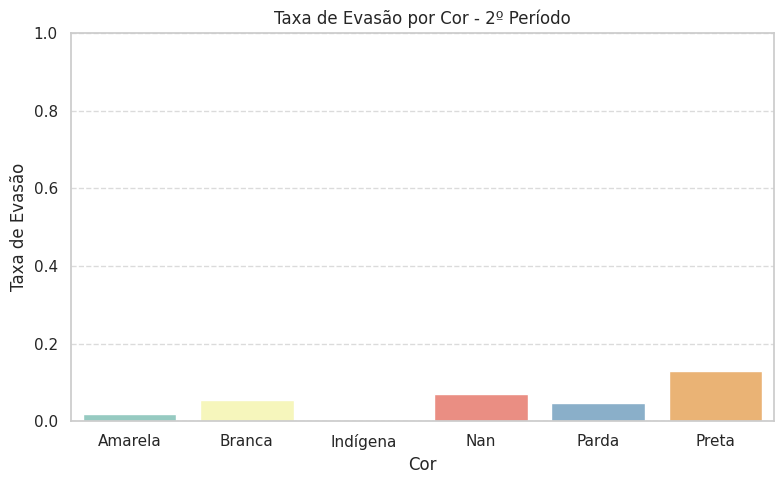

⚠️ Variável idade NÃO encontrada na tabela.

--- Análise das variáveis no 3º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          400   0.175362          0.0450
M         1881   0.824638          0.0521


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


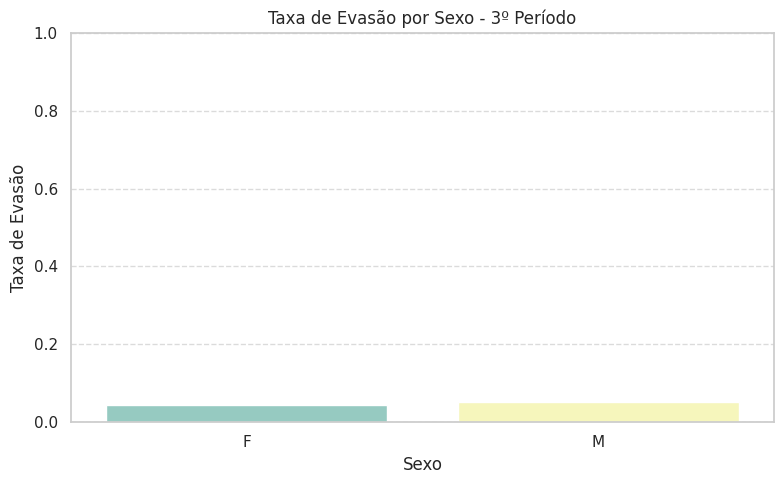

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              59   0.025866        0.050847
Divorciado           3   0.001315        0.666667
Nan                  7   0.003069        0.000000
Solteiro          2212   0.969750        0.050181


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


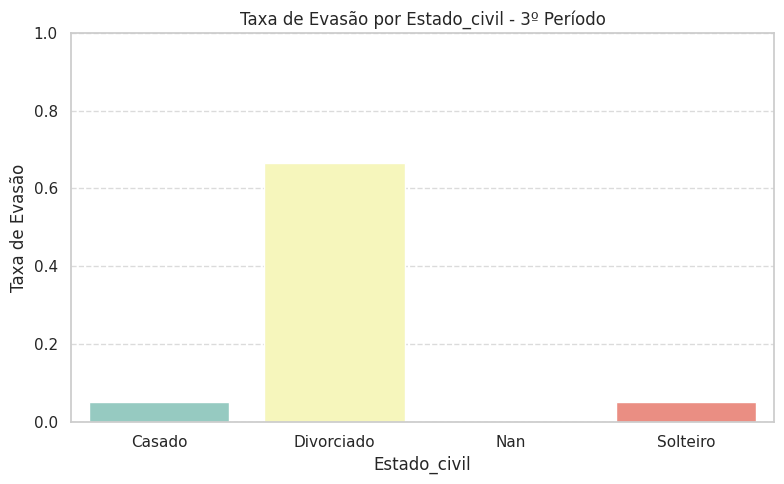


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022359        0.039216
Branca        1158   0.507672        0.050950
Indígena         4   0.001754        0.500000
Nan             28   0.012275        0.035714
Parda          932   0.408593        0.051502
Preta          108   0.047348        0.037037


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


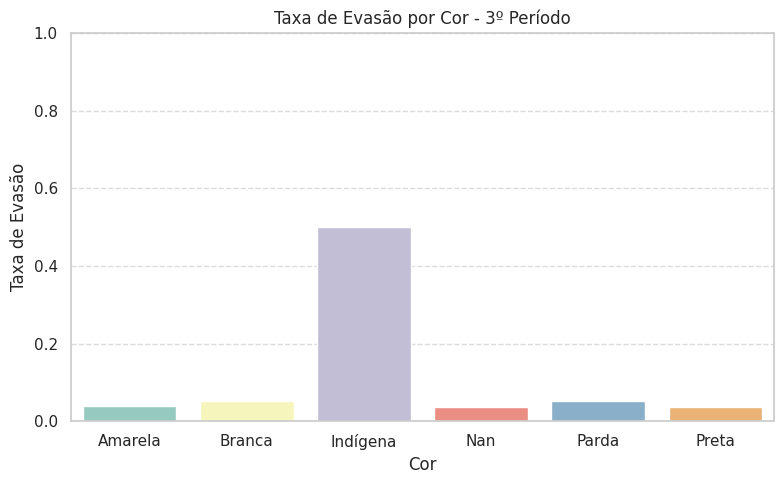

⚠️ Variável idade NÃO encontrada na tabela.

--- Análise das variáveis no 4º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          400   0.175362        0.035000
M         1881   0.824638        0.057416


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


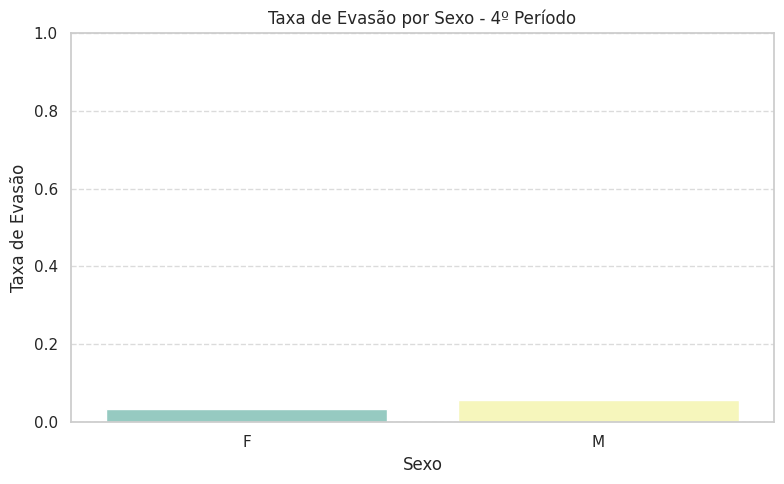

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              59   0.025866        0.050847
Divorciado           3   0.001315        0.000000
Nan                  7   0.003069        0.000000
Solteiro          2212   0.969750        0.053797


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


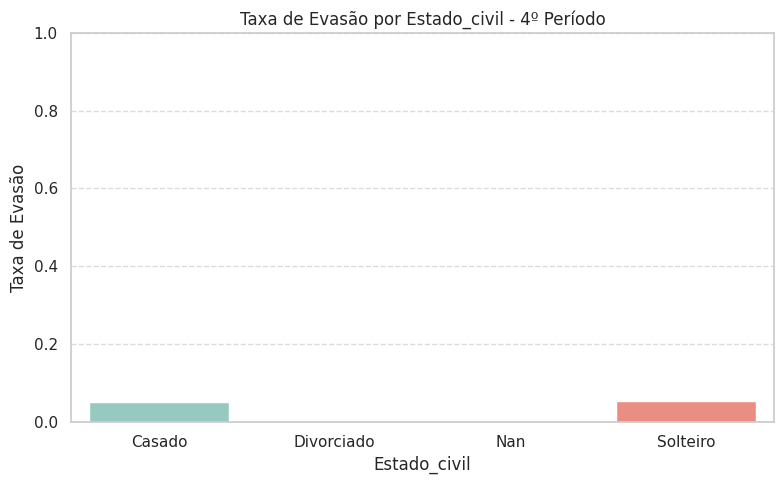


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022359        0.098039
Branca        1158   0.507672        0.050086
Indígena         4   0.001754        0.000000
Nan             28   0.012275        0.142857
Parda          932   0.408593        0.052575
Preta          108   0.047348        0.055556


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


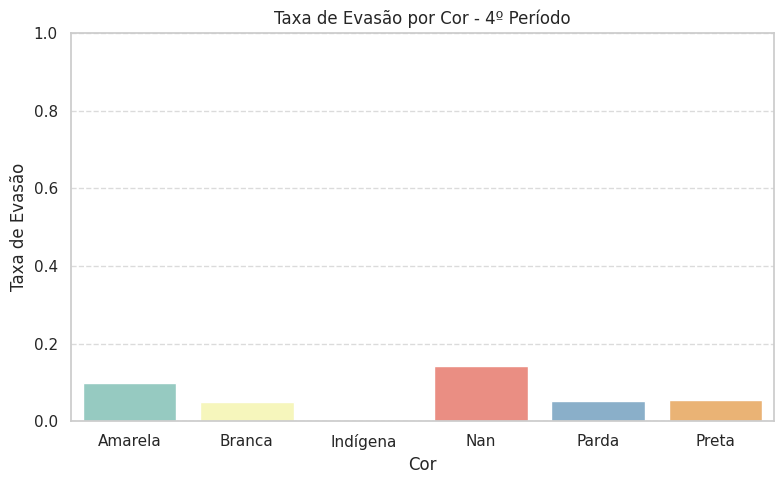

⚠️ Variável idade NÃO encontrada na tabela.

📘📘📘 TABELA: ALUNOS-FILTRADO-SEM-METRICAS 📘📘📘

--- Análise das variáveis no 1º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          208   0.165605        0.129808
M         1048   0.834395        0.091603


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


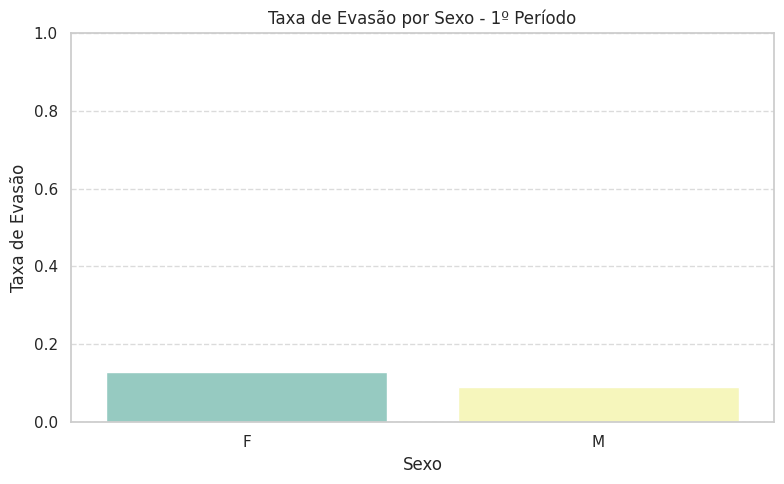

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              41   0.032643        0.243902
Divorciado           2   0.001592        0.000000
Nan                  4   0.003185        0.750000
Solteiro          1208   0.961783        0.091060
Viúvo                1   0.000796        0.000000


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


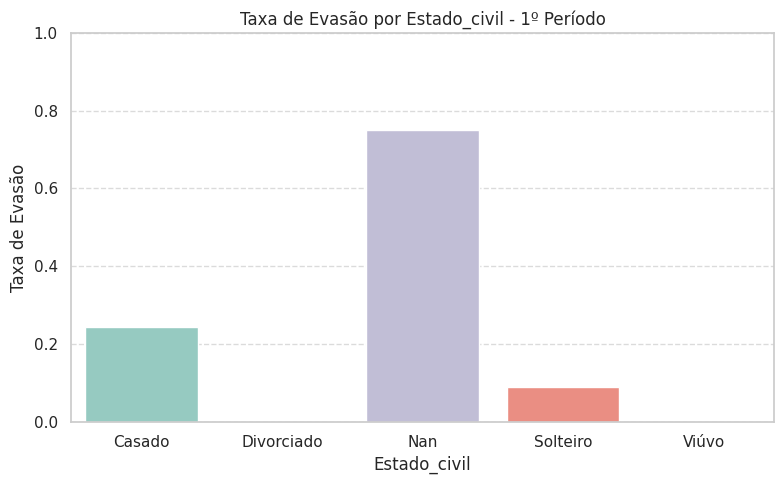


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.028662        0.194444
Branca         688   0.547771        0.072674
Indígena         4   0.003185        0.000000
Nan             24   0.019108        0.291667
Parda          444   0.353503        0.105856
Preta           60   0.047771        0.200000


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


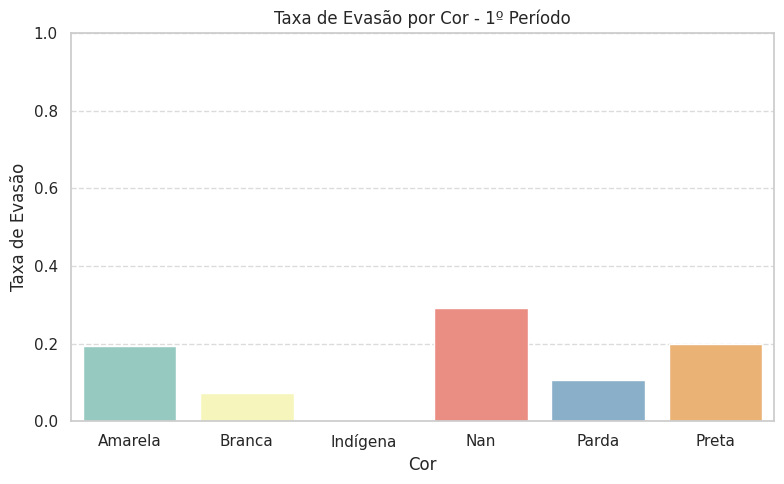


📘 Idade - Média: 30.30, Desvio Padrão: 5.41


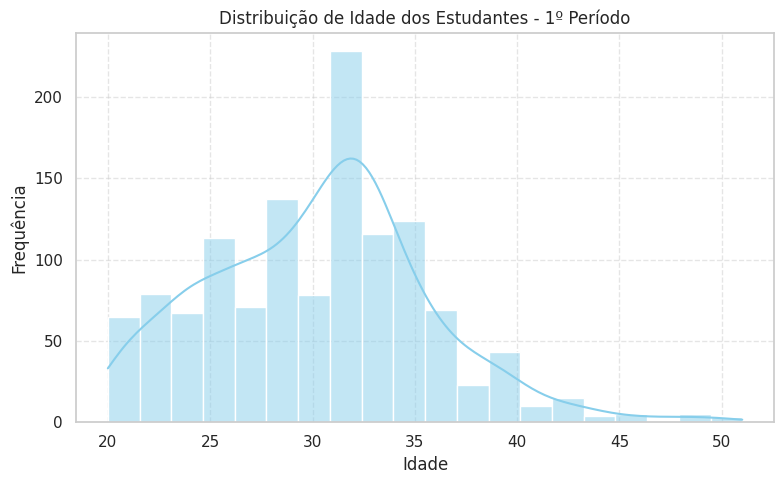

/tmp/ipykernel_1516507/364127247.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


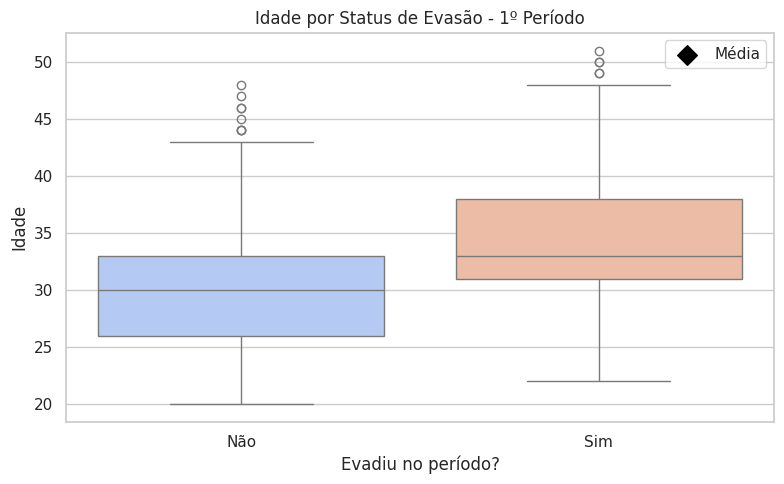


--- Análise das variáveis no 2º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          208   0.165605        0.086538
M         1048   0.834395        0.078244


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


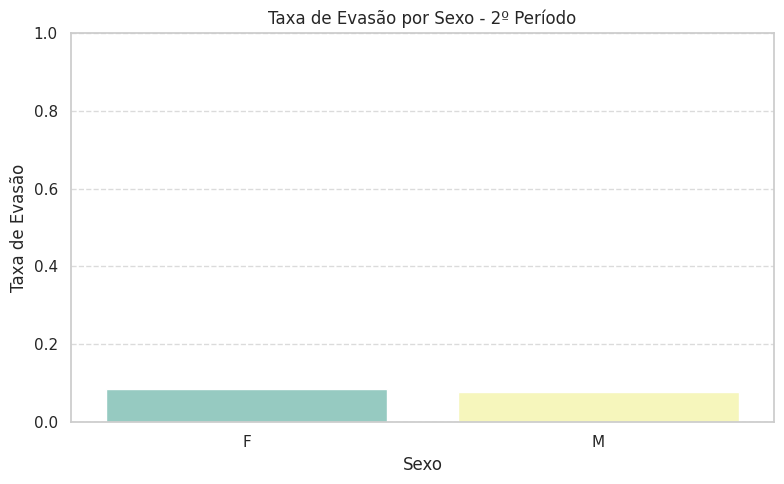

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              41   0.032643        0.146341
Divorciado           2   0.001592        0.000000
Nan                  4   0.003185        0.000000
Solteiro          1208   0.961783        0.077815
Viúvo                1   0.000796        0.000000


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


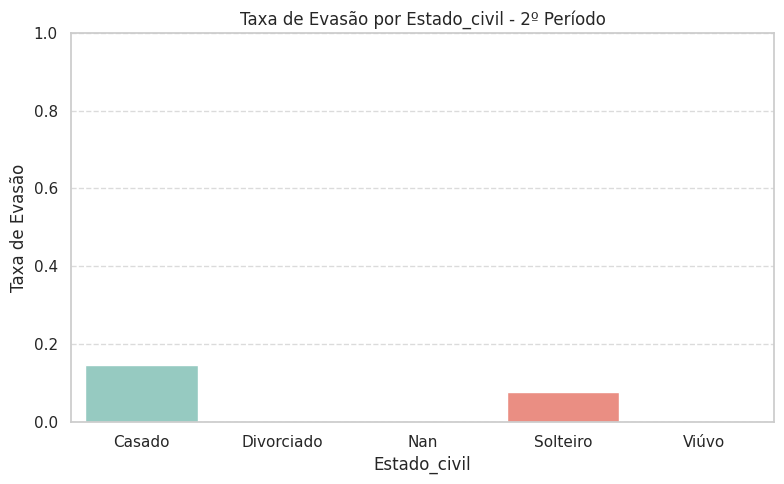


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.028662        0.000000
Branca         688   0.547771        0.063953
Indígena         4   0.003185        0.000000
Nan             24   0.019108        0.125000
Parda          444   0.353503        0.094595
Preta           60   0.047771        0.183333


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


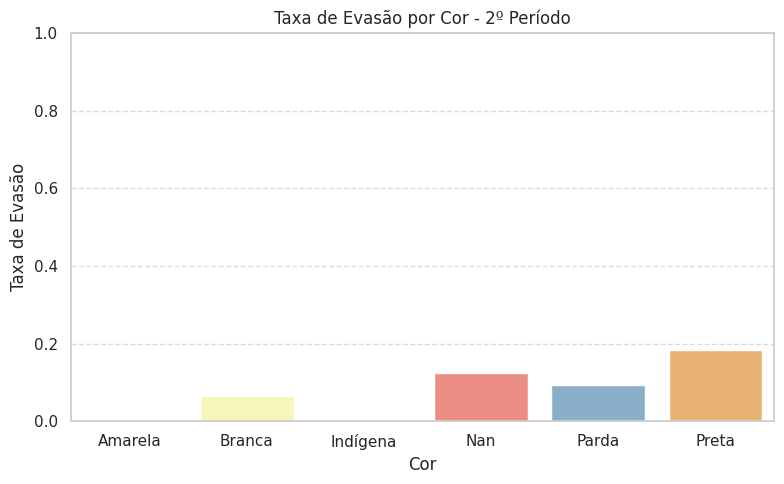


📘 Idade - Média: 30.30, Desvio Padrão: 5.41


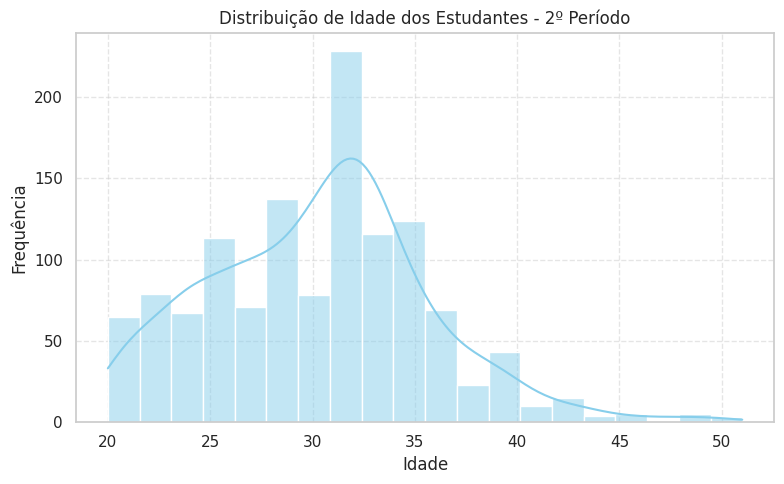

/tmp/ipykernel_1516507/364127247.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


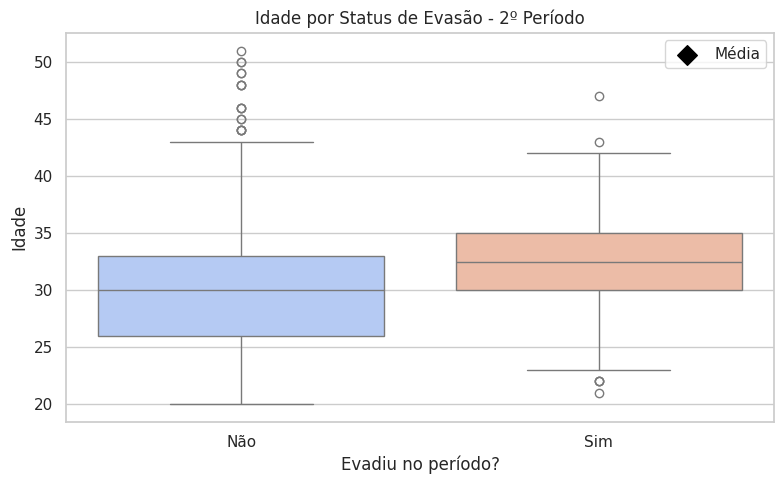


--- Análise das variáveis no 3º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          208   0.165605        0.048077
M         1048   0.834395        0.075382


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


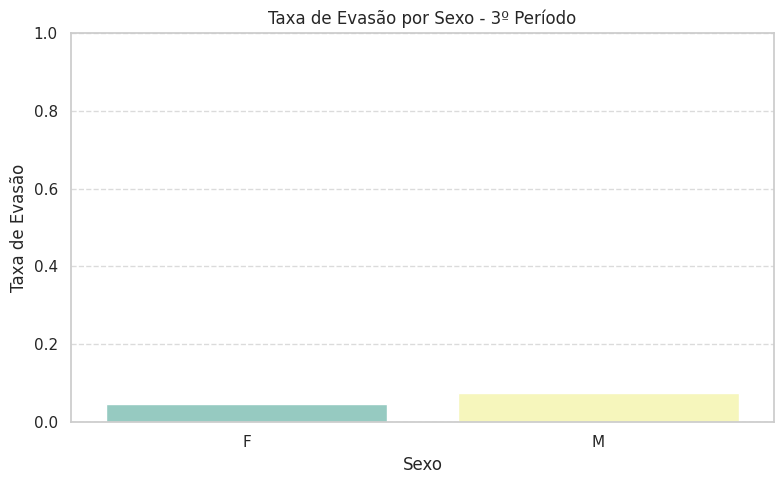

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              41   0.032643        0.048780
Divorciado           2   0.001592        1.000000
Nan                  4   0.003185        0.000000
Solteiro          1208   0.961783        0.070364
Viúvo                1   0.000796        0.000000


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


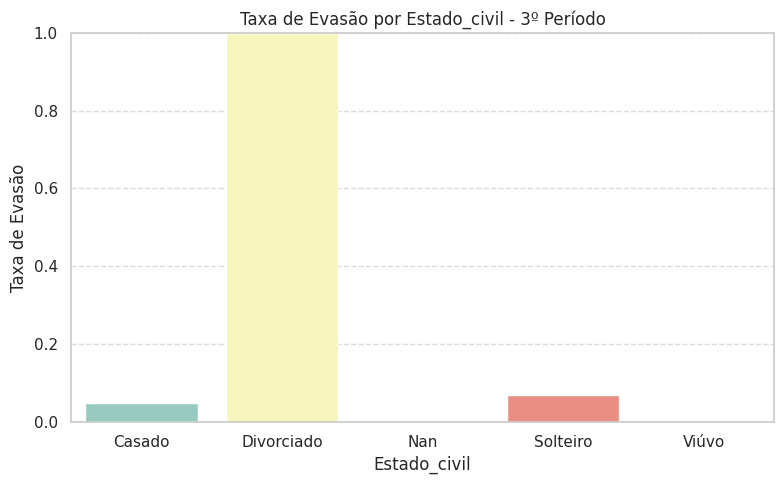


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.028662        0.166667
Branca         688   0.547771        0.065407
Indígena         4   0.003185        0.250000
Nan             24   0.019108        0.166667
Parda          444   0.353503        0.065315
Preta           60   0.047771        0.066667


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


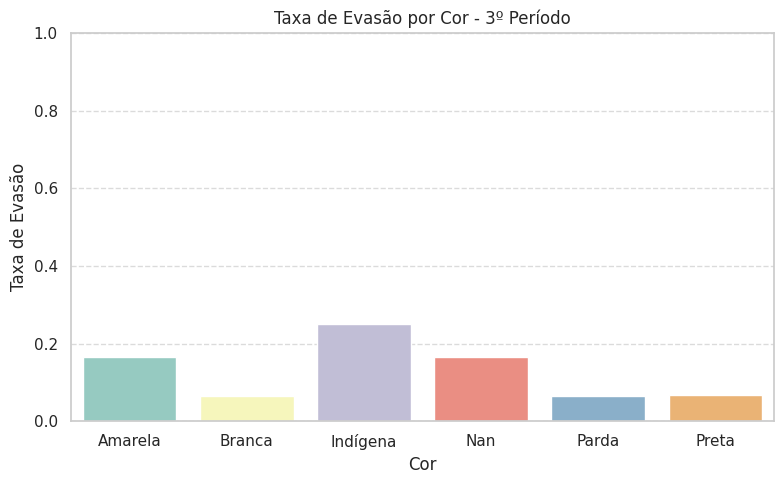


📘 Idade - Média: 30.30, Desvio Padrão: 5.41


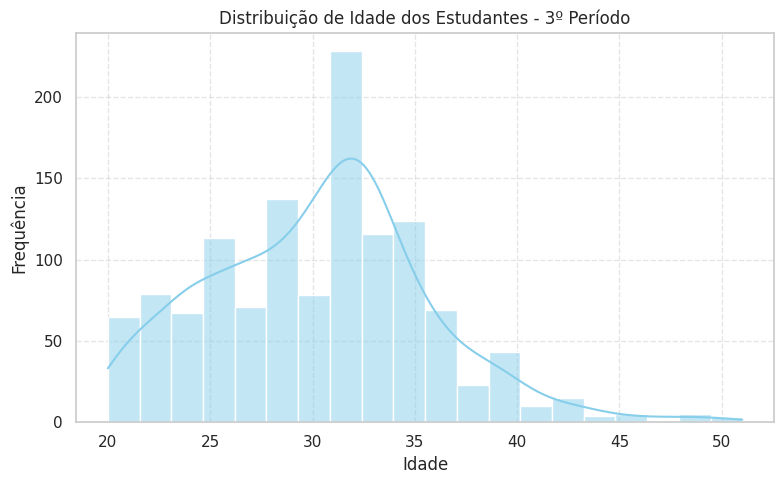

/tmp/ipykernel_1516507/364127247.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


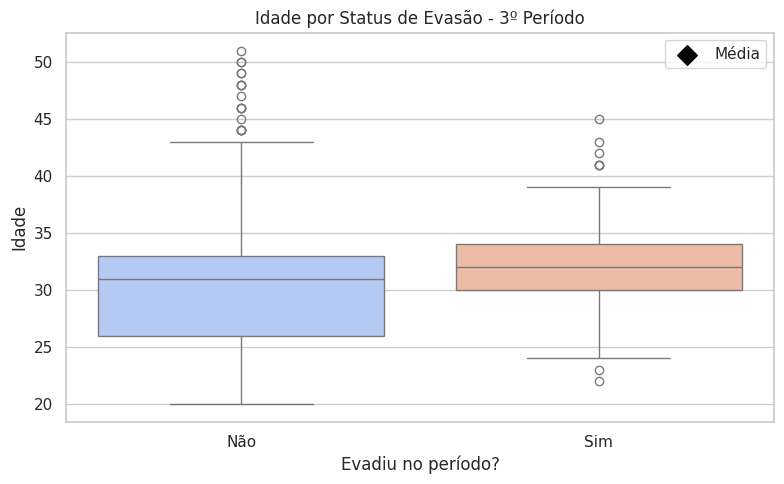


--- Análise das variáveis no 4º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          208   0.165605        0.062500
M         1048   0.834395        0.094466


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


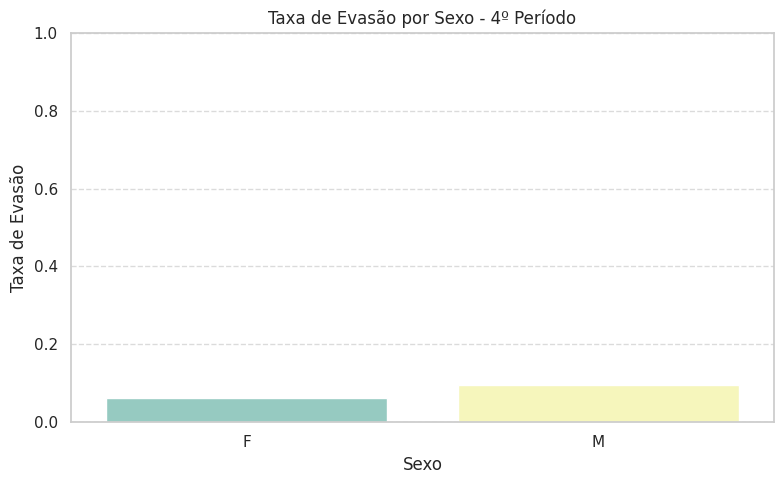

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              41   0.032643         0.04878
Divorciado           2   0.001592         0.00000
Nan                  4   0.003185         0.00000
Solteiro          1208   0.961783         0.09106
Viúvo                1   0.000796         0.00000


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


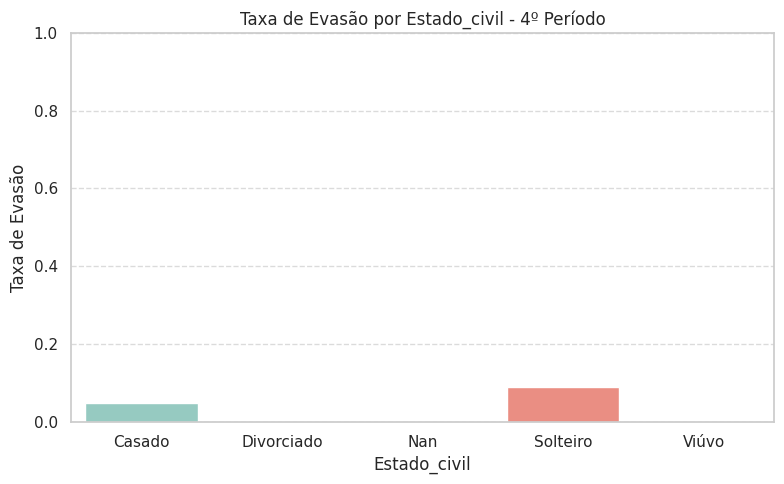


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.028662        0.111111
Branca         688   0.547771        0.091570
Indígena         4   0.003185        0.000000
Nan             24   0.019108        0.166667
Parda          444   0.353503        0.083333
Preta           60   0.047771        0.066667


/tmp/ipykernel_1516507/364127247.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


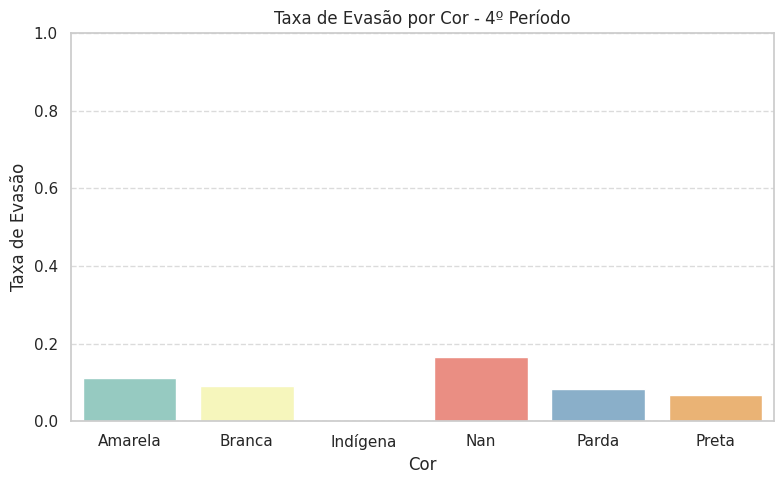


📘 Idade - Média: 30.30, Desvio Padrão: 5.41


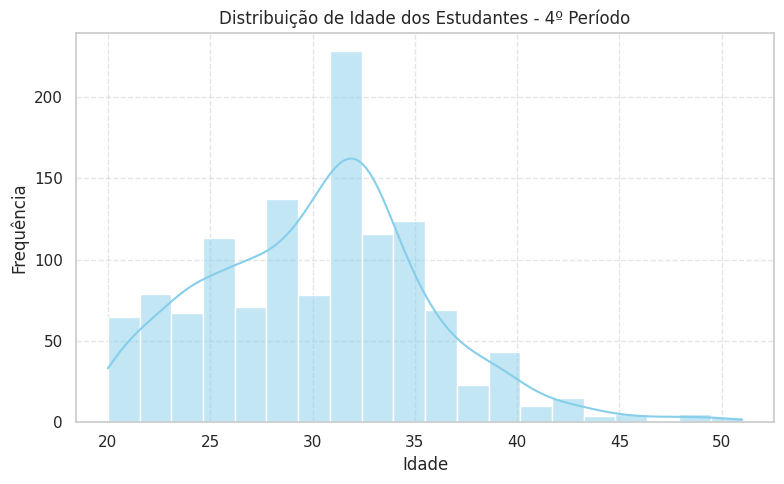

/tmp/ipykernel_1516507/364127247.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


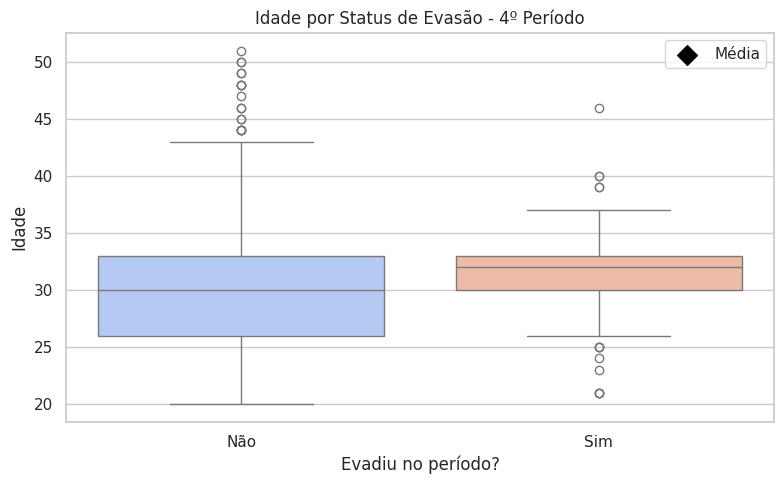

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def analisar_variaveis_com_graficos(df, n_periodo=1):
    df = df.copy()

    # 🔹 Garantir que os campos de período estão como string
    df['periodo_de_ingresso'] = df['periodo_de_ingresso'].astype(str).fillna('')
    df['periodo_de_evasao'] = df['periodo_de_evasao'].astype(str).fillna('')

    # 🔹 Calcular o período esperado de evasão
    df['periodo_esperado_evasao'] = df['periodo_de_ingresso'].apply(
        lambda x: proximo_n_periodo(x, n_periodo)
    )

    # 🔹 Verificar evasão no período esperado
    evasao_col = f'evadiu_no_{n_periodo}o_periodo'
    df[evasao_col] = df.apply(
        lambda row: row['periodo_de_evasao'] == row['periodo_esperado_evasao'],
        axis=1
    )

    print(f"\n--- Análise das variáveis no {n_periodo}º período ---")

    # 🔹 Variáveis categóricas
    variaveis_categoricas = ['sexo', 'cota', 'estado_civil', 'cor']
    for var in variaveis_categoricas:
        if var in df.columns:
            contagem = df[var].value_counts()
            proporcao = df[var].value_counts(normalize=True)
            taxa_evasao = df.groupby(var)[evasao_col].mean()

            tabela = pd.DataFrame({
                'Contagem': contagem,
                'Proporção': proporcao,
                'Taxa de Evasão': taxa_evasao
            })

            print(f"\n🟨 Tabela - {var.capitalize()}:")
            print(tabela)

            # 🔸 Gráfico: Taxa de evasão por categoria
            plt.figure(figsize=(8, 5))
            sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')
            plt.title(f'Taxa de Evasão por {var.capitalize()} - {n_periodo}º Período')
            plt.ylabel('Taxa de Evasão')
            plt.xlabel(var.capitalize())
            plt.ylim(0, 1)
            plt.grid(axis='y', linestyle='--', alpha=0.7)
            plt.tight_layout()
            plt.show()
        else:
            print(f"⚠️ Variável {var} NÃO encontrada na tabela.")

    # 🔹 Variável numérica: idade
    if 'idade' in df.columns:
        media_idade = df['idade'].mean()
        desvio_idade = df['idade'].std()
        print(f"\n📘 Idade - Média: {media_idade:.2f}, Desvio Padrão: {desvio_idade:.2f}")

        # 🔸 Histograma
        plt.figure(figsize=(8, 5))
        sns.histplot(df['idade'], bins=20, kde=True, color='skyblue')
        plt.title(f'Distribuição de Idade dos Estudantes - {n_periodo}º Período')
        plt.xlabel('Idade')
        plt.ylabel('Frequência')
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()

        # 🔸 Boxplot com ponto da média
        plt.figure(figsize=(8, 5))

        # Converter valores booleanos para strings "Sim"/"Não"
        df[evasao_col + '_rotulo'] = df[evasao_col].map({True: 'Sim', False: 'Não'})

        sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')

        # Adicionando ponto da média
        medias = df.groupby(evasao_col + '_rotulo')['idade'].mean()
        for i, (label, media) in enumerate(medias.items()):
            plt.scatter(i, media, color='black', s=100, marker='D', label='Média' if i == 0 else "")

        plt.title(f'Idade por Status de Evasão - {n_periodo}º Período')
        plt.xlabel('Evadiu no período?')
        plt.ylabel('Idade')
        plt.legend()
        plt.tight_layout()
        plt.show()
    else:
        print("⚠️ Variável idade NÃO encontrada na tabela.")

# 🔁 Execução para múltiplas tabelas e períodos
for nome in tabelas_nomes:
    df = tabelas_tratadas_limpo[nome]
    print(f"\n📘📘📘 TABELA: {nome.upper()} 📘📘📘")
    
    for periodo in range(1, 5):
        analisar_variaveis_com_graficos(df, n_periodo=periodo)


### Teste qui-quadrado para variáveis categóricas (sexo, estado_civil, cor, etc.)


📘📘📘 TABELA: ALUNOS-NOVOS-SEM-REINGRESSOS-NOVOS-OU-ANTIGOS-SEM-METRICAS 📘📘📘

--- Análise das variáveis no 1º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          399      0.175        0.092732
M         1881      0.825        0.083998

📊 Teste Qui-Quadrado entre 'sexo' e evasão:
- Valor de p: 0.6397
❌ Nenhuma associação significativa entre 'sexo' e evasão no 1º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


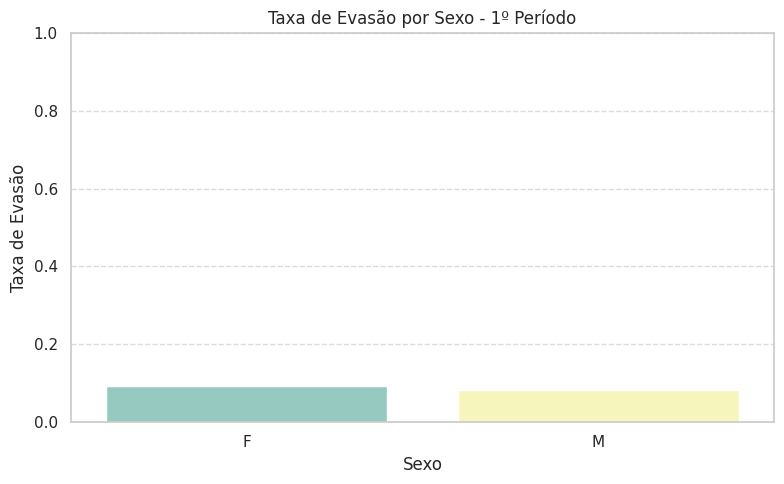

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              58   0.025439        0.241379
Divorciado           3   0.001316        0.000000
Nan                  7   0.003070        0.857143
Solteiro          2212   0.970175        0.079114


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



📊 Teste Qui-Quadrado entre 'estado_civil' e evasão:
- Valor de p: 0.0000
✅ Associação significativa entre 'estado_civil' e evasão no 1º período.


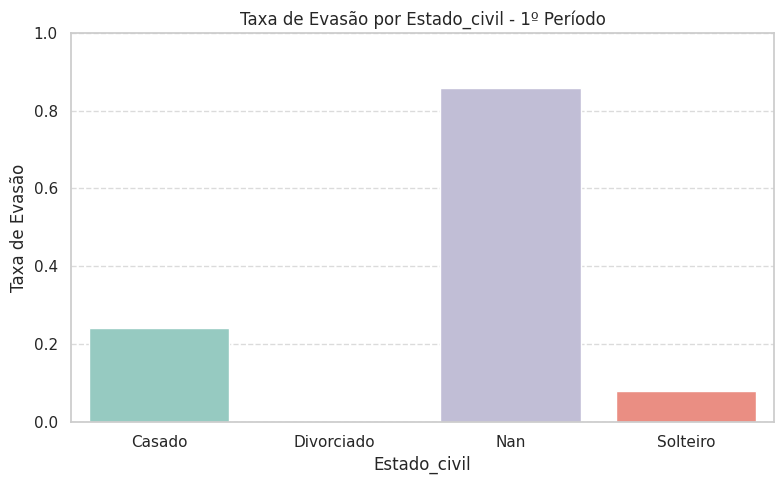


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022368        0.156863
Branca        1157   0.507456        0.069144
Indígena         4   0.001754        0.000000
Nan             28   0.012281        0.428571
Parda          932   0.408772        0.086910
Preta          108   0.047368        0.129630

📊 Teste Qui-Quadrado entre 'cor' e evasão:
- Valor de p: 0.0000
✅ Associação significativa entre 'cor' e evasão no 1º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


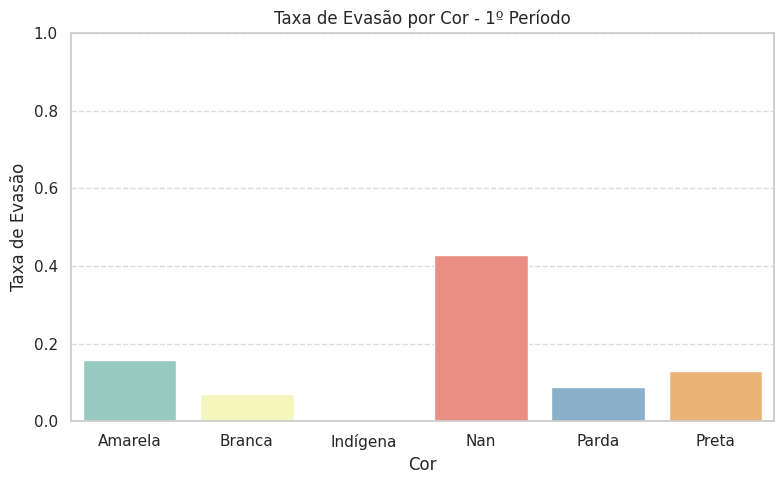


📘 Idade - Média: 27.76, Desvio Padrão: 5.12


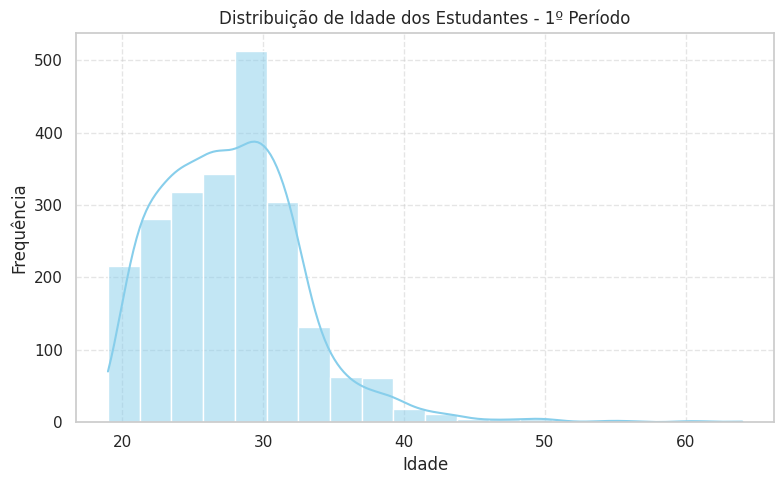

/tmp/ipykernel_1516507/810047795.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


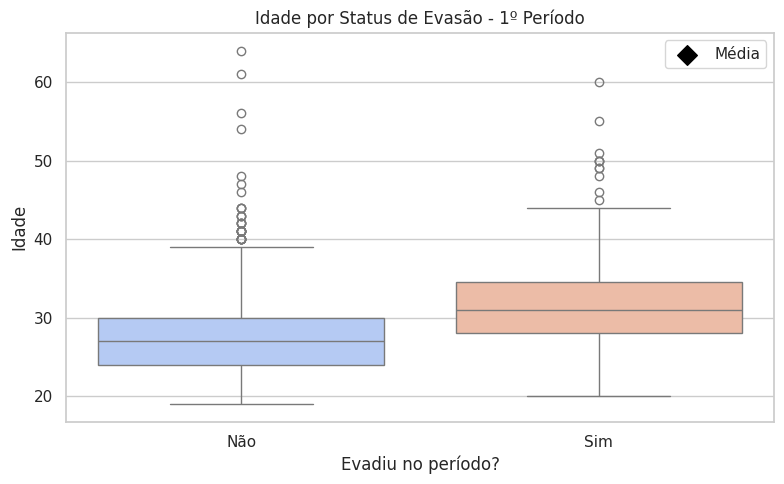


--- Análise das variáveis no 2º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          399      0.175        0.055138
M         1881      0.825        0.062733

📊 Teste Qui-Quadrado entre 'sexo' e evasão:
- Valor de p: 0.6461
❌ Nenhuma associação significativa entre 'sexo' e evasão no 2º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


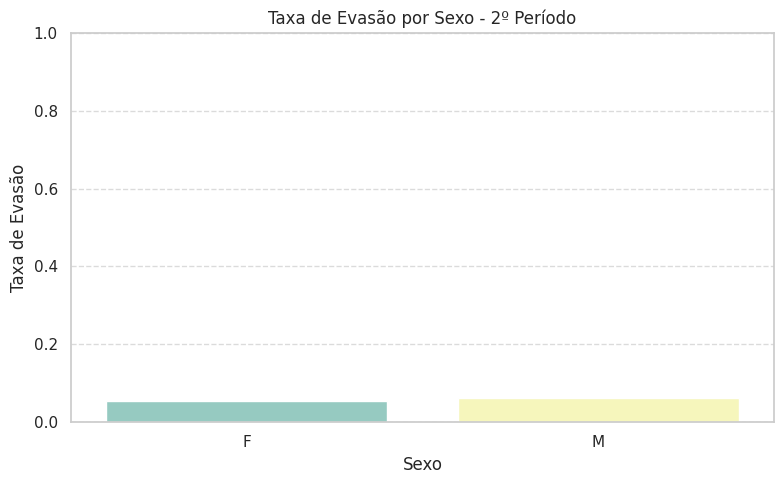

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              58   0.025439        0.120690
Divorciado           3   0.001316        0.000000
Nan                  7   0.003070        0.000000
Solteiro          2212   0.970175        0.060127

📊 Teste Qui-Quadrado entre 'estado_civil' e evasão:
- Valor de p: 0.2353
❌ Nenhuma associação significativa entre 'estado_civil' e evasão no 2º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


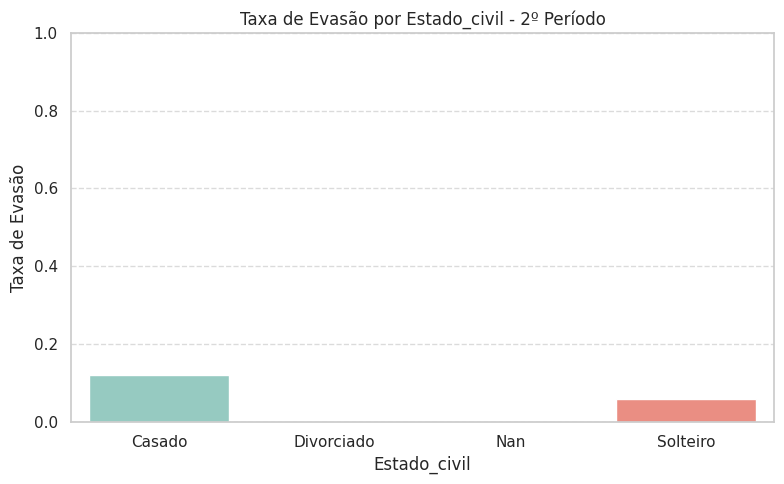


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022368        0.019608
Branca        1157   0.507456        0.059637
Indígena         4   0.001754        0.000000
Nan             28   0.012281        0.071429
Parda          932   0.408772        0.056867
Preta          108   0.047368        0.138889


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



📊 Teste Qui-Quadrado entre 'cor' e evasão:
- Valor de p: 0.0191
✅ Associação significativa entre 'cor' e evasão no 2º período.


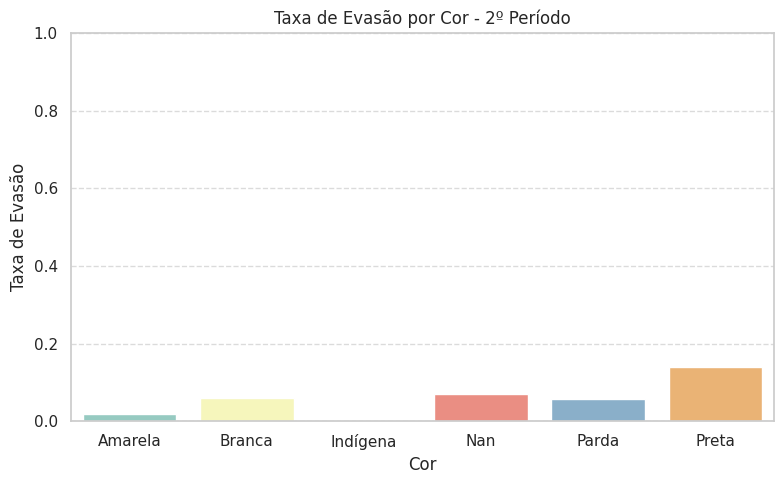


📘 Idade - Média: 27.76, Desvio Padrão: 5.12


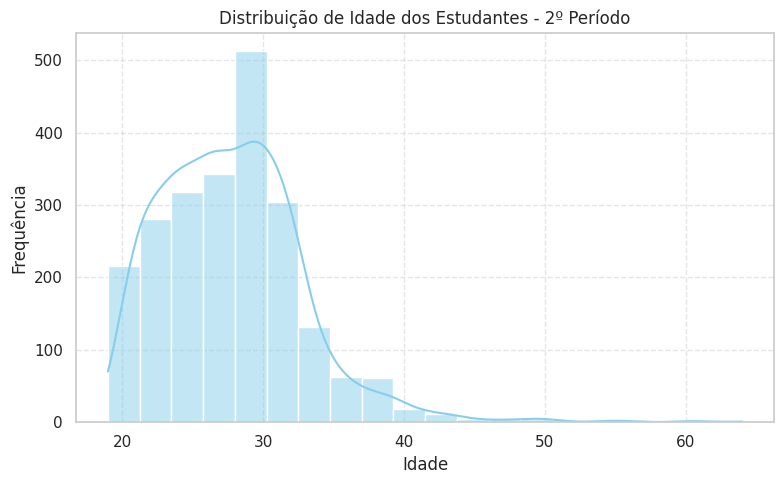

/tmp/ipykernel_1516507/810047795.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


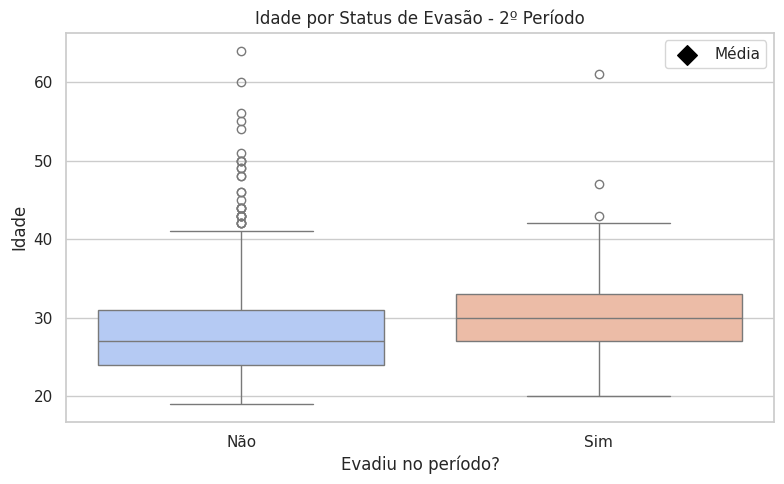

/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



--- Análise das variáveis no 3º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          399      0.175        0.045113
M         1881      0.825        0.058480

📊 Teste Qui-Quadrado entre 'sexo' e evasão:
- Valor de p: 0.3504
❌ Nenhuma associação significativa entre 'sexo' e evasão no 3º período.


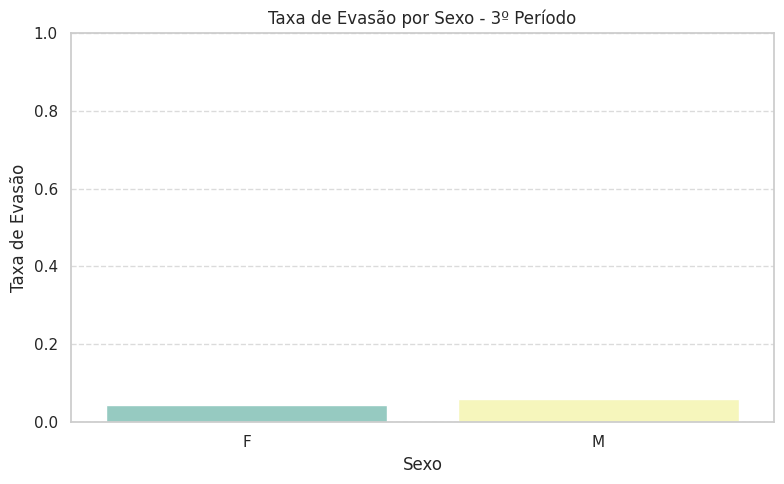

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              58   0.025439        0.051724
Divorciado           3   0.001316        0.666667
Nan                  7   0.003070        0.000000
Solteiro          2212   0.970175        0.055606

📊 Teste Qui-Quadrado entre 'estado_civil' e evasão:
- Valor de p: 0.0001
✅ Associação significativa entre 'estado_civil' e evasão no 3º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


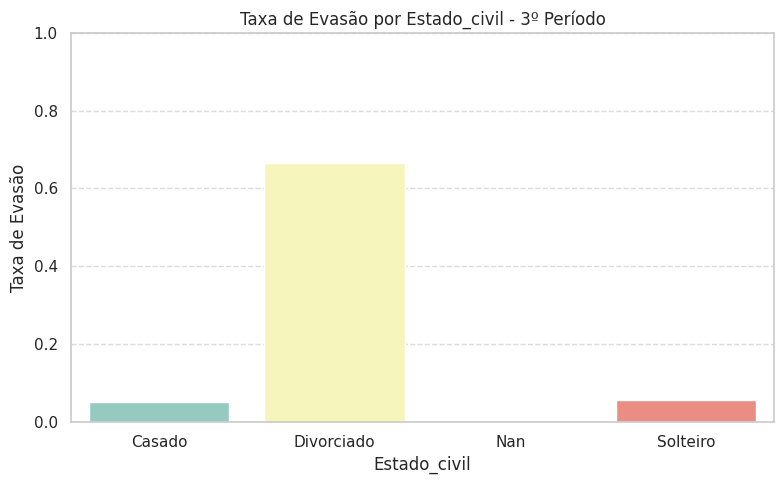

/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022368        0.078431
Branca        1157   0.507456        0.056180
Indígena         4   0.001754        0.500000
Nan             28   0.012281        0.035714
Parda          932   0.408772        0.054721
Preta          108   0.047368        0.046296

📊 Teste Qui-Quadrado entre 'cor' e evasão:
- Valor de p: 0.0074
✅ Associação significativa entre 'cor' e evasão no 3º período.


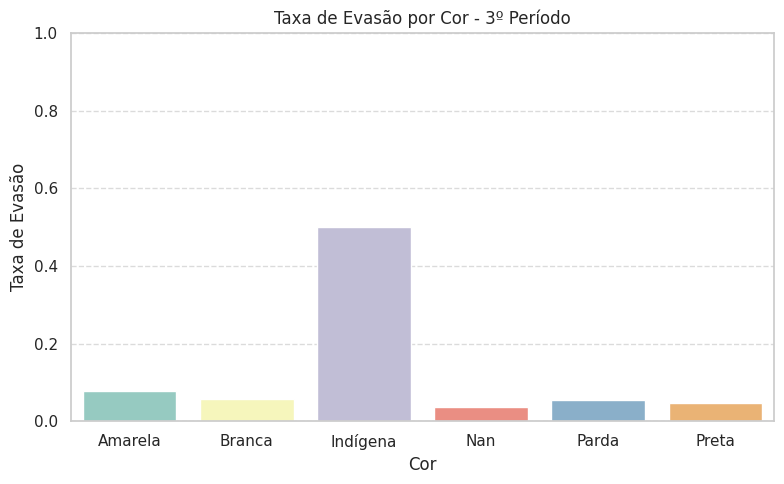


📘 Idade - Média: 27.76, Desvio Padrão: 5.12


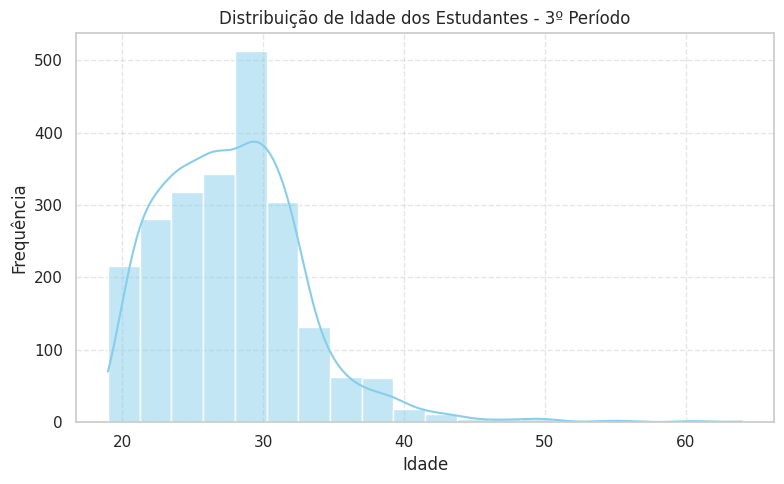

/tmp/ipykernel_1516507/810047795.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


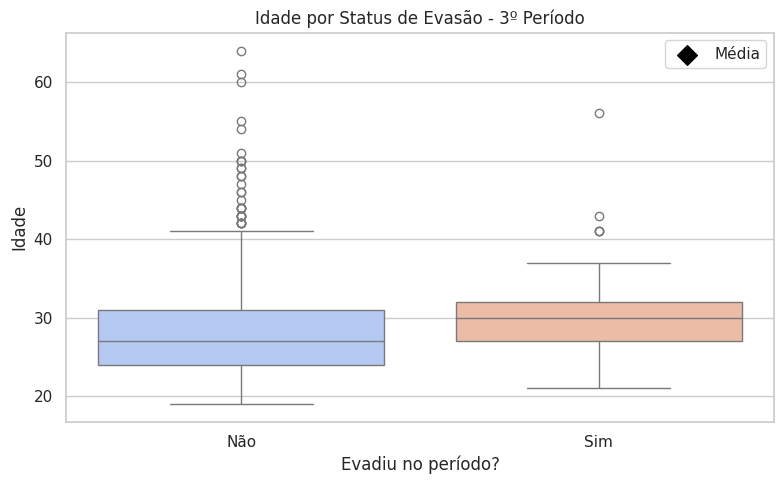

/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



--- Análise das variáveis no 4º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          399      0.175        0.057644
M         1881      0.825        0.071770

📊 Teste Qui-Quadrado entre 'sexo' e evasão:
- Valor de p: 0.3678
❌ Nenhuma associação significativa entre 'sexo' e evasão no 4º período.


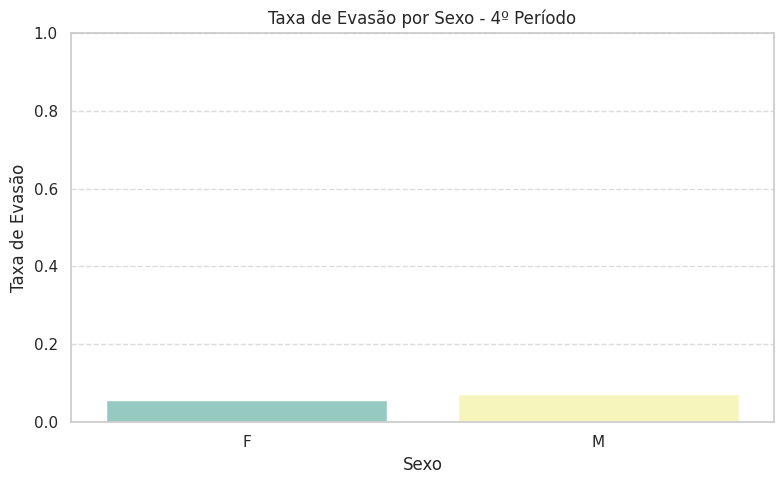

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              58   0.025439        0.051724
Divorciado           3   0.001316        0.000000
Nan                  7   0.003070        0.000000
Solteiro          2212   0.970175        0.070072

📊 Teste Qui-Quadrado entre 'estado_civil' e evasão:
- Valor de p: 0.7909
❌ Nenhuma associação significativa entre 'estado_civil' e evasão no 4º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


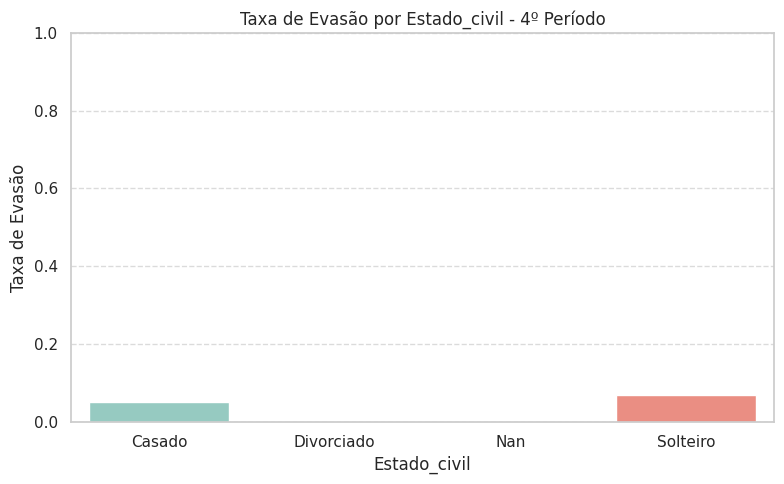


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022368        0.117647
Branca        1157   0.507456        0.067416
Indígena         4   0.001754        0.000000
Nan             28   0.012281        0.178571
Parda          932   0.408772        0.065451
Preta          108   0.047368        0.074074

📊 Teste Qui-Quadrado entre 'cor' e evasão:
- Valor de p: 0.1769
❌ Nenhuma associação significativa entre 'cor' e evasão no 4º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


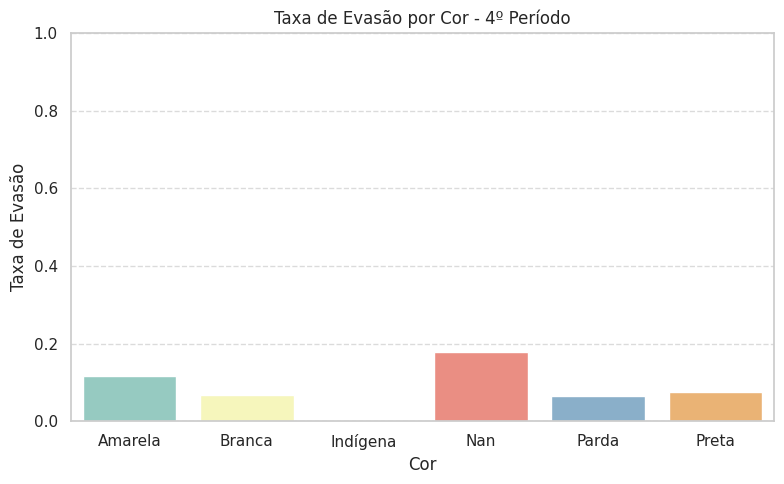


📘 Idade - Média: 27.76, Desvio Padrão: 5.12


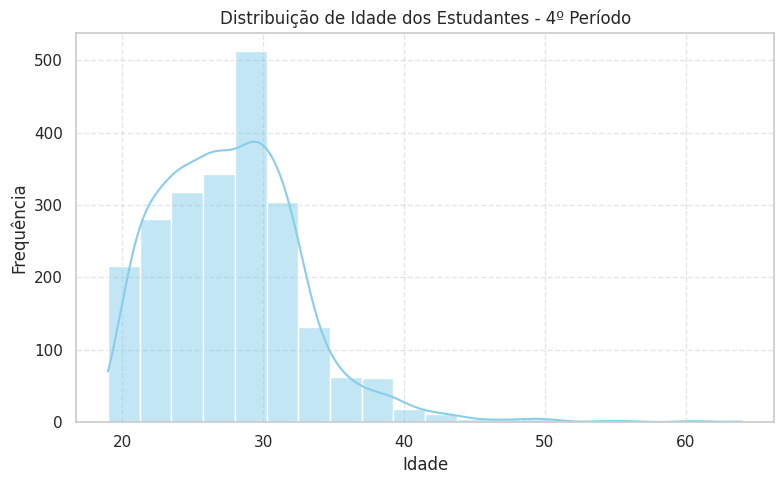

/tmp/ipykernel_1516507/810047795.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


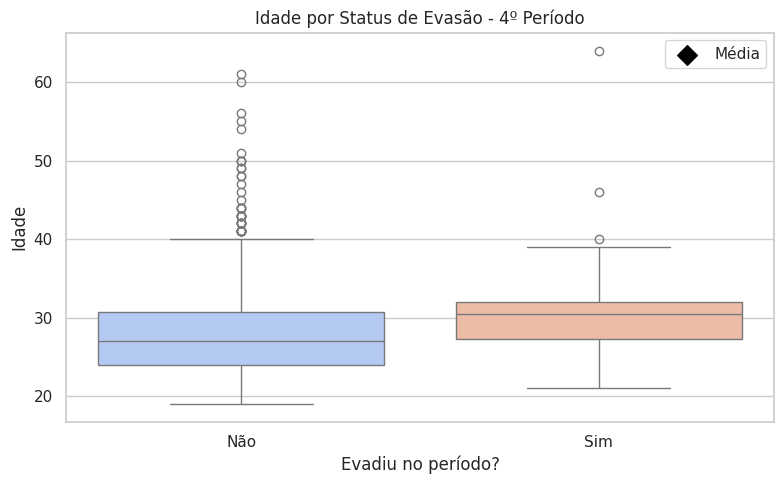

/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



📘📘📘 TABELA: ALUNOS 📘📘📘

--- Análise das variáveis no 1º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          230   0.175976        0.117391
M         1077   0.824024        0.089136

📊 Teste Qui-Quadrado entre 'sexo' e evasão:
- Valor de p: 0.2271
❌ Nenhuma associação significativa entre 'sexo' e evasão no 1º período.


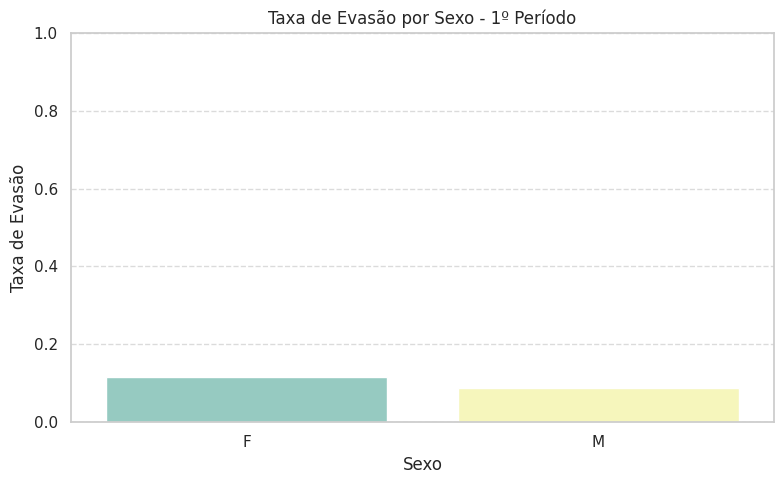

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              42   0.032135        0.238095
Divorciado           2   0.001530        0.000000
Nan                 54   0.041316        0.055556
Solteiro          1208   0.924254        0.091060
Viúvo                1   0.000765        0.000000

📊 Teste Qui-Quadrado entre 'estado_civil' e evasão:
- Valor de p: 0.0206
✅ Associação significativa entre 'estado_civil' e evasão no 1º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


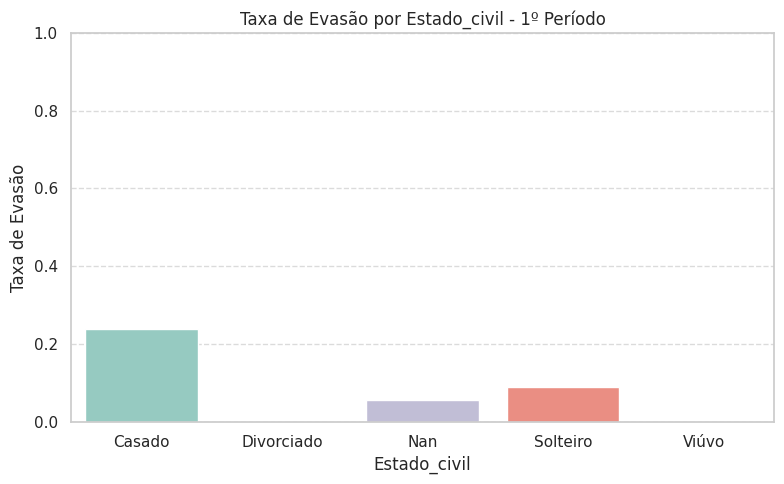


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.027544        0.194444
Branca         688   0.526396        0.072674
Indígena         4   0.003060        0.000000
Nan             74   0.056618        0.094595
Parda          445   0.340474        0.105618
Preta           60   0.045907        0.200000

📊 Teste Qui-Quadrado entre 'cor' e evasão:
- Valor de p: 0.0046
✅ Associação significativa entre 'cor' e evasão no 1º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


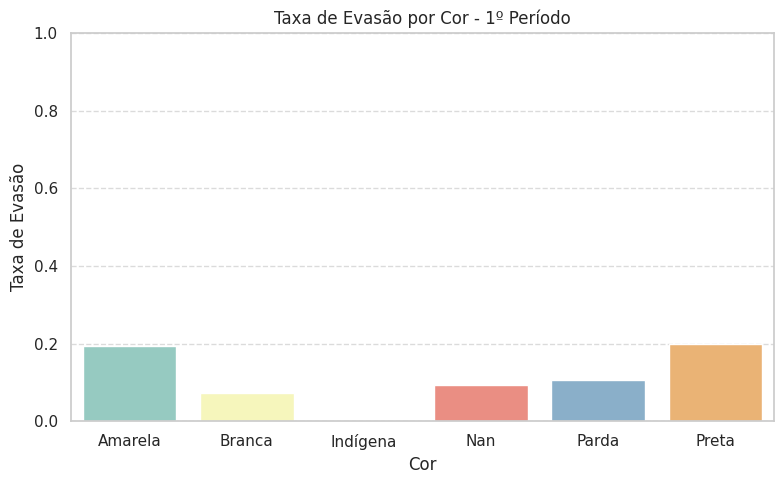


📘 Idade - Média: 30.05, Desvio Padrão: 5.54


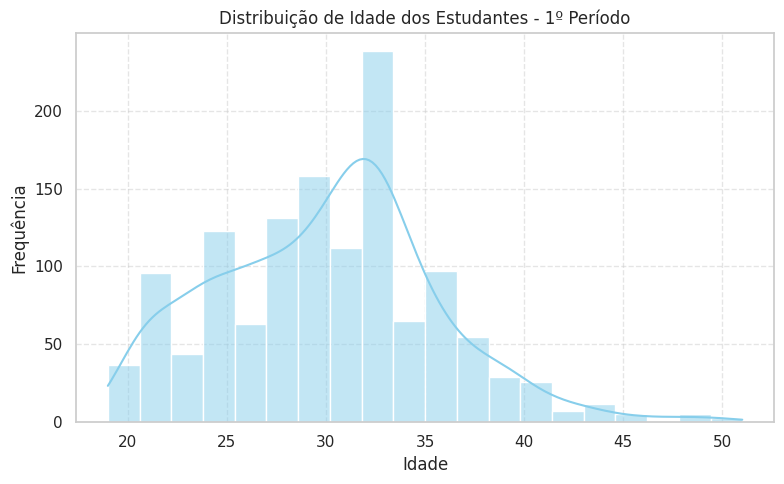

/tmp/ipykernel_1516507/810047795.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


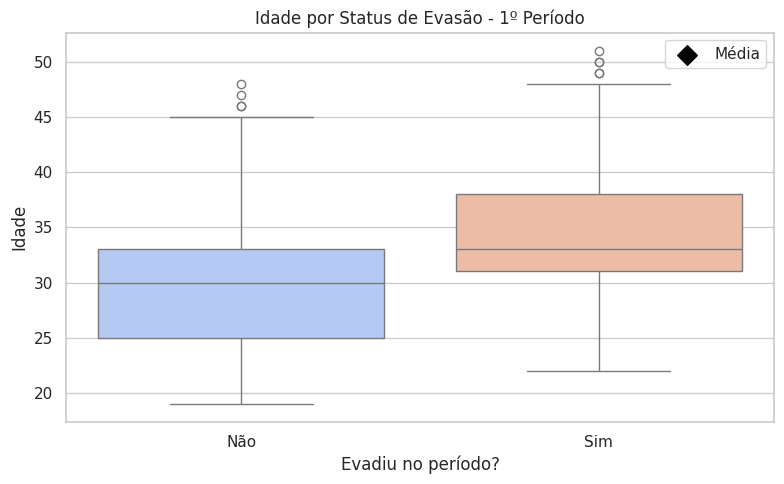

/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



--- Análise das variáveis no 2º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          230   0.175976        0.078261
M         1077   0.824024        0.076137

📊 Teste Qui-Quadrado entre 'sexo' e evasão:
- Valor de p: 1.0000
❌ Nenhuma associação significativa entre 'sexo' e evasão no 2º período.


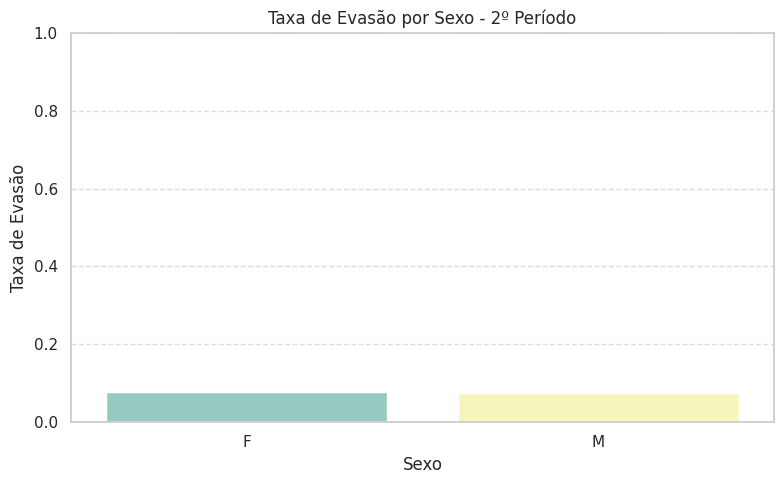

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              42   0.032135        0.142857
Divorciado           2   0.001530        0.000000
Nan                 54   0.041316        0.000000
Solteiro          1208   0.924254        0.077815
Viúvo                1   0.000765        0.000000

📊 Teste Qui-Quadrado entre 'estado_civil' e evasão:
- Valor de p: 0.1177
❌ Nenhuma associação significativa entre 'estado_civil' e evasão no 2º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


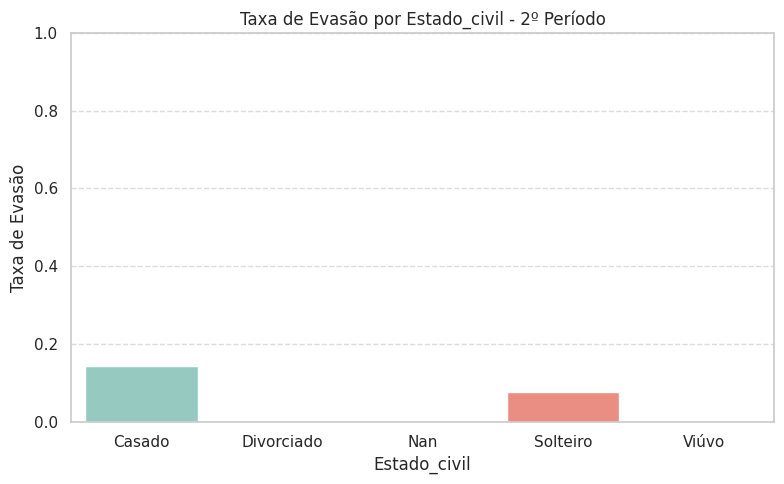


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.027544        0.000000
Branca         688   0.526396        0.063953
Indígena         4   0.003060        0.000000
Nan             74   0.056618        0.040541
Parda          445   0.340474        0.094382
Preta           60   0.045907        0.183333

📊 Teste Qui-Quadrado entre 'cor' e evasão:
- Valor de p: 0.0031
✅ Associação significativa entre 'cor' e evasão no 2º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


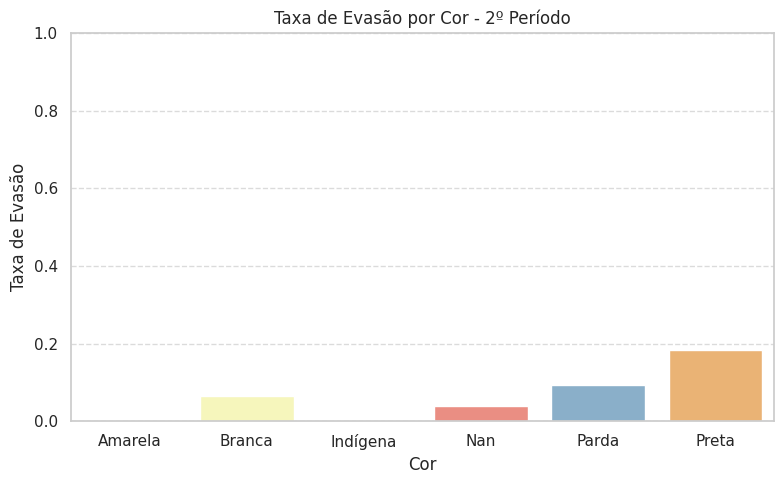


📘 Idade - Média: 30.05, Desvio Padrão: 5.54


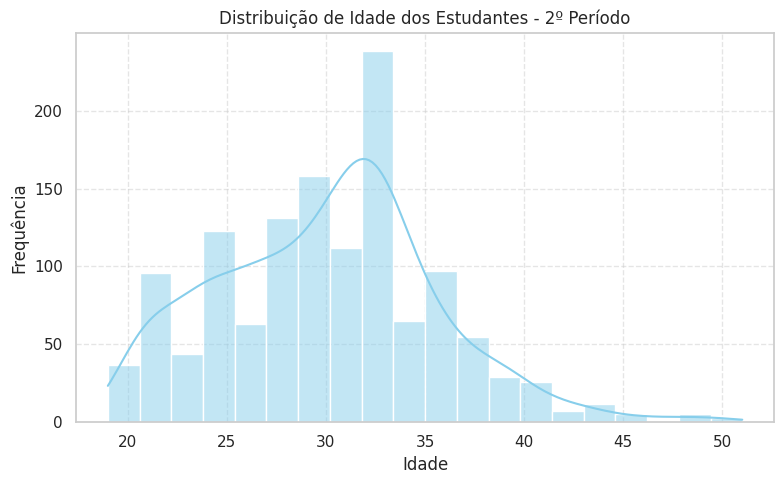

/tmp/ipykernel_1516507/810047795.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


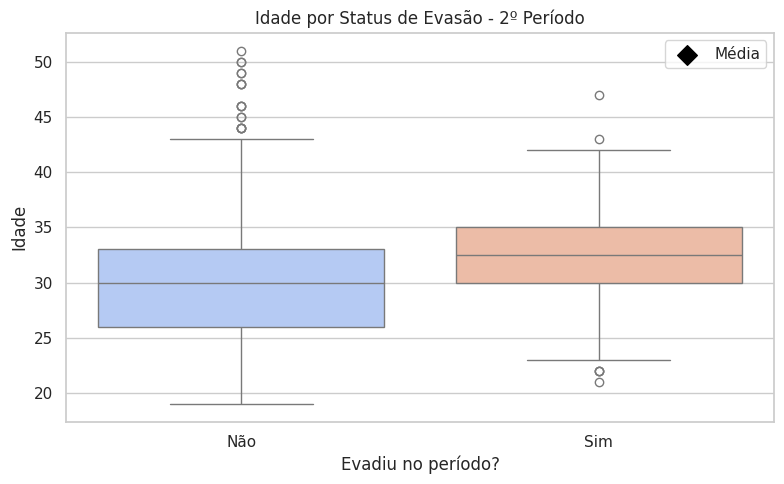

/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



--- Análise das variáveis no 3º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          230   0.175976        0.043478
M         1077   0.824024        0.073352

📊 Teste Qui-Quadrado entre 'sexo' e evasão:
- Valor de p: 0.1366
❌ Nenhuma associação significativa entre 'sexo' e evasão no 3º período.


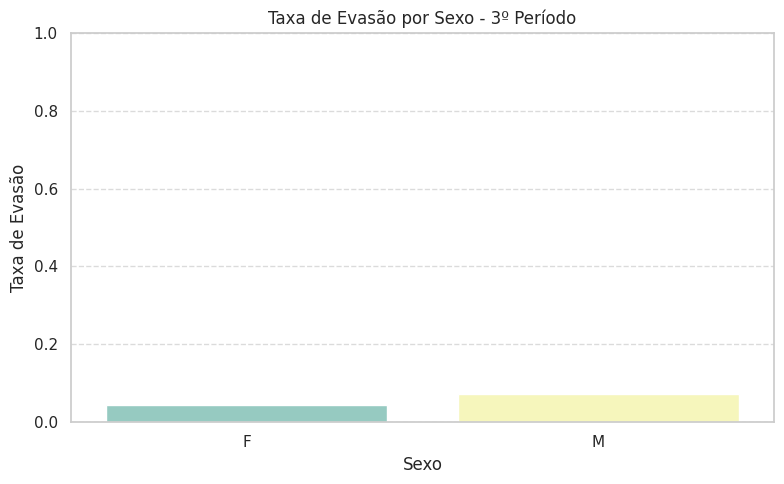

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              42   0.032135        0.047619
Divorciado           2   0.001530        1.000000
Nan                 54   0.041316        0.000000
Solteiro          1208   0.924254        0.070364
Viúvo                1   0.000765        0.000000

📊 Teste Qui-Quadrado entre 'estado_civil' e evasão:
- Valor de p: 0.0000
✅ Associação significativa entre 'estado_civil' e evasão no 3º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


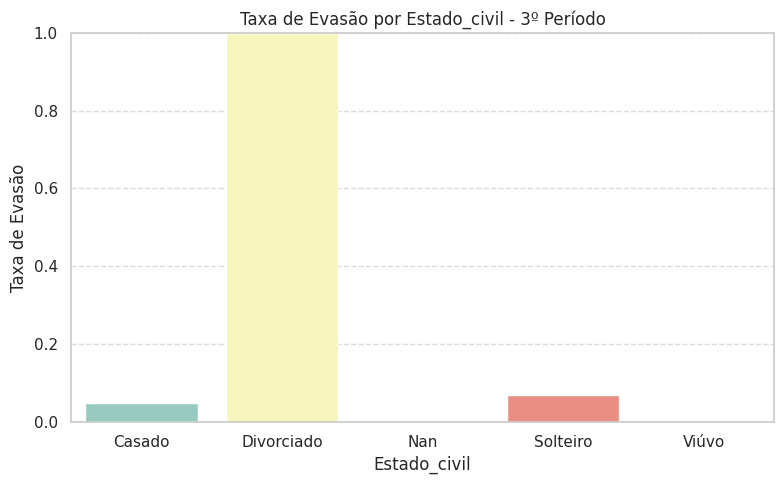


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.027544        0.166667
Branca         688   0.526396        0.065407
Indígena         4   0.003060        0.250000
Nan             74   0.056618        0.054054
Parda          445   0.340474        0.065169
Preta           60   0.045907        0.066667

📊 Teste Qui-Quadrado entre 'cor' e evasão:
- Valor de p: 0.1580
❌ Nenhuma associação significativa entre 'cor' e evasão no 3º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


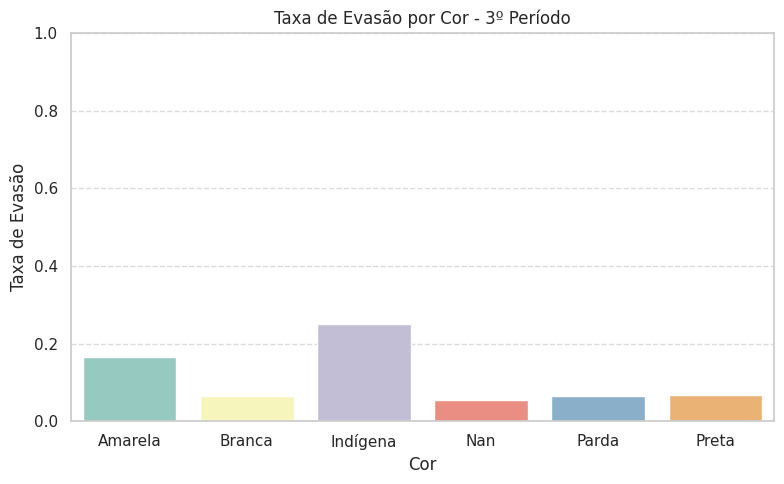


📘 Idade - Média: 30.05, Desvio Padrão: 5.54


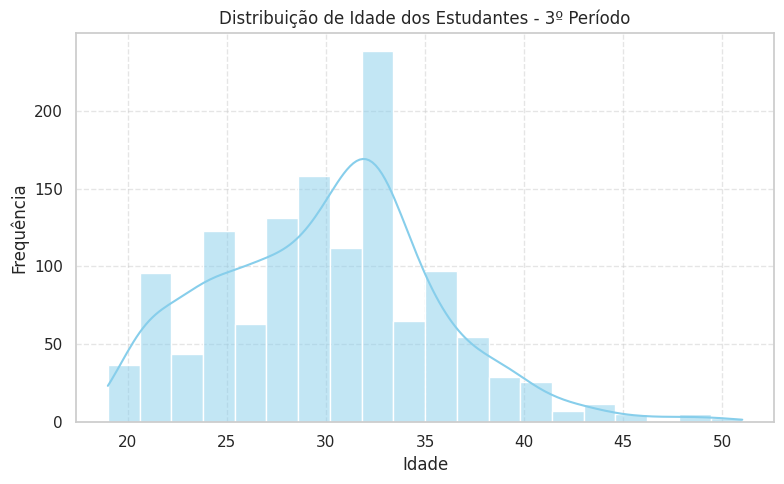

/tmp/ipykernel_1516507/810047795.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


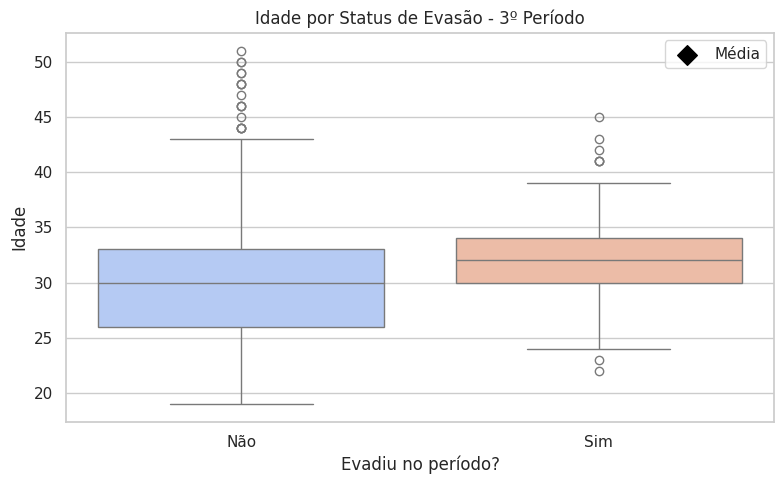

/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



--- Análise das variáveis no 4º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          230   0.175976        0.056522
M         1077   0.824024        0.091922

📊 Teste Qui-Quadrado entre 'sexo' e evasão:
- Valor de p: 0.1071
❌ Nenhuma associação significativa entre 'sexo' e evasão no 4º período.


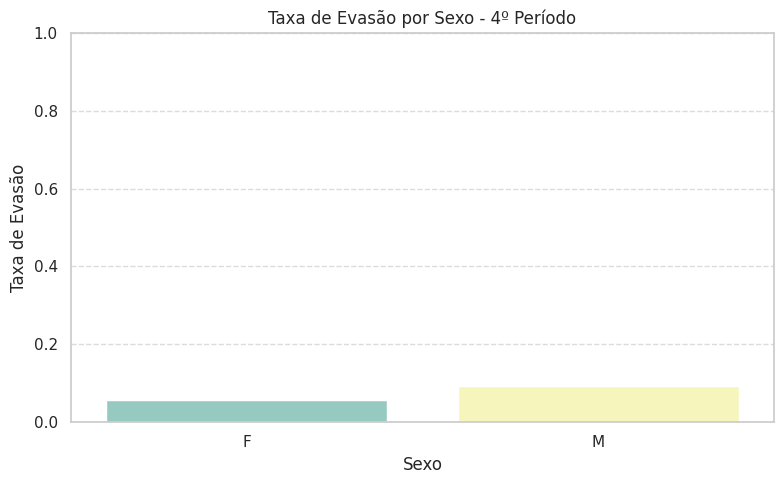

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              42   0.032135        0.047619
Divorciado           2   0.001530        0.000000
Nan                 54   0.041316        0.000000
Solteiro          1208   0.924254        0.091060
Viúvo                1   0.000765        0.000000

📊 Teste Qui-Quadrado entre 'estado_civil' e evasão:
- Valor de p: 0.1608
❌ Nenhuma associação significativa entre 'estado_civil' e evasão no 4º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


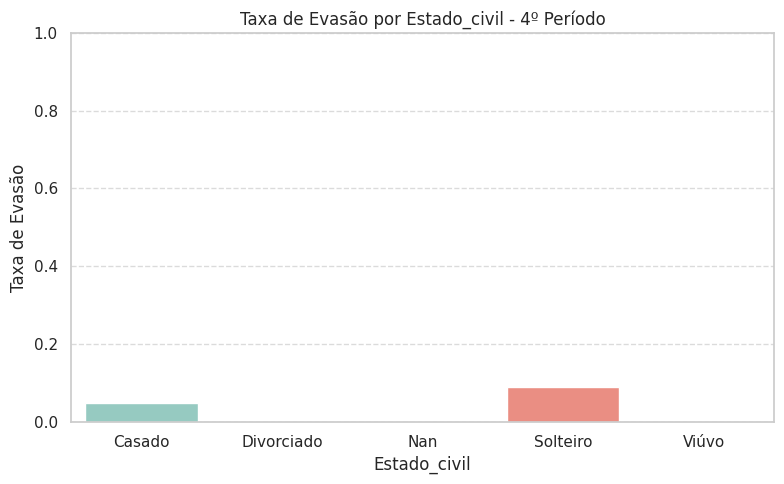


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.027544        0.111111
Branca         688   0.526396        0.091570
Indígena         4   0.003060        0.000000
Nan             74   0.056618        0.054054
Parda          445   0.340474        0.083146
Preta           60   0.045907        0.066667

📊 Teste Qui-Quadrado entre 'cor' e evasão:
- Valor de p: 0.8158
❌ Nenhuma associação significativa entre 'cor' e evasão no 4º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


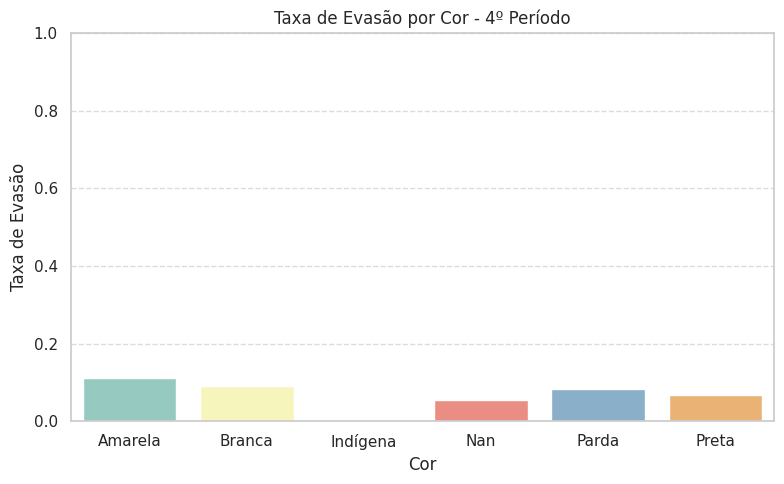


📘 Idade - Média: 30.05, Desvio Padrão: 5.54


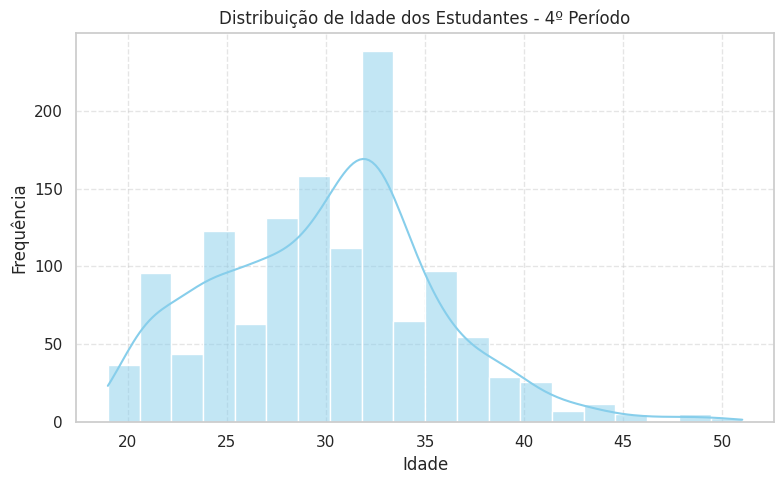

/tmp/ipykernel_1516507/810047795.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


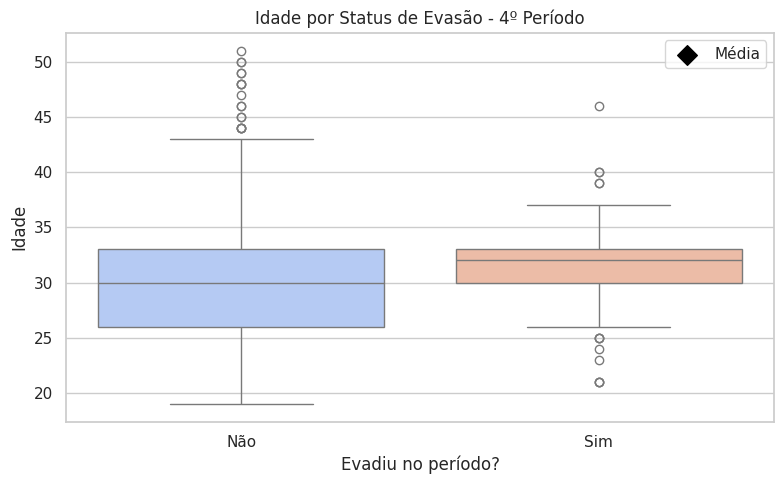


📘📘📘 TABELA: ALUNOS-MATRICULADOS 📘📘📘

--- Análise das variáveis no 1º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          208   0.165605        0.129808
M         1048   0.834395        0.091603

📊 Teste Qui-Quadrado entre 'sexo' e evasão:
- Valor de p: 0.1174
❌ Nenhuma associação significativa entre 'sexo' e evasão no 1º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


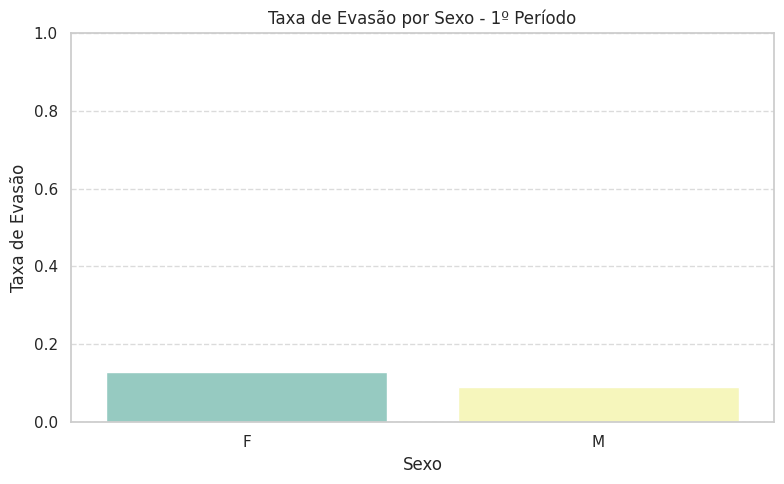

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              41   0.032643        0.243902
Divorciado           2   0.001592        0.000000
Nan                  4   0.003185        0.750000
Solteiro          1208   0.961783        0.091060
Viúvo                1   0.000796        0.000000

📊 Teste Qui-Quadrado entre 'estado_civil' e evasão:
- Valor de p: 0.0000
✅ Associação significativa entre 'estado_civil' e evasão no 1º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


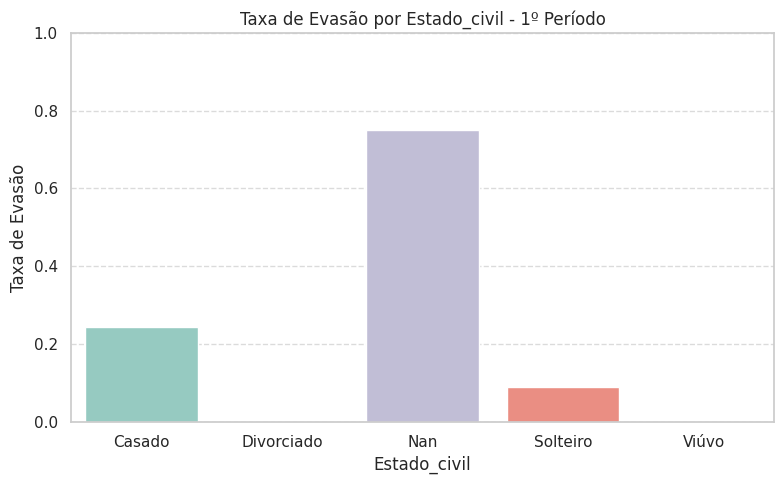

/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.028662        0.194444
Branca         688   0.547771        0.072674
Indígena         4   0.003185        0.000000
Nan             24   0.019108        0.291667
Parda          444   0.353503        0.105856
Preta           60   0.047771        0.200000

📊 Teste Qui-Quadrado entre 'cor' e evasão:
- Valor de p: 0.0001
✅ Associação significativa entre 'cor' e evasão no 1º período.


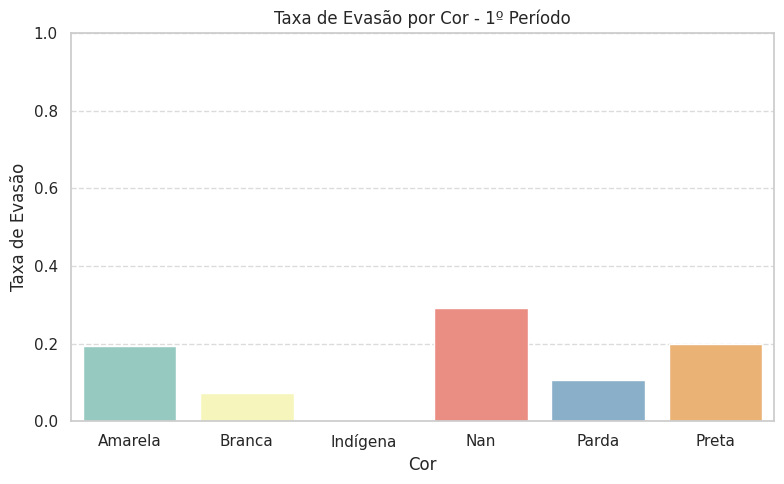


📘 Idade - Média: 30.30, Desvio Padrão: 5.41


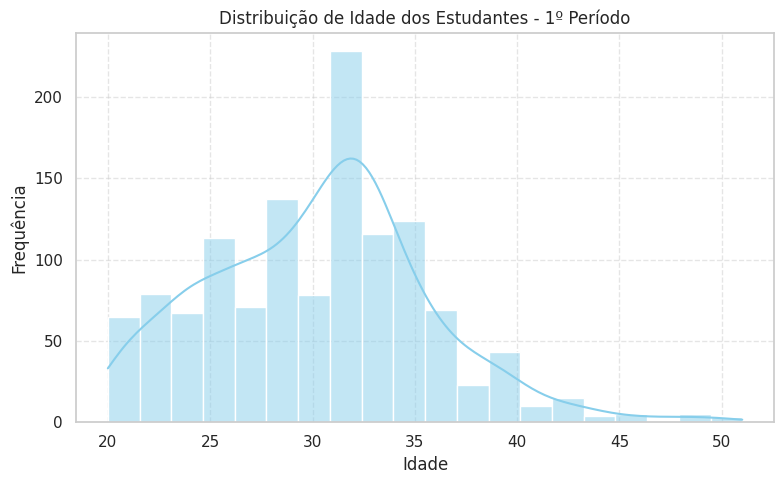

/tmp/ipykernel_1516507/810047795.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


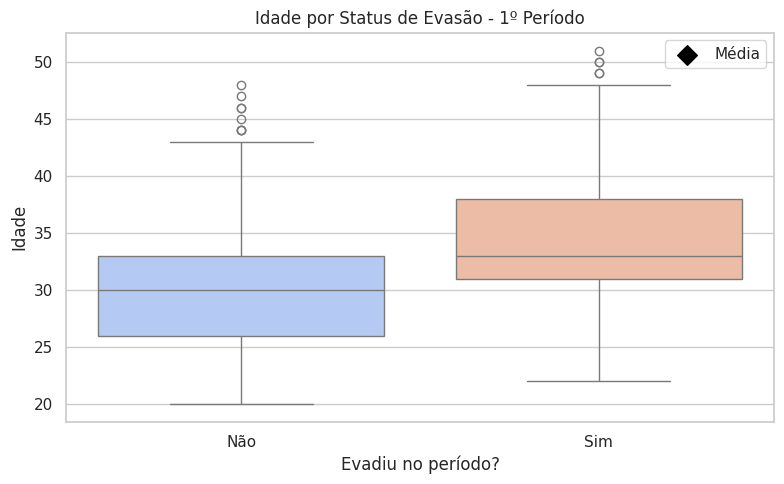

/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



--- Análise das variáveis no 2º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          208   0.165605        0.086538
M         1048   0.834395        0.078244

📊 Teste Qui-Quadrado entre 'sexo' e evasão:
- Valor de p: 0.7922
❌ Nenhuma associação significativa entre 'sexo' e evasão no 2º período.


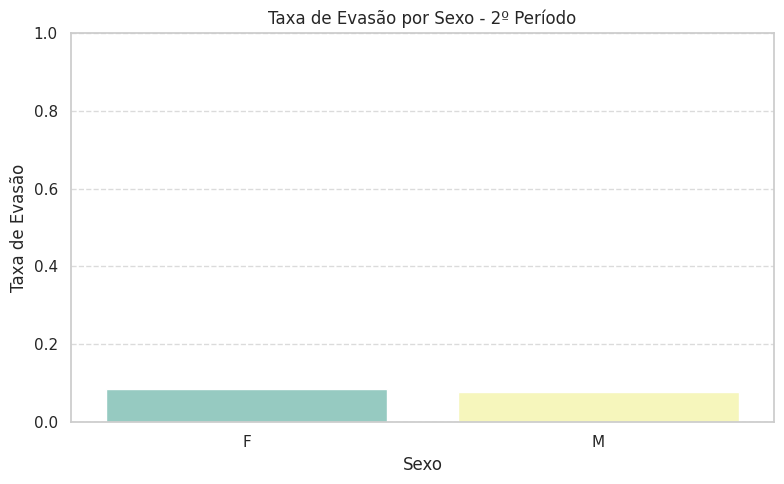

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              41   0.032643        0.146341
Divorciado           2   0.001592        0.000000
Nan                  4   0.003185        0.000000
Solteiro          1208   0.961783        0.077815
Viúvo                1   0.000796        0.000000

📊 Teste Qui-Quadrado entre 'estado_civil' e evasão:
- Valor de p: 0.5330
❌ Nenhuma associação significativa entre 'estado_civil' e evasão no 2º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


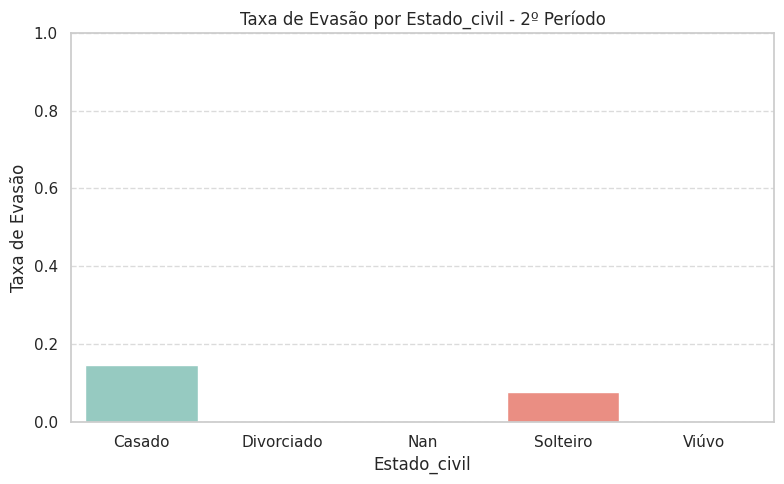


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.028662        0.000000
Branca         688   0.547771        0.063953
Indígena         4   0.003185        0.000000
Nan             24   0.019108        0.125000
Parda          444   0.353503        0.094595
Preta           60   0.047771        0.183333


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



📊 Teste Qui-Quadrado entre 'cor' e evasão:
- Valor de p: 0.0053
✅ Associação significativa entre 'cor' e evasão no 2º período.


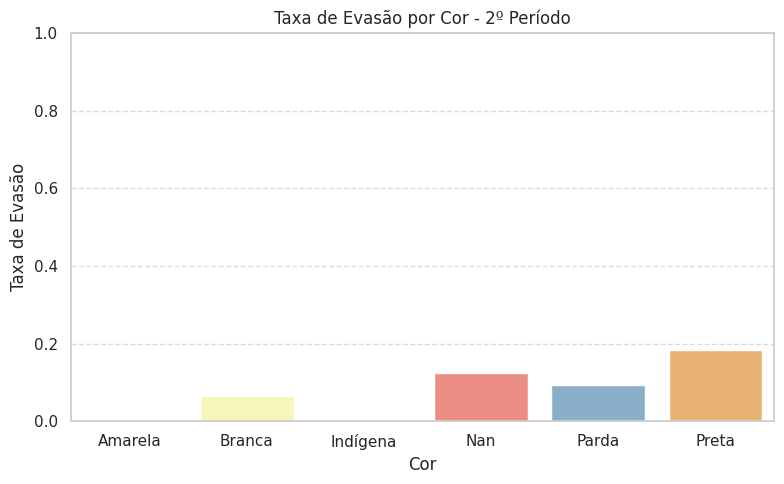


📘 Idade - Média: 30.30, Desvio Padrão: 5.41


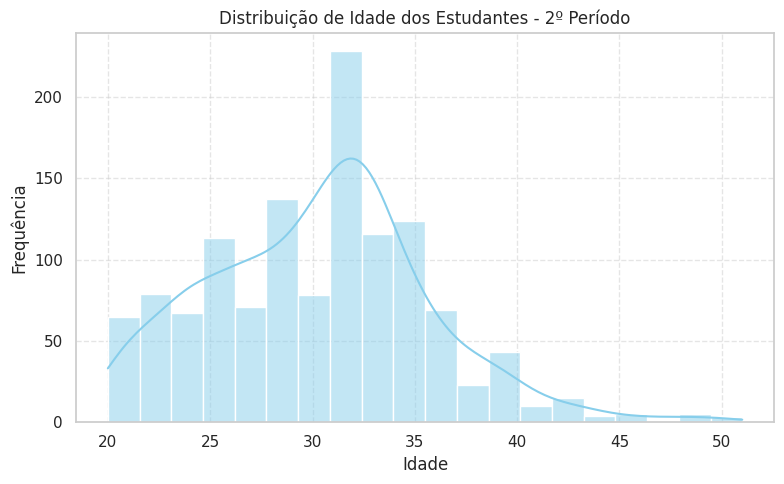

/tmp/ipykernel_1516507/810047795.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


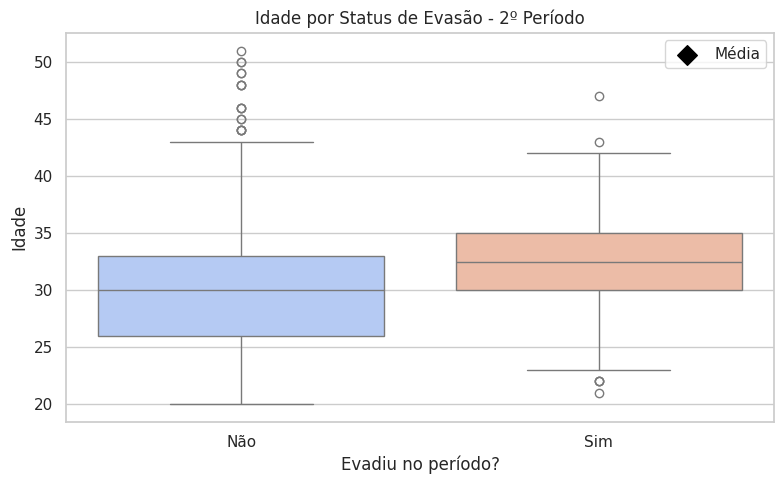


--- Análise das variáveis no 3º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          208   0.165605        0.048077
M         1048   0.834395        0.075382

📊 Teste Qui-Quadrado entre 'sexo' e evasão:
- Valor de p: 0.2098
❌ Nenhuma associação significativa entre 'sexo' e evasão no 3º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


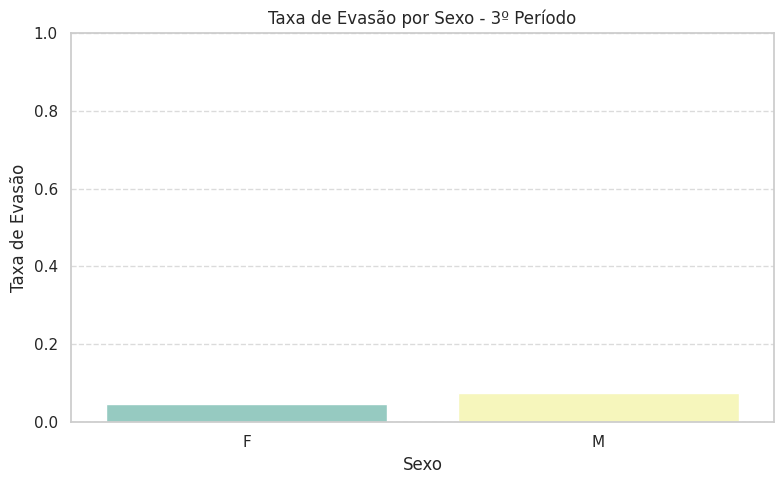

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              41   0.032643        0.048780
Divorciado           2   0.001592        1.000000
Nan                  4   0.003185        0.000000
Solteiro          1208   0.961783        0.070364
Viúvo                1   0.000796        0.000000

📊 Teste Qui-Quadrado entre 'estado_civil' e evasão:
- Valor de p: 0.0000
✅ Associação significativa entre 'estado_civil' e evasão no 3º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


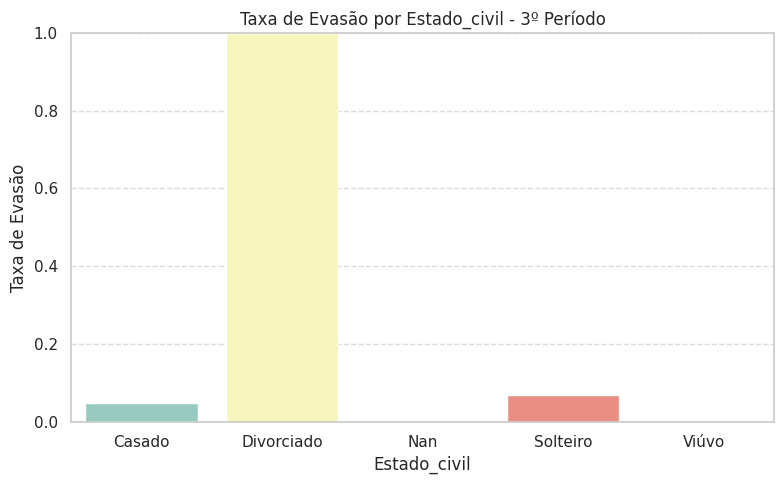


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.028662        0.166667
Branca         688   0.547771        0.065407
Indígena         4   0.003185        0.250000
Nan             24   0.019108        0.166667
Parda          444   0.353503        0.065315
Preta           60   0.047771        0.066667

📊 Teste Qui-Quadrado entre 'cor' e evasão:
- Valor de p: 0.0545
❌ Nenhuma associação significativa entre 'cor' e evasão no 3º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


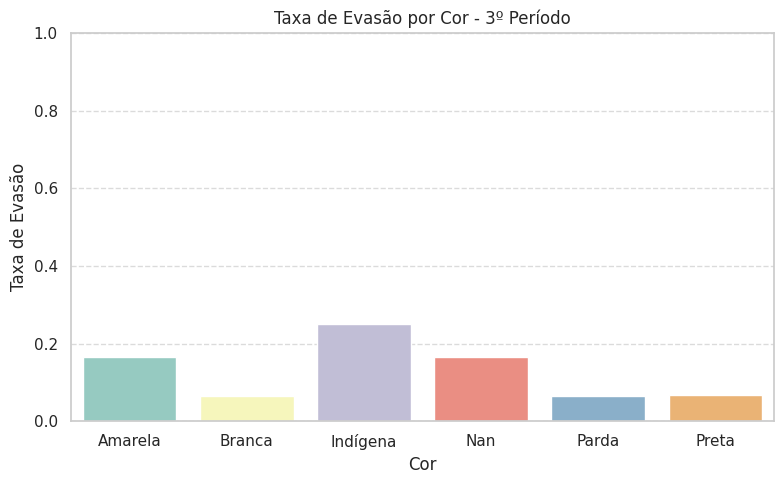


📘 Idade - Média: 30.30, Desvio Padrão: 5.41


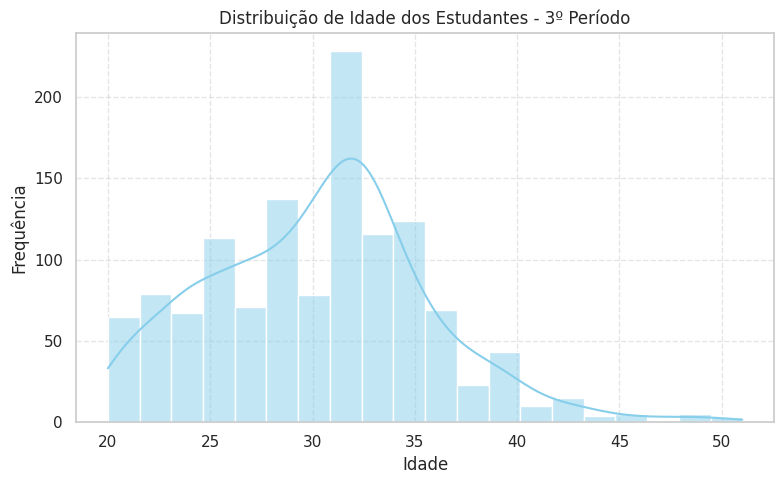

/tmp/ipykernel_1516507/810047795.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


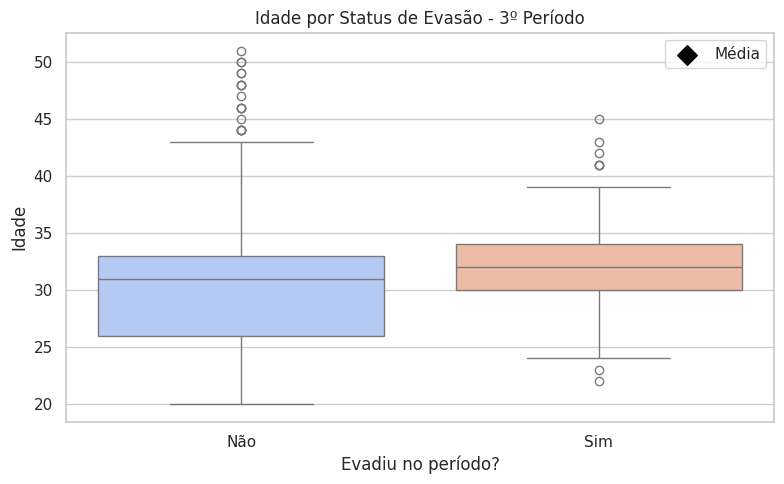


--- Análise das variáveis no 4º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          208   0.165605        0.062500
M         1048   0.834395        0.094466

📊 Teste Qui-Quadrado entre 'sexo' e evasão:
- Valor de p: 0.1788
❌ Nenhuma associação significativa entre 'sexo' e evasão no 4º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


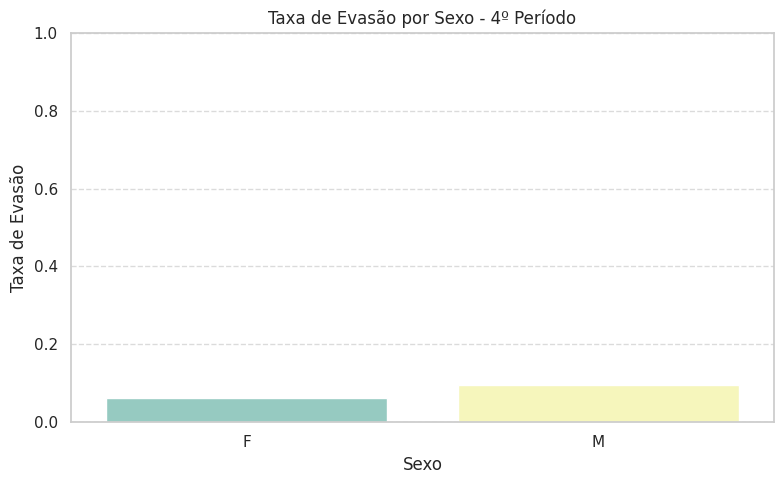

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              41   0.032643         0.04878
Divorciado           2   0.001592         0.00000
Nan                  4   0.003185         0.00000
Solteiro          1208   0.961783         0.09106
Viúvo                1   0.000796         0.00000

📊 Teste Qui-Quadrado entre 'estado_civil' e evasão:
- Valor de p: 0.8156
❌ Nenhuma associação significativa entre 'estado_civil' e evasão no 4º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


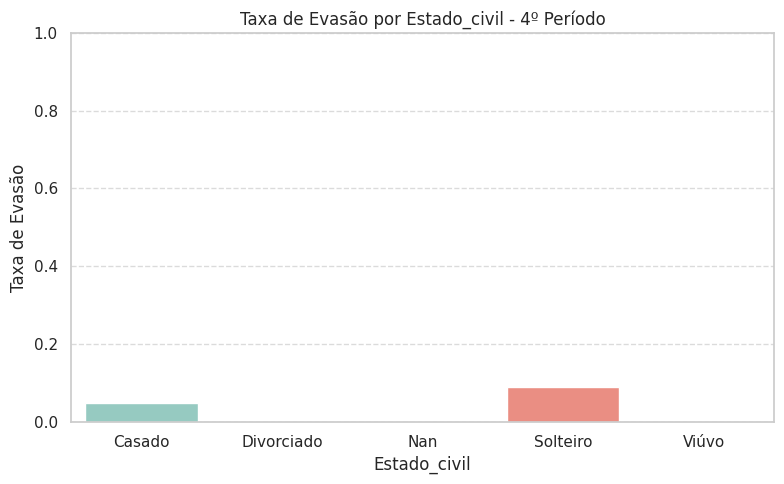

/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.028662        0.111111
Branca         688   0.547771        0.091570
Indígena         4   0.003185        0.000000
Nan             24   0.019108        0.166667
Parda          444   0.353503        0.083333
Preta           60   0.047771        0.066667

📊 Teste Qui-Quadrado entre 'cor' e evasão:
- Valor de p: 0.7017
❌ Nenhuma associação significativa entre 'cor' e evasão no 4º período.


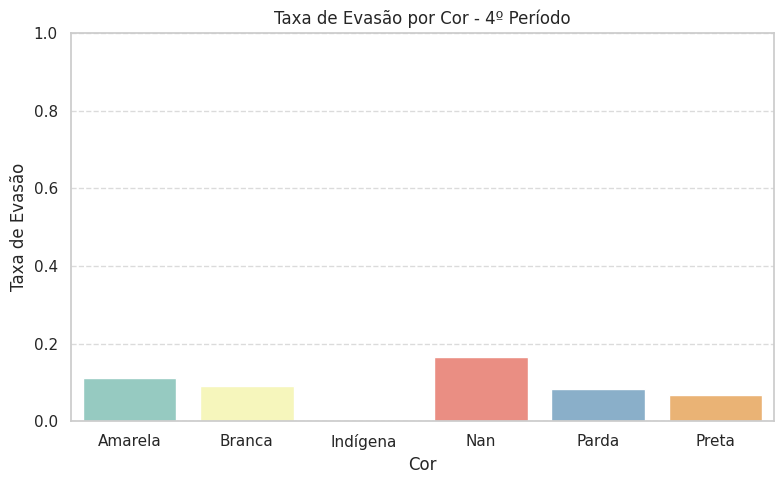


📘 Idade - Média: 30.30, Desvio Padrão: 5.41


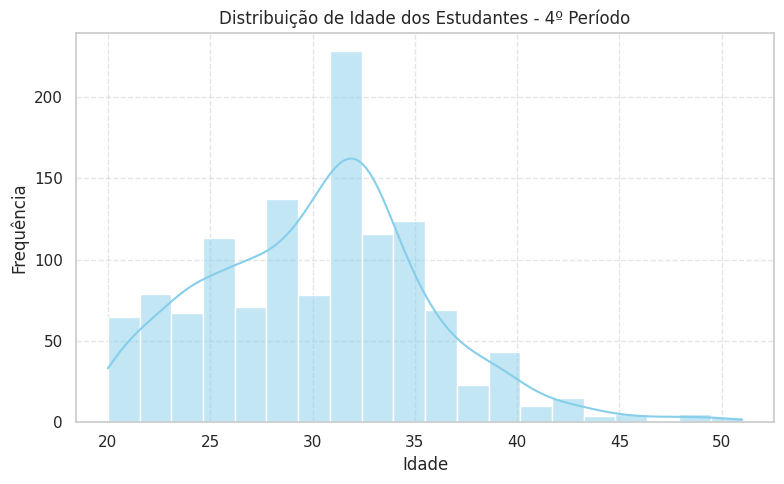

/tmp/ipykernel_1516507/810047795.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


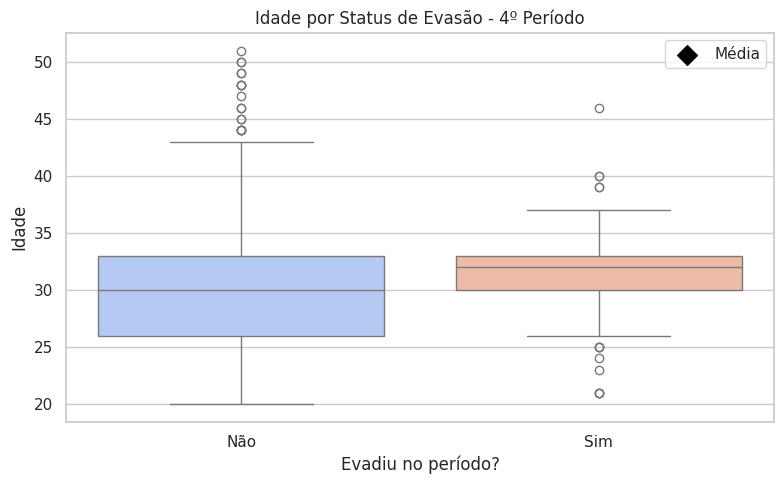


📘📘📘 TABELA: ALUNOS-FINAL 📘📘📘

--- Análise das variáveis no 1º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          400   0.175362        0.090000
M         1881   0.824638        0.082403

📊 Teste Qui-Quadrado entre 'sexo' e evasão:
- Valor de p: 0.6901
❌ Nenhuma associação significativa entre 'sexo' e evasão no 1º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


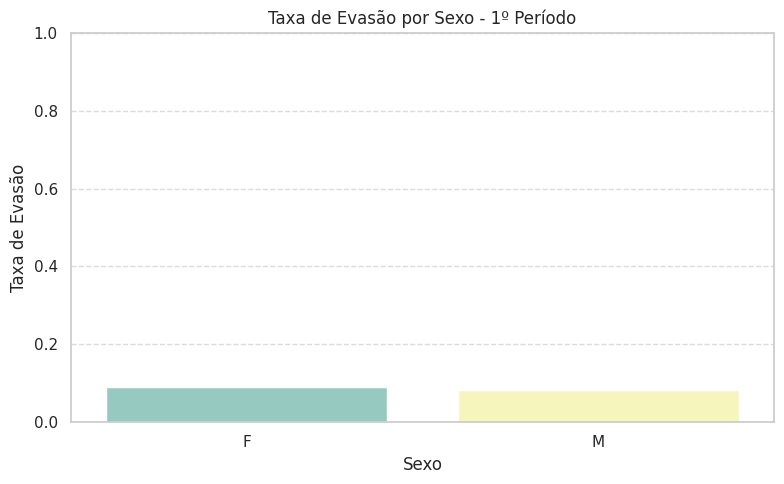

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              59   0.025866        0.220339
Divorciado           3   0.001315        0.000000
Nan                  7   0.003069        0.857143
Solteiro          2212   0.969750        0.077758

📊 Teste Qui-Quadrado entre 'estado_civil' e evasão:
- Valor de p: 0.0000
✅ Associação significativa entre 'estado_civil' e evasão no 1º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


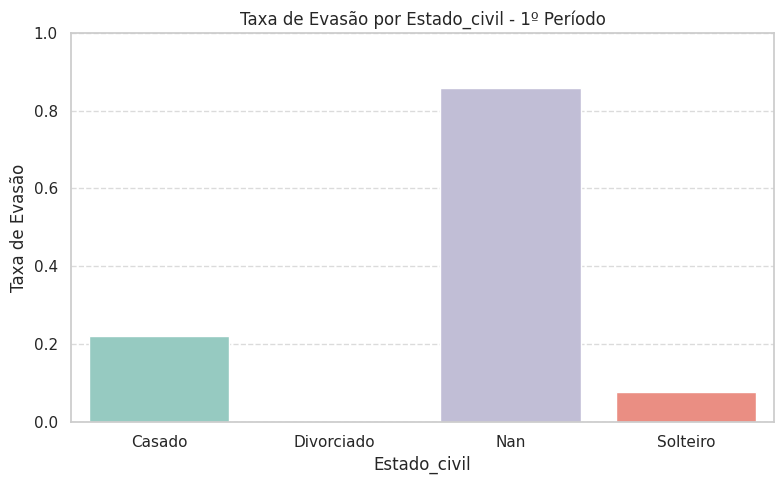


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022359        0.156863
Branca        1158   0.507672        0.066494
Indígena         4   0.001754        0.000000
Nan             28   0.012275        0.428571
Parda          932   0.408593        0.085837
Preta          108   0.047348        0.129630

📊 Teste Qui-Quadrado entre 'cor' e evasão:
- Valor de p: 0.0000
✅ Associação significativa entre 'cor' e evasão no 1º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


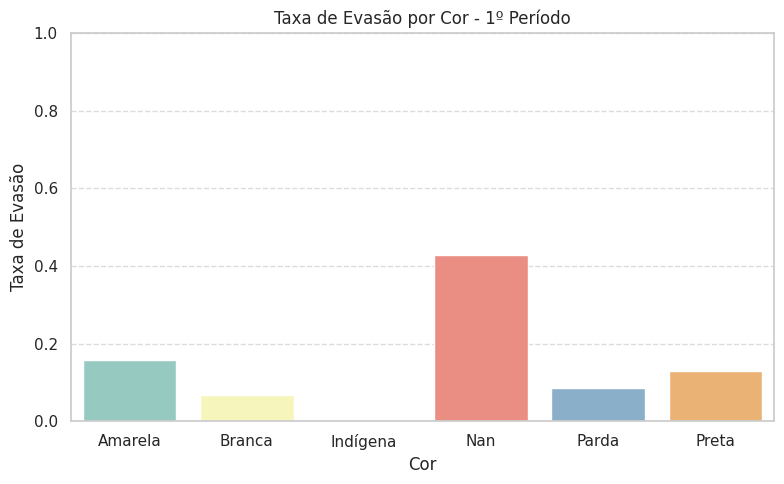

⚠️ Variável idade NÃO encontrada na tabela.

--- Análise das variáveis no 2º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          400   0.175362         0.05000
M         1881   0.824638         0.05529

📊 Teste Qui-Quadrado entre 'sexo' e evasão:
- Valor de p: 0.7624
❌ Nenhuma associação significativa entre 'sexo' e evasão no 2º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


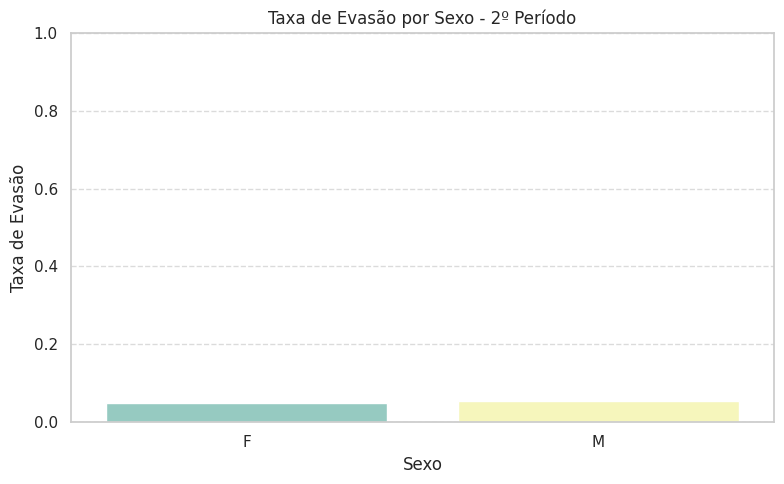

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              59   0.025866        0.135593
Divorciado           3   0.001315        0.000000
Nan                  7   0.003069        0.000000
Solteiro          2212   0.969750        0.052441

📊 Teste Qui-Quadrado entre 'estado_civil' e evasão:
- Valor de p: 0.0401
✅ Associação significativa entre 'estado_civil' e evasão no 2º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


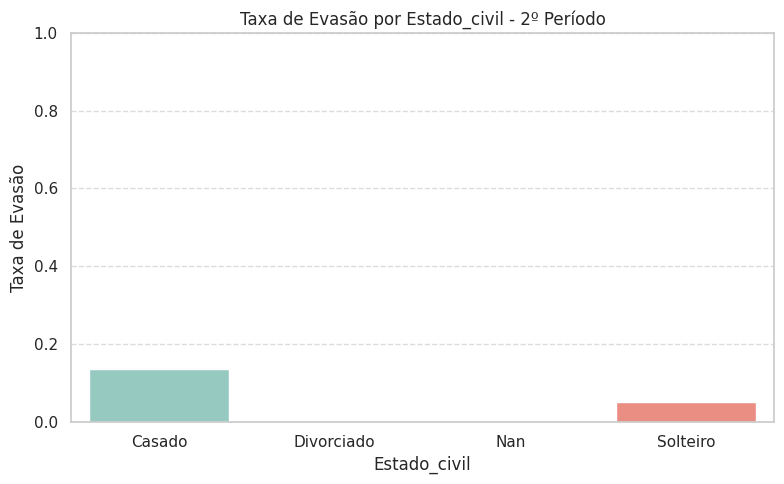


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022359        0.019608
Branca        1158   0.507672        0.055268
Indígena         4   0.001754        0.000000
Nan             28   0.012275        0.071429
Parda          932   0.408593        0.046137
Preta          108   0.047348        0.129630

📊 Teste Qui-Quadrado entre 'cor' e evasão:
- Valor de p: 0.0116
✅ Associação significativa entre 'cor' e evasão no 2º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


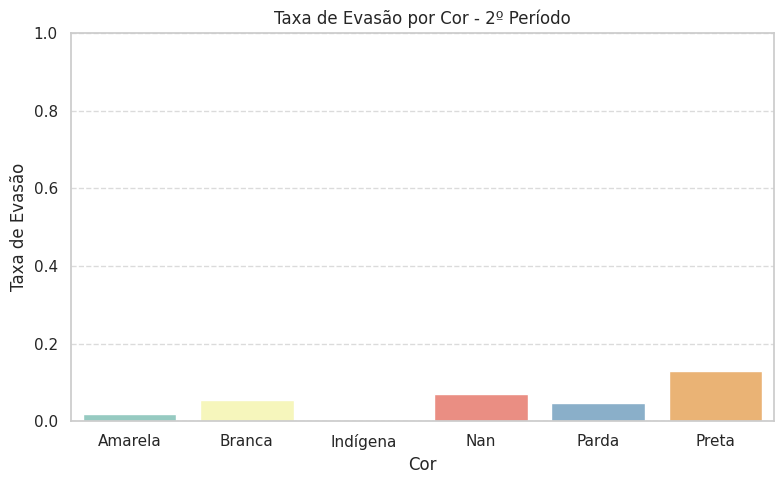

⚠️ Variável idade NÃO encontrada na tabela.

--- Análise das variáveis no 3º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          400   0.175362          0.0450
M         1881   0.824638          0.0521

📊 Teste Qui-Quadrado entre 'sexo' e evasão:
- Valor de p: 0.6444
❌ Nenhuma associação significativa entre 'sexo' e evasão no 3º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


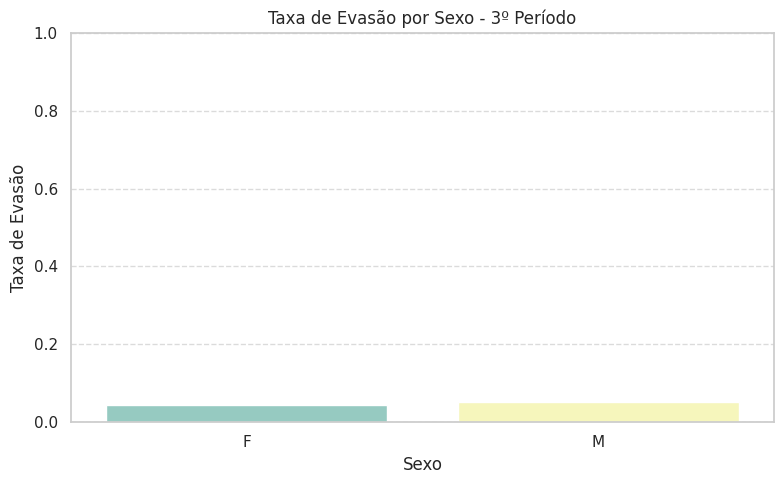

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              59   0.025866        0.050847
Divorciado           3   0.001315        0.666667
Nan                  7   0.003069        0.000000
Solteiro          2212   0.969750        0.050181

📊 Teste Qui-Quadrado entre 'estado_civil' e evasão:
- Valor de p: 0.0000
✅ Associação significativa entre 'estado_civil' e evasão no 3º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


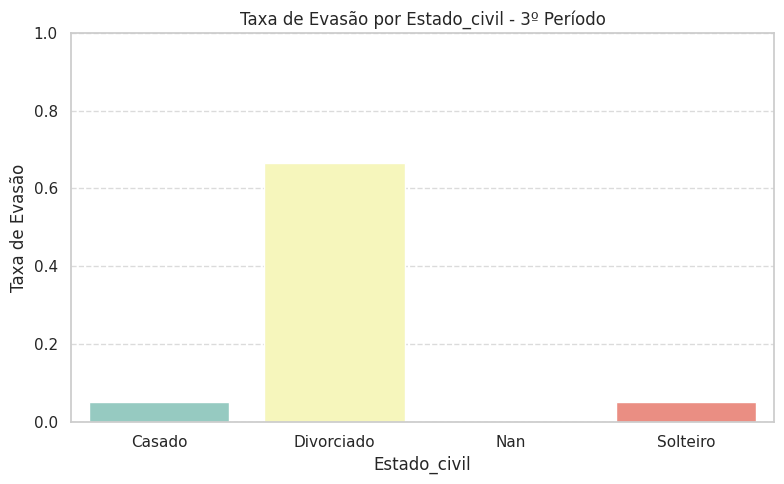


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022359        0.039216
Branca        1158   0.507672        0.050950
Indígena         4   0.001754        0.500000
Nan             28   0.012275        0.035714
Parda          932   0.408593        0.051502
Preta          108   0.047348        0.037037

📊 Teste Qui-Quadrado entre 'cor' e evasão:
- Valor de p: 0.0038
✅ Associação significativa entre 'cor' e evasão no 3º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


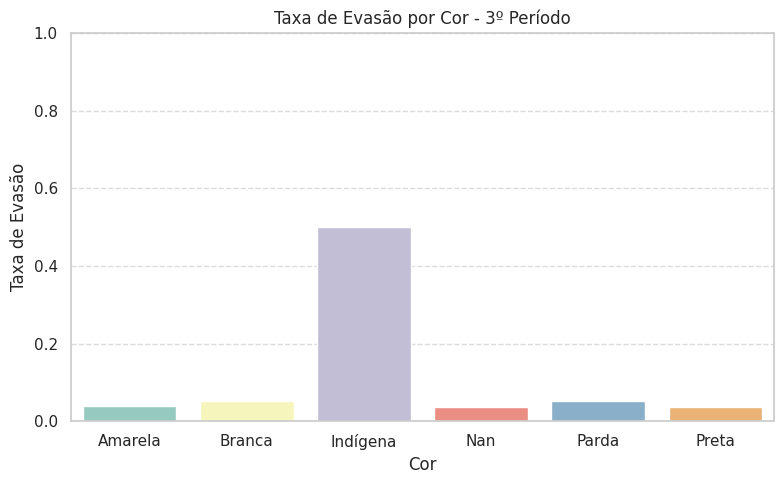

⚠️ Variável idade NÃO encontrada na tabela.

--- Análise das variáveis no 4º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          400   0.175362        0.035000
M         1881   0.824638        0.057416

📊 Teste Qui-Quadrado entre 'sexo' e evasão:
- Valor de p: 0.0916
❌ Nenhuma associação significativa entre 'sexo' e evasão no 4º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


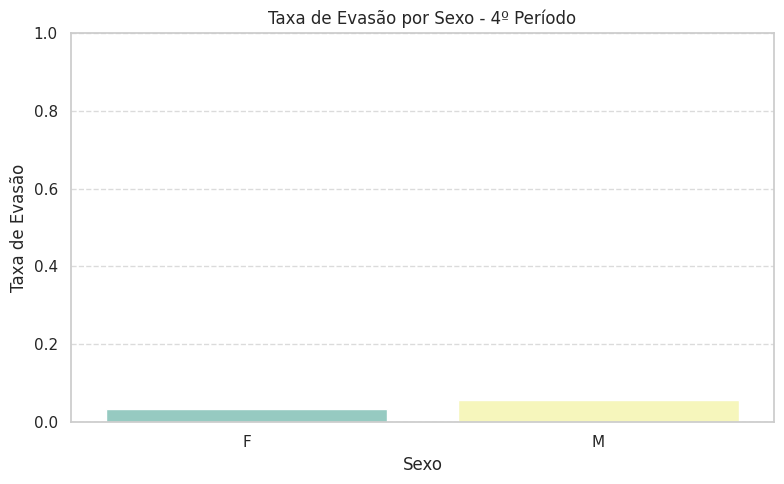

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              59   0.025866        0.050847
Divorciado           3   0.001315        0.000000
Nan                  7   0.003069        0.000000
Solteiro          2212   0.969750        0.053797

📊 Teste Qui-Quadrado entre 'estado_civil' e evasão:
- Valor de p: 0.9016
❌ Nenhuma associação significativa entre 'estado_civil' e evasão no 4º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


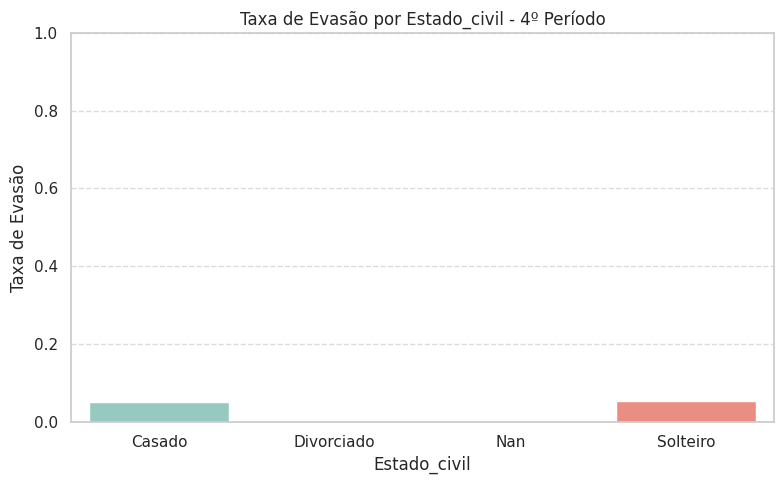


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         51   0.022359        0.098039
Branca        1158   0.507672        0.050086
Indígena         4   0.001754        0.000000
Nan             28   0.012275        0.142857
Parda          932   0.408593        0.052575
Preta          108   0.047348        0.055556

📊 Teste Qui-Quadrado entre 'cor' e evasão:
- Valor de p: 0.2257
❌ Nenhuma associação significativa entre 'cor' e evasão no 4º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


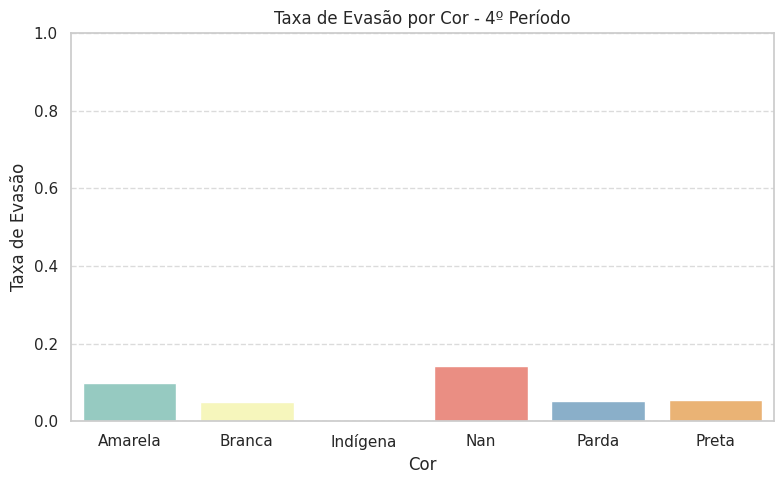

⚠️ Variável idade NÃO encontrada na tabela.

📘📘📘 TABELA: ALUNOS-FILTRADO-SEM-METRICAS 📘📘📘


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')



--- Análise das variáveis no 1º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          208   0.165605        0.129808
M         1048   0.834395        0.091603

📊 Teste Qui-Quadrado entre 'sexo' e evasão:
- Valor de p: 0.1174
❌ Nenhuma associação significativa entre 'sexo' e evasão no 1º período.


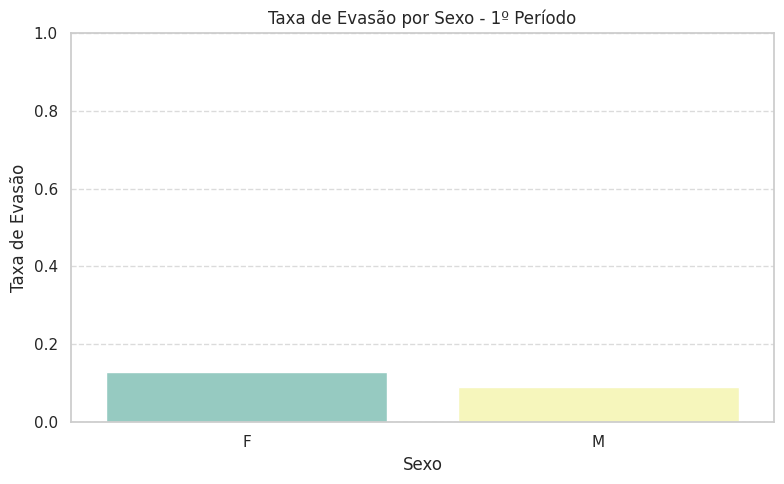

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              41   0.032643        0.243902
Divorciado           2   0.001592        0.000000
Nan                  4   0.003185        0.750000
Solteiro          1208   0.961783        0.091060
Viúvo                1   0.000796        0.000000

📊 Teste Qui-Quadrado entre 'estado_civil' e evasão:
- Valor de p: 0.0000
✅ Associação significativa entre 'estado_civil' e evasão no 1º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


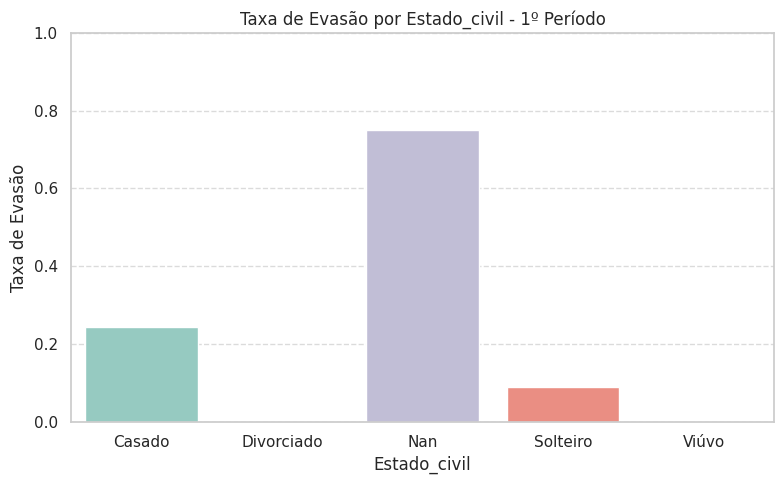


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.028662        0.194444
Branca         688   0.547771        0.072674
Indígena         4   0.003185        0.000000
Nan             24   0.019108        0.291667
Parda          444   0.353503        0.105856
Preta           60   0.047771        0.200000

📊 Teste Qui-Quadrado entre 'cor' e evasão:
- Valor de p: 0.0001
✅ Associação significativa entre 'cor' e evasão no 1º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


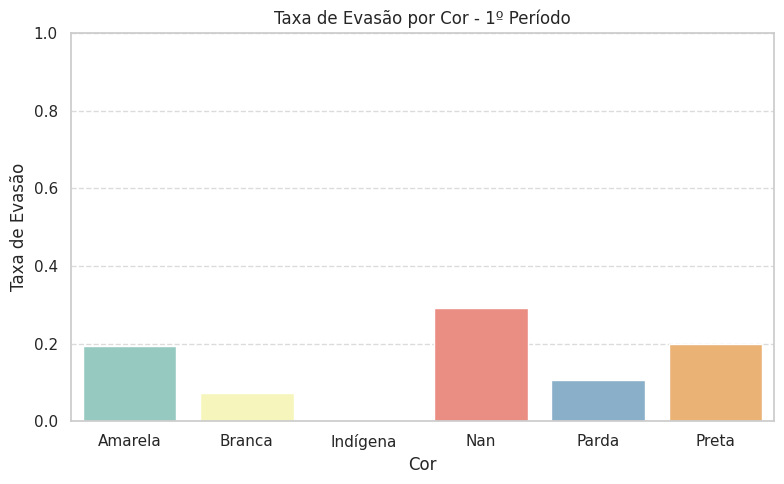


📘 Idade - Média: 30.30, Desvio Padrão: 5.41


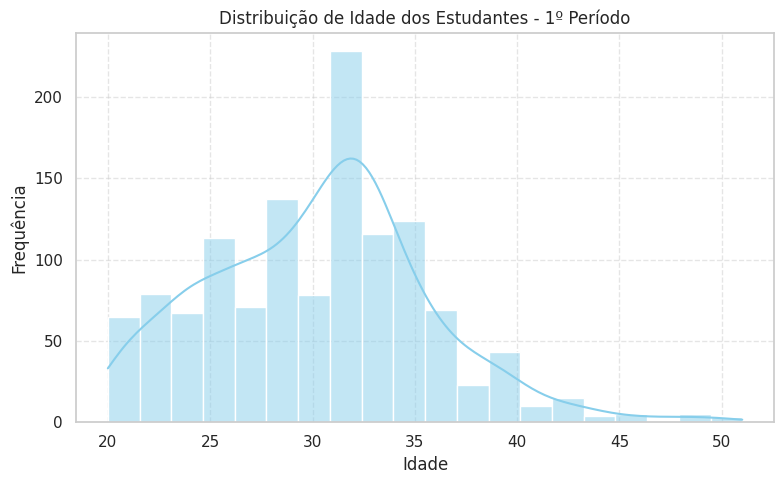

/tmp/ipykernel_1516507/810047795.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


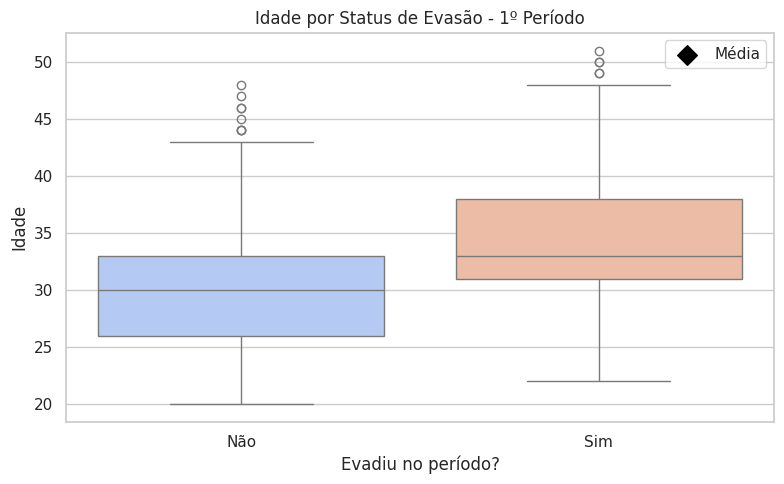


--- Análise das variáveis no 2º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          208   0.165605        0.086538
M         1048   0.834395        0.078244

📊 Teste Qui-Quadrado entre 'sexo' e evasão:
- Valor de p: 0.7922
❌ Nenhuma associação significativa entre 'sexo' e evasão no 2º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


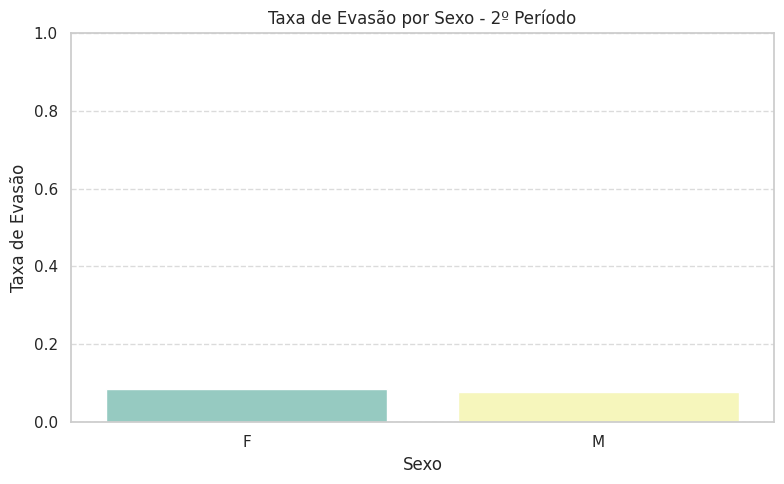

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              41   0.032643        0.146341
Divorciado           2   0.001592        0.000000
Nan                  4   0.003185        0.000000
Solteiro          1208   0.961783        0.077815
Viúvo                1   0.000796        0.000000

📊 Teste Qui-Quadrado entre 'estado_civil' e evasão:
- Valor de p: 0.5330
❌ Nenhuma associação significativa entre 'estado_civil' e evasão no 2º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


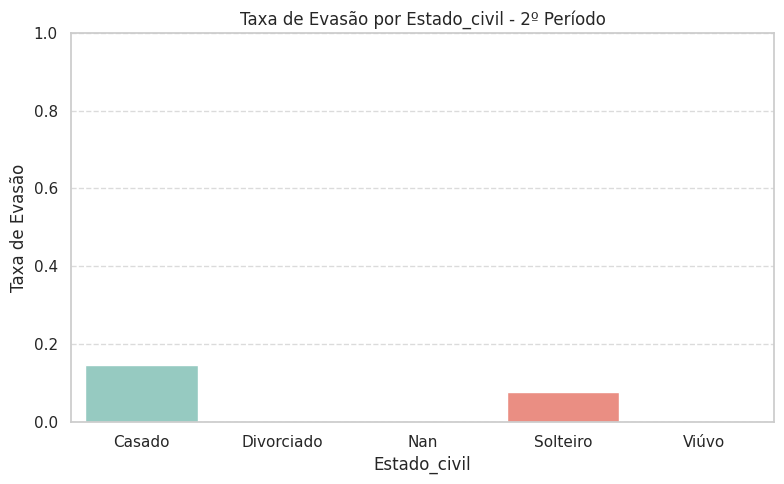


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.028662        0.000000
Branca         688   0.547771        0.063953
Indígena         4   0.003185        0.000000
Nan             24   0.019108        0.125000
Parda          444   0.353503        0.094595
Preta           60   0.047771        0.183333

📊 Teste Qui-Quadrado entre 'cor' e evasão:
- Valor de p: 0.0053
✅ Associação significativa entre 'cor' e evasão no 2º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


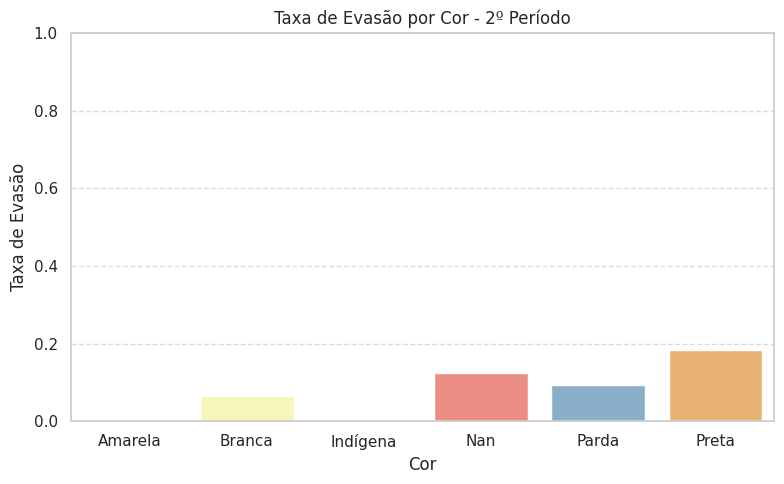


📘 Idade - Média: 30.30, Desvio Padrão: 5.41


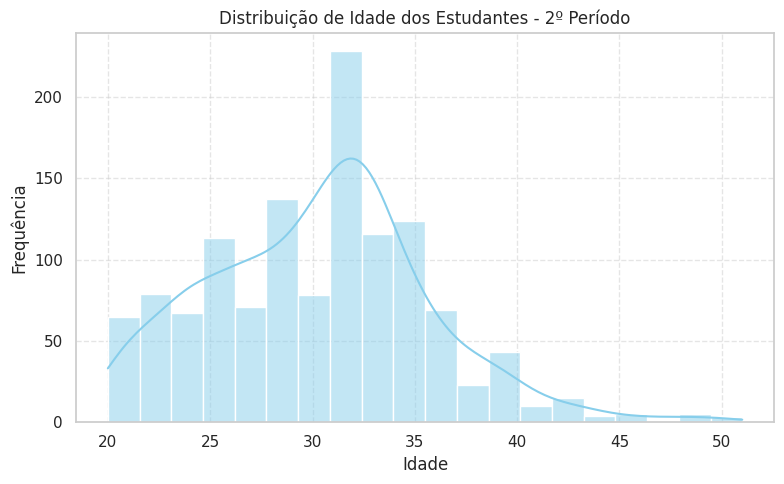

/tmp/ipykernel_1516507/810047795.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


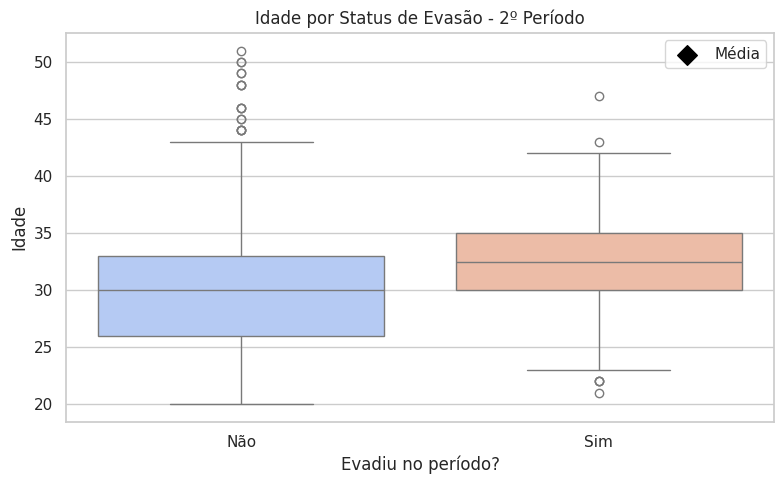


--- Análise das variáveis no 3º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          208   0.165605        0.048077
M         1048   0.834395        0.075382

📊 Teste Qui-Quadrado entre 'sexo' e evasão:
- Valor de p: 0.2098
❌ Nenhuma associação significativa entre 'sexo' e evasão no 3º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


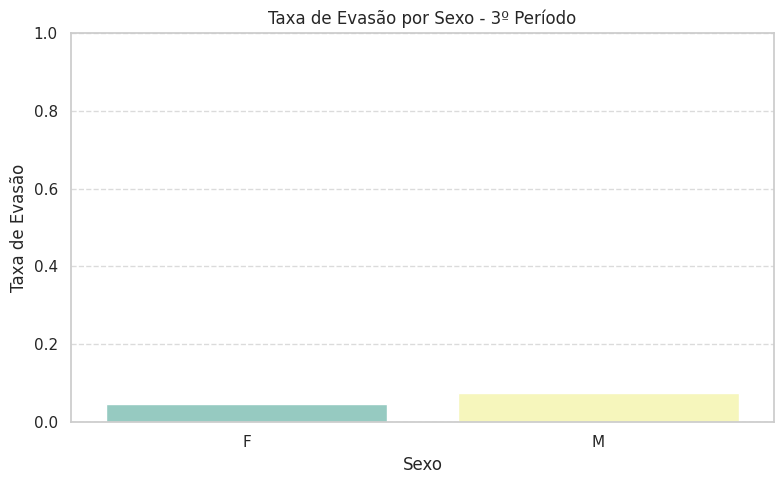

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              41   0.032643        0.048780
Divorciado           2   0.001592        1.000000
Nan                  4   0.003185        0.000000
Solteiro          1208   0.961783        0.070364
Viúvo                1   0.000796        0.000000

📊 Teste Qui-Quadrado entre 'estado_civil' e evasão:
- Valor de p: 0.0000
✅ Associação significativa entre 'estado_civil' e evasão no 3º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


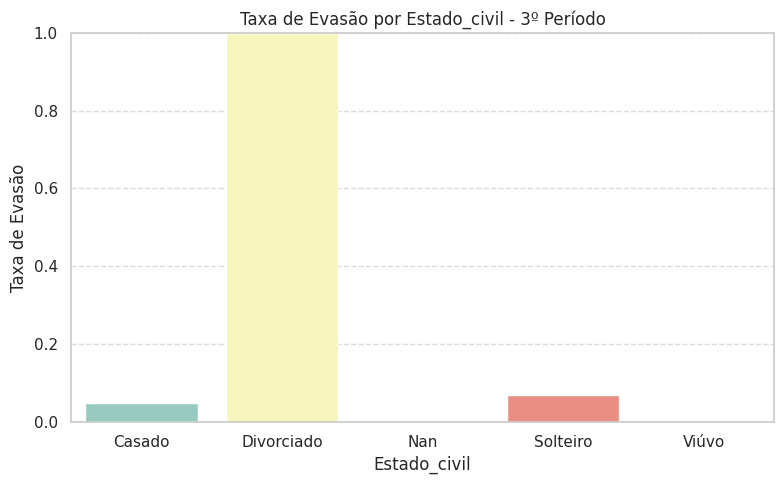


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.028662        0.166667
Branca         688   0.547771        0.065407
Indígena         4   0.003185        0.250000
Nan             24   0.019108        0.166667
Parda          444   0.353503        0.065315
Preta           60   0.047771        0.066667

📊 Teste Qui-Quadrado entre 'cor' e evasão:
- Valor de p: 0.0545
❌ Nenhuma associação significativa entre 'cor' e evasão no 3º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


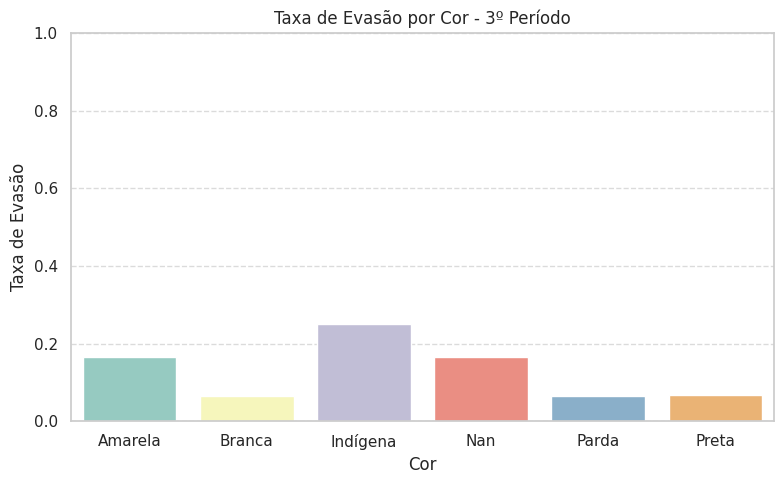


📘 Idade - Média: 30.30, Desvio Padrão: 5.41


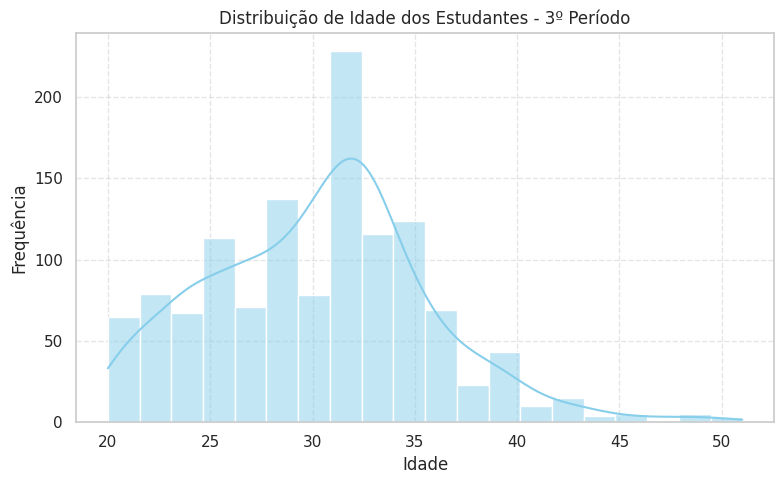

/tmp/ipykernel_1516507/810047795.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


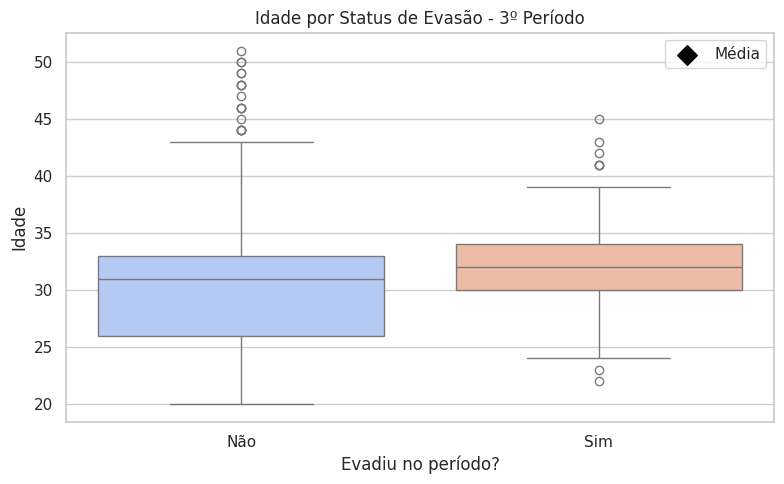


--- Análise das variáveis no 4º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          208   0.165605        0.062500
M         1048   0.834395        0.094466

📊 Teste Qui-Quadrado entre 'sexo' e evasão:
- Valor de p: 0.1788
❌ Nenhuma associação significativa entre 'sexo' e evasão no 4º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


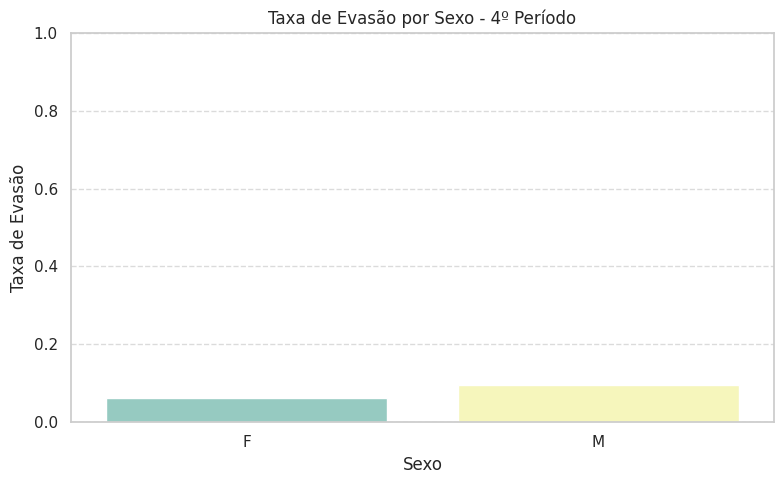

⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              41   0.032643         0.04878
Divorciado           2   0.001592         0.00000
Nan                  4   0.003185         0.00000
Solteiro          1208   0.961783         0.09106
Viúvo                1   0.000796         0.00000

📊 Teste Qui-Quadrado entre 'estado_civil' e evasão:
- Valor de p: 0.8156
❌ Nenhuma associação significativa entre 'estado_civil' e evasão no 4º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


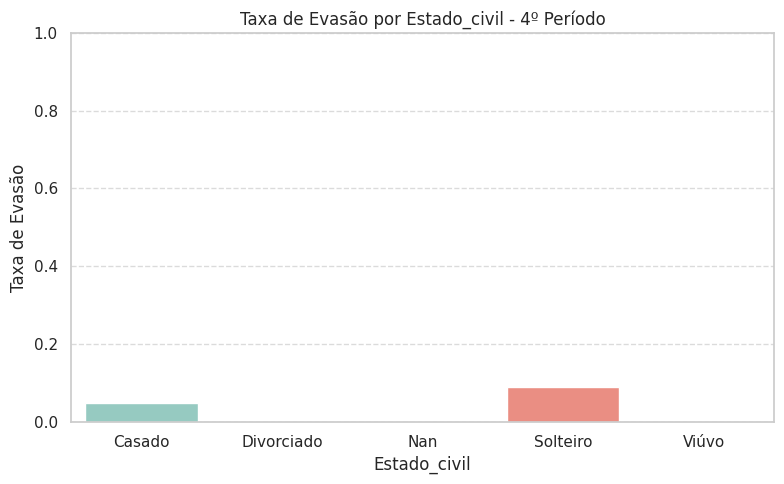


🟨 Tabela - Cor:
          Contagem  Proporção  Taxa de Evasão
cor                                          
Amarela         36   0.028662        0.111111
Branca         688   0.547771        0.091570
Indígena         4   0.003185        0.000000
Nan             24   0.019108        0.166667
Parda          444   0.353503        0.083333
Preta           60   0.047771        0.066667

📊 Teste Qui-Quadrado entre 'cor' e evasão:
- Valor de p: 0.7017
❌ Nenhuma associação significativa entre 'cor' e evasão no 4º período.


/tmp/ipykernel_1516507/810047795.py:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')


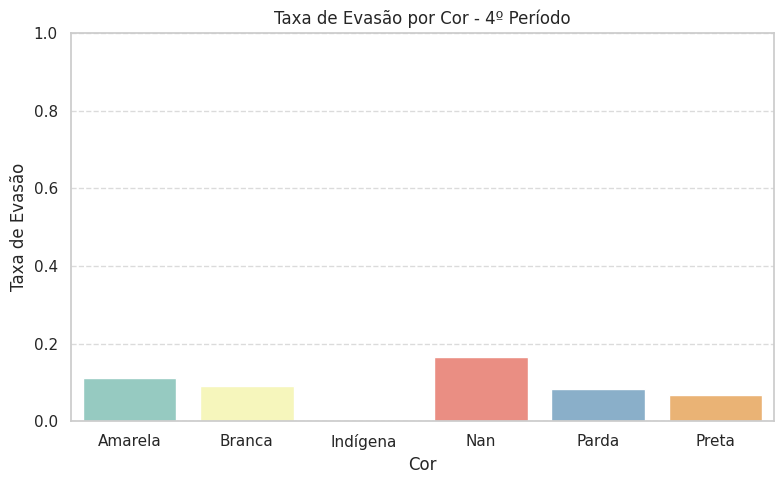


📘 Idade - Média: 30.30, Desvio Padrão: 5.41


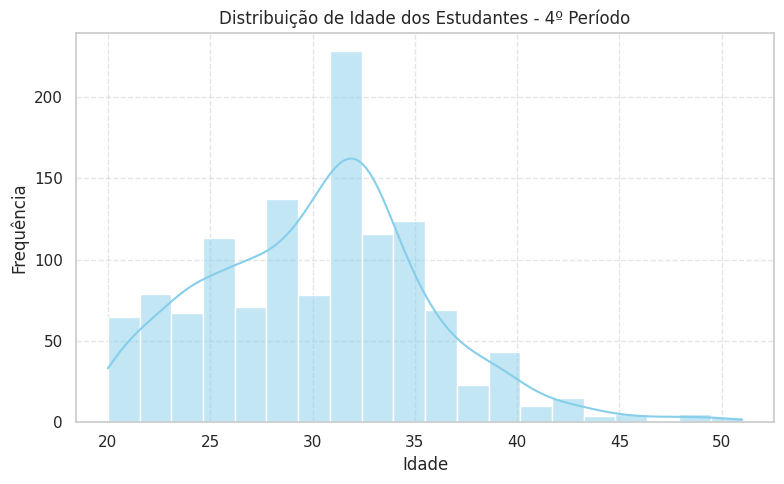

/tmp/ipykernel_1516507/810047795.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')


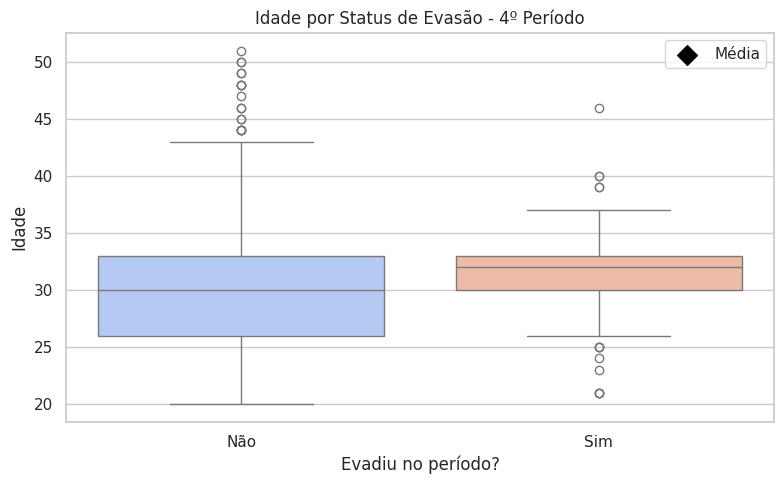

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import chi2_contingency

def analisar_variaveis_com_graficos(df, n_periodo=1):
    df = df.copy()

    # 🔹 Garantir que os campos de período estão como string
    df['periodo_de_ingresso'] = df['periodo_de_ingresso'].astype(str).fillna('')
    df['periodo_de_evasao'] = df['periodo_de_evasao'].astype(str).fillna('')

    # 🔹 Calcular o período esperado de evasão
    df['periodo_esperado_evasao'] = df['periodo_de_ingresso'].apply(
        lambda x: proximo_n_periodo(x, n_periodo)
    )

    # 🔹 Verificar evasão no período esperado
    evasao_col = f'evadiu_no_{n_periodo}o_periodo'
    df[evasao_col] = df.apply(
        lambda row: row['periodo_de_evasao'] == row['periodo_esperado_evasao'],
        axis=1
    )

    print(f"\n--- Análise das variáveis no {n_periodo}º período ---")

    # 🔹 Variáveis categóricas
    variaveis_categoricas = ['sexo', 'cota', 'estado_civil', 'cor']
    for var in variaveis_categoricas:
        if var in df.columns:
            contagem = df[var].value_counts()
            proporcao = df[var].value_counts(normalize=True)
            taxa_evasao = df.groupby(var)[evasao_col].mean()

            tabela = pd.DataFrame({
                'Contagem': contagem,
                'Proporção': proporcao,
                'Taxa de Evasão': taxa_evasao
            })

            print(f"\n🟨 Tabela - {var.capitalize()}:")
            print(tabela)

            # 🔸 Teste Qui-Quadrado
            contingencia = pd.crosstab(df[var], df[evasao_col])
            chi2, p, dof, expected = chi2_contingency(contingencia)

            print(f"\n📊 Teste Qui-Quadrado entre '{var}' e evasão:")
            print(f"- Valor de p: {p:.4f}")
            if p < 0.05:
                print(f"✅ Associação significativa entre '{var}' e evasão no {n_periodo}º período.")
            else:
                print(f"❌ Nenhuma associação significativa entre '{var}' e evasão no {n_periodo}º período.")

            # 🔸 Gráfico: Taxa de evasão por categoria
            plt.figure(figsize=(8, 5))
            sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')
            plt.title(f'Taxa de Evasão por {var.capitalize()} - {n_periodo}º Período')
            plt.ylabel('Taxa de Evasão')
            plt.xlabel(var.capitalize())
            plt.ylim(0, 1)
            plt.grid(axis='y', linestyle='--', alpha=0.7)
            plt.tight_layout()
            plt.show()
        else:
            print(f"⚠️ Variável {var} NÃO encontrada na tabela.")

    # 🔹 Variável numérica: idade
    if 'idade' in df.columns:
        media_idade = df['idade'].mean()
        desvio_idade = df['idade'].std()
        print(f"\n📘 Idade - Média: {media_idade:.2f}, Desvio Padrão: {desvio_idade:.2f}")

        # 🔸 Histograma
        plt.figure(figsize=(8, 5))
        sns.histplot(df['idade'], bins=20, kde=True, color='skyblue')
        plt.title(f'Distribuição de Idade dos Estudantes - {n_periodo}º Período')
        plt.xlabel('Idade')
        plt.ylabel('Frequência')
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()

        # 🔸 Boxplot com ponto da média
        plt.figure(figsize=(8, 5))

        # Converter valores booleanos para strings "Sim"/"Não"
        df[evasao_col + '_rotulo'] = df[evasao_col].map({True: 'Sim', False: 'Não'})

        sns.boxplot(x=evasao_col + '_rotulo', y='idade', data=df, palette='coolwarm')

        # Adicionando ponto da média
        medias = df.groupby(evasao_col + '_rotulo')['idade'].mean()
        for i, (label, media) in enumerate(medias.items()):
            plt.scatter(i, media, color='black', s=100, marker='D', label='Média' if i == 0 else "")

        plt.title(f'Idade por Status de Evasão - {n_periodo}º Período')
        plt.xlabel('Evadiu no período?')
        plt.ylabel('Idade')
        plt.legend()
        plt.tight_layout()
        plt.show()
    else:
        print("⚠️ Variável idade NÃO encontrada na tabela.")

# 🔁 Execução para múltiplas tabelas e períodos
for nome in tabelas_nomes:
    df = tabelas_tratadas_limpo[nome]
    print(f"\n📘📘📘 TABELA: {nome.upper()} 📘📘📘")
    
    for periodo in range(1, 5):
        analisar_variaveis_com_graficos(df, n_periodo=periodo)


Resultado do teste Qui-quadrado:
p-valor = 0.3678

Mensagem: Nenhuma associação significativa entre 'sexo' e evasão no 4º período.

O que isso significa?
Hipótese do teste:

H0 (hipótese nula): Não há associação entre o sexo do estudante e a evasão no 4º período — ou seja, o sexo não influencia na evasão.

H1 (hipótese alternativa): Existe associação entre o sexo e a evasão — ou seja, o sexo influencia a evasão.

Valor de p (p-valor):

O valor de p é a probabilidade de observar os dados que você tem (ou mais extremos), assumindo que a hipótese nula é verdadeira.

Se o p-valor for menor que 0.05 (nível de significância usual), rejeitamos a hipótese nula — ou seja, existe associação significativa.

Se o p-valor for maior que 0.05, não rejeitamos a hipótese nula — ou seja, não há evidência suficiente para afirmar que há associação.

No seu caso:

p-valor = 0.3678 > 0.05

Portanto, não há evidência estatística para afirmar que o sexo está associado à evasão no 4º período.

Em outras palavras, a evasão no 4º período parece ser independente do sexo do estudante, segundo seus dados.

Observações
Isso não quer dizer que o sexo nunca influencia a evasão, apenas que no seu conjunto de dados e nesse período específico, não foi detectada uma associação estatisticamente significativa.

Outras variáveis podem influenciar, e o teste só indica a relação estatística entre as variáveis testadas.

Testar para outros períodos e variáveis é importante para uma análise completa.

### Tabelas Cruzadas

In [50]:
def analisar_variaveis_com_graficos(df, n_periodo=1):
    import pandas as pd
    import seaborn as sns
    import matplotlib.pyplot as plt
    from scipy.stats import chi2_contingency

    def proximo_n_periodo(periodo_str, n):
        try:
            ano, semestre = int(periodo_str[:4]), int(periodo_str[4])
            for _ in range(n):
                if semestre == 1:
                    semestre = 2
                else:
                    semestre = 1
                    ano += 1
            return f"{ano}{semestre}"
        except:
            return ""

    df = df.copy()
    print("\n📄 Prévia dos dados:")
    print(df.head())

    for col in ['periodo_de_ingresso', 'periodo_de_evasao']:
        if col not in df.columns:
            print(f"⚠️ Coluna '{col}' não encontrada.")
            return

    df['periodo_de_ingresso'] = df['periodo_de_ingresso'].astype(str).fillna('')
    df['periodo_de_evasao'] = df['periodo_de_evasao'].astype(str).fillna('')
    df['periodo_esperado_evasao'] = df['periodo_de_ingresso'].apply(
        lambda x: proximo_n_periodo(x, n_periodo)
    )

    evasao_col = f'evadiu_no_{n_periodo}o_periodo'
    df[evasao_col] = df.apply(
        lambda row: row['periodo_de_evasao'] == row['periodo_esperado_evasao'],
        axis=1
    )

    print(f"\n--- 📊 Análise das variáveis no {n_periodo}º período ---")

    variaveis_categoricas = ['sexo', 'cota', 'estado_civil', 'cor']
    for var in variaveis_categoricas:
        if var in df.columns:
            contagem = df[var].value_counts()
            proporcao = df[var].value_counts(normalize=True)
            taxa_evasao = df.groupby(var)[evasao_col].mean()

            tabela = pd.DataFrame({
                'Contagem': contagem,
                'Proporção': proporcao,
                'Taxa de Evasão': taxa_evasao
            })

            print(f"\n🟨 Tabela - {var.capitalize()}:")
            print(tabela)

            # Tabela cruzada e teste qui-quadrado
            crosstab = pd.crosstab(df[var], df[evasao_col])
            print(f"\n📊 Tabela Cruzada: {var} × Evadiu no período?")
            print(crosstab)

            chi2, p, dof, expected = chi2_contingency(crosstab)
            print(f"🔬 Teste Qui-Quadrado entre '{var}' e evasão: p = {p:.4f}")
            if p < 0.05:
                print(f"✅ Associação significativa entre '{var}' e evasão no {n_periodo}º período.")
            else:
                print(f"❌ Nenhuma associação significativa.")

            # Gráfico
            plt.figure(figsize=(8, 5))
            sns.barplot(x=taxa_evasao.index.astype(str), y=taxa_evasao.values, palette='Set3')
            plt.title(f'Taxa de Evasão por {var.capitalize()} - {n_periodo}º Período')
            plt.ylabel('Taxa de Evasão')
            plt.xlabel(var.capitalize())
            plt.ylim(0, 1)
            plt.grid(axis='y', linestyle='--', alpha=0.7)
            plt.tight_layout()
            plt.show()
        else:
            print(f"⚠️ Variável {var} NÃO encontrada na tabela.")

    if 'idade' in df.columns:
        media_idade = df['idade'].mean()
        desvio_idade = df['idade'].std()
        print(f"\n📘 Idade - Média: {media_idade:.2f}, Desvio Padrão: {desvio_idade:.2f}")

        # Histograma
        plt.figure(figsize=(8, 5))
        sns.histplot(df['idade'], bins=20, kde=True, color='skyblue')
        plt.title(f'Distribuição de Idade - {n_periodo}º Período')
        plt.xlabel('Idade')
        plt.ylabel('Frequência')
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()

        # Boxplot com médias
        plt.figure(figsize=(8, 5))
        sns.boxplot(x=evasao_col, y='idade', data=df, palette='coolwarm')
        medias = df.groupby(evasao_col)['idade'].mean()
        for i, media in enumerate(medias):
            plt.scatter(i, media, color='black', s=100, marker='D', label='Média' if i == 0 else "")
        plt.title(f'Idade por Status de Evasão - {n_periodo}º Período')
        plt.xlabel('Evadiu?')
        plt.ylabel('Idade')
        plt.legend()
        plt.tight_layout()
        plt.show()
    else:
        print("⚠️ Variável 'idade' NÃO encontrada na tabela.")


In [54]:
def analisar_variaveis_com_graficos(df, n_periodo=1):
    import pandas as pd
    import seaborn as sns
    import matplotlib.pyplot as plt
    from scipy.stats import chi2_contingency

def analisar_variaveis_com_graficos(df, n_periodo=1):
    import pandas as pd
    from scipy.stats import chi2_contingency

    def proximo_n_periodo(periodo_str, n):
        try:
            ano, semestre = int(periodo_str[:4]), int(periodo_str[4])
            for _ in range(n):
                if semestre == 1:
                    semestre = 2
                else:
                    semestre = 1
                    ano += 1
            return f"{ano}{semestre}"
        except:
            return ""

    df = df.copy()

    for col in ['periodo_de_ingresso', 'periodo_de_evasao']:
        if col not in df.columns:
            print(f"⚠️ Coluna '{col}' não encontrada.")
            return

    df['periodo_de_ingresso'] = df['periodo_de_ingresso'].astype(str).fillna('')
    df['periodo_de_evasao'] = df['periodo_de_evasao'].astype(str).fillna('')
    df['periodo_esperado_evasao'] = df['periodo_de_ingresso'].apply(
        lambda x: proximo_n_periodo(x, n_periodo)
    )

    evasao_col = f'evadiu_no_{n_periodo}o_periodo'
    df[evasao_col] = df.apply(
        lambda row: row['periodo_de_evasao'] == row['periodo_esperado_evasao'],
        axis=1
    )

    print(f"\n--- 📊 Análise do {n_periodo}º período ---")

    variaveis_categoricas = ['sexo', 'cota', 'estado_civil', 'cor']
    for var in variaveis_categoricas:
        if var in df.columns:
            contagem = df[var].value_counts(dropna=False)
            proporcao = df[var].value_counts(normalize=True, dropna=False)
            taxa_evasao = df.groupby(var)[evasao_col].mean()

            tabela = pd.DataFrame({
                'Contagem': contagem,
                'Proporção': proporcao,
                'Taxa de Evasão': taxa_evasao
            })

            print(f"\n🟨 Tabela - {var.capitalize()}:")
            print(tabela)

            crosstab = pd.crosstab(df[var], df[evasao_col])
            print(f"\n📊 Tabela Cruzada: {var} × Evadiu no período?")
            print(crosstab)

            chi2, p, dof, expected = chi2_contingency(crosstab)
            print(f"🔬 Teste Qui-Quadrado entre '{var}' e evasão: p = {p:.4f}")
            if p < 0.05:
                print(f"✅ Associação significativa entre '{var}' e evasão no {n_periodo}º período.")
            else:
                print(f"❌ Nenhuma associação significativa.")
        else:
            print(f"⚠️ Variável {var} NÃO encontrada na tabela.")

    if 'idade' in df.columns:
        media_idade = df['idade'].mean()
        desvio_idade = df['idade'].std()
        print(f"\n📘 Idade - Média: {media_idade:.2f}, Desvio Padrão: {desvio_idade:.2f}")
    else:
        print("⚠️ Variável 'idade' NÃO encontrada na tabela.")



In [55]:
# 🔁 Execução para múltiplas tabelas e períodos
for nome in tabelas_nomes:
    df = tabelas_tratadas_limpo[nome]
    print(f"\n📘📘📘 TABELA: {nome.upper()} 📘📘📘")
    
    for periodo in range(1, 5):  # 1º ao 4º período
        analisar_variaveis_com_graficos(df, n_periodo=periodo)



📘📘📘 TABELA: ALUNOS-NOVOS-SEM-REINGRESSOS-NOVOS-OU-ANTIGOS-SEM-METRICAS 📘📘📘

--- 📊 Análise do 1º período ---

🟨 Tabela - Sexo:
      Contagem  Proporção  Taxa de Evasão
sexo                                     
F          399      0.175             0.0
M         1881      0.825             0.0

📊 Tabela Cruzada: sexo × Evadiu no período?
evadiu_no_1o_periodo  False
sexo                       
F                       399
M                      1881
🔬 Teste Qui-Quadrado entre 'sexo' e evasão: p = 1.0000
❌ Nenhuma associação significativa.
⚠️ Variável cota NÃO encontrada na tabela.

🟨 Tabela - Estado_civil:
              Contagem  Proporção  Taxa de Evasão
estado_civil                                     
Casado              58   0.025439             0.0
Divorciado           3   0.001316             0.0
Nan                  7   0.003070             0.0
Solteiro          2212   0.970175             0.0

📊 Tabela Cruzada: estado_civil × Evadiu no período?
evadiu_no_1o_periodo  False
estado_